## import library

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow import keras
from keras.layers import Dropout
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns

## define functions

In [2]:
import matplotlib.pyplot as plt

def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  # plt.ylim([0, 100])
  plt.xlabel('Epoch')
  plt.ylabel('loss')
#   plt.ylabel('Error(MSE:Trq)[]')
  plt.legend()
  plt.grid(True)

In [3]:
def plot_loss_10(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 10])
  plt.xlabel('Epoch')
  plt.ylabel('loss')
#   plt.ylabel('Error(MSE:Trq)[]')
  plt.legend()
  plt.grid(True)

In [4]:
def plot_loss_2(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 2])
  plt.xlabel('Epoch')
  plt.ylabel('loss')
#   plt.ylabel('Error(MSE:Trq)[]')
  plt.legend()
  plt.grid(True)

In [5]:
def get_MSE_MAPE(y3_test, y_pred, ud_pred, uq_pred, Tq_pred):
    MSE = mean_squared_error(y3_test, y_pred)
    MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
    MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
    MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
    MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
    MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
    MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)
    return MSE, MAPE, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq

In [6]:
def get_MSE_MAPE_2(y3_test, y_pred, ud_pred, uq_pred, Tq_pred):
#     MSE = mean_squared_error(y3_test, y_pred)
    MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
    MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
    MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
#     MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
    MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
    MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)
    print(MSE_ud, MSE_uq, MSE_Tq)
    print(MAPE_ud, MAPE_uq, MAPE_Tq)
#     return MSE, MAPE, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq
    return MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq

In [7]:
def get_MSE_MAPE_R(y3_test, y_pred, ud_pred, uq_pred, Tq_pred):
#     MSE = mean_squared_error(y3_test, y_pred)
    MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
    MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
    MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
#     MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
    MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
    MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)
    R2_ud = r2_score(y3_test['ud'], ud_pred)
    R2_uq = r2_score(y3_test['uq'], uq_pred)
    R2_Tq = r2_score(y3_test['Tq'], Tq_pred)
    print(MSE_ud, MSE_uq, MSE_Tq)
    print(MAPE_ud, MAPE_uq, MAPE_Tq)
    print(R2_ud, R2_uq, R2_Tq)
#     return MSE, MAPE, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq
    return MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq

In [8]:
def get_MSE_MAPE_R_1(y3_test, y_pred):
    MSE = mean_squared_error(y3_test, y_pred)
    MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    R2 = r2_score(y3_test, y_pred)
    return MSE, MAPE, R2

In [9]:
def get_output_list(y_pred_o3, y_pred_o3_list):
    ud_pred = []
    uq_pred = []
    Tq_pred = []
    for i in range(len(y_pred_o3)):
        a = y_pred_o3_list[i][0]
        b = y_pred_o3_list[i][1]
        c = y_pred_o3_list[i][2]
        ud_pred.append(a)
        uq_pred.append(b)
        Tq_pred.append(c)
    return ud_pred, uq_pred, Tq_pred

In [10]:
def get_errorList(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y3_test)):
        error = abs(y_pred_list[i] - y_test_list[i])/abs(y_test_list[i]) * 100
        errors.append(error)
    return errors

In [11]:
def get_errorList_t(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y3t_test)):
        error = abs(y_pred_list[i] - y_test_list[i])/abs(y_test_list[i]) * 100
        errors.append(error)
    return errors

In [12]:
def get_actual_errorList(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y3_test)):
        error = abs(y_pred_list[i] - y_test_list[i])
        errors.append(error)
    return errors

In [13]:
def get_actual_errorList_noabs(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y3_test)):
        error = y_pred_list[i] - y_test_list[i]
        errors.append(error)
    return errors

In [14]:
def get_actual_errorList_t(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y3t_test)):
        error = abs(y_pred_list[i] - y_test_list[i])
        errors.append(error)
    return errors

In [15]:
def plot_error(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 100])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)

In [16]:
def plot_error_40(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 40])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)

In [17]:
def plot_error_20(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 20])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)

# connect google drive

In [18]:
from google.colab import drive

In [19]:
drive.mount('/content/drive')

Mounted at /content/drive


# read CSV

In [20]:
df = pd.read_csv('drive/My Drive/Jupyter/data/EM2_2021_06_29_115550_30deg.csv', delimiter=';')

In [21]:
df2 = pd.read_csv('drive/My Drive/Jupyter/data/MFD_EM2_2021_06_30_005950_60deg.csv', delimiter=';')

In [22]:
df3 = pd.read_excel('drive/My Drive/Jupyter/data/EM2_2021_06_29_0630.xlsx')

In [23]:
df4 = pd.read_excel('drive/My Drive/Jupyter/data/EM2_2021_0629_0630_0701.xlsx')

In [24]:
df_l1= pd.read_csv('drive/My Drive/Jupyter/data/Loss_30deg_60deg_EM2.csv', delimiter=';')

In [25]:
df_l= pd.read_excel('drive/My Drive/Jupyter/data/test.xlsx')

In [26]:
df_t= pd.read_excel('drive/My Drive/Jupyter/data/MFD_EM2_2021_0630_813data.xlsx')

In [27]:
df_l

,Id,Iq,Udc,Speed,Trot,Twin,Rs,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,P_el,Tdiff,Tdiff_abs,Unnamed: 21,Pdiff
0,-277.929566,-373.323758,449.978683,0,31.967909,23,0.009105,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0


In [28]:
df4.head()

,Id,Iq,Trot,Rs,ud,uq,Tq
0,-839.237453,-257.497870,29.136269,0.009859,22.591244,-17.483726,-284.895837
1,-0.678702,259.035608,29.128912,0.010074,-33.372309,32.115860,111.771427
2,-308.465547,-349.612704,30.822357,0.009679,38.457316,10.991732,-247.857954
3,0.519034,-259.264124,30.841391,0.009715,32.777868,28.642396,-113.529079
4,-10.578677,239.038266,30.731588,0.009679,-31.575884,31.377611,105.743542


In [29]:
df_t.head()

,Id,Iq,Trot,Rs,ud,uq,Tq
0,-461.023505,-648.950399,90.349670,0.012553,53.053412,-1.333772,-418.799169
1,-662.196234,637.093382,89.684921,0.012625,-61.941776,0.211890,481.191468
2,-309.448099,150.061714,89.447098,0.012805,-23.261879,11.829441,113.310449
3,0.387045,859.482083,89.058304,0.012625,-61.293952,31.287478,290.973542
4,-9.581471,889.437245,89.872894,0.012302,-62.078947,30.717709,301.225714


In [30]:
# df = pd.read_csv('data/EM2_2021_06_29_115550.csv', delimiter=';')

In [31]:
def remove_any_zero_row(df):
    """一つでも0の行を削除"""
    df = df.copy()
    for row in df.index:
        if (df.loc[row] == 0).any():
            df.drop(row, axis=0, inplace=True)
    return df

print('before')
print(df4.shape)
df = remove_any_zero_row(df4)
print('after')
print(df4.shape)

before
(7880, 7)
after
(7880, 7)


In [32]:
print('before')
print(df_l1.shape)
df = remove_any_zero_row(df4)
print('after')
print(df_l1.shape)

before
(5150, 10)
after
(5150, 10)


In [33]:
df.head()

,Id,Iq,Trot,Rs,ud,uq,Tq
0,-839.237453,-257.497870,29.136269,0.009859,22.591244,-17.483726,-284.895837
1,-0.678702,259.035608,29.128912,0.010074,-33.372309,32.115860,111.771427
2,-308.465547,-349.612704,30.822357,0.009679,38.457316,10.991732,-247.857954
3,0.519034,-259.264124,30.841391,0.009715,32.777868,28.642396,-113.529079
4,-10.578677,239.038266,30.731588,0.009679,-31.575884,31.377611,105.743542


In [34]:
df.shape

(7880, 7)

In [35]:
df.describe()

,Id,Iq,Trot,Rs,ud,uq,Tq
count,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000
mean,-255.894938,-0.557465,57.616313,0.011461,-2.193504,14.598301,-0.912187
std,289.429965,498.576328,23.703101,0.000827,43.365104,15.563623,264.258582
min,-917.399445,-916.116333,29.026703,0.009571,-66.109390,-22.318795,-499.131239
25%,-462.038789,-378.955650,30.590603,0.010649,-44.390481,2.988553,-224.416004
50%,-157.296452,-0.118420,59.803579,0.011583,-2.104467,18.504812,-0.274521
75%,-1.767649,378.946739,89.268812,0.012158,39.578817,28.499344,221.337228
max,13.984429,915.097819,90.997986,0.013236,62.175572,32.932330,497.773130


In [36]:
df.isnull().sum()

Id      0
Iq      0
Trot    0
Rs      0
ud      0
uq      0
Tq      0
dtype: int64

In [37]:
df4.shape

(7880, 7)

In [38]:
df.shape

(7880, 7)

### Tq output Data preparation

In [39]:
ytq=df4['Tq']
Xtq=df4.drop(['Tq', 'ud', 'uq'], axis=1)

In [40]:
ytq.head()

0   -284.895837
1    111.771427
2   -247.857954
3   -113.529079
4    105.743542
Name: Tq, dtype: float64

In [41]:
Xtq_norm = (Xtq-Xtq.mean())/Xtq.std()
Xtq_norm.head()

,Id,Iq,Trot,Rs
0,-2.015488,-0.515348,-1.201532,-1.938241
1,0.881789,0.520669,-1.201843,-1.677486
2,-0.181635,-0.700104,-1.130399,-2.155537
3,0.885928,-0.518891,-1.129596,-2.112078
4,0.847584,0.480560,-1.134228,-2.155537


In [42]:
Xtq_train, Xtq_test, ytq_train, ytq_test = train_test_split(Xtq, ytq, test_size=0.2, random_state=42)
ytq_test_list = ytq_test.tolist()

In [43]:
Xtqn_train, Xtqn_test, ytqn_train, ytqn_test = train_test_split(Xtq_norm, ytq, test_size=0.2, random_state=42)
ytqn_test_list = ytqn_test.tolist()

In [44]:
Xtq_train

,Id,Iq,Trot,Rs
7761,-385.690999,-297.857437,89.885605,0.012661
196,-9.581170,-159.314514,29.235880,0.010182
5804,-0.009076,-0.119004,89.086212,0.012194
3527,12.438725,-639.905893,59.640274,0.011583
415,-428.115585,811.330177,30.545559,0.010613
...,...,...,...,...
5226,-460.456164,147.839171,60.677303,0.012122
5390,-886.598658,-151.260553,59.936939,0.011583
860,-6.381390,-868.887668,29.192137,0.010362
7603,0.244099,79.292722,89.033676,0.012122


In [45]:
Xtq2_train, Xtq2_test, ytq2_train, ytq2_test = train_test_split(Xtq, ytq, test_size=0.4, random_state=42)
Xtq2_, Xtq2_test, ytq2_, ytq2_test = train_test_split(Xtq2_test, ytq2_test, test_size=0.5, random_state=42)
ytq2_test_list = ytq2_test.tolist()

#Data processing

## (30deg) 3 output data preparation

In [46]:
y3=df.drop(['Iq', 'Id', 'Trot', 'Rs'], axis=1)
X3=df.drop(['Tq', 'ud', 'uq'], axis=1)

In [47]:
X3.head()

,Id,Iq,Trot,Rs
0,-839.237453,-257.497870,29.136269,0.009859
1,-0.678702,259.035608,29.128912,0.010074
2,-308.465547,-349.612704,30.822357,0.009679
3,0.519034,-259.264124,30.841391,0.009715
4,-10.578677,239.038266,30.731588,0.009679


In [48]:
y3.head()

,ud,uq,Tq
0,22.591244,-17.483726,-284.895837
1,-33.372309,32.115860,111.771427
2,38.457316,10.991732,-247.857954
3,32.777868,28.642396,-113.529079
4,-31.575884,31.377611,105.743542


In [49]:
X3_norm = (X3-X3.mean())/X3.std()
X3_norm.head()

,Id,Iq,Trot,Rs
0,-2.015488,-0.515348,-1.201532,-1.938241
1,0.881789,0.520669,-1.201843,-1.677486
2,-0.181635,-0.700104,-1.130399,-2.155537
3,0.885928,-0.518891,-1.129596,-2.112078
4,0.847584,0.480560,-1.134228,-2.155537


In [50]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3_norm, y3, test_size=0.2, random_state=42)

In [51]:
ud_test_list = y3_test['ud'].tolist()
uq_test_list = y3_test['uq'].tolist()
Tq_test_list = y3_test['Tq'].tolist()

### PCA

In [ ]:
pca = PCA()
pca.fit(X3_norm)
feature = pca.transform(X3_norm)

In [ ]:
pca.explained_variance_ratio_

array([0.49296017, 0.25005503, 0.24223882, 0.01474598])

In [ ]:
np.cumsum(pca.explained_variance_ratio_)

array([0.49296017, 0.7430152 , 0.98525402, 1.        ])

Text(0, 0.5, 'cumulative explained variance')

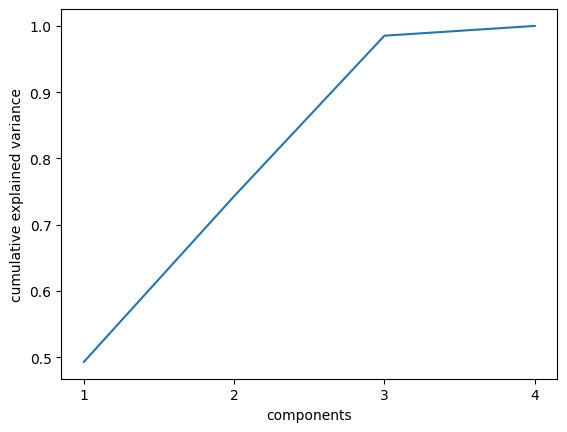

In [ ]:
n_components = 4
plt.plot(range(1, n_components+1), np.cumsum(pca.explained_variance_ratio_))
plt.xticks(range(1, n_components+1))
plt.xlabel('components')
plt.xlabel('components')
plt.ylabel('cumulative explained variance')

In [ ]:
pd.DataFrame(feature, columns=["PC{}".format(x + 1) for x in range(len(X3_norm.columns))]).head()

,PC1,PC2,PC3,PC4
0,-2.540793,0.368413,1.627480,-0.536827
1,-1.847564,-0.419227,-1.269174,-0.327089
2,-2.321171,0.710329,-0.175085,-0.724033
3,-2.102392,0.620378,-1.231916,-0.684424
4,-2.139127,-0.378194,-1.286449,-0.712955


In [ ]:
pd.DataFrame(pca.explained_variance_ratio_, index=["PC{}".format(x + 1) for x in range(len(X3_norm.columns))])

,0
PC1,0.492960
PC2,0.250055
PC3,0.242239
PC4,0.014746


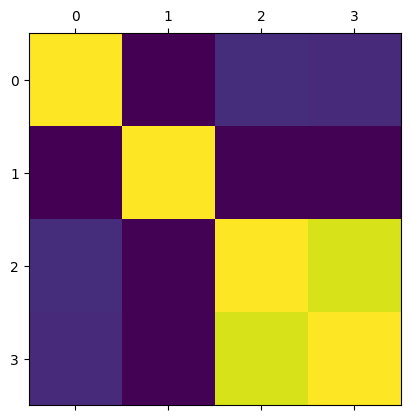

In [ ]:
plt.matshow(X3_norm.corr())
plt.show()

### correlation

In [ ]:
corr = X3_norm.corr()
corr.style.background_gradient(cmap='coolwarm')

,Id,Iq,Trot,Rs
Id,1.000000,-0.002041,0.128400,0.116619
Iq,-0.002041,1.000000,0.002147,0.003189
Trot,0.128400,0.002147,1.000000,0.940941
Rs,0.116619,0.003189,0.940941,1.000000


In [ ]:
corr

,Id,Iq,Trot,Rs
Id,1.000000,-0.002041,0.128400,0.116619
Iq,-0.002041,1.000000,0.002147,0.003189
Trot,0.128400,0.002147,1.000000,0.940941
Rs,0.116619,0.003189,0.940941,1.000000


In [ ]:
corr.index

Index(['Id', 'Iq', 'Trot', 'Rs'], dtype='object')

In [ ]:
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

<ipython-input-62-1353b105095d>:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm').set_precision(3)


,Id,Iq,Trot,Rs
Id,1.000,-0.002,0.128,0.117
Iq,-0.002,1.000,0.002,0.003
Trot,0.128,0.002,1.000,0.941
Rs,0.117,0.003,0.941,1.000


In [ ]:
corr.style.background_gradient(cmap='coolwarm', axis=None)

,Id,Iq,Trot,Rs
Id,1.000000,-0.002041,0.128400,0.116619
Iq,-0.002041,1.000000,0.002147,0.003189
Trot,0.128400,0.002147,1.000000,0.940941
Rs,0.116619,0.003189,0.940941,1.000000


In [ ]:
# Fill diagonal and upper half with NaNs
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(color='#f1f1f1')  # Color NaNs grey
 .format(precision=3))

,Id,Iq,Trot,Rs
Id,nan,nan,nan,nan
Iq,-0.002,nan,nan,nan
Trot,0.128,0.002,nan,nan
Rs,0.117,0.003,0.941,nan


In [ ]:
# pd.scatter_matrix(X3_norm, alpha = 0.3, figsize = (14,8), diagonal = 'kde');

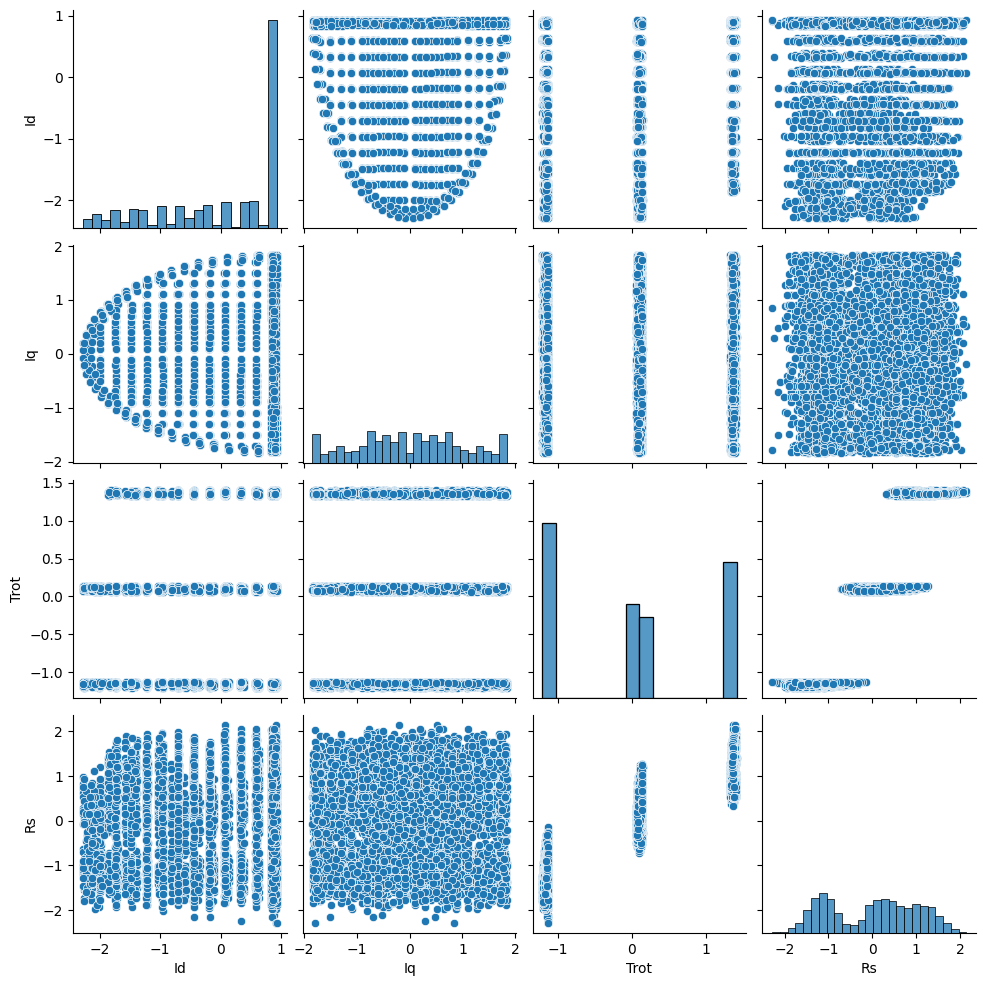

In [ ]:
import seaborn as sns
sns.pairplot(X3_norm)

<Axes: >

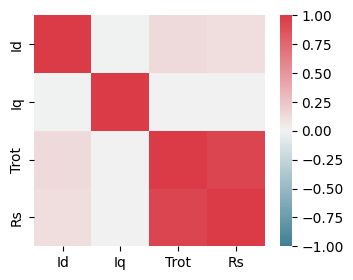

In [ ]:
f, ax = plt.subplots(figsize=(4, 3))
corr = X3_norm.corr()
sns.heatmap(corr,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1.0, vmax=1.0,
    square=True, ax=ax)

<Axes: >

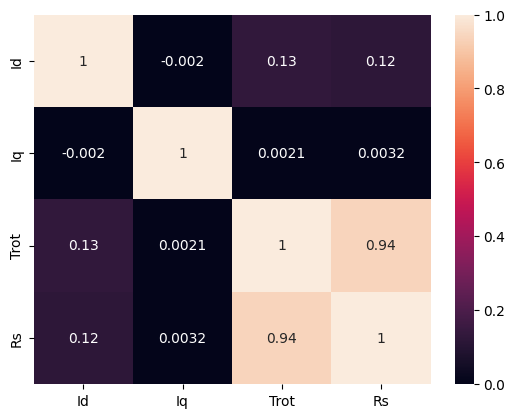

In [ ]:
sns.heatmap(X3_norm[corr.index].corr(),annot=True)

###x_raw X3r

In [ ]:
X3r_train, X3r_test, y3r_train, y3r_test = train_test_split(X3, y3, test_size=0.2, random_state=42)
udr_test_list = y3r_test['ud'].tolist()
uqr_test_list = y3r_test['uq'].tolist()
Tqr_test_list = y3r_test['Tq'].tolist()

In [ ]:
Tq_test_list[0:5]

[120.229589431763,
 311.438040039063,
 -15.6262348155975,
 -365.151725830078,
 -166.003556060791]

In [ ]:
n_outputs = y3.shape[1]
n_inputs = X3.shape[1]
n_outputs

3

## 60 degC data preparation

In [ ]:
y3_2=df2.drop(['iq', 'id', 'Temp', 'Rs'], axis=1)
X3_2=df2.drop(['Tq', 'ud', 'uq'], axis=1)
X3_2_norm = (X3_2-X3_2.mean())/X3_2.std()
X3_2_norm.head()
X3_2_train, X3_2_test, y3_2_train, y3_2_test = train_test_split(X3_2_norm, y3_2, test_size=0.2, random_state=42)
ud_2_test_list = y3_2_test['ud'].tolist()
uq_2_test_list = y3_2_test['uq'].tolist()
Tq_2_test_list = y3_2_test['Tq'].tolist()

## 30degC+60degC

In [ ]:
df3.head()

,id,iq,Temp,Rs,ud,uq,Tq
0,-839.237453,-257.497870,29.136269,0.009859,22.591244,-17.483726,-284.895837
1,-0.678702,259.035608,29.128912,0.010074,-33.372309,32.115860,111.771427
2,-308.465547,-349.612704,30.822357,0.009679,38.457316,10.991732,-247.857954
3,0.519034,-259.264124,30.841391,0.009715,32.777868,28.642396,-113.529079
4,-10.578677,239.038266,30.731588,0.009679,-31.575884,31.377611,105.743542


In [ ]:
y3_3=df3.drop(['iq', 'id', 'Temp', 'Rs'], axis=1)
X3_3=df3.drop(['Tq', 'ud', 'uq'], axis=1)
X3_3_norm = (X3_3-X3_3.mean())/X3_3.std()
X3_3_train, X3_3_test, y3_3_train, y3_3_test = train_test_split(X3_3_norm, y3_3, test_size=0.2, random_state=42)
ud_3_test_list = y3_3_test['ud'].tolist()
uq_3_test_list = y3_3_test['uq'].tolist()
Tq_3_test_list = y3_3_test['Tq'].tolist()
X3_3_norm.head()

,id,iq,Temp,Rs
0,-1.844139,-0.515506,-1.075748,-1.912980
1,0.937192,0.523528,-1.076243,-1.576253
2,-0.083675,-0.700800,-0.962315,-2.193585
3,0.941165,-0.519059,-0.961035,-2.137464
4,0.904356,0.483303,-0.968422,-2.193585


In [ ]:
y3_3.tail()

,ud,uq,Tq
5674,-61.733862,30.763688,306.100532
5675,13.883457,-6.684708,-152.652024
5676,0.825361,-10.292362,-55.129693
5677,-61.564383,31.260137,302.222039
5678,4.316881,10.769488,-38.672663


## 30+60+90deg

In [52]:
y3_4=df4.drop(['Iq', 'Id', 'Trot', 'Rs'], axis=1)
X3_4=df4.drop(['Tq', 'ud', 'uq'], axis=1)
X3_4_norm = (X3_4-X3_4.mean())/X3_4.std()
X3_4_norm.head()
X3_4_train, X3_4_test, y3_4_train, y3_4_test = train_test_split(X3_4_norm, y3_4, test_size=0.2, random_state=42)
ud_4_test_list = y3_4_test['ud'].tolist()
uq_4_test_list = y3_4_test['uq'].tolist()
Tq_4_test_list = y3_4_test['Tq'].tolist()

In [53]:
df4.describe()

,Id,Iq,Trot,Rs,ud,uq,Tq
count,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000,7880.000000
mean,-255.894938,-0.557465,57.616313,0.011461,-2.193504,14.598301,-0.912187
std,289.429965,498.576328,23.703101,0.000827,43.365104,15.563623,264.258582
min,-917.399445,-916.116333,29.026703,0.009571,-66.109390,-22.318795,-499.131239
25%,-462.038789,-378.955650,30.590603,0.010649,-44.390481,2.988553,-224.416004
50%,-157.296452,-0.118420,59.803579,0.011583,-2.104467,18.504812,-0.274521
75%,-1.767649,378.946739,89.268812,0.012158,39.578817,28.499344,221.337228
max,13.984429,915.097819,90.997986,0.013236,62.175572,32.932330,497.773130


In [54]:
# sc = StandardScaler()
# sc.fit(X3_4)
# sc.transform(X3_4)
# pickle.dump(sc, open("drive/My Drive/Jupyter/scaler/scaler.p", "wb"))

In [55]:
# X34n=sc.transform(X3_4)
# X34n

In [56]:
X3_4_norm

,Id,Iq,Trot,Rs
0,-2.015488,-0.515348,-1.201532,-1.938241
1,0.881789,0.520669,-1.201843,-1.677486
2,-0.181635,-0.700104,-1.130399,-2.155537
3,0.885928,-0.518891,-1.129596,-2.112078
4,0.847584,0.480560,-1.134228,-2.155537
...,...,...,...,...
7875,0.592817,0.201288,1.355685,1.408120
7876,-1.033855,-1.416481,1.353601,1.234283
7877,0.879714,-0.679646,1.353965,1.451579
7878,-0.176935,1.506395,1.352265,1.321202


<Axes: >

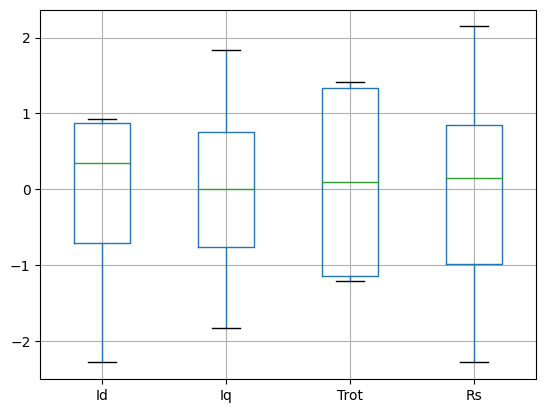

In [57]:
X3_4_norm.boxplot()

<Axes: >

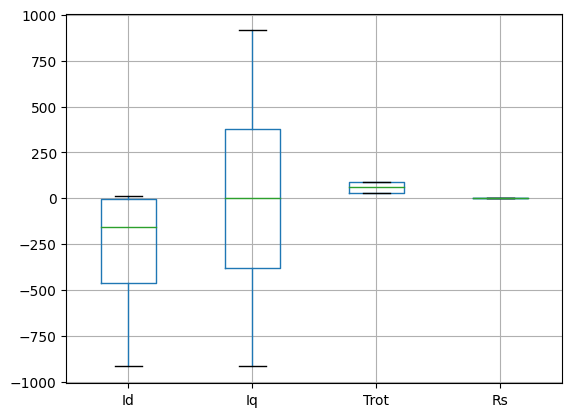

In [58]:
X3_4.boxplot()

<Axes: >

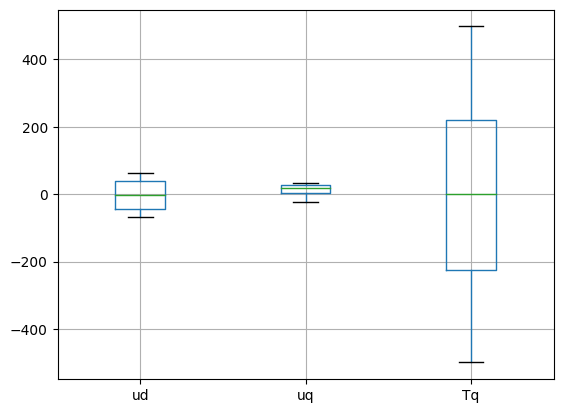

In [59]:
y3_4.boxplot()

###x_raw

In [60]:
# y3_4=df4.drop(['iq', 'id', 'Temp', 'Rs'], axis=1)
# X3_4=df4.drop(['Tq', 'ud', 'uq'], axis=1)
# X3_4_norm = (X3_4-X3_4.mean())/X3_4.std()
# X3_4_norm.head()
X3_4r_train, X3_4r_test, y3_4r_train, y3_4r_test = train_test_split(X3_4, y3_4, test_size=0.2, random_state=42)
ud_4_test_list = y3_4_test['ud'].tolist()
uq_4_test_list = y3_4_test['uq'].tolist()
Tq_4_test_list = y3_4_test['Tq'].tolist()

#### y_norm

In [61]:
y3_4norm = (y3-y3.mean())/y3.std()
ud_4n_test_list = y3_4_test['ud'].tolist()
uq_4n_test_list = y3_4_test['uq'].tolist()
Tq_4n_test_list = y3_4_test['Tq'].tolist()
ud_4=y3_4['ud']
uq_4=y3_4['uq']
Tq_4=y3_4['Tq']
ud_4_norm = (ud_4-ud_4.mean())/ud_4.std()
X3_4rn_train, X3_4rn_test, y3_4rn_train, y3_4rn_test = train_test_split(X3_4, y3_4norm, test_size=0.2, random_state=42)
ud_4n_test_list = y3_4rn_test['ud'].tolist()
uq_4n_test_list = y3_4rn_test['uq'].tolist()
Tq_4n_test_list = y3_4rn_test['Tq'].tolist()

### inverse normalization for x3-4

In [62]:
X3_4_test_back = X3_4_test * X3.std() + X3.mean()
id_4_test_list = X3_4_test_back['Id'].tolist()
iq_4_test_list = X3_4_test_back['Iq'].tolist()
X3_4_test_back.head()

,Id,Iq,Trot,Rs
1402,-1.751247,279.318968,30.588251,0.010577
2304,-237.856023,548.264918,30.828495,0.010613
7258,9.713096,-39.498016,90.175446,0.012661
3210,-156.897916,-850.267124,60.805557,0.011763
5165,1.755139,-399.620394,59.794510,0.011763


In [63]:
print(X3.iloc[1402])
X3.iloc[2304]
# row = df.iloc[3]

Id       -1.751247
Iq      279.318968
Trot     30.588251
Rs        0.010577
Name: 1402, dtype: float64


Id     -237.856023
Iq      548.264918
Trot     30.828495
Rs        0.010613
Name: 2304, dtype: float64

## boxplot

Outliers:
Empty DataFrame
Columns: [id, iq, Temp, Rs, ud, uq, Tq]
Index: []
id     -1331.876413
iq     -1419.484978
Temp     -14.030507
Rs         0.008781
ud      -167.278011
uq       -41.559935
Tq      -906.882703
dtype: float64 id       792.872070
iq      1416.277668
Temp     104.349639
Rs         0.013379
ud       161.917845
uq        70.557189
Tq       904.993396
dtype: float64


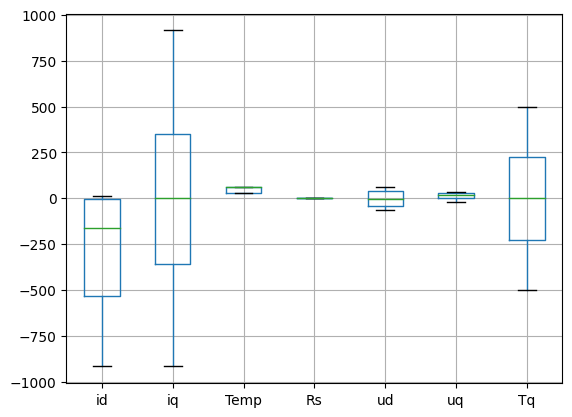

In [ ]:
# Plot a box plot to visualize the distribution of data
df3.boxplot()

# Identify outliers by setting a threshold for the distance from the median
threshold = 1.5
q1 = df3.quantile(0.25)
q3 = df3.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - (threshold * iqr)
upper_bound = q3 + (threshold * iqr)

# Print the rows that contain outliers
outliers = df3[(df3 < lower_bound) | (df3 > upper_bound)].dropna()
# outliers = df3[(df3 < lower_bound) | (df3 > upper_bound)]
print("Outliers:")
print(outliers)
print(lower_bound, upper_bound)

###PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X3_4_norm)
# データを主成分空間に写像
feature = pca.transform(X3_4_norm)

In [ ]:
pca.explained_variance_ratio_

array([0.49296017, 0.25005503, 0.24223882, 0.01474598])

In [ ]:
np.cumsum(pca.explained_variance_ratio_)

array([0.49296017, 0.7430152 , 0.98525402, 1.        ])

Text(0, 0.5, 'cumulative explained variance')

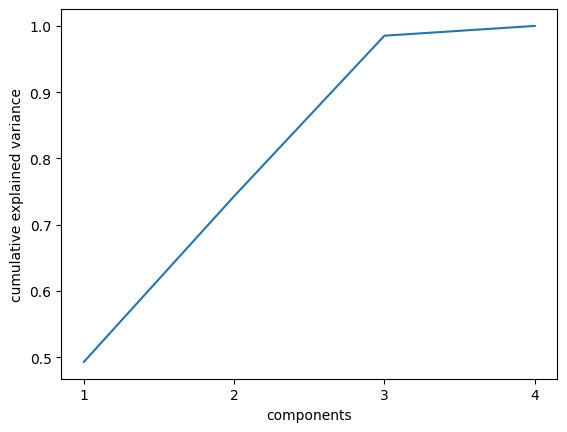

In [ ]:
n_components = 4
plt.plot(range(1, n_components+1), np.cumsum(pca.explained_variance_ratio_))
plt.xticks(range(1, n_components+1))
plt.xlabel('components')
plt.xlabel('components')
plt.ylabel('cumulative explained variance')

###correlation

In [ ]:
corr = X3_4_norm.corr()
corr.style.background_gradient(cmap='coolwarm')

,Id,Iq,Trot,Rs
Id,1.000000,-0.002041,0.128400,0.116619
Iq,-0.002041,1.000000,0.002147,0.003189
Trot,0.128400,0.002147,1.000000,0.940941
Rs,0.116619,0.003189,0.940941,1.000000


<Axes: >

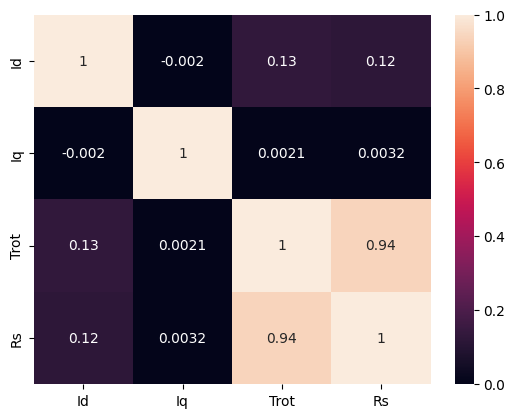

In [ ]:
sns.heatmap(X3_4_norm[corr.index].corr(),annot=True)

## 60deg/ 813 data

In [ ]:
y3t=df_t.drop(['Iq', 'Id', 'Trot', 'Rs'],axis=1)
X3t=df_t.drop(['Tq', 'ud', 'uq'], axis=1)
X3t_train, X3t_test, y3t_train, y3t_test = train_test_split(X3t, y3t, test_size=0.2, random_state=42)
udt_test_list = y3t_test['ud'].tolist()
uqt_test_list = y3t_test['uq'].tolist()
Tqt_test_list = y3t_test['Tq'].tolist()

###xnorm

In [ ]:
X3t=df_t.drop(['Tq', 'ud', 'uq'], axis=1)
X3tn = (X3t-X3_4.mean())/X3_4.std()
X3tn_train, X3tn_test, y3tn_train, y3tn_test = train_test_split(X3tn, y3t, test_size=0.2, random_state=42)
udtn_test_list = y3tn_test['ud'].tolist()
uqtn_test_list = y3tn_test['uq'].tolist()
Tqtn_test_list = y3tn_test['Tq'].tolist()

In [ ]:
X3tn

,Id,Iq,Trot,Rs
0,-0.708733,-1.300489,1.380974,1.321202
1,-1.403798,1.278943,1.352929,1.408120
2,-0.185030,0.302099,1.342895,1.625416
3,0.885471,1.724991,1.326493,1.408120
4,0.851030,1.785072,1.360859,1.016987
...,...,...,...,...
808,-0.447424,-0.596258,1.346695,1.147365
809,-1.742432,-0.492622,1.341841,1.060446
810,0.888910,0.761098,1.338622,1.156056
811,0.318489,-1.700010,1.324517,1.051754


Outliers:
Empty DataFrame
Columns: [Id, Iq, Trot, Rs, ud, uq, Tq]
Index: []
Id     -1329.045615
Iq     -1478.042756
Trot      88.214516
Rs         0.011511
ud      -169.708571
uq       -41.128434
Tq      -928.079915
dtype: float64 Id       792.010814
Iq      1452.427492
Trot      91.286110
Rs         0.013236
ud       165.648515
uq        68.133085
Tq       903.529983
dtype: float64


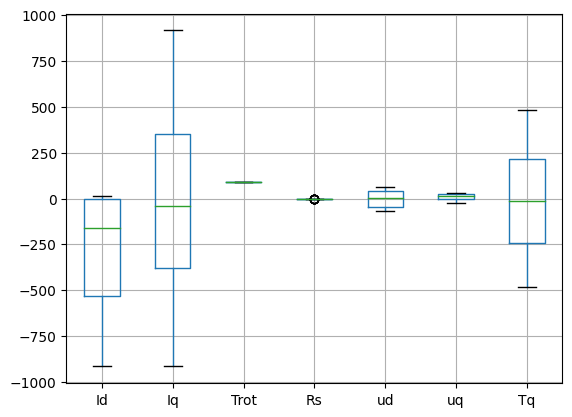

In [ ]:
# Plot a box plot to visualize the distribution of data
df_t.boxplot()

# Identify outliers by setting a threshold for the distance from the median
threshold = 1.5
q1 = df_t.quantile(0.25)
q3 = df_t.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - (threshold * iqr)
upper_bound = q3 + (threshold * iqr)

# Print the rows that contain outliers
outliers = df_t[(df_t < lower_bound) | (df_t > upper_bound)].dropna()
print("Outliers:")
print(outliers)
print(lower_bound, upper_bound)

In [ ]:
y3ttq=df_t['Tq']
X3ttq_train, X3ttq_test, y3ttq_train, y3ttq_test = train_test_split(X3t, y3ttq, test_size=0.2, random_state=42)
yttq_test_list = y3ttq_test.tolist()

In [ ]:
y3tuq=df_t['uq']
X3tuq_train, X3tuq_test, y3tuq_train, y3tuq_test = train_test_split(X3t, y3tuq, test_size=0.2, random_state=42)
ytuq_test_list = y3tuq_test.tolist()

In [ ]:
y3tud=df_t['ud']
X3tud_train, X3tud_test, y3tud_train, y3tud_test = train_test_split(X3t, y3tud, test_size=0.2, random_state=42)
ytud_test_list = y3tud_test.tolist()

## loss data

In [ ]:
# y3_l1=df_l1.drop(['id', 'iq', 'Udc', 'Rs'], axis=1)
X3_l = df_l.filter(items=['Id', 'Iq', 'Trot', 'Rs'], axis=1)
X3_l_norm = (X3_l-X3_l.mean())/X3_l.std()
X3_l.head()
# X3_4_train, X3_4_test, y3_4_train, y3_4_test = train_test_split(X3_4_norm, y3_4, test_size=0.2, random_state=42)
# ud_4_test_list = y3_4_test['ud'].tolist()
# uq_4_test_list = y3_4_test['uq'].tolist()
# Tq_4_test_list = y3_4_test['Tq'].tolist()

,Id,Iq,Trot,Rs
0,-277.929566,-373.323758,31.967909,0.009105


In [ ]:
X3_l1=df_l1.filter(items=['Id', 'Iq', 'Trot', 'Rs'], axis=1)
X3_l1_norm = (X3_l1-X3_l1.mean())/X3_l1.std()
X3_l1_norm.head()
X3_l1.head()

,Id,Iq,Trot,Rs
0,-143.776187,6.461964,31.665667,0.009105
1,-277.929566,-373.323758,31.967909,0.009105
2,-1.986945,-19.795915,31.419987,0.009211
3,-2.881526,13.636155,31.408680,0.009246
4,-145.186593,-270.815881,31.389416,0.009175


In [ ]:
X3_l1=df_l1.filter(items=['Id', 'Iq', 'Trot', 'Rs'], axis=1)
X3_l1_norm = (X3_l1-X3_4.mean())/X3_4.std()
X3_l1_norm.head()

,Id,Iq,Trot,Rs
0,0.387378,0.014079,-1.094821,-2.849523
1,-0.076131,-0.747661,-1.082070,-2.849523
2,0.877269,-0.038587,-1.105186,-2.722145
3,0.874178,0.028468,-1.105663,-2.679686
4,0.382505,-0.542060,-1.106475,-2.764605


In [ ]:
X3_l1_norm.head()

,Id,Iq,Trot,Rs
0,0.387378,0.014079,-1.094821,-2.849523
1,-0.076131,-0.747661,-1.082070,-2.849523
2,0.877269,-0.038587,-1.105186,-2.722145
3,0.874178,0.028468,-1.105663,-2.679686
4,0.382505,-0.542060,-1.106475,-2.764605


In [ ]:
df_l1

,Id,Iq,Udc,Speed,Trot,Twin,Rs,Pmech,Pinv,Tq_mech
0,-143.776187,6.461964,449.947021,11999.281738,31.665667,23.0,0.009105,5.103060,685.676575,4.031734
1,-277.929566,-373.323758,449.978683,0.000000,31.967909,23.0,0.009105,0.000000,1570.652246,-248.198921
2,-1.986945,-19.795915,449.995483,6999.782227,31.419987,26.0,0.009211,-7.089488,281.071663,-9.708035
3,-2.881526,13.636155,449.961121,8000.287109,31.408680,27.0,0.009246,3.934028,238.457203,4.665133
4,-145.186593,-270.815881,450.306824,6199.681885,31.389416,25.0,0.009175,-103.554211,1583.034515,-159.584419
...,...,...,...,...,...,...,...,...,...,...
5145,-444.194348,88.614194,349.214249,13000.065918,61.154922,85.0,0.011156,127.334606,2209.419250,93.510990
5146,-0.861885,2.060128,349.991714,4299.880127,61.100800,74.0,0.010774,0.163441,140.428931,0.343534
5147,-608.995077,-649.186388,349.858536,0.000000,60.701870,61.0,0.010323,0.000000,3979.074478,-478.265472
5148,-400.194663,-163.290089,350.594467,9999.775879,60.410511,85.0,0.011156,-138.519218,1781.547546,-132.315971


## Data preparation for Ud

In [ ]:
yud=df4['ud']
Xud=df4.drop(['Tq', 'ud', 'uq'], axis=1)

In [ ]:
yud.head()

0    22.591244
1   -33.372309
2    38.457316
3    32.777868
4   -31.575884
Name: ud, dtype: float64

In [ ]:
Xud.head()

,Id,Iq,Trot,Rs
0,-839.237453,-257.497870,29.136269,0.009859
1,-0.678702,259.035608,29.128912,0.010074
2,-308.465547,-349.612704,30.822357,0.009679
3,0.519034,-259.264124,30.841391,0.009715
4,-10.578677,239.038266,30.731588,0.009679


In [ ]:
Xud_norm = (Xud-Xud.mean())/Xud.std()
Xud_norm.head()

,Id,Iq,Trot,Rs
0,-2.015488,-0.515348,-1.201532,-1.938241
1,0.881789,0.520669,-1.201843,-1.677486
2,-0.181635,-0.700104,-1.130399,-2.155537
3,0.885928,-0.518891,-1.129596,-2.112078
4,0.847584,0.480560,-1.134228,-2.155537


In [ ]:
Xud_train, Xud_test, yud_train, yud_test = train_test_split(Xud, yud, test_size=0.2, random_state=42)
yud_test_list = yud_test.tolist()

In [ ]:
Xudn_train, Xudn_test, yudn_train, yudn_test = train_test_split(Xud_norm, yud, test_size=0.2, random_state=42)
yudn_test_list = yudn_test.tolist()

In [ ]:
Xud_train

,Id,Iq,Trot,Rs
7761,-385.690999,-297.857437,89.885605,0.012661
196,-9.581170,-159.314514,29.235880,0.010182
5804,-0.009076,-0.119004,89.086212,0.012194
3527,12.438725,-639.905893,59.640274,0.011583
415,-428.115585,811.330177,30.545559,0.010613
...,...,...,...,...
5226,-460.456164,147.839171,60.677303,0.012122
5390,-886.598658,-151.260553,59.936939,0.011583
860,-6.381390,-868.887668,29.192137,0.010362
7603,0.244099,79.292722,89.033676,0.012122


In [ ]:
Xud2_train, Xud2_test, yud2_train, yud2_test = train_test_split(Xud, yud, test_size=0.4, random_state=42)
Xud2_, Xud2_test, ytd2_, yud2_test = train_test_split(Xud2_test, yud2_test, test_size=0.5, random_state=42)
yud2_test_list = yud2_test.tolist()

## Data preparation for Uq

In [ ]:
yuq=df4['uq']
Xuq=df4.drop(['Tq', 'ud', 'uq'], axis=1)

In [ ]:
Xuq_norm = (Xuq-Xuq.mean())/Xuq.std()
Xuq_norm.head()

,Id,Iq,Trot,Rs
0,-2.015488,-0.515348,-1.201532,-1.938241
1,0.881789,0.520669,-1.201843,-1.677486
2,-0.181635,-0.700104,-1.130399,-2.155537
3,0.885928,-0.518891,-1.129596,-2.112078
4,0.847584,0.480560,-1.134228,-2.155537


In [ ]:
Xuq_train, Xuq_test, yuq_train, yuq_test = train_test_split(Xuq, yuq, test_size=0.2, random_state=42)
yuq_test_list = yuq_test.tolist()

In [ ]:
Xuqn_train, Xuqn_test, yuqn_train, yuqn_test = train_test_split(Xuq_norm, yuq, test_size=0.2, random_state=42)
yuqn_test_list = yuqn_test.tolist()

In [ ]:
yuq.head()

0   -17.483726
1    32.115860
2    10.991732
3    28.642396
4    31.377611
Name: uq, dtype: float64

In [ ]:
Xuq_train

,Id,Iq,Trot,Rs
7761,-385.690999,-297.857437,89.885605,0.012661
196,-9.581170,-159.314514,29.235880,0.010182
5804,-0.009076,-0.119004,89.086212,0.012194
3527,12.438725,-639.905893,59.640274,0.011583
415,-428.115585,811.330177,30.545559,0.010613
...,...,...,...,...
5226,-460.456164,147.839171,60.677303,0.012122
5390,-886.598658,-151.260553,59.936939,0.011583
860,-6.381390,-868.887668,29.192137,0.010362
7603,0.244099,79.292722,89.033676,0.012122


In [ ]:
Xuq2_train, Xuq2_test, yuq2_train, yuq2_test = train_test_split(Xuq, yuq, test_size=0.4, random_state=42)
Xuq2_, Xuq2_test, ytq2_, yuq2_test = train_test_split(Xuq2_test, yuq2_test, test_size=0.5, random_state=42)
yuq2_test_list = yuq2_test.tolist()

In [ ]:
Xuq3_train, Xuq3_test, yuq3_train, yuq3_test = train_test_split(Xuq_norm, yuq, test_size=0.4, random_state=42)
Xuq3_, Xuq3_test, ytq3_, yuq3_test = train_test_split(Xuq3_test, yuq3_test, test_size=0.5, random_state=42)
yuq3_test_list = yuq3_test.tolist()

In [ ]:
Xuq2_train.shape, Xuq2_test.shape, X3_test.shape

((4728, 4), (1576, 4), (1576, 4))

# relation

In [ ]:
import seaborn as sns

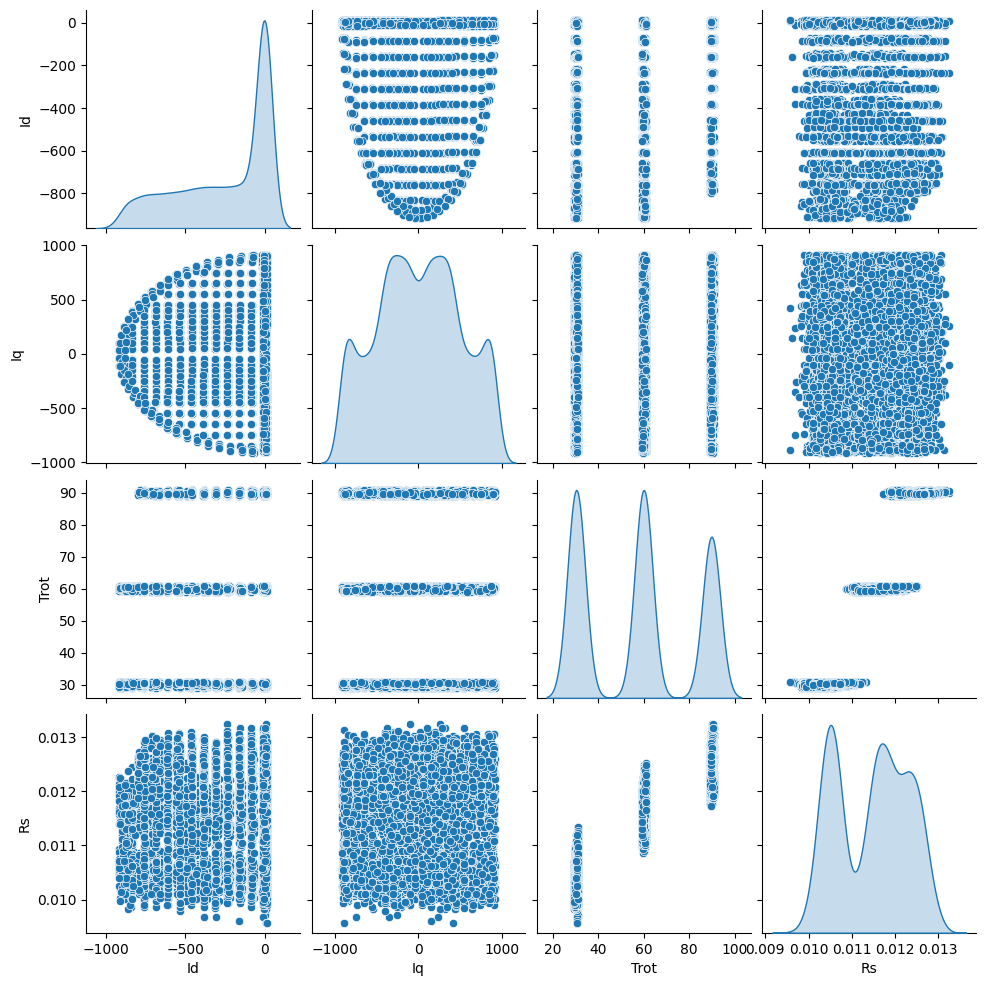

In [ ]:
sns.pairplot(X3[['Id', 'Iq', 'Trot', 'Rs']], diag_kind='kde')

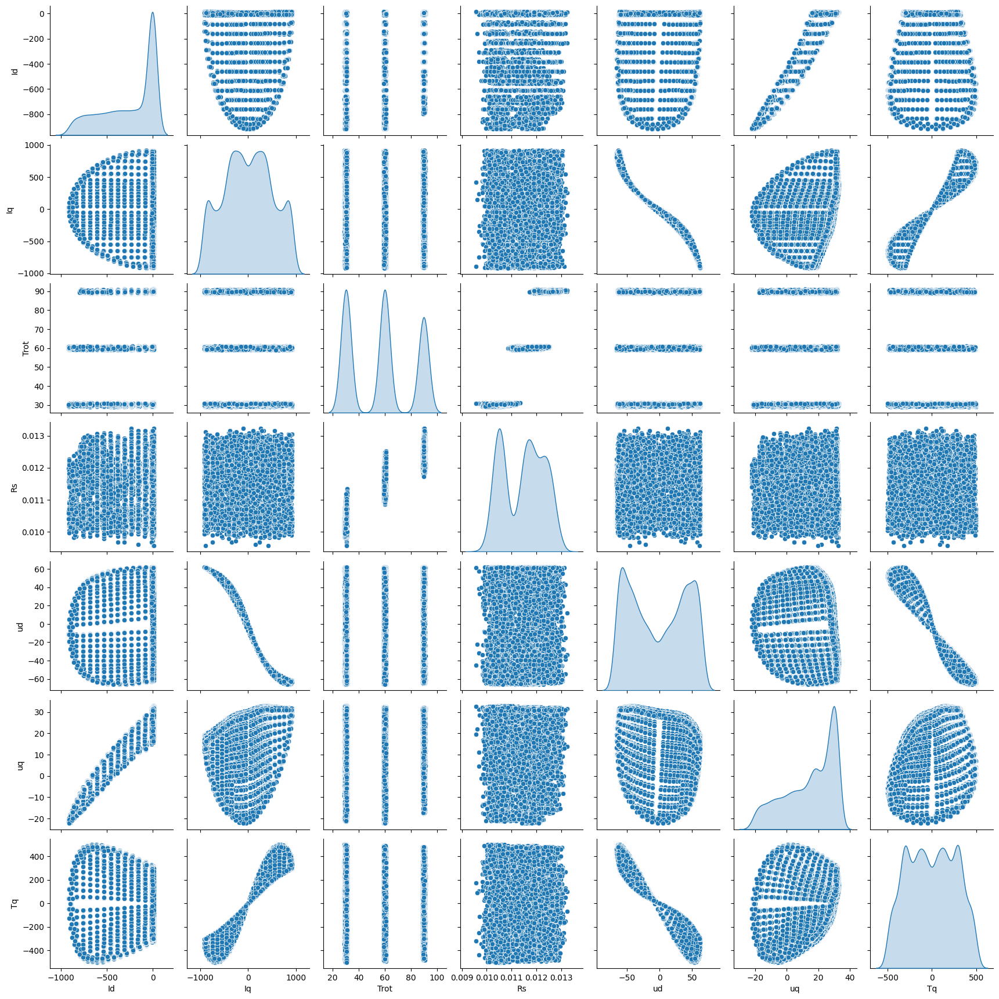

In [ ]:
sns.pairplot(df[['Id', 'Iq', 'Trot', 'Rs', 'ud', 'uq', 'Tq']], diag_kind='kde')

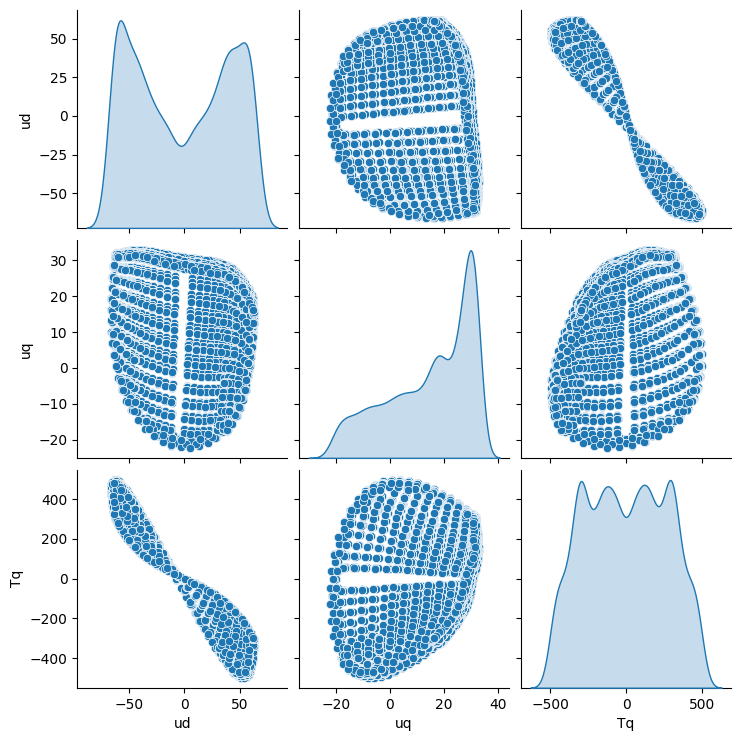

In [39]:
sns.pairplot(df[[ 'ud', 'uq', 'Tq']], diag_kind='kde')

# NN model manual search

## 3output NN

In [ ]:
n_outputs = y3.shape[1]
n_inputs = X3.shape[1]
n_outputs

3

In [ ]:
# define regression model
def regression_model_o3():
    model_o3 = Sequential()
    model_o3.add(Dense(10, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(10, activation='relu'))
    model_o3.add(Dense(5, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

In [ ]:
model_o3 = regression_model_o3()
model_o3.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 10)                50        
                                                                 
 dense_5 (Dense)             (None, 10)                110       
                                                                 
 dense_6 (Dense)             (None, 5)                 55        
                                                                 
 dense_7 (Dense)             (None, 3)                 18        
                                                                 
Total params: 233
Trainable params: 233
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
history_o3 = model_o3.fit(X3_train, y3_train, epochs=1000, batch_size=32, verbose=0,
    validation_split = 0.2)

CPU times: user 3min 13s, sys: 8.02 s, total: 3min 21s
Wall time: 3min 16s


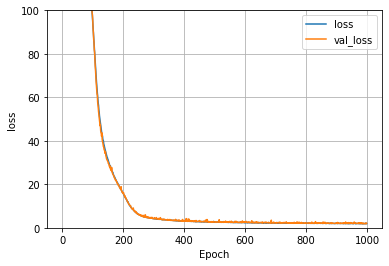

In [ ]:
plot_loss(history_o3)

In [ ]:
loss_pred_o3 = model_o3.evaluate(X3_test, y3_test)
y_pred_o3 = model_o3.predict(X3_test)
loss_pred_o3

18/18 [==============================] - 0s 2ms/step


101.46757507324219

In [ ]:
y_pred_o3

array([[ -77.5507  ,   16.660952,  468.72073 ],
       [ -52.24846 ,  -21.711855,  340.68124 ],
       [  30.446629,   14.891914, -219.2969  ],
       ...,
       [ -31.732294,   19.900105,  185.80437 ],
       [ -48.783646,   14.936133,  294.33902 ],
       [ -61.67582 ,  -14.880706,  398.91742 ]], dtype=float32)

In [ ]:
y_pred_o3[1][2]

340.68124

In [ ]:
y_pred_o3_list = y_pred_o3.tolist()

In [ ]:
loss_pred_o3 = model_o3.evaluate(X3_test, y3_test)
y_pred_o3 = model_o3.predict(X3_test)
loss_pred_o3

y_pred_o3_list = y_pred_o3.tolist()

ud_pred_o3, uq_pred_o3, Tq_pred_o3 = get_output_list(y_pred_o3, y_pred_o3_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_o3, MSE_uq_o3, MSE_Tq_o3, MAPE_ud_o3, MAPE_uq_o3, MAPE_Tq_o3 = get_MSE_MAPE_2(y3_test, y_pred_o3, ud_pred_o3, uq_pred_o3, Tq_pred_o3)


18/18 [==============================] - 0s 2ms/step
2.279538034228273 0.35638233795826063 4.6373287823056195
0.07217023066318795 0.0984106351996126 0.03156857892947848


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

MSE_o3 = mean_squared_error(y3_test, y_pred_o3)
MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
MAPE_o3 = mean_absolute_percentage_error(y3_test, y_pred_o3)
MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)


print(MSE_o3, MAPE_o3)
print(MSE_ud, MSE_uq, MSE_Tq)
print(MAPE_ud, MAPE_uq, MAPE_Tq)

NameError: ignored

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
def get_MSE_MAPE(y3_test, y_pred, ud_pred, uq_pred, Tq_pred):
    MSE = mean_squared_error(y3_test, y_pred)
    MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
    MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
    MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
    MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
    MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
    MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)
    return MSE, MAPE, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq

MSE_o3t, MAPE_o3t, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq = get_MSE_MAPE(y3_test, y_pred_o3, ud_pred, uq_pred, Tq_pred)

print(MSE_o3t, MAPE_o3t)
print(MSE_ud, MSE_uq, MSE_Tq)
print(MAPE_ud, MAPE_uq, MAPE_Tq)

14.636679157688869 0.20405999261887012
13.76200394056219 3.5831287659525244 26.564904766551894
0.25619749891118215 0.31780968478472593 0.03817279416070249


In [ ]:
def get_output_list(y_pred_o3, y_pred_o3_list):
    ud_pred = []
    uq_pred = []
    Tq_pred = []
    for i in range(len(y_pred_o3)):
        a = y_pred_o3_list[i][0]
        b = y_pred_o3_list[i][1]
        c = y_pred_o3_list[i][2]
        ud_pred.append(a)
        uq_pred.append(b)
        Tq_pred.append(c)
    return ud_pred, uq_pred, Tq_pred

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred_o3, y_pred_o3_list)
ud_pred

[-69.00251770019531,
 -40.78150177001953,
 44.419334411621094,
 -21.699384689331055,
 -24.579910278320312,
 43.32884979248047,
 -69.19153594970703,
 42.4395866394043,
 44.518524169921875,
 -19.231910705566406,
 63.55721664428711,
 -63.766319274902344,
 49.127349853515625,
 63.52942657470703,
 -32.967071533203125,
 -65.35171508789062,
 -14.18883228302002,
 18.987611770629883,
 -37.35942459106445,
 -39.6537971496582,
 -59.655433654785156,
 62.90523910522461,
 54.313480377197266,
 -38.62005615234375,
 -17.99151611328125,
 -69.6070327758789,
 36.281028747558594,
 -62.88166046142578,
 62.52443313598633,
 -54.29657745361328,
 -48.11927795410156,
 -4.367566108703613,
 60.21609878540039,
 -16.55237579345703,
 -39.27177429199219,
 -25.269729614257812,
 -23.410675048828125,
 -22.932037353515625,
 -20.67209243774414,
 32.97665786743164,
 -50.29111099243164,
 37.13664627075195,
 30.932823181152344,
 62.016998291015625,
 19.31612205505371,
 -47.973838806152344,
 -26.31378746032715,
 -29.70034980773

In [ ]:
y3_test.head()

,ud,uq,Tq
415,-65.579380,13.383634,465.645416
1302,-41.116959,-13.833865,350.741023
2475,46.477232,21.836455,-219.445575
1340,-16.981143,0.155205,98.376962
1599,-27.333384,-16.160569,212.389917


In [ ]:
ud_test_list = y3_test['ud'].tolist()
uq_test_list = y3_test['uq'].tolist()
Tq_test_list = y3_test['Tq'].tolist()

In [ ]:
def get_errorList(y_pred_list, y_test_list):
    errors = []
    error=0
    for i in range(len(y_test)):
        error = abs(y_pred_list[i] - y_test_list[i])/y_test_list[i] * 100
        errors.append(error)
    return errors

errors_ud = get_errorList(ud_pred, ud_test_list)
errors_uq = get_errorList(uq_pred, uq_test_list)
errors_Tq = get_errorList(Tq_pred, Tq_test_list)
# errors_ud

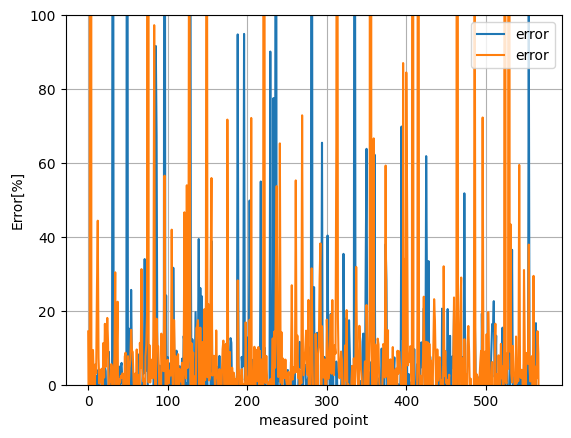

In [ ]:
def plot_error(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 100])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)
plot_error(errors_ud)
plot_error(errors_uq)

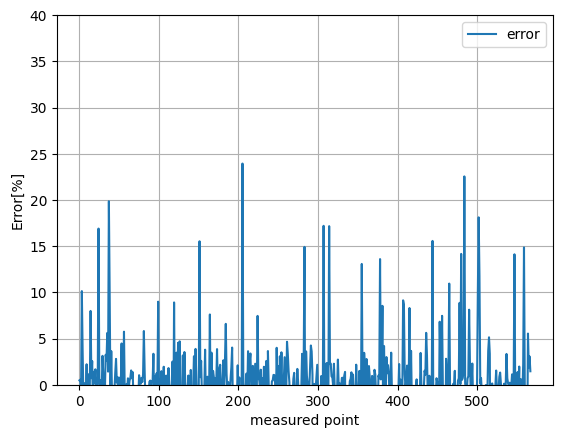

In [ ]:
def plot_error_40(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 40])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)
plot_error_40(errors_Tq)

In [ ]:
y3.head()

,ud,uq,Tq
0,22.591244,-17.483726,-284.895837
1,-33.372309,32.115860,111.771427
2,38.457316,10.991732,-247.857954
3,32.777868,28.642396,-113.529079
4,-31.575884,31.377611,105.743542


In [ ]:
y_test

415     465.645416
1302    350.741023
2475   -219.445575
1340     98.376962
1599    212.389917
           ...    
163     -26.918707
1926      8.393490
252     168.724827
1779    299.328683
1405    398.232918
Name: Tq, Length: 568, dtype: float64

## NN (medium size)

In [ ]:
# define regression model
def regression_model_o3_2():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

In [ ]:
model_o3_2 = regression_model_o3_2()
model_o3_2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 50)                250       
                                                                 
 dense_37 (Dense)            (None, 50)                2550      
                                                                 
 dense_38 (Dense)            (None, 50)                2550      
                                                                 
 dense_39 (Dense)            (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
history_o3_2 = model_o3_2.fit(X3_train, y3_train, epochs=100, batch_size=5, verbose=0,
    validation_split = 0.2)

CPU times: total: 1min 18s
Wall time: 57.3 s


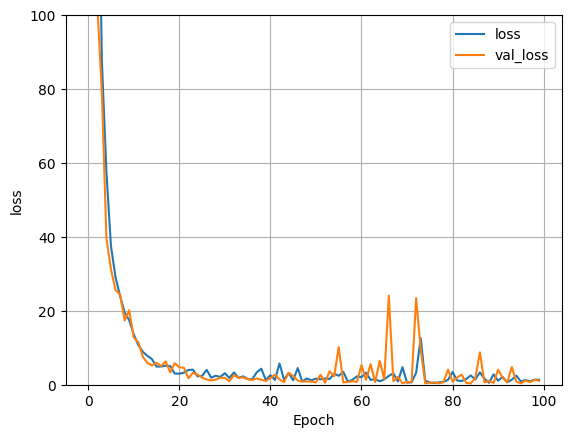

In [ ]:
plot_loss(history_o3_2)

In [ ]:
loss_pred_o3_2 = model_o3_2.evaluate(X3_test, y3_test)
y_pred_o3_2 = model_o3_2.predict(X3_test)
loss_pred_o3_2

18/18 [==============================] - 0s 1ms/step


1.082169532775879

In [ ]:
y_pred_o3_2_list = y_pred_o3_2.tolist()

In [ ]:
ud_pred_2, uq_pred_2, Tq_pred_2 = get_output_list(y_pred_o3_2, y_pred_o3_2_list)
ud_pred_2

[-65.26258850097656,
 -40.83561706542969,
 46.55215072631836,
 -16.02252197265625,
 -27.583696365356445,
 45.79496383666992,
 -65.02274322509766,
 44.74967575073242,
 43.82523727416992,
 -24.62798500061035,
 61.99228286743164,
 -61.4932746887207,
 51.03386306762695,
 60.74138259887695,
 -34.133304595947266,
 -62.67601776123047,
 -19.68454360961914,
 19.220012664794922,
 -37.42123031616211,
 -42.34367752075195,
 -58.950862884521484,
 59.70923614501953,
 56.02006912231445,
 -41.58726119995117,
 -15.187509536743164,
 -65.2887191772461,
 40.3795051574707,
 -61.167789459228516,
 61.23707962036133,
 -55.81821060180664,
 -49.54728698730469,
 2.3125967979431152,
 60.12405014038086,
 -21.792957305908203,
 -39.34051513671875,
 -23.039947509765625,
 -28.820205688476562,
 -15.917588233947754,
 -16.151460647583008,
 34.50753402709961,
 -53.01080322265625,
 39.49580764770508,
 32.77189254760742,
 61.481502532958984,
 18.854690551757812,
 -47.211185455322266,
 -31.572006225585938,
 -33.38161468505859

In [ ]:
MSE_o3_2, MAPE_o3_2, MSE_ud_2, MSE_uq_2, MSE_Tq_2, MAPE_ud_2, MAPE_uq_2, MAPE_Tq_2 = get_MSE_MAPE(y3_test, y_pred_o3_2, ud_pred_2, uq_pred_2, Tq_pred_2)

print(MSE_o3_2, MAPE_o3_2)
print(MSE_ud_2, MSE_uq_2, MSE_Tq_2)
print(MAPE_ud_2, MAPE_uq_2, MAPE_Tq_2)

1.0821698048613018 0.033594795790682405
0.22854965984246634 0.13368952575780105 2.884270228983637
0.019979671956061137 0.05944156778799196 0.021363147627994152


In [ ]:
ud_test_list = y3_test['ud'].tolist()
uq_test_list = y3_test['uq'].tolist()
Tq_test_list = y3_test['Tq'].tolist()

In [ ]:
errors_ud_2 = get_errorList(ud_pred_2, ud_test_list)
errors_uq_2 = get_errorList(uq_pred_2, uq_test_list)
errors_Tq_2 = get_errorList(Tq_pred_2, Tq_test_list)
# errors_ud

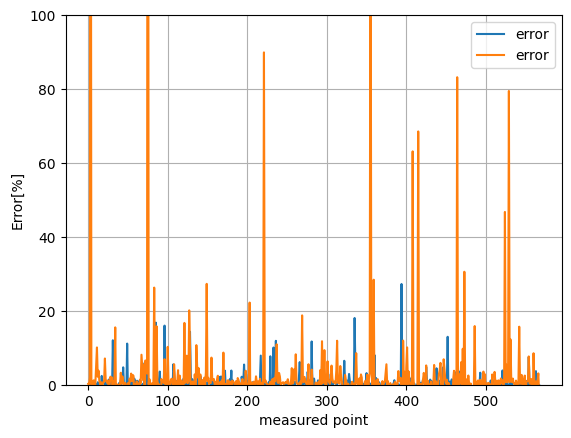

In [ ]:
plot_error(errors_ud_2)
plot_error(errors_uq_2)

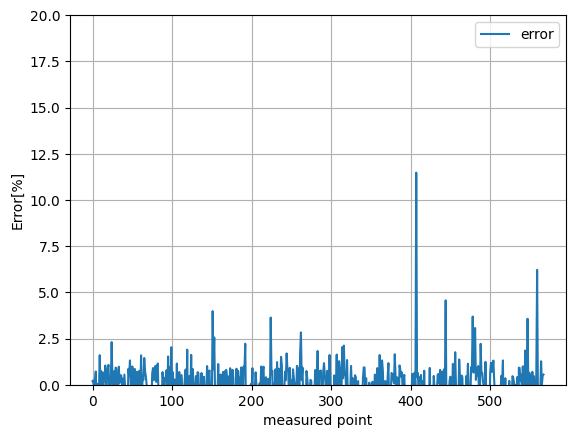

In [ ]:
def plot_error_20(errors):
  plt.plot(errors, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 20])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)
plot_error_20(errors_Tq_2)

## NN (medium SGD)

In [ ]:
# define regression model
def regression_model_o3_3():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     opt = keras.optimizers.Adam(learning_rate=0.001)
    opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_3 = regression_model_o3_2()
model_o3_3.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 50)                250       
                                                                 
 dense_49 (Dense)            (None, 50)                2550      
                                                                 
 dense_50 (Dense)            (None, 50)                2550      
                                                                 
 dense_51 (Dense)            (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


In [ ]:
%%time
history_o3_3 = model_o3_3.fit(X3_train, y3_train, epochs=300, batch_size=5, verbose=0,
    validation_split = 0.2)

CPU times: total: 3min 39s
Wall time: 2min 47s


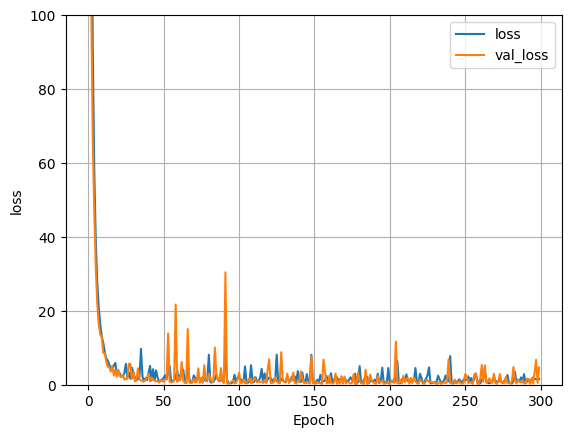

In [ ]:
plot_loss(history_o3_3)

In [ ]:
loss_pred_o3_3 = model_o3_3.evaluate(X3_test, y3_test)
y_pred_o3_3 = model_o3_3.predict(X3_test)
loss_pred_o3_3

18/18 [==============================] - 0s 1ms/step


5.007772445678711

In [ ]:
y_pred_o3_3_list = y_pred_o3_3.tolist()


In [ ]:
ud_pred_3, uq_pred_3, Tq_pred_3 = get_output_list(y_pred_o3_3, y_pred_o3_3_list)
ud_pred_3

[-64.64922332763672,
 -39.716888427734375,
 47.08588409423828,
 -15.41719913482666,
 -26.231170654296875,
 46.5784912109375,
 -64.21620178222656,
 45.41141891479492,
 45.16092300415039,
 -24.82286834716797,
 62.73127365112305,
 -61.28411865234375,
 51.743080139160156,
 61.71752166748047,
 -32.81882095336914,
 -61.96099090576172,
 -19.74347686767578,
 20.151363372802734,
 -36.9747200012207,
 -42.86464309692383,
 -59.223663330078125,
 60.189064025878906,
 56.81264114379883,
 -41.06920623779297,
 -14.839468955993652,
 -64.73430633544922,
 40.81440353393555,
 -60.882713317871094,
 62.529232025146484,
 -56.31599426269531,
 -49.84930419921875,
 4.386034965515137,
 60.91265869140625,
 -22.663623809814453,
 -38.59981918334961,
 -22.949630737304688,
 -28.69348907470703,
 -15.025166511535645,
 -16.46695327758789,
 35.53857421875,
 -53.37445831298828,
 40.13502502441406,
 33.66563034057617,
 62.707603454589844,
 20.963714599609375,
 -46.835968017578125,
 -31.236679077148438,
 -33.47711181640625,


In [ ]:
MSE_o3_3, MAPE_o3_3, MSE_ud_3, MSE_uq_3, MSE_Tq_3, MAPE_ud_3, MAPE_uq_3, MAPE_Tq_3 = get_MSE_MAPE(y3_test, y_pred_o3_3, ud_pred_3, uq_pred_3, Tq_pred_3)

# print(MSE_o3_2, MAPE_o3_2)
print(MSE_ud_3, MSE_uq_3, MSE_Tq_3)
print(MAPE_ud_3, MAPE_uq_3, MAPE_Tq_3)

0.8281371950549726 0.1837984205842339 14.011384868234973
0.07396283837942715 0.06432887305159067 0.07842306729436546


In [ ]:
errors_ud_3 = get_errorList(ud_pred_3, ud_test_list)
errors_uq_3 = get_errorList(uq_pred_3, uq_test_list)
errors_Tq_3 = get_errorList(Tq_pred_3, Tq_test_list)
# errors_ud

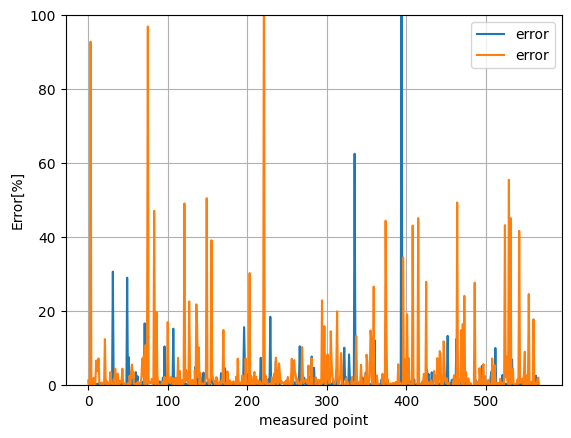

In [ ]:
plot_error(errors_ud_3)
plot_error(errors_uq_3)

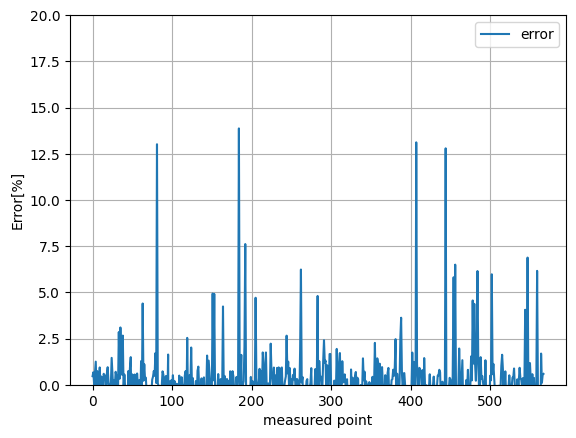

In [ ]:
plot_error_20(errors_Tq_3)

## NN batch size 64

In [ ]:
# define regression model
def regression_model_o3_4():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.0005)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_4 = regression_model_o3_4()
model_o3_4.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 50)                250       
                                                                 
 dense_5 (Dense)             (None, 50)                2550      
                                                                 
 dense_6 (Dense)             (None, 50)                2550      
                                                                 
 dense_7 (Dense)             (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 34s
Wall time: 1min 15s


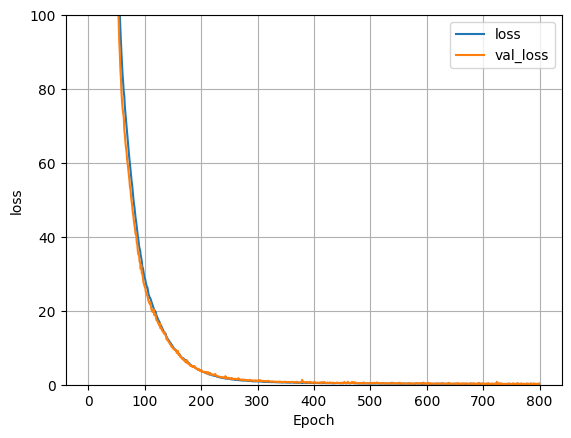

In [ ]:
%%time
history_o3_4 = model_o3_4.fit(X3_train, y3_train, epochs=800, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_4)

In [ ]:
loss_pred_o3_4 = model_o3_4.evaluate(X3_test, y3_test)
y_pred_o3_4 = model_o3_4.predict(X3_test)
loss_pred_o3_4

18/18 [==============================] - 0s 1ms/step


0.35183781385421753

In [ ]:
y_pred_o3_4_list = y_pred_o3_4.tolist()

In [ ]:
ud_pred_4, uq_pred_4, Tq_pred_4 = get_output_list(y_pred_o3_4, y_pred_o3_4_list)
# ud_pred_4

In [ ]:
MSE_o3_4, MAPE_o3_4, MSE_ud_4, MSE_uq_4, MSE_Tq_4, MAPE_ud_4, MAPE_uq_4, MAPE_Tq_4 = get_MSE_MAPE(y3_test, y_pred_o3_4, ud_pred_4, uq_pred_4, Tq_pred_4)

# print(MSE_o3_2, MAPE_o3_2)
print(MSE_ud_4, MSE_uq_4, MSE_Tq_4)
print(MAPE_ud_4, MAPE_uq_4, MAPE_Tq_4)

0.11806755500735867 0.0737087231389304 0.8637371238504593
0.016659425715551696 0.0469001585803993 0.015214040373090584


In [ ]:
errors_ud_4 = get_errorList(ud_pred_4, ud_test_list)
errors_uq_4 = get_errorList(uq_pred_4, uq_test_list)
errors_Tq_4 = get_errorList(Tq_pred_4, Tq_test_list)
# errors_ud

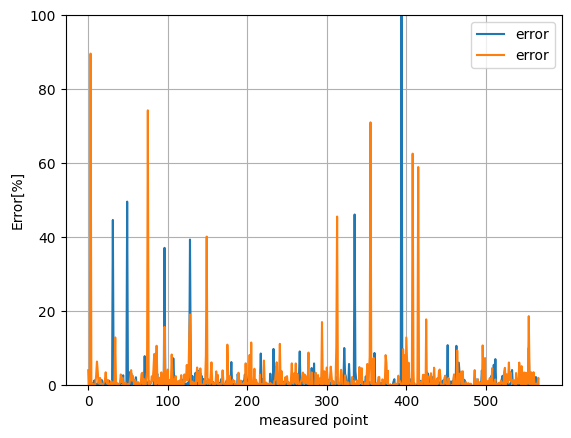

In [ ]:
plot_error(errors_ud_4)
plot_error(errors_uq_4)

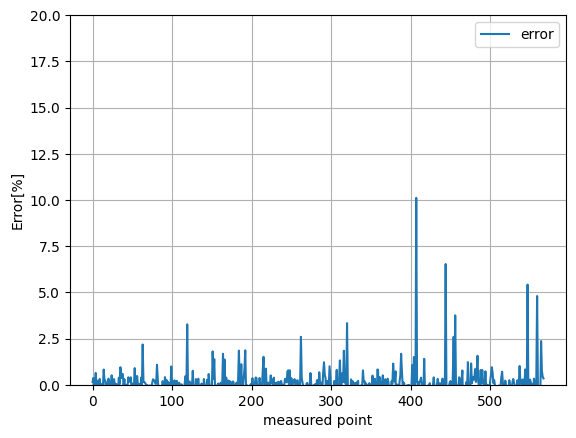

In [ ]:
plot_error_20(errors_Tq_4)

In [ ]:
model_o3_4.save('model_o3_4_010.h5')

## NN batch 128

In [ ]:
# define regression model
def regression_model_o3_5():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_5 = regression_model_o3_5()
model_o3_5.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_92 (Dense)            (None, 50)                250       
                                                                 
 dense_93 (Dense)            (None, 50)                2550      
                                                                 
 dense_94 (Dense)            (None, 50)                2550      
                                                                 
 dense_95 (Dense)            (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 4s
Wall time: 53 s


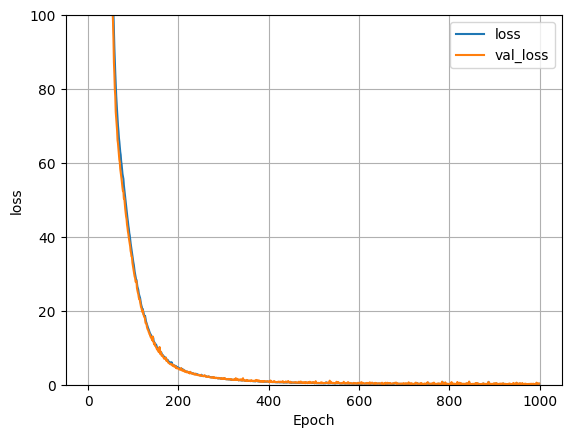

In [ ]:
%%time
history_o3_5 = model_o3_5.fit(X3_train, y3_train, epochs=1000, batch_size=128, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_5)

In [ ]:
loss_pred_o3_5 = model_o3_5.evaluate(X3_test, y3_test)
y_pred_o3_5 = model_o3_5.predict(X3_test)
loss_pred_o3_5

18/18 [==============================] - 0s 1ms/step


0.3214474320411682

In [ ]:
y_pred_o3_5_list = y_pred_o3_5.tolist()

ud_pred_5, uq_pred_5, Tq_pred_5 = get_output_list(y_pred_o3_5, y_pred_o3_5_list)
# ud_pred_3

MSE_o3_5, MAPE_o3_5, MSE_ud_5, MSE_uq_5, MSE_Tq_5, MAPE_ud_5, MAPE_uq_5, MAPE_Tq_5 = get_MSE_MAPE(y3_test, y_pred_o3_5, ud_pred_5, uq_pred_5, Tq_pred_5)

# print(MSE_o3_2, MAPE_o3_2)
print(MSE_ud_5, MSE_uq_5, MSE_Tq_5)
print(MAPE_ud_5, MAPE_uq_5, MAPE_Tq_5)

0.1513582684091401 0.05396604131265287 0.7590190512448495
0.02136246575830066 0.03207192528184585 0.015455767446626517


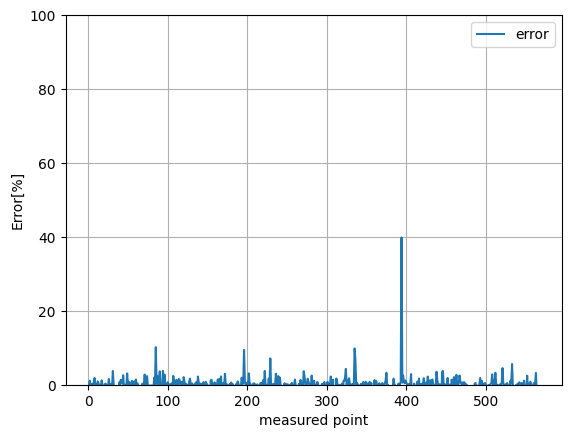

In [ ]:
errors_ud_5 = get_errorList(ud_pred_5, ud_test_list)
errors_uq_5 = get_errorList(uq_pred_5, uq_test_list)
errors_Tq_5 = get_errorList(Tq_pred_5, Tq_test_list)

# plot
plot_error(errors_ud_5)
# plot_error(errors_uq_5)

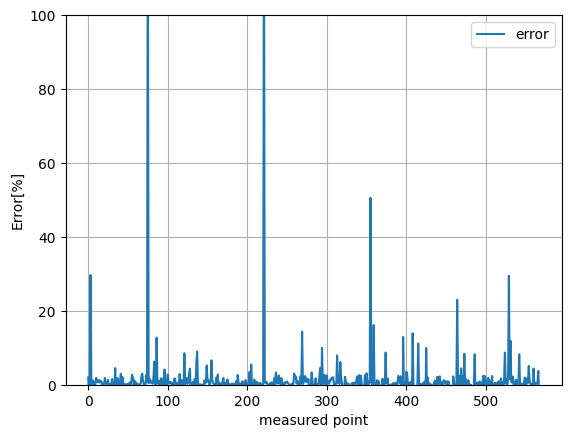

In [ ]:
plot_error(errors_uq_5)

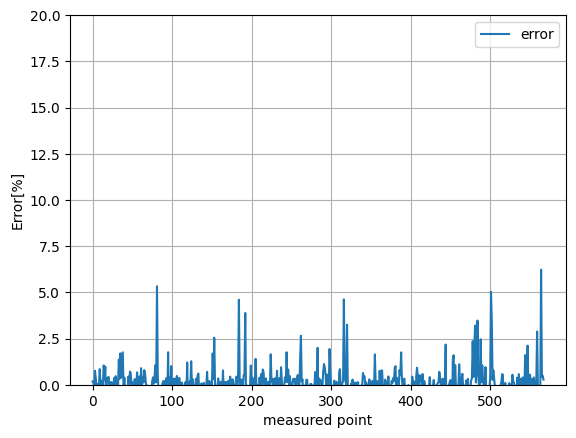

In [ ]:
plot_error_20(errors_Tq_5)

## NN batch 256

In [ ]:
# define regression model
def regression_model_o3_5():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_6 = regression_model_o3_5()
model_o3_6.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_76 (Dense)            (None, 50)                250       
                                                                 
 dense_77 (Dense)            (None, 50)                2550      
                                                                 
 dense_78 (Dense)            (None, 50)                2550      
                                                                 
 dense_79 (Dense)            (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 25s
Wall time: 1min 6s


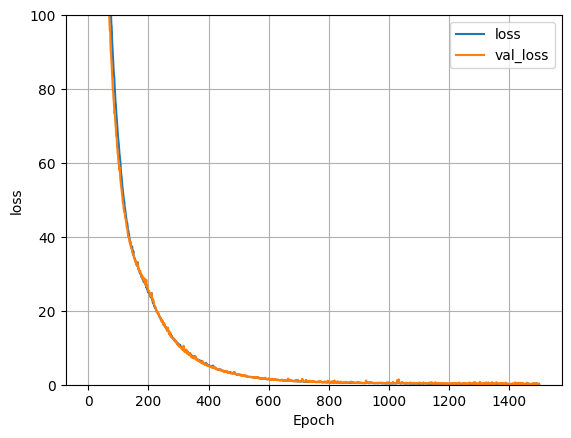

In [ ]:
%%time
history_o3_6 = model_o3_6.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_6)

In [ ]:
loss_pred_o3_6 = model_o3_6.evaluate(X3_test, y3_test)
y_pred_o3_6 = model_o3_6.predict(X3_test)
loss_pred_o3_6

18/18 [==============================] - 0s 1ms/step


0.2735918462276459

In [ ]:
y_pred_o3_6_list = y_pred_o3_6.tolist()

ud_pred_6, uq_pred_6, Tq_pred_6 = get_output_list(y_pred_o3_6, y_pred_o3_6_list)
# ud_pred_3

MSE_o3_6, MAPE_o3_6, MSE_ud_6, MSE_uq_6, MSE_Tq_6, MAPE_ud_6, MAPE_uq_6, MAPE_Tq_6 = get_MSE_MAPE(y3_test, y_pred_o3_6, ud_pred_6, uq_pred_6, Tq_pred_6)

# print(MSE_o3_2, MAPE_o3_2)
print(MSE_ud_6, MSE_uq_6, MSE_Tq_6)
print(MAPE_ud_6, MAPE_uq_6, MAPE_Tq_6)

0.20460239587224105 0.04952317019234737 0.5666504635658306
0.018692653010825486 0.03974786955776983 0.0091244138238843


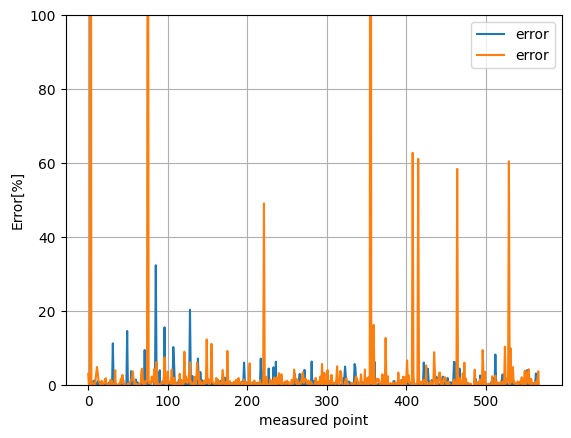

In [ ]:
errors_ud_6 = get_errorList(ud_pred_6, ud_test_list)
errors_uq_6 = get_errorList(uq_pred_6, uq_test_list)
errors_Tq_6 = get_errorList(Tq_pred_6, Tq_test_list)

# plot
plot_error(errors_ud_6)
plot_error(errors_uq_6)

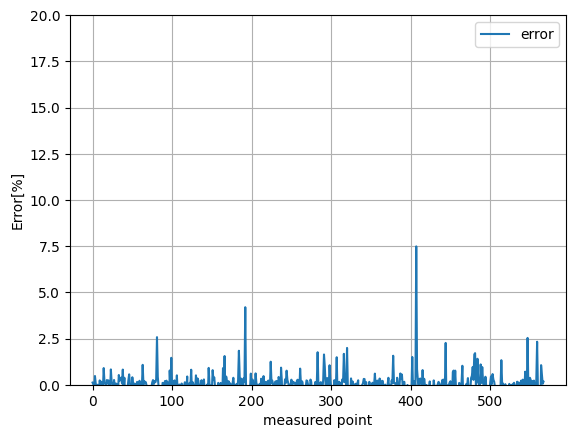

In [ ]:
plot_error_20(errors_Tq_6)

In [ ]:
# assign location
# path='Weights'
# save
model_o3_6.save('model_o3_6.h5')

In [ ]:
from keras.models import load_model
model_load = load_model('model_o3_6.h5')
loss_pred_load = model_load.evaluate(X3_test, y3_test)
y_pred_load = model_load.predict(X3_test)
loss_pred_load

18/18 [==============================] - 0s 2ms/step


0.2735918462276459

## NN butch 32

In [ ]:
# define regression model
def regression_model_o3_5():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_7 = regression_model_o3_5()
model_o3_7.summary()

SyntaxError: invalid syntax (440928719.py, line 18)

CPU times: total: 46.2 s
Wall time: 36.4 s


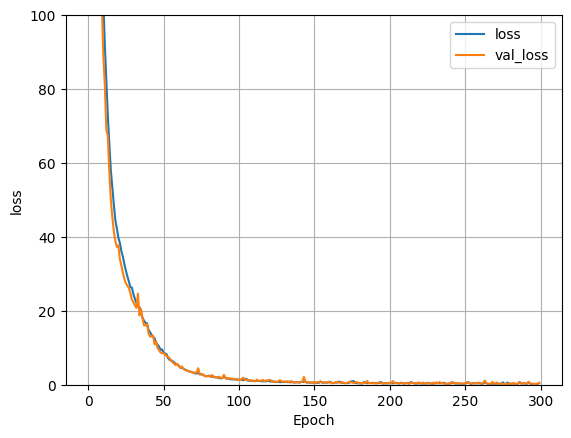

In [ ]:
%%time
history_o3_7 = model_o3_7.fit(X3_train, y3_train, epochs=300, batch_size=32, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_7)

In [ ]:
loss_pred_o3_7 = model_o3_7.evaluate(X3_test, y3_test)
y_pred_o3_7 = model_o3_7.predict(X3_test)
loss_pred_o3_7

18/18 [==============================] - 0s 1ms/step


0.604182243347168

In [ ]:
y_pred_o3_8_list = y_pred_o3_8.tolist()

ud_pred_8, uq_pred_8, Tq_pred_8 = get_output_list(y_pred_o3_8, y_pred_o3_8_list)
# ud_pred_3

MSE_o3_8, MAPE_o3_8, MSE_ud_8, MSE_uq_8, MSE_Tq_8, MAPE_ud_8, MAPE_uq_8, MAPE_Tq_8 = get_MSE_MAPE(y3_test, y_pred_o3_8, ud_pred_8, uq_pred_8, Tq_pred_8)

# print(MSE_o3_2, MAPE_o3_2)
# print(MSE_ud_7, MSE_uq_7, MSE_Tq_7)
# print(MAPE_ud_7, MAPE_uq_7, MAPE_Tq_7)

0.17599936115405485 0.07636423849383521 1.5601836504885114
0.017423190981450964 0.03826574167734377 0.017145961891663057


## NN batch 512

In [ ]:
# define regression model
def regression_model_o3_5():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_8 = regression_model_o3_5()
model_o3_8.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_108 (Dense)           (None, 50)                250       
                                                                 
 dense_109 (Dense)           (None, 50)                2550      
                                                                 
 dense_110 (Dense)           (None, 50)                2550      
                                                                 
 dense_111 (Dense)           (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 40s
Wall time: 1min 16s


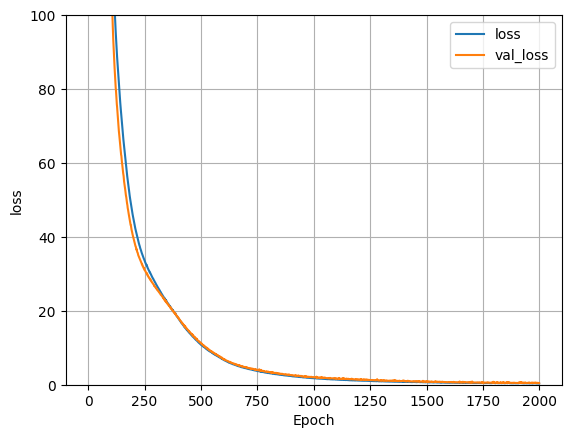

In [ ]:
%%time
history_o3_8 = model_o3_8.fit(X3_train, y3_train, epochs=2000, batch_size=512, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_8)

In [ ]:
loss_pred_o3_8 = model_o3_8.evaluate(X3_test, y3_test)
y_pred_o3_8 = model_o3_8.predict(X3_test)
loss_pred_o3_8

18/18 [==============================] - 0s 1ms/step


0.44979575276374817

In [ ]:
y_pred_o3_8_list = y_pred_o3_8.tolist()

ud_pred_8, uq_pred_8, Tq_pred_8 = get_output_list(y_pred_o3_8, y_pred_o3_8_list)
# ud_pred_3

MSE_o3_8, MAPE_o3_8, MSE_ud_8, MSE_uq_8, MSE_Tq_8, MAPE_ud_8, MAPE_uq_8, MAPE_Tq_8 = get_MSE_MAPE(y3_test, y_pred_o3_8, ud_pred_8, uq_pred_8, Tq_pred_8)

# print(MSE_o3_2, MAPE_o3_2)
# print(MSE_ud_7, MSE_uq_7, MSE_Tq_7)
# print(MAPE_ud_7, MAPE_uq_7, MAPE_Tq_7)

## NN Tq batch 256

In [ ]:
# define regression model
def regression_model_t():
#     create model
    model = Sequential()
    model.add(Dense(100, activation='relu', input_shape=(n_cols,)))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))

#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss='mean_squared_error')
    return model

model_t_0 = regression_model()
model_t_0.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_116 (Dense)           (None, 100)               700       
                                                                 
 dense_117 (Dense)           (None, 100)               10100     
                                                                 
 dense_118 (Dense)           (None, 50)                5050      
                                                                 
 dense_119 (Dense)           (None, 1)                 51        
                                                                 
Total params: 15,901
Trainable params: 15,901
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 46s
Wall time: 1min 15s


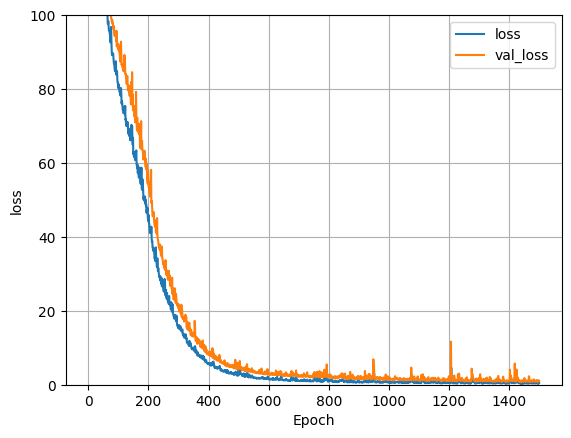

In [ ]:
%%time
history_t_0 = model_t_0.fit(X_train, y_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_t_0)

In [ ]:
loss_pred_t_0 = model_t_0.evaluate(X_test, y_test)
y_pred_t_0 = model_t_0.predict(X_test)
loss_pred_t_0

18/18 [==============================] - 0s 2ms/step


1.0467935800552368

In [ ]:
def get_loss(y_pred):
    MSE = mean_squared_error(y_test, y_pred)
    MAPE = mean_absolute_percentage_error(y_test, y_pred)
    print(MSE, MAPE)
    return MSE, MAPE

MSE_t_0, MAPE_0 = get_loss(y_pred_t_0)

1.0467912249923979 0.018848942126690468


## NN uq

In [ ]:
# define regression model
def regression_model_uq():
#     create model
    model_uq_0 = Sequential()
    model_uq_0.add(Dense(100, activation='relu', input_shape=(4,)))
    model_uq_0.add(Dense(100, activation='relu'))
    model_uq_0.add(Dense(50, activation='relu'))
    model_uq_0.add(Dense(1))

#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model_uq_0.compile(optimizer=opt, loss='mean_squared_error')
    return model_uq_0

model_uq_0 = regression_model_uq()
model_uq_0.summary()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_132 (Dense)           (None, 100)               500       
                                                                 
 dense_133 (Dense)           (None, 100)               10100     
                                                                 
 dense_134 (Dense)           (None, 50)                5050      
                                                                 
 dense_135 (Dense)           (None, 1)                 51        
                                                                 
Total params: 15,701
Trainable params: 15,701
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 8.28 s
Wall time: 5.83 s


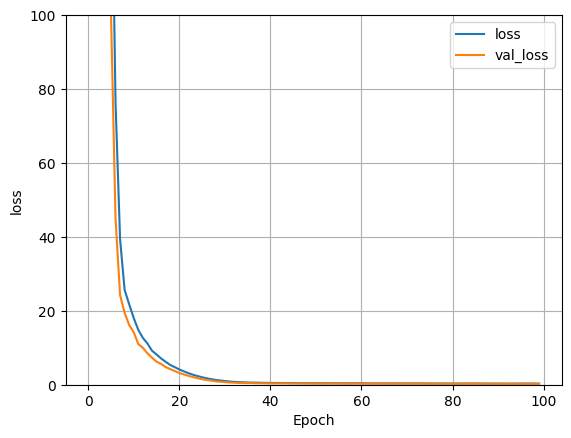

In [ ]:
%%time
history_uq_0 = model_uq_0.fit(Xuq_train, yuq_train, epochs=100, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_uq_0)

In [ ]:
loss_pred_uq_0 = model_uq_0.evaluate(Xuq_test, yuq_test)
y_pred_uq_0 = model_uq_0.predict(Xuq_test)
loss_pred_uq_0

18/18 [==============================] - 0s 1ms/step


0.26317983865737915

In [ ]:
def get_loss(y_test, y_pred):
    MSE = mean_squared_error(y_test, y_pred)
    MAPE = mean_absolute_percentage_error(y_test, y_pred)
    print(MSE, MAPE)
    return MSE, MAPE

MSE_uq_0, MAPE_uq_0 = get_loss(yuq_test, y_pred_uq_0)

0.26317985200297783 0.053326143216996164


In [ ]:
y_test_list_uq_0 = yuq_test.tolist()
y_pred_list_uq_0 = list(flatten_2d(y_pred_uq_0))
errors_uq_0 = get_errorList(y_pred_list_uq_0, y_test_list_uq_0)

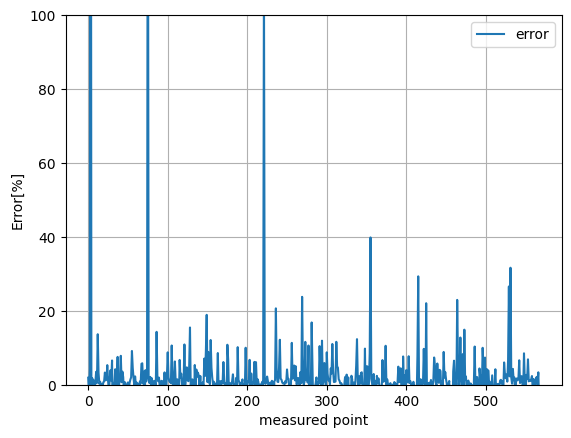

In [ ]:
  plt.plot(errors_uq_0, label='error')
#   plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 100])
  plt.xlabel('measured point')
  plt.ylabel('Error[%]')
  plt.legend()
  plt.grid(True)

## NN 3Os 2000 epochs

In [ ]:
# define regression model
def regression_model_o3_9():
    model_o3 = Sequential()
    model_o3.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(50, activation='relu'))
    model_o3.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt = keras.optimizers.Adam(learning_rate=0.001)
#     opt = keras.optimizers.SGD(learning_rate=0.001)
    model_o3.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3

model_o3_9 = regression_model_o3_5()
model_o3_9.summary()

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_136 (Dense)           (None, 50)                250       
                                                                 
 dense_137 (Dense)           (None, 50)                2550      
                                                                 
 dense_138 (Dense)           (None, 50)                2550      
                                                                 
 dense_139 (Dense)           (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 2min 16s
Wall time: 1min 40s


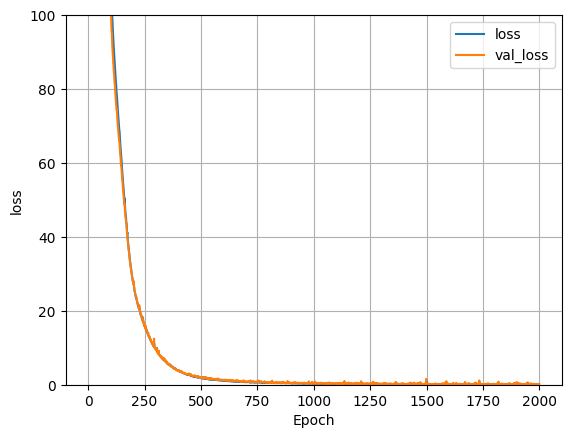

In [ ]:
%%time
history_o3_9 = model_o3_9.fit(X3_train, y3_train, epochs=2000, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_9)

In [ ]:
loss_pred_o3_9 = model_o3_9.evaluate(X3_test, y3_test)
y_pred_o3_9 = model_o3_9.predict(X3_test)
loss_pred_o3_9

18/18 [==============================] - 0s 2ms/step


0.14287811517715454

In [ ]:
y_pred_o3_9_list = y_pred_o3_9.tolist()

ud_pred_9, uq_pred_9, Tq_pred_9 = get_output_list(y_pred_o3_9, y_pred_o3_9_list)
# ud_pred_3

MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)

# print(MSE_o3_2, MAPE_o3_2)
# print(MSE_ud_7, MSE_uq_7, MSE_Tq_7)
# print(MAPE_ud_7, MAPE_uq_7, MAPE_Tq_7)

## NN 2nd exp

In [ ]:
def regression_model_o3_10():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_10 = regression_model_o3_10()
model_o3_10.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_148 (Dense)           (None, 50)                250       
                                                                 
 dense_149 (Dense)           (None, 50)                2550      
                                                                 
 dense_150 (Dense)           (None, 50)                2550      
                                                                 
 dense_151 (Dense)           (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 33s
Wall time: 1min 8s


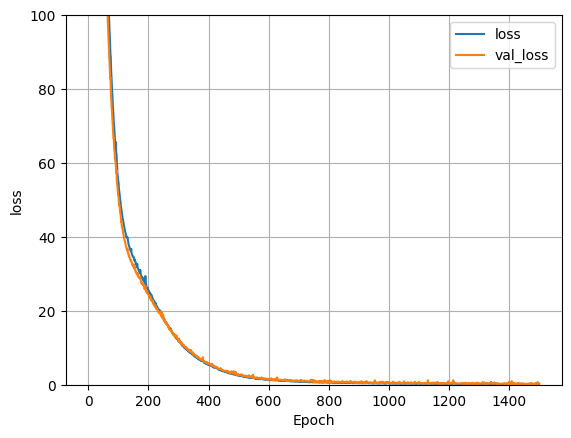

In [ ]:
%%time
history_o3_10 = model_o3_10.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_10)

In [ ]:
loss_pred_o3_10 = model_o3_10.evaluate(X3_test, y3_test)
y_pred_o3_10 = model_o3_10.predict(X3_test)
loss_pred_o3_10

18/18 [==============================] - 0s 1ms/step


0.3059261441230774

In [ ]:
y_pred_o3_10_list = y_pred_o3_10.tolist()

ud_pred_10, uq_pred_10, Tq_pred_10 = get_output_list(y_pred_o3_10, y_pred_o3_10_list)
# ud_pred_3

def get_MSE_MAPE_2(y3_test, y_pred, ud_pred, uq_pred, Tq_pred):
#     MSE = mean_squared_error(y3_test, y_pred)
    MSE_ud = mean_squared_error(y3_test['ud'], ud_pred)
    MSE_uq = mean_squared_error(y3_test['uq'], uq_pred)
    MSE_Tq = mean_squared_error(y3_test['Tq'], Tq_pred)
#     MAPE = mean_absolute_percentage_error(y3_test, y_pred)
    MAPE_ud = mean_absolute_percentage_error(y3_test['ud'], ud_pred)
    MAPE_uq = mean_absolute_percentage_error(y3_test['uq'], uq_pred)
    MAPE_Tq = mean_absolute_percentage_error(y3_test['Tq'], Tq_pred)
    print(MSE_ud, MSE_uq, MSE_Tq)
    print(MAPE_ud, MAPE_uq, MAPE_Tq)
#     return MSE, MAPE, MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq
    return MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq


# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_10, MSE_uq_10, MSE_Tq_10, MAPE_ud_10, MAPE_uq_10, MAPE_Tq_10 = get_MSE_MAPE_2(y3_test, y_pred_o3_10, ud_pred_10, uq_pred_10, Tq_pred_10)


0.19417418865567937 0.08042649470113507 0.6431783615344514
0.032134299038521594 0.04489232278999269 0.013289073343375786


## NN neuron 200

In [ ]:
def regression_model_o3_11():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(200, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_11 = regression_model_o3_11()
model_o3_11.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_156 (Dense)           (None, 200)               1000      
                                                                 
 dense_157 (Dense)           (None, 200)               40200     
                                                                 
 dense_158 (Dense)           (None, 200)               40200     
                                                                 
 dense_159 (Dense)           (None, 3)                 603       
                                                                 
Total params: 82,003
Trainable params: 82,003
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 2min 36s
Wall time: 1min 23s


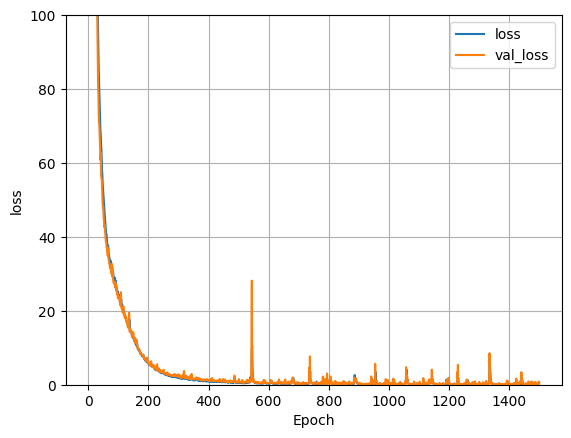

In [ ]:
%%time
history_o3_11 = model_o3_11.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_11)

In [ ]:
loss_pred_o3_11 = model_o3_11.evaluate(X3_test, y3_test)
y_pred_o3_11 = model_o3_11.predict(X3_test)
loss_pred_o3_11

18/18 [==============================] - 0s 2ms/step


0.3853885531425476

In [ ]:
y_pred_o3_11_list = y_pred_o3_11.tolist()

ud_pred_11, uq_pred_11, Tq_pred_11 = get_output_list(y_pred_o3_11, y_pred_o3_11_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_11, MSE_uq_11, MSE_Tq_11, MAPE_ud_11, MAPE_uq_11, MAPE_Tq_11 = get_MSE_MAPE_2(y3_test, y_pred_o3_11, ud_pred_11, uq_pred_11, Tq_pred_11)


0.07905990184913803 0.015306126504720175 1.061799601923573
0.023616136246060588 0.019527570060455718 0.031549149196870414


## NN hedden layer  +1

In [ ]:
def regression_model_o3_12():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_12 = regression_model_o3_12()
model_o3_12.summary()

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_169 (Dense)           (None, 50)                250       
                                                                 
 dense_170 (Dense)           (None, 50)                2550      
                                                                 
 dense_171 (Dense)           (None, 50)                2550      
                                                                 
 dense_172 (Dense)           (None, 50)                2550      
                                                                 
 dense_173 (Dense)           (None, 3)                 153       
                                                                 
Total params: 8,053
Trainable params: 8,053
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 31s
Wall time: 1min 8s


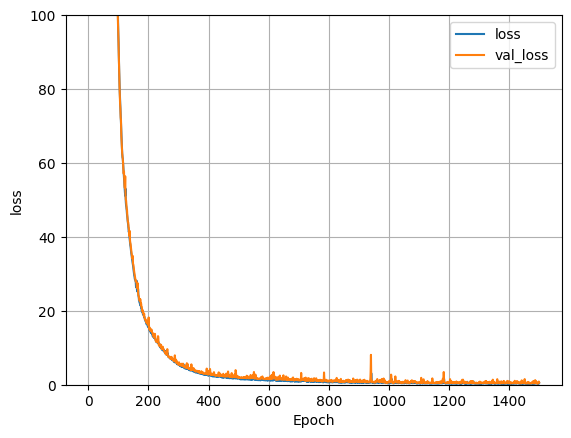

In [ ]:
%%time
history_o3_12 = model_o3_12.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_12)

In [ ]:
loss_pred_o3_12 = model_o3_12.evaluate(X3_test, y3_test)
y_pred_o3_12 = model_o3_12.predict(X3_test)
loss_pred_o3_12

18/18 [==============================] - 0s 1ms/step


0.6912484169006348

In [ ]:
y_pred_o3_12_list = y_pred_o3_12.tolist()

ud_pred_12, uq_pred_12, Tq_pred_12 = get_output_list(y_pred_o3_12, y_pred_o3_12_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_12, MSE_uq_12, MSE_Tq_12, MAPE_ud_12, MAPE_uq_12, MAPE_Tq_12 = get_MSE_MAPE_2(y3_test, y_pred_o3_12, ud_pred_12, uq_pred_12, Tq_pred_12)


0.26339668090238927 0.10516034122161733 1.7051885823810127
0.029237187785516955 0.06181379149198285 0.023978512755101974


## NN hl +2

In [ ]:
def regression_model_o3_13():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_13 = regression_model_o3_13()
model_o3_13.summary()

Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_174 (Dense)           (None, 50)                250       
                                                                 
 dense_175 (Dense)           (None, 50)                2550      
                                                                 
 dense_176 (Dense)           (None, 50)                2550      
                                                                 
 dense_177 (Dense)           (None, 50)                2550      
                                                                 
 dense_178 (Dense)           (None, 50)                2550      
                                                                 
 dense_179 (Dense)           (None, 3)                 153       
                                                                 
Total params: 10,603
Trainable params: 10,603
Non-tra

CPU times: total: 2min 2s
Wall time: 1min 26s


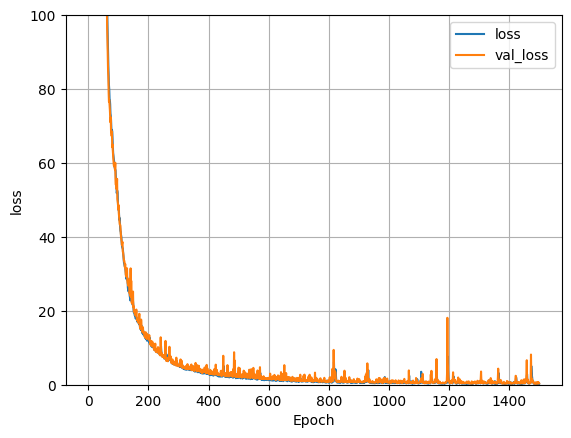

In [ ]:
%%time
history_o3_13 = model_o3_13.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_13)

In [ ]:
loss_pred_o3_13 = model_o3_13.evaluate(X3_test, y3_test)
y_pred_o3_13 = model_o3_13.predict(X3_test)
loss_pred_o3_13

18/18 [==============================] - 0s 2ms/step


0.41383621096611023

In [ ]:
y_pred_o3_13_list = y_pred_o3_13.tolist()

ud_pred_13, uq_pred_13, Tq_pred_13 = get_output_list(y_pred_o3_13, y_pred_o3_13_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_13, MSE_uq_13, MSE_Tq_13, MAPE_ud_13, MAPE_uq_13, MAPE_Tq_13 = get_MSE_MAPE_2(y3_test, y_pred_o3_13, ud_pred_13, uq_pred_13, Tq_pred_13)


0.3139646729908284 0.09295135177287625 0.8345933694533605
0.04071097187834156 0.058558563243337844 0.028535711390192325


## NN hl +3

In [ ]:
def regression_model_o3_14():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_14 = regression_model_o3_14()
model_o3_14.summary()

Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_238 (Dense)           (None, 50)                250       
                                                                 
 dense_239 (Dense)           (None, 50)                2550      
                                                                 
 dense_240 (Dense)           (None, 50)                2550      
                                                                 
 dense_241 (Dense)           (None, 50)                2550      
                                                                 
 dense_242 (Dense)           (None, 50)                2550      
                                                                 
 dense_243 (Dense)           (None, 50)                2550      
                                                                 
 dense_244 (Dense)           (None, 3)               

CPU times: total: 2min 10s
Wall time: 1min 24s


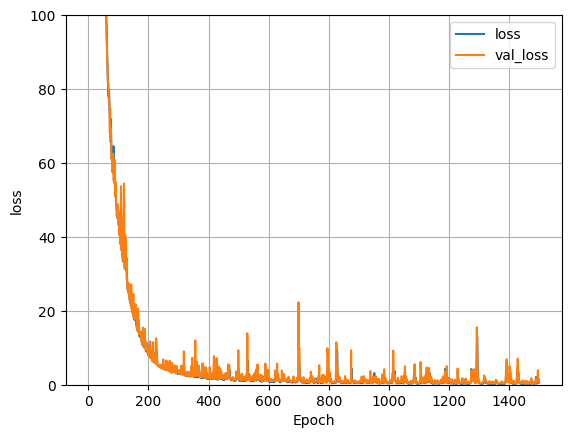

In [ ]:
%%time
history_o3_14 = model_o3_14.fit(X3_train, y3_train, epochs=1500, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_14)

In [ ]:
loss_pred_o3_14 = model_o3_14.evaluate(X3_test, y3_test)
y_pred_o3_14 = model_o3_14.predict(X3_test)
loss_pred_o3_14

18/18 [==============================] - 0s 2ms/step


1.2694509029388428

In [ ]:
y_pred_o3_14_list = y_pred_o3_14.tolist()

ud_pred_14, uq_pred_14, Tq_pred_14 = get_output_list(y_pred_o3_14, y_pred_o3_14_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_14, MSE_uq_14, MSE_Tq_14, MAPE_ud_14, MAPE_uq_14, MAPE_Tq_14 = get_MSE_MAPE_2(y3_test, y_pred_o3_14, ud_pred_14, uq_pred_14, Tq_pred_14)


0.3020345942383992 0.14068966904576993 3.365628739421837
0.03135821557288358 0.05665319701208873 0.02336508573106233


## NN hl -1

In [ ]:
def regression_model_o3_15():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
#     model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_15 = regression_model_o3_15()
model_o3_15.summary()

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_254 (Dense)           (None, 50)                250       
                                                                 
 dense_255 (Dense)           (None, 50)                2550      
                                                                 
 dense_256 (Dense)           (None, 3)                 153       
                                                                 
Total params: 2,953
Trainable params: 2,953
Non-trainable params: 0
_________________________________________________________________


CPU times: total: 1min 58s
Wall time: 1min 38s


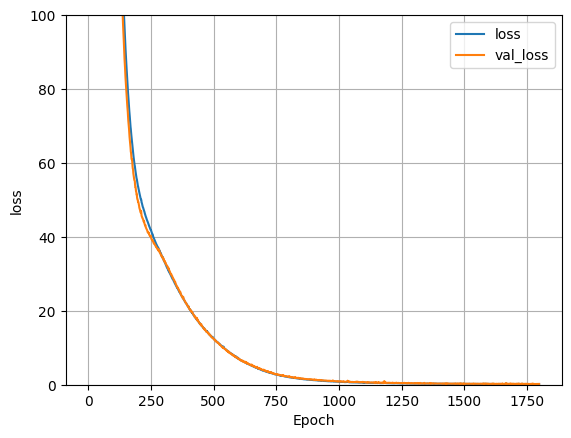

In [ ]:
%%time
history_o3_15 = model_o3_15.fit(X3_train, y3_train, epochs=1800, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_15)

In [ ]:
loss_pred_o3_15 = model_o3_15.evaluate(X3_test, y3_test)
y_pred_o3_15 = model_o3_15.predict(X3_test)
loss_pred_o3_15

18/18 [==============================] - 0s 2ms/step


0.2397034615278244

In [ ]:
y_pred_o3_15_list = y_pred_o3_15.tolist()

ud_pred_15, uq_pred_15, Tq_pred_15 = get_output_list(y_pred_o3_15, y_pred_o3_15_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_15, MSE_uq_15, MSE_Tq_15, MAPE_ud_15, MAPE_uq_15, MAPE_Tq_15 = get_MSE_MAPE_2(y3_test, y_pred_o3_15, ud_pred_15, uq_pred_15, Tq_pred_15)


0.09200095519196944 0.06882929837079285 0.5582806293994594
0.017001284523590017 0.03288151410399253 0.008149893613812683


In [ ]:
model_o3_15.save('model_o3_15_08.h5')

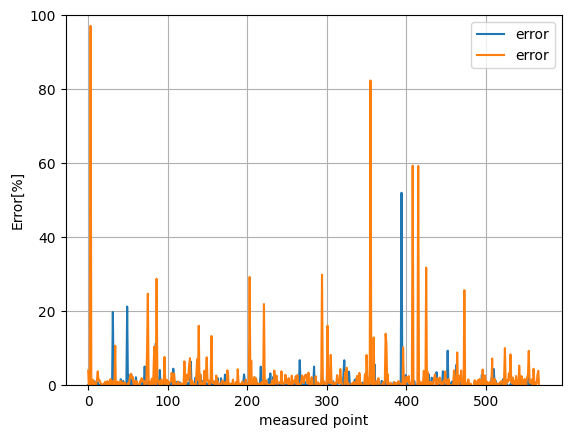

In [ ]:
errors_ud_15 = get_errorList(ud_pred_15, ud_test_list)
errors_uq_15 = get_errorList(uq_pred_15, uq_test_list)
errors_Tq_15 = get_errorList(Tq_pred_15, Tq_test_list)

# plot
plot_error(errors_ud_15)
plot_error(errors_uq_15)

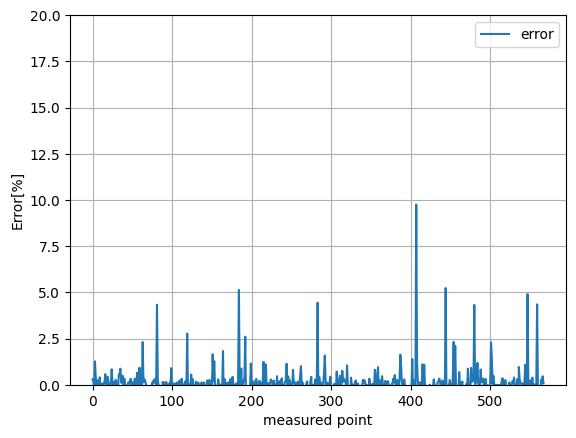

In [ ]:
plot_error_20(errors_Tq_15)

## NN dropout 0.1

In [ ]:
def regression_model_o3_16():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dropout(0.1))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.0005)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_16 = regression_model_o3_16()
model_o3_16.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_88 (Dense)            (None, 50)                250       
                                                                 
 dense_89 (Dense)            (None, 50)                2550      
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_90 (Dense)            (None, 50)                2550      
                                                                 
 dense_91 (Dense)            (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: user 1min 56s, sys: 3.16 s, total: 1min 59s
Wall time: 1min 58s


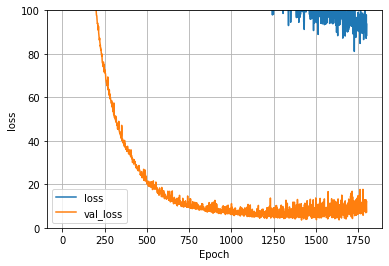

In [ ]:
%%time
history_o3_16 = model_o3_16.fit(X3_train, y3_train, epochs=1800, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_16)

In [ ]:
loss_pred_o3_16 = model_o3_16.evaluate(X3_test, y3_test)
y_pred_o3_16 = model_o3_16.predict(X3_test)
loss_pred_o3_16

18/18 [==============================] - 0s 2ms/step


7.014168739318848

In [ ]:
y_pred_o3_16_list = y_pred_o3_16.tolist()

ud_pred_16, uq_pred_16, Tq_pred_16 = get_output_list(y_pred_o3_16, y_pred_o3_16_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_16, MSE_uq_16, MSE_Tq_16, MAPE_ud_16, MAPE_uq_16, MAPE_Tq_16 = get_MSE_MAPE_2(y3_test, y_pred_o3_16, ud_pred_16, uq_pred_16, Tq_pred_16)


2.355779116324298 1.547070669350096 17.13965926391829
0.06764454833065371 0.20438133406124512 0.03365960911734704


In [ ]:
model_o3_16.save('model_o3_16_.h5')

## NN Adagrad

In [ ]:
def regression_model_o3_17():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(50, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_ag, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_17 = regression_model_o3_17()
model_o3_17.summary()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_103 (Dense)           (None, 50)                250       
                                                                 
 dense_104 (Dense)           (None, 50)                2550      
                                                                 
 dense_105 (Dense)           (None, 50)                2550      
                                                                 
 dense_106 (Dense)           (None, 3)                 153       
                                                                 
Total params: 5,503
Trainable params: 5,503
Non-trainable params: 0
_________________________________________________________________


CPU times: user 2min 3s, sys: 3.24 s, total: 2min 6s
Wall time: 2min 9s


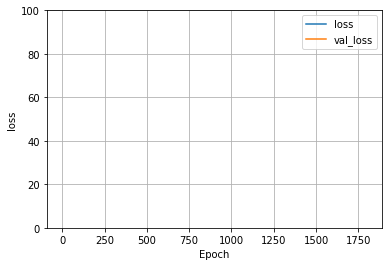

In [ ]:
%%time
history_o3_17 = model_o3_17.fit(X3_train, y3_train, epochs=1800, batch_size=256, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_17)

In [ ]:
loss_pred_o3_17 = model_o3_17.evaluate(X3_test, y3_test)
y_pred_o3_17 = model_o3_17.predict(X3_test)
loss_pred_o3_17

18/18 [==============================] - 0s 2ms/step


497.3314208984375

In [ ]:
y_pred_o3_17_list = y_pred_o3_17.tolist()

ud_pred_17, uq_pred_17, Tq_pred_17 = get_output_list(y_pred_o3_17, y_pred_o3_17_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_17, MSE_uq_17, MSE_Tq_17, MAPE_ud_17, MAPE_uq_17, MAPE_Tq_17 = get_MSE_MAPE_2(y3_test, y_pred_o3_17, ud_pred_17, uq_pred_17, Tq_pred_17)


77.09252700901996 326.0520162160685 1088.8498789613136
0.22906906882785585 2.1272625906083427 0.4275779031709051


## NN after gridsearch4

In [ ]:
def regression_model_o3_21():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(128, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(128, activation='relu'))
    model_o3_10.add(Dense(128, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.01)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_21 = regression_model_o3_21()
model_o3_21.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               640       
                                                                 
 dense_5 (Dense)             (None, 128)               16512     
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dense_7 (Dense)             (None, 3)                 387       
                                                                 
Total params: 34,051
Trainable params: 34,051
Non-trainable params: 0
_________________________________________________________________


CPU times: user 3min 57s, sys: 8.08 s, total: 4min 5s
Wall time: 3min 50s


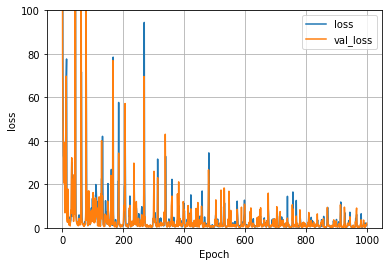

In [ ]:
%%time
history_o3_21 = model_o3_21.fit(X3_train, y3_train, epochs=1000, batch_size=32, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_21)

In [ ]:
loss_pred_o3_21 = model_o3_21.evaluate(X3_test, y3_test)
y_pred_o3_21 = model_o3_21.predict(X3_test)
loss_pred_o3_21

18/18 [==============================] - 0s 2ms/step


2.1989433765411377

In [ ]:
y_pred_o3_21_list = y_pred_o3_21.tolist()

ud_pred_21, uq_pred_21, Tq_pred_21 = get_output_list(y_pred_o3_21, y_pred_o3_21_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_21, MSE_uq_21, MSE_Tq_21, MAPE_ud_21, MAPE_uq_21, MAPE_Tq_21 = get_MSE_MAPE_2(y3_test, y_pred_o3_21, ud_pred_21, uq_pred_21, Tq_pred_21)


0.18508876348783468 0.6397275028407018 5.772013627552021
0.024453487043437905 0.15252876371852978 0.024140017395015034


##NN after grid-S o3 2

In [ ]:
def regression_model_o3_22():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(100, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(100, activation='relu'))
    model_o3_10.add(Dense(100, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_22 = regression_model_o3_22()
model_o3_22.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               500       
                                                                 
 dense_1 (Dense)             (None, 100)               10100     
                                                                 
 dense_2 (Dense)             (None, 100)               10100     
                                                                 
 dense_3 (Dense)             (None, 3)                 303       
                                                                 
Total params: 21,003
Trainable params: 21,003
Non-trainable params: 0
_________________________________________________________________


CPU times: user 1min 57s, sys: 5.34 s, total: 2min 3s
Wall time: 1min 52s


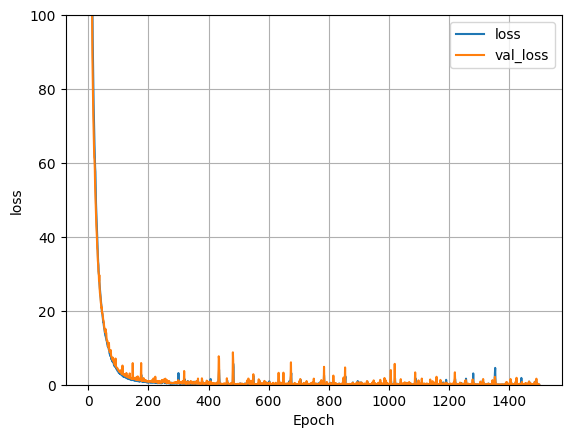

In [ ]:
%%time
history_o3_22 = model_o3_22.fit(X3_train, y3_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_22)

In [ ]:
loss_pred_o3_22 = model_o3_22.evaluate(X3_test, y3_test)
y_pred_o3_22 = model_o3_22.predict(X3_test)
loss_pred_o3_22

18/18 [==============================] - 0s 1ms/step


0.08138035237789154

In [ ]:
y_pred_o3_22_list = y_pred_o3_22.tolist()

ud_pred_22, uq_pred_22, Tq_pred_22 = get_output_list(y_pred_o3_22, y_pred_o3_22_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_22, MSE_uq_22, MSE_Tq_22, MAPE_ud_22, MAPE_uq_22, MAPE_Tq_22 = get_MSE_MAPE_2(y3_test, y_pred_o3_22, ud_pred_22, uq_pred_22, Tq_pred_22)


0.03696301360216701 0.010446780881671764 0.1967314676109665
0.007952283534032583 0.01829657262335985 0.01081441658845041


In [ ]:
model_o3_22.save("drive/My Drive/Jupyter/model/parameters/model_o3_22_30deg.h5")

In [ ]:
errors_ud_22 = get_errorList(ud_pred_22, ud_test_list)
errors_uq_22 = get_errorList(uq_pred_22, uq_test_list)
errors_Tq_22 = get_errorList(Tq_pred_22, Tq_test_list)
# errors_ud

NameError: ignored

In [ ]:
plot_error_40(errors_ud_22)
plot_error_40(errors_uq_22)

NameError: ignored

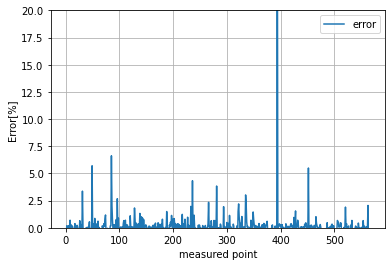

In [ ]:
plot_error_20(errors_ud_22)

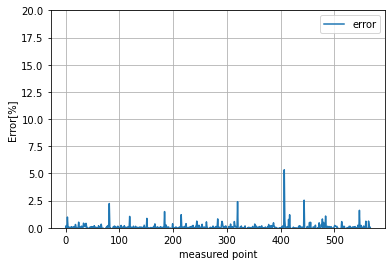

In [ ]:
plot_error_20(errors_Tq_22)

## NN grid_S after o3 3

In [ ]:
def regression_model_o3_23():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(200, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_23 = regression_model_o3_23()
model_o3_23.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 200)               1000      
                                                                 
 dense_1 (Dense)             (None, 200)               40200     
                                                                 
 dense_2 (Dense)             (None, 200)               40200     
                                                                 
 dense_3 (Dense)             (None, 3)                 603       
                                                                 
Total params: 82,003
Trainable params: 82,003
Non-trainable params: 0
_________________________________________________________________


CPU times: user 5min 10s, sys: 13.8 s, total: 5min 24s
Wall time: 5min 23s


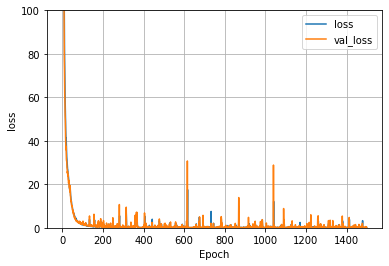

In [ ]:
%%time
history_o3_23 = model_o3_23.fit(X3_train, y3_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_23)

In [ ]:
loss_pred_o3_23 = model_o3_23.evaluate(X3_test, y3_test)
y_pred_o3_23 = model_o3_23.predict(X3_test)
loss_pred_o3_23

y_pred_o3_23_list = y_pred_o3_23.tolist()

ud_pred_23, uq_pred_23, Tq_pred_23 = get_output_list(y_pred_o3_23, y_pred_o3_23_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_23, MSE_uq_23, MSE_Tq_23, MAPE_ud_23, MAPE_uq_23, MAPE_Tq_23 = get_MSE_MAPE_2(y3_test, y_pred_o3_23, ud_pred_23, uq_pred_23, Tq_pred_23)


18/18 [==============================] - 0s 3ms/step
0.024454778209528974 0.019964963014633196 0.5172354349274753
0.012431179734099214 0.017588790956516588 0.014853730829402622


### load model

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/model_o3_23.h5')

In [ ]:
loss_pred_o3_23 = saved_model.evaluate(X3_test, y3_test)
y_pred_o3_23 = saved_model.predict(X3_test)
loss_pred_o3_23

y_pred_o3_23_list = y_pred_o3_23.tolist()

ud_pred_23, uq_pred_23, Tq_pred_23 = get_output_list(y_pred_o3_23, y_pred_o3_23_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_23, MSE_uq_23, MSE_Tq_23, MAPE_ud_23, MAPE_uq_23, MAPE_Tq_23 = get_MSE_MAPE_2(y3_test, y_pred_o3_23, ud_pred_23, uq_pred_23, Tq_pred_23)


18/18 [==============================] - 0s 2ms/step
0.024454778209528974 0.019964963014633196 0.5172354349274753
0.012431179734099214 0.017588790956516588 0.014853730829402622


### Tq ud uq graph

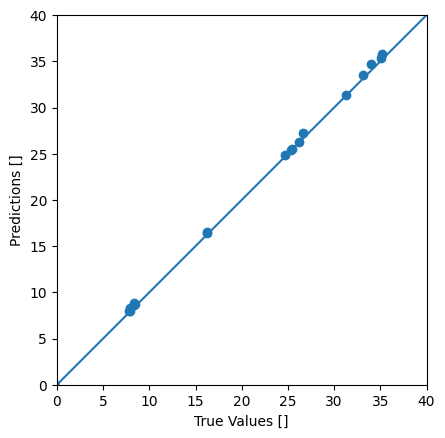

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_test_list, Tq_pred_23)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

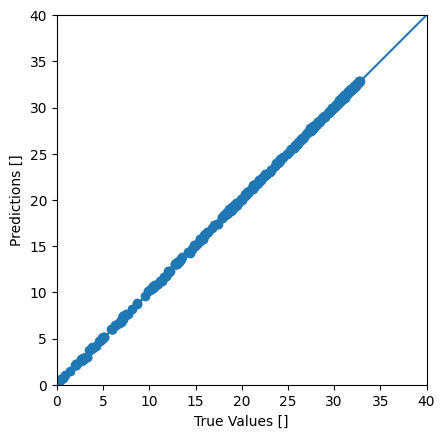

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_test_list, uq_pred_23)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

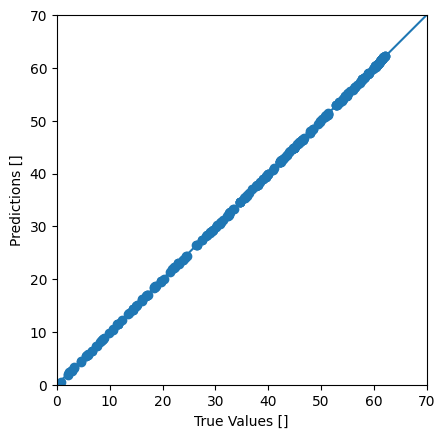

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_test_list, ud_pred_23)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

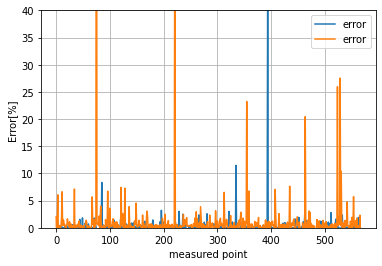

In [ ]:
errors_ud_23 = get_errorList(ud_pred_23, ud_test_list)
errors_uq_23 = get_errorList(uq_pred_23, uq_test_list)
errors_Tq_23 = get_errorList(Tq_pred_23, Tq_test_list)
# errors_ud
plot_error_40(errors_ud_23)
plot_error_40(errors_uq_23)

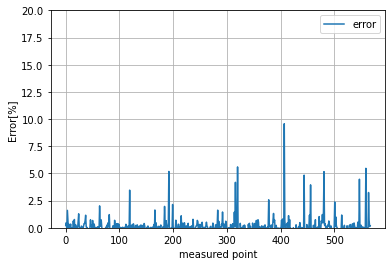

In [ ]:
plot_error_20(errors_Tq_23)

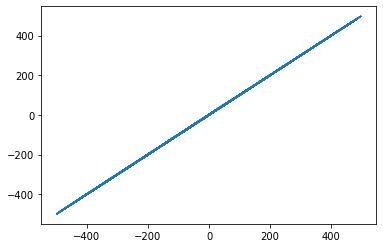

In [ ]:
# plot
fig, ax = plt.subplots()

# ax.plot(Tq_test_list, Tq_pred_23, linewidth=2.0)
ax.plot(Tq_test_list, Tq_pred_23)
# ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
#        ylim=(0, 8), yticks=np.arange(1, 8))

plt.show()

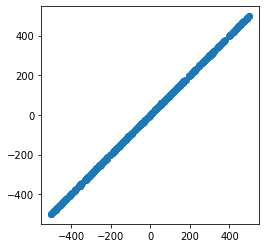

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_test_list, Tq_pred_23)

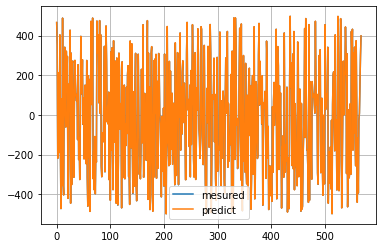

In [ ]:
  plt.plot(Tq_test_list, label='mesured')
  plt.plot(Tq_pred_23, label='predict')
  # plt.ylim([0, 40])
  plt.xlabel('')
  plt.ylabel('')
  plt.legend()
  plt.grid(True)

## NN gird_s after o3 3-2

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(200, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(200, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 200)               1000      
                                                                 
 dense_5 (Dense)             (None, 200)               40200     
                                                                 
 dense_6 (Dense)             (None, 200)               40200     
                                                                 
 dense_7 (Dense)             (None, 3)                 603       
                                                                 
Total params: 82,003
Trainable params: 82,003
Non-trainable params: 0
_________________________________________________________________


CPU times: user 5min 30s, sys: 13.8 s, total: 5min 44s
Wall time: 5min 15s


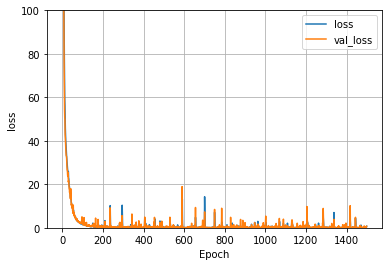

In [ ]:
%%time
history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

In [ ]:
loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)


18/18 [==============================] - 0s 2ms/step
0.13964340880473353 0.043457545844400904 2.169948087232716
0.025572627175144594 0.0429493172667099 0.01375358534143961


# Grid search

## gridsearch1 Adam

In [ ]:
# define regression model
def regression_model1_cv(optimizer='adam'):
    model1_2 = Sequential()
    model1_2.add(Dense(50, activation='relu', input_shape=(n_cols,)))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    # opt = keras.optimizers.Adam(learning_rate=0.001)
    opt = keras.optimizers.Adam(learning_rate=0.0001)
    model1_2.compile(optimizer=optimizer, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model1_2

model1_cv = regression_model1_cv()
model1_cv.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                350       
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5,501
Trainable params: 5,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# create the sklearn model for the network
from keras.wrappers.scikit_learn import KerasRegressor

batch_size = 128
epochs = 1000

model_batch_epoch_CV = KerasRegressor(build_fn=regression_model1_cv,  epochs=epochs,
                           batch_size=batch_size, verbose=1)


<ipython-input-41-eb9e95dc16f2>:7: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_batch_epoch_CV = KerasRegressor(build_fn=regression_model1_cv,  epochs=epochs,


In [ ]:
# model_batch_epoch_CV.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
from sklearn.model_selection import GridSearchCV
# batches = [128, 256]
# epochs = [100, 1000]
# activation = ['relu', 'sigmoid']
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

# param_grid = dict(epochs=epochs, batch_size=batch_size)
param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model_batch_epoch_CV, param_grid=param_grid)
grid_result = grid.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
Epoch 503/1000
15/15 [==============================] - 0s 3ms/step - loss: 1.2531
Epoch 504/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.3977
Epoch 505/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.4628
Epoch 506/1000
15/15 [==============================] - 0s 2ms/step - loss: 2.1451
Epoch 507/1000
15/15 [==============================] - 0s 4ms/step - loss: 1.7780
Epoch 508/1000
15/15 [==============================] - 0s 3ms/step - loss: 1.2668
Epoch 509/1000
15/15 [==============================] - 0s 3ms/step - loss: 1.2964
Epoch 510/1000
15/15 [==============================] - 0s 3ms/step - loss: 1.6404
Epoch 511/1000
15/15 [==============================] - 0s 3ms/step - loss: 1.4469
Epoch 512/1000
15/15 [==============================] - 0s 4ms/step - loss: 1.4539
Epoch 513/1000
15/15 [==============================] - 0s 3ms/step - loss: 2.3122
Epoch 514/1000
15/15 [==============

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [            nan -7.61996980e+00 -3.22943140e+02 -2.95781753e+04
 -1.10832981e+00 -1.33907710e+00 -1.89145219e+00]
  warnings.warn(


Epoch 1/1000
18/18 [==============================] - 2s 2ms/step - loss: 72711.5156
Epoch 2/1000
18/18 [==============================] - 0s 2ms/step - loss: 72172.6016
Epoch 3/1000
18/18 [==============================] - 0s 3ms/step - loss: 70830.5078
Epoch 4/1000
18/18 [==============================] - 0s 2ms/step - loss: 67565.5312
Epoch 5/1000
18/18 [==============================] - 0s 2ms/step - loss: 60598.6562
Epoch 6/1000
18/18 [==============================] - 0s 2ms/step - loss: 48510.6523
Epoch 7/1000
18/18 [==============================] - 0s 2ms/step - loss: 32078.9883
Epoch 8/1000
18/18 [==============================] - 0s 2ms/step - loss: 16210.3633
Epoch 9/1000
18/18 [==============================] - 0s 3ms/step - loss: 6308.1079
Epoch 10/1000
18/18 [==============================] - 0s 4ms/step - loss: 2462.5173
Epoch 11/1000
18/18 [==============================] - 0s 3ms/step - loss: 1216.5566
Epoch 12/1000
18/18 [==============================] - 0s 3ms/step

In [ ]:
# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Best Accuracy for -1.108 using {'optimizer': 'Adam'}
mean=nan, std=nan using {'optimizer': 'SGD'}
mean=-7.62, std=2.863 using {'optimizer': 'RMSprop'}
mean=-322.9, std=57.12 using {'optimizer': 'Adagrad'}
mean=-2.958e+04, std=2.152e+04 using {'optimizer': 'Adadelta'}
mean=-1.108, std=0.2362 using {'optimizer': 'Adam'}
mean=-1.339, std=0.5303 using {'optimizer': 'Adamax'}
mean=-1.891, std=1.201 using {'optimizer': 'Nadam'}


## Grid search2

In [ ]:
# define regression model
def regression_model1_cv2():
    model1_2 = Sequential()
    model1_2.add(Dense(50, activation='relu', input_shape=(n_inputs,)))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(3))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.0001)
    # opt = keras.optimizers.Adam(learning_rate=0.001)
    model1_2.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model1_2

model1_cv2 = regression_model1_cv2()
model1_cv2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                250       
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5,401
Trainable params: 5,401
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# create the sklearn model for the network
from keras.wrappers.scikit_learn import KerasRegressor

batch_size = 128
epochs = 1000

model_batch_epoch_CV2 = KerasRegressor(build_fn=regression_model1_cv2,  epochs=epochs,
                           batch_size=batch_size, verbose=0)


In [ ]:
from sklearn.model_selection import GridSearchCV
batch_size = [32, 64, 128, 256]
epochs = [100, 500, 1000]
# activation = ['relu', 'sigmoid']
# optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

param_grid = dict(epochs=epochs, batch_size=batch_size)
# param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model_batch_epoch_CV2, param_grid=param_grid)
grid_result = grid.fit(X3_4r_train, y3_4r_train)

In [ ]:
# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Best Accuracy for -1.161 using {'batch_size': 32, 'epochs': 1000}
mean=-145.0, std=11.85 using {'batch_size': 32, 'epochs': 100}
mean=-9.177, std=3.412 using {'batch_size': 32, 'epochs': 500}
mean=-1.161, std=0.2993 using {'batch_size': 32, 'epochs': 1000}
mean=-204.9, std=33.16 using {'batch_size': 64, 'epochs': 100}
mean=-43.91, std=8.383 using {'batch_size': 64, 'epochs': 500}
mean=-3.971, std=0.2252 using {'batch_size': 64, 'epochs': 1000}
mean=-1.82e+03, std=252.3 using {'batch_size': 128, 'epochs': 100}
mean=-108.8, std=2.966 using {'batch_size': 128, 'epochs': 500}
mean=-27.9, std=4.801 using {'batch_size': 128, 'epochs': 1000}
mean=-4.375e+04, std=1.827e+03 using {'batch_size': 256, 'epochs': 100}
mean=-156.3, std=19.5 using {'batch_size': 256, 'epochs': 500}
mean=-88.37, std=8.141 using {'batch_size': 256, 'epochs': 1000}


## gridsearch 3

In [ ]:
# define regression model
def regression_model1_cv3():
    model1_2 = Sequential()
    model1_2.add(Dense(50, activation='relu', input_shape=(n_cols,)))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(50, activation='relu'))
    model1_2.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    opt = keras.optimizers.Adam(learning_rate=0.0001)
    # opt = keras.optimizers.Adam(learning_rate=0.001)
    model1_2.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model1_2

model1_cv3 = regression_model1_cv3()
model1_cv3.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                350       
                                                                 
 dense_1 (Dense)             (None, 50)                2550      
                                                                 
 dense_2 (Dense)             (None, 50)                2550      
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5,501
Trainable params: 5,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# create the sklearn model for the network
from keras.wrappers.scikit_learn import KerasRegressor

batch_size = 128
epochs = 1000

model_batch_epoch_CV3 = KerasRegressor(build_fn=regression_model1_cv3,  epochs=epochs,
                           batch_size=batch_size, verbose=1)


<ipython-input-45-28d473e9e012>:7: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_batch_epoch_CV3 = KerasRegressor(build_fn=regression_model1_cv3,  epochs=epochs,


In [ ]:
from sklearn.model_selection import GridSearchCV
batch_size = [32, 64, 128, 256]
epochs = [100, 500, 1000]
# activation = ['relu', 'sigmoid']
# optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']

param_grid = dict(epochs=epochs, batch_size=batch_size)
# param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model_batch_epoch_CV3, param_grid=param_grid)
grid_result = grid.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
Epoch 804/1000
15/15 [==============================] - 0s 5ms/step - loss: 42.3225
Epoch 805/1000
15/15 [==============================] - 0s 4ms/step - loss: 42.2852
Epoch 806/1000
15/15 [==============================] - 0s 4ms/step - loss: 42.1903
Epoch 807/1000
15/15 [==============================] - 0s 4ms/step - loss: 41.6619
Epoch 808/1000
15/15 [==============================] - 0s 5ms/step - loss: 41.5483
Epoch 809/1000
15/15 [==============================] - 0s 6ms/step - loss: 42.0304
Epoch 810/1000
15/15 [==============================] - 0s 5ms/step - loss: 41.6711
Epoch 811/1000
15/15 [==============================] - 0s 5ms/step - loss: 41.0907
Epoch 812/1000
15/15 [==============================] - 0s 5ms/step - loss: 41.1085
Epoch 813/1000
15/15 [==============================] - 0s 4ms/step - loss: 40.9902
Epoch 814/1000
15/15 [==============================] - 0s 4ms/step - loss: 40.8964
Epoch 815/1000
15/15 [===

2/2 [==============================] - 0s 9ms/step - loss: 43691.3047
Epoch 1/100
8/8 [==============================] - 3s 5ms/step - loss: 72683.5859
Epoch 2/100
8/8 [==============================] - 0s 5ms/step - loss: 72667.6641
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 72652.3125
Epoch 4/100
8/8 [==============================] - 0s 5ms/step - loss: 72636.9609
Epoch 5/100
8/8 [==============================] - 0s 5ms/step - loss: 72621.5078
Epoch 6/100
8/8 [==============================] - 0s 6ms/step - loss: 72605.8359
Epoch 7/100
8/8 [==============================] - 0s 6ms/step - loss: 72589.8359
Epoch 8/100
8/8 [==============================] - 0s 5ms/step - loss: 72573.1797
Epoch 9/100
8/8 [==============================] - 0s 6ms/step - loss: 72556.0078
Epoch 10/100
8/8 [==============================] - 0s 5ms/step - loss: 72537.8281
Epoch 11/100
8/8 [==============================] - 0s 5ms/step - loss: 72518.5469
Epoch 12/100
8/8 [========

Streaming output truncated to the last 5000 lines.
8/8 [==============================] - 0s 5ms/step - loss: 136.1822
Epoch 503/1000
8/8 [==============================] - 0s 5ms/step - loss: 136.1615
Epoch 504/1000
8/8 [==============================] - 0s 5ms/step - loss: 136.1930
Epoch 505/1000
8/8 [==============================] - 0s 5ms/step - loss: 136.8049
Epoch 506/1000
8/8 [==============================] - 0s 5ms/step - loss: 136.7049
Epoch 507/1000
8/8 [==============================] - 0s 4ms/step - loss: 135.6551
Epoch 508/1000
8/8 [==============================] - 0s 5ms/step - loss: 135.6293
Epoch 509/1000
8/8 [==============================] - 0s 5ms/step - loss: 135.3274
Epoch 510/1000
8/8 [==============================] - 0s 5ms/step - loss: 134.9348
Epoch 511/1000
8/8 [==============================] - 0s 5ms/step - loss: 134.7144
Epoch 512/1000
8/8 [==============================] - 0s 5ms/step - loss: 134.7374
Epoch 513/1000
8/8 [==============================]

In [ ]:
# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Best Accuracy for -1.232 using {'batch_size': 32, 'epochs': 1000}
mean=-139.2, std=3.836 using {'batch_size': 32, 'epochs': 100}
mean=-8.569, std=1.069 using {'batch_size': 32, 'epochs': 500}
mean=-1.232, std=0.1629 using {'batch_size': 32, 'epochs': 1000}
mean=-196.0, std=16.01 using {'batch_size': 64, 'epochs': 100}
mean=-43.0, std=10.0 using {'batch_size': 64, 'epochs': 500}
mean=-3.877, std=1.28 using {'batch_size': 64, 'epochs': 1000}
mean=-2.265e+03, std=1.13e+03 using {'batch_size': 128, 'epochs': 100}
mean=-101.3, std=7.835 using {'batch_size': 128, 'epochs': 500}
mean=-24.76, std=7.926 using {'batch_size': 128, 'epochs': 1000}
mean=-4.458e+04, std=2.381e+03 using {'batch_size': 256, 'epochs': 100}
mean=-157.0, std=11.78 using {'batch_size': 256, 'epochs': 500}
mean=-91.13, std=8.359 using {'batch_size': 256, 'epochs': 1000}


## grid search4

In [ ]:
# define regression model
def regression_model1_cv4(hidden_layers=2, neurons=50):
    model = Sequential()
    model.add(Dense(units=neurons, activation='relu', input_shape=(n_cols,)))
    for i in range(hidden_layers):
        model.add(Dense(units=neurons, activation='relu'))
    model.add(Dense(units=1))

#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    # opt = keras.optimizers.Adam(learning_rate=0.0001)
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model

model_cv4 = regression_model1_cv4()
model_cv4.summary()

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_144 (Dense)           (None, 50)                350       
                                                                 
 dense_145 (Dense)           (None, 50)                2550      
                                                                 
 dense_146 (Dense)           (None, 50)                2550      
                                                                 
 dense_147 (Dense)           (None, 1)                 51        
                                                                 
Total params: 5,501
Trainable params: 5,501
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# create the sklearn model for the network
from keras.wrappers.scikit_learn import KerasRegressor

batch_size = 32
epochs = 1000

model_CV4 = KerasRegressor(build_fn=regression_model1_cv4,  epochs=epochs,
                           batch_size=batch_size, verbose=1)


<ipython-input-72-c1649a7709aa>:7: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_CV4 = KerasRegressor(build_fn=regression_model1_cv4,  epochs=epochs,


In [ ]:
from sklearn.model_selection import GridSearchCV
# batch_size = [32, 64, 128, 256]
# epochs = [100, 500, 1000]
# activation = ['relu', 'sigmoid']
# optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
neurons = [32, 64, 128]
hidden_layers = [0, 1, 2, 3, 4]

param_grid = dict(hidden_layers=hidden_layers, neurons=neurons)
# param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model_CV4, param_grid=param_grid, cv=2)
grid_result = grid.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
36/36 [==============================] - 0s 6ms/step - loss: 1.5253
Epoch 503/1000
36/36 [==============================] - 0s 6ms/step - loss: 1.5488
Epoch 504/1000
36/36 [==============================] - 0s 5ms/step - loss: 1.4730
Epoch 505/1000
36/36 [==============================] - 0s 6ms/step - loss: 2.1886
Epoch 506/1000
36/36 [==============================] - 0s 5ms/step - loss: 1.6251
Epoch 507/1000
36/36 [==============================] - 0s 7ms/step - loss: 1.1736
Epoch 508/1000
36/36 [==============================] - 0s 5ms/step - loss: 1.4886
Epoch 509/1000
36/36 [==============================] - 0s 6ms/step - loss: 1.6722
Epoch 510/1000
36/36 [==============================] - 0s 6ms/step - loss: 1.3648
Epoch 511/1000
36/36 [==============================] - 0s 6ms/step - loss: 1.4981
Epoch 512/1000
36/36 [==============================] - 0s 5ms/step - loss: 2.6552
Epoch 513/1000
36/36 [=============================

In [ ]:
# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Best Accuracy for -1.712 using {'hidden_layers': 2, 'neurons': 128}
mean=-256.9, std=11.29 using {'hidden_layers': 0, 'neurons': 32}
mean=-228.2, std=11.05 using {'hidden_layers': 0, 'neurons': 64}
mean=-177.4, std=5.215 using {'hidden_layers': 0, 'neurons': 128}
mean=-54.72, std=3.006 using {'hidden_layers': 1, 'neurons': 32}
mean=-12.94, std=2.092 using {'hidden_layers': 1, 'neurons': 64}
mean=-2.729, std=0.5114 using {'hidden_layers': 1, 'neurons': 128}
mean=-9.817, std=1.319 using {'hidden_layers': 2, 'neurons': 32}
mean=-2.463, std=0.2044 using {'hidden_layers': 2, 'neurons': 64}
mean=-1.712, std=0.2057 using {'hidden_layers': 2, 'neurons': 128}
mean=-9.891, std=2.042 using {'hidden_layers': 3, 'neurons': 32}
mean=-3.701, std=0.2525 using {'hidden_layers': 3, 'neurons': 64}
mean=-1.964, std=0.2365 using {'hidden_layers': 3, 'neurons': 128}
mean=-5.379, std=0.7112 using {'hidden_layers': 4, 'neurons': 32}
mean=-3.038, std=0.2497 using {'hidden_layers': 4, 'neurons': 64}
mean=-1.755

In [ ]:
# from keras.wrappers.scikit_learn import KerasRegressor
# from sklearn.model_selection import GridSearchCV

# # define the grid of possible values for the number of hidden layers and neurons
# param_grid = {'hidden_layers': [0, 1, 2, 3, 4], 'neurons': [32, 64, 128]}

# # create a TensorFlow regression model using Keras API
# model_hl_neuron_cv = KerasRegressor(build_fn=model_cv4, epochs=1000, batch_size=32, verbose=1)

# grid = GridSearchCV(estimator=model_hl_neuron_cv, param_grid=param_grid, cv=2)
# grid_result = grid.fit(X_train, y_train)

In [ ]:
# define regression model
def regression_model1_cv5(hidden_layers=2, neurons=128, learning_rate=0.01):
    model = Sequential()
    model.add(Dense(units=neurons, activation='relu', input_shape=(n_cols,)))
    for i in range(hidden_layers):
        model.add(Dense(units=neurons, activation='relu'))
    model.add(Dense(units=1))

#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
#     model.compile(optimizer='adam', loss='mean_squared_error')
    # opt = keras.optimizers.Adam(learning_rate=0.0001)
    opt = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=opt, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model

model_cv5 = regression_model1_cv5()
model_cv5.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 128)               896       
                                                                 
 dense_5 (Dense)             (None, 128)               16512     
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 34,049
Trainable params: 34,049
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# create the sklearn model for the network
from keras.wrappers.scikit_learn import KerasRegressor

batch_size = 32
epochs = 1000

model_CV5 = KerasRegressor(build_fn=regression_model1_cv5,  epochs=epochs,
                           batch_size=batch_size, verbose=1)

<ipython-input-80-11357f182209>:7: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_CV5 = KerasRegressor(build_fn=regression_model1_cv5,  epochs=epochs,


In [ ]:
from sklearn.model_selection import GridSearchCV
# batch_size = [32, 64, 128, 256]
# epochs = [100, 500, 1000]
# activation = ['relu', 'sigmoid']
# optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
# neurons = [32, 64, 128]
# hidden_layers = [0, 1, 2, 3, 4]
learning_rate = [0.1, 0.01, 0.001, 0.0001]

param_grid = dict(learning_rate=learning_rate)
# param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model_CV5, param_grid=param_grid, cv=2)
grid_result = grid.fit(X_train, y_train)

Streaming output truncated to the last 5000 lines.
36/36 [==============================] - 0s 5ms/step - loss: 0.6699
Epoch 503/1000
36/36 [==============================] - 0s 5ms/step - loss: 3.1515
Epoch 504/1000
36/36 [==============================] - 0s 5ms/step - loss: 3.4226
Epoch 505/1000
36/36 [==============================] - 0s 5ms/step - loss: 0.5779
Epoch 506/1000
36/36 [==============================] - 0s 5ms/step - loss: 0.9433
Epoch 507/1000
36/36 [==============================] - 0s 4ms/step - loss: 0.4600
Epoch 508/1000
36/36 [==============================] - 0s 5ms/step - loss: 0.5406
Epoch 509/1000
36/36 [==============================] - 0s 4ms/step - loss: 0.6261
Epoch 510/1000
36/36 [==============================] - 0s 4ms/step - loss: 0.4123
Epoch 511/1000
36/36 [==============================] - 0s 4ms/step - loss: 1.3077
Epoch 512/1000
36/36 [==============================] - 0s 5ms/step - loss: 1.4109
Epoch 513/1000
36/36 [=============================

In [ ]:
# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Best Accuracy for -0.5724 using {'learning_rate': 0.01}
mean=-1.321, std=0.7261 using {'learning_rate': 0.1}
mean=-0.5724, std=0.001978 using {'learning_rate': 0.01}
mean=-2.206, std=1.908 using {'learning_rate': 0.001}
mean=-2.781, std=2.059 using {'learning_rate': 0.0001}


## gridsearch out3/ neuron, batch, epoch

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32):
    model = keras.Sequential([
        keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'),
        keras.layers.Dense(num_neurons, activation='relu'),
        keras.layers.Dense(num_outputs)
    ])
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [32, 64, 128],
    'batch_size': [16, 32, 64],
    'epochs': [50, 100, 200]
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

# # Print the best hyperparameters and corresponding mean squared error
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


<ipython-input-75-ba52a159254d>:28: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best Accuracy for -1.09 using {'batch_size': 64, 'epochs': 200, 'num_neurons': 128}
mean=-14.81, std=5.687 using {'batch_size': 16, 'epochs': 50, 'num_neurons': 32}
mean=-8.146, std=1.924 using {'batch_size': 16, 'epochs': 50, 'num_neurons': 64}
mean=-6.046, std=2.174 using {'batch_size': 16, 'epochs': 50, 'num_neurons': 128}
mean=-4.651, std=2.99 using {'batch_size': 16, 'epochs': 100, 'num_neurons': 32}
mean=-2.34, std=1.406 using {'batch_size': 16, 'epochs': 100, 'num_neurons': 64}
mean=-5.016, std=4.312 using {'batch_size': 16, 'epochs': 100, 'num_neurons': 128}
mean=-1.853, std=0.4187 using {'batch_size': 16, 'epochs': 200, 'num_neurons': 32}
mean=-1.411, std=0.5822 using {'batch_size': 16, 'epochs': 200, 'num_neurons': 64}
mean=-2.426, std=1.593 using {'batch_size': 16, 'epochs': 200, 'num_neurons': 128}
mean=-39.91, std=3.003 using {'batch_size': 32, 'epochs': 50, 'num_neurons': 32}
mean=-23.58, std=5.892 using {'batch_size': 32, 'epochs': 50, 'num_neurons': 64}
mean=-10.19, std

## grid search out3 2

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32):
    model = keras.Sequential([
        keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'),
        keras.layers.Dense(num_neurons, activation='relu'),
        keras.layers.Dense(num_outputs)
    ])
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [25, 50, 100],
    'batch_size': [64],
    'epochs': [200]
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=2, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


<ipython-input-45-e2de4ebcb0f5>:28: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.076969 using {'batch_size': 64, 'epochs': 1500, 'num_neurons': 100}


## grid search o3 3/ neuron , batch, hidden

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [100, 200],
    'batch_size': [64, 128],
    'epochs': [200],
    'learning_rate': [0.001],
    'num_hidden_layers': [1, 2, 3],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')


<ipython-input-76-e0a00876fd2a>:33: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best Accuracy for -1.755 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 100}
mean=-17.5, std=2.161 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 1, 'num_neurons': 100}
mean=-15.33, std=2.671 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 1, 'num_neurons': 200}
mean=-1.755, std=0.619 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 100}
mean=-2.314, std=0.8181 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 200}
mean=-3.211, std=2.304 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 100}
mean=-3.304, std=1.39 using {'batch_size': 64, 'epochs': 200, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 200}
mean=-25.8, std=2.046 using {'batch_size': 128, 'epochs': 200, 'learning_rate': 0.

## grid-1 / epoch, neuron, hidden layer

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [100, 200, 300, 400],
    'batch_size': [64],
    'epochs': [250, 500],
    'learning_rate': [0.001],
    'num_hidden_layers': [2, 3],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-77-539ddb49f68b>:33: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.444727 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 400}
Best Accuracy for -0.4447 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 400}
mean=-1.913, std=0.7867 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 100}
mean=-0.7441, std=0.4782 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 200}
mean=-1.032, std=1.022 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 300}
mean=-2.204, std=2.479 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 400}
mean=-2.201, std=0.4468 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 100}
mean=-1.073, std=0.5016 using {'batch_size': 64, 'epochs': 250, 'learning_rate': 0.

### best

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(400, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 400)               2000      
                                                                 
 dense_1 (Dense)             (None, 400)               160400    
                                                                 
 dense_2 (Dense)             (None, 400)               160400    
                                                                 
 dense_3 (Dense)             (None, 3)                 1203      
                                                                 
Total params: 324,003
Trainable params: 324,003
Non-trainable params: 0
_________________________________________________________________


CPU times: user 3min 22s, sys: 11 s, total: 3min 33s
Wall time: 3min 22s


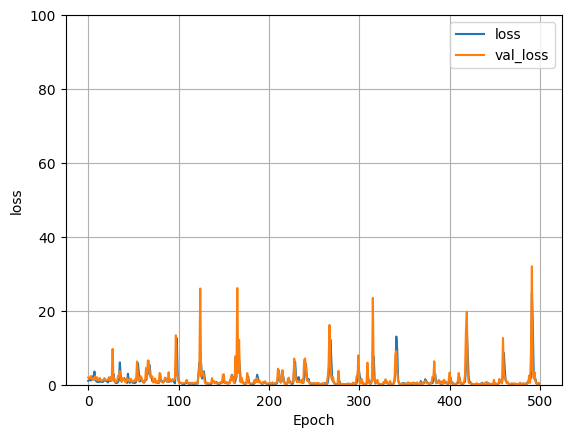

In [ ]:
%%time
history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

In [ ]:
loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)


18/18 [==============================] - 0s 4ms/step
0.07892137606839238 0.03468262960331361 0.7180598080981561
0.010222869944443318 0.030330693882714393 0.009670909691980372


## gridsearch 2/ num of neurons and hedden layers

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [400, 500, 600],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    'num_hidden_layers': [2, 3],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-79-98912b8ce277>:33: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.724039 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
Best Accuracy for -0.724 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
mean=-0.877, std=0.4533 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 400}
mean=-0.724, std=0.149 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
mean=-0.8477, std=0.2728 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 600}
mean=-1.369, std=0.9434 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 400}
mean=-0.9085, std=0.736 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-0.8237, std=0.6853 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [400, 500, 600],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    'num_hidden_layers': [2, 3],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-74-4f60c9ff190e>:33: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.481199 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
Best Accuracy for -0.4812 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-1.362, std=0.6356 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 400}
mean=-0.8754, std=0.5556 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
mean=-0.598, std=0.316 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 600}
mean=-1.347, std=0.7862 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 400}
mean=-0.4812, std=0.334 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-0.9283, std=0.539 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0

### best param

Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_356 (Dense)           (None, 600)               3000      
                                                                 
 dense_357 (Dense)           (None, 600)               360600    
                                                                 
 dense_358 (Dense)           (None, 600)               360600    
                                                                 
 dense_359 (Dense)           (None, 600)               360600    
                                                                 
 dense_360 (Dense)           (None, 3)                 1803      
                                                                 
Total params: 1,086,603
Trainable params: 1,086,603
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s

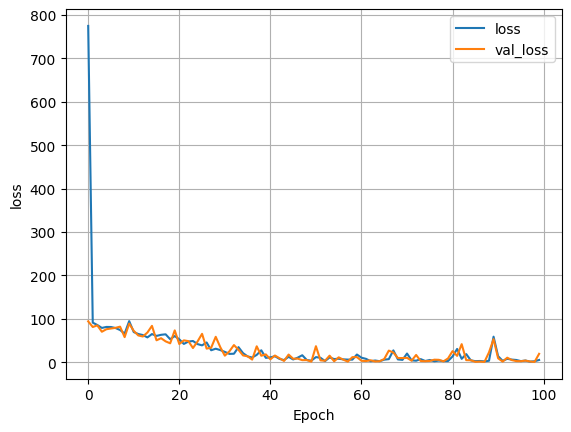

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(600, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_4r_train, y3_4r_train, epochs=100, batch_size=64, verbose=0,
    validation_split = 0.2)
print(plot_loss(history_o3_24))

loss_pred_o3_24 = model_o3_24.evaluate(X3_4r_test, y3_4r_test)
y_pred_o3_24 = model_o3_24.predict(X3_4r_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3_4r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



Model: "sequential_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_351 (Dense)           (None, 600)               3000      
                                                                 
 dense_352 (Dense)           (None, 600)               360600    
                                                                 
 dense_353 (Dense)           (None, 600)               360600    
                                                                 
 dense_354 (Dense)           (None, 600)               360600    
                                                                 
 dense_355 (Dense)           (None, 3)                 1803      
                                                                 
Total params: 1,086,603
Trainable params: 1,086,603
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s

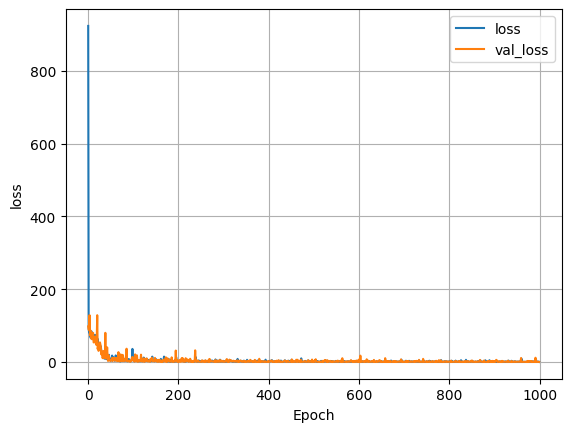

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(600, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(600, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3r_train, y3r_train, epochs=1000, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3r_test, y3r_test)
y_pred_o3_24 = model_o3_24.predict(X3r_test)
print(loss_pred_o3_24)

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 400)               2000      
                                                                 
 dense_1 (Dense)             (None, 400)               160400    
                                                                 
 dense_2 (Dense)             (None, 400)               160400    
                                                                 
 dense_3 (Dense)             (None, 400)               160400    
                                                                 
 dense_4 (Dense)             (None, 3)                 1203      
                                                                 
Total params: 484,403
Trainable params: 484,403
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/st

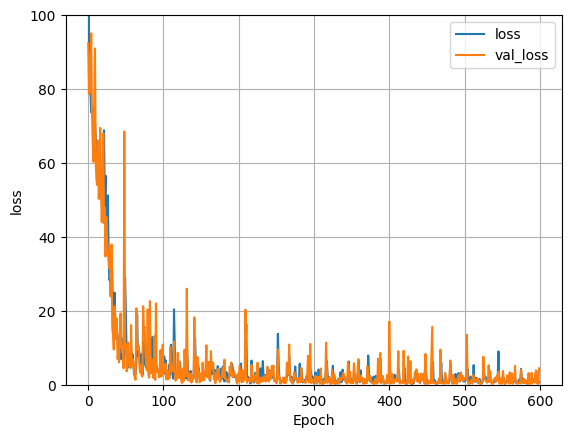

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(400, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_4r_train, y3_4r_train, epochs=600, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_4r_test, y3_4r_test)
y_pred_o3_24 = model_o3_24.predict(X3_4r_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3_4r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



In [ ]:
MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)


0.5789222029300732 0.49980091447300107 12.035379235038864
0.03177063300352841 0.2315084949631268 0.04407464999319246
0.9996891919774439 0.9978926134222617 0.9998281237105281


### epoch 1500

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_97 (Dense)            (None, 400)               2000      
                                                                 
 dense_98 (Dense)            (None, 400)               160400    
                                                                 
 dense_99 (Dense)            (None, 400)               160400    
                                                                 
 dense_100 (Dense)           (None, 400)               160400    
                                                                 
 dense_101 (Dense)           (None, 3)                 1203      
                                                                 
Total params: 484,403
Trainable params: 484,403
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms

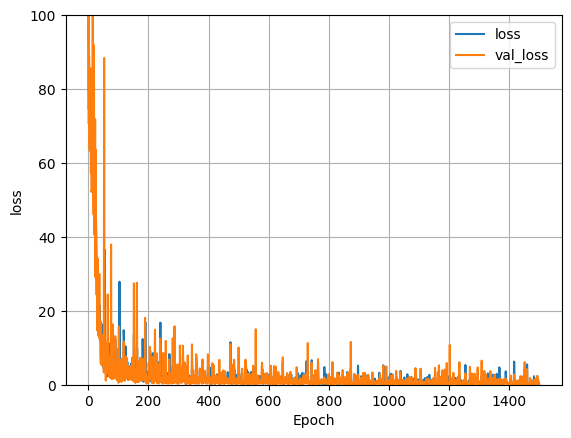

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(400, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(400, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_4r_train, y3_4r_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_4r_test, y3_4r_test)
y_pred_o3_24 = model_o3_24.predict(X3_4r_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



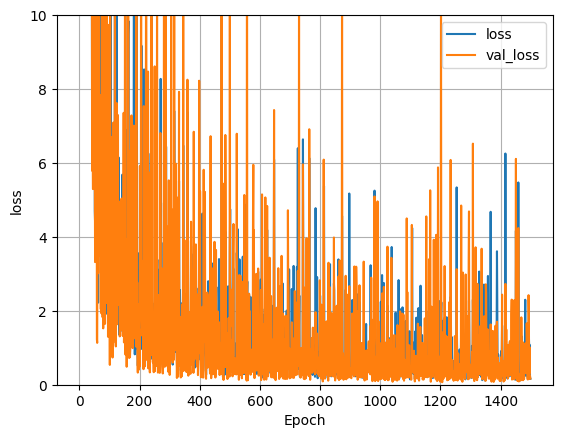

In [ ]:
plot_loss_10(history_o3_24)

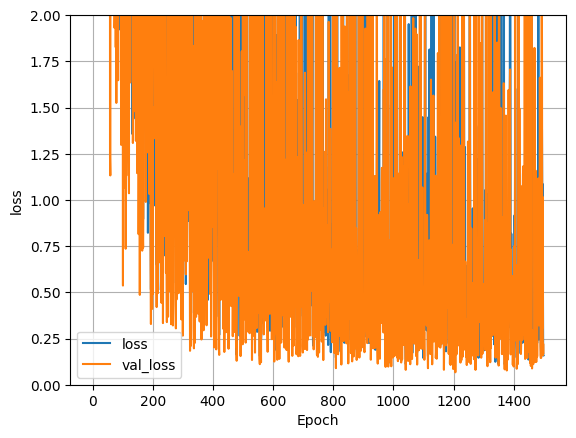

In [ ]:
plot_loss_2(history_o3_24)

## grid search 3  num of hedden layers

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    'num_hidden_layers': [3,4,5,6],
    # 'num_hidden_layers': [2,3,4,5],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-73-9e1a824afc5b>:34: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -1.098850 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 6, 'num_neurons': 500}
Best Accuracy for -1.099 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 6, 'num_neurons': 500}
mean=-2.583, std=2.871 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-1.553, std=1.455 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-1.745, std=1.914 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 5, 'num_neurons': 500}
mean=-1.099, std=0.6195 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 6, 'num_neurons': 500}


In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    # 'num_hidden_layers': [3,4,5,6],
    'num_hidden_layers': [2,3,4],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=2, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-83-90e01b02228b>:34: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.986455 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.9865 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-3.052, std=2.307 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
mean=-1.024, std=0.7705 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-0.9865, std=0.5878 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}


In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    # 'num_hidden_layers': [3,4,5,6],
    'num_hidden_layers': [2,3,4],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-79-4ac678bb67c1>:34: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.523557 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.5236 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-1.048, std=0.8406 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 2, 'num_neurons': 500}
mean=-1.437, std=0.718 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 3, 'num_neurons': 500}
mean=-0.5236, std=0.4088 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}


In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [500],
    'learning_rate': [0.001],
    # 'num_hidden_layers': [3,4,5,6],
    'num_hidden_layers': [4, 6],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-74-e559e6a04952>:34: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.603725 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.6037 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-0.6037, std=0.4863 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-3.948, std=5.399 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 6, 'num_neurons': 500}


### best

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_32 (Dense)            (None, 500)               2500      
                                                                 
 dense_33 (Dense)            (None, 500)               250500    
                                                                 
 dense_34 (Dense)            (None, 500)               250500    
                                                                 
 dense_35 (Dense)            (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
18/18 [==============================] - 0s 2ms/step
0.024769441059636084 0.05112464776311003 0.8134939563769638
0.010249623104288988 0.026461328765429948 0.016453752317295026


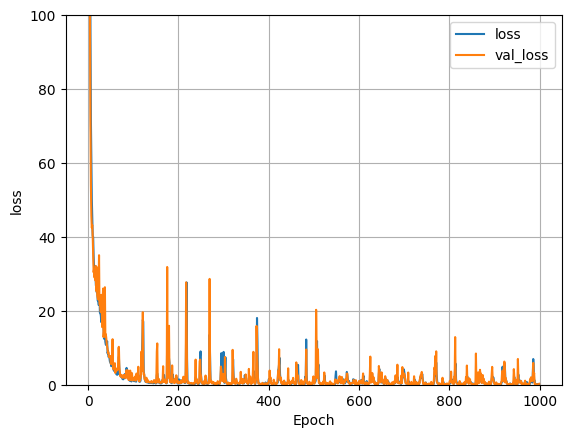

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1000, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24 = get_MSE_MAPE_2(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1000.h5")

### 1500 epoch

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_56 (Dense)            (None, 500)               2500      
                                                                 
 dense_57 (Dense)            (None, 500)               250500    
                                                                 
 dense_58 (Dense)            (None, 500)               250500    
                                                                 
 dense_59 (Dense)            (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
18/18 [==============================] - 0s 2ms/step
0.028295004540328947 0.11537490112472189 0.2645461037775241
0.006826615382141803 0.05319499069696216 0.008484820153375077
0.99

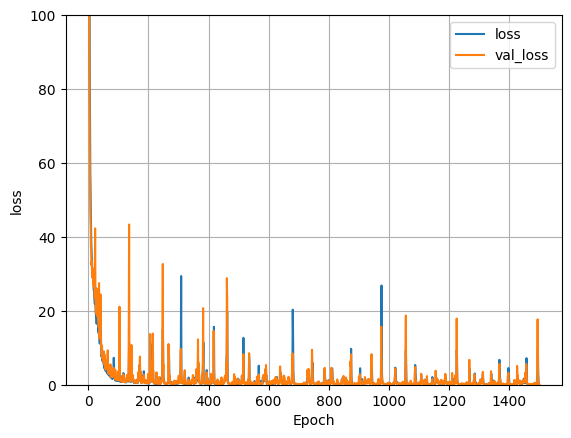

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1500.h5")

###1500ep x_raw

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 3ms/step
0.020955677049124564 0.030984011593155093 0.2798615648707188
0.013703029618456637 0.032933530080429575 0.007784869132369055
0.999

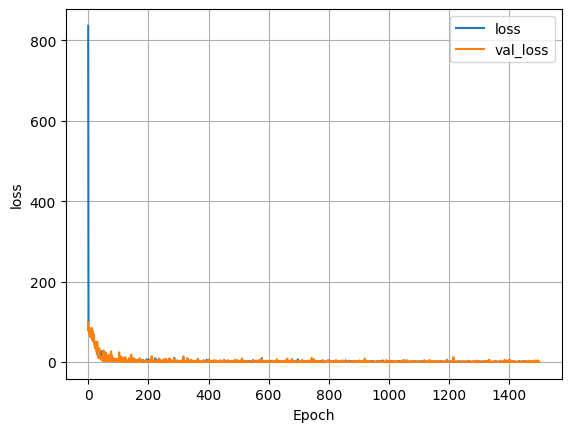

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3r_train, y3r_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3r_test, y3r_test)
y_pred_o3_24 = model_o3_24.predict(X3r_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)

MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3r_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1500_xraw.h5")

## grid search 4 epochs

In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [500, 1000, 1500],
    'learning_rate': [0.001],
    'num_hidden_layers': [4],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-72-5c610089169f>:29: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.724380 using {'batch_size': 64, 'epochs': 1500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.7244 using {'batch_size': 64, 'epochs': 1500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-1.251, std=0.9164 using {'batch_size': 64, 'epochs': 500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-0.8181, std=0.6446 using {'batch_size': 64, 'epochs': 1000, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-0.7244, std=0.2448 using {'batch_size': 64, 'epochs': 1500, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}


In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [2000],
    'learning_rate': [0.001],
    'num_hidden_layers': [4],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-73-509f8c94b31a>:29: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.765452 using {'batch_size': 64, 'epochs': 2000, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.7655 using {'batch_size': 64, 'epochs': 2000, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-0.7655, std=0.6344 using {'batch_size': 64, 'epochs': 2000, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}


In [ ]:
import numpy as np
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the neural network model using Keras
def create_model(num_inputs=4, num_outputs=3, num_neurons=32, learning_rate=0.01, num_hidden_layers=2):
    model = keras.Sequential()
    for i in range(num_hidden_layers):
        if i == 0:
            model.add(keras.layers.Dense(num_neurons, input_shape=(num_inputs,), activation='relu'))
        else:
            model.add(keras.layers.Dense(num_neurons, activation='relu'))
    model.add(keras.layers.Dense(num_outputs))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'num_neurons': [500],
    'batch_size': [64],
    'epochs': [1750],
    'learning_rate': [0.001],
    'num_hidden_layers': [4],
}

# Create a KerasRegressor wrapper for the neural network model
model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)

# Perform grid searchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, scoring='neg_mean_squared_error')
grid_result = grid.fit(X3_4r_train, y3_4r_train)

# Print the best hyperparameters and corresponding mean squared error
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

<ipython-input-73-c07b5e43a004>:29: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = keras.wrappers.scikit_learn.KerasRegressor(build_fn=create_model, verbose=0)


Best: -0.586877 using {'batch_size': 64, 'epochs': 1750, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
Best Accuracy for -0.5869 using {'batch_size': 64, 'epochs': 1750, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}
mean=-0.5869, std=0.1208 using {'batch_size': 64, 'epochs': 1750, 'learning_rate': 0.001, 'num_hidden_layers': 4, 'num_neurons': 500}


### best 1750ep

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 500)               2500      
                                                                 
 dense_139 (Dense)           (None, 500)               250500    
                                                                 
 dense_140 (Dense)           (None, 500)               250500    
                                                                 
 dense_141 (Dense)           (None, 500)               250500    
                                                                 
 dense_142 (Dense)           (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 3ms

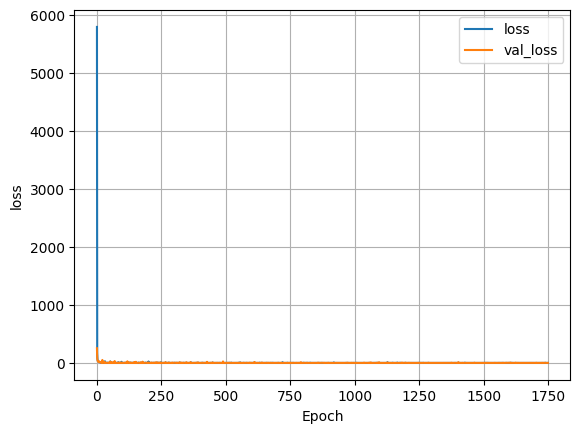

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1750.h5")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 500)               250500    
                                                                 
 dense_4 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 1ms/st

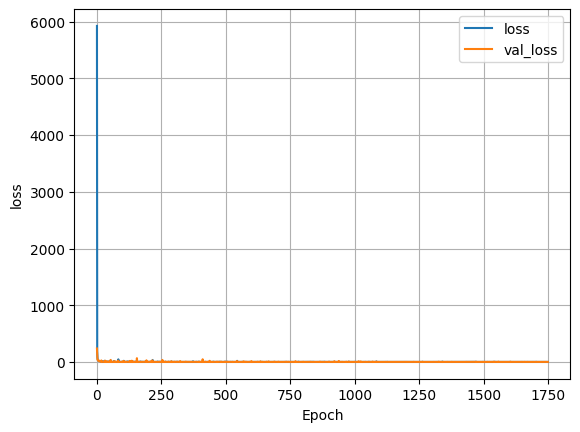

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
loss_pred_o3_24

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



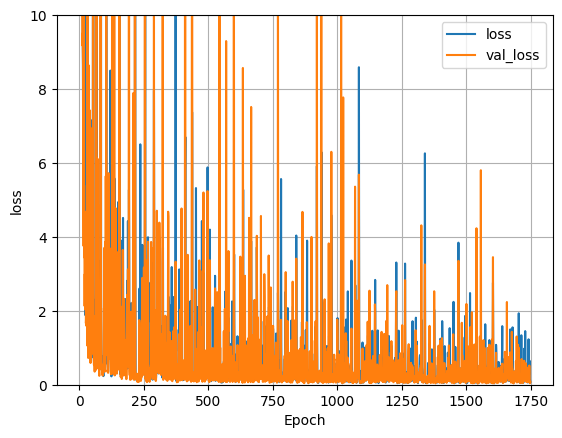

In [ ]:
plot_loss_10(history_o3_24)

In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1750_2.h5")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 500)               2500      
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 500)               250500    
                                                                 
 dense_8 (Dense)             (None, 500)               250500    
                                                                 
 dense_9 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 1ms/

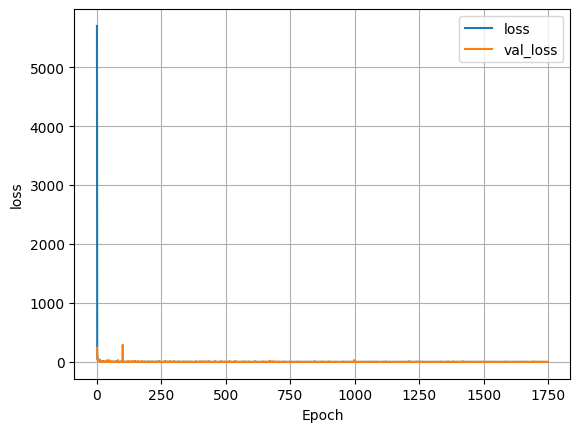

In [ ]:
def regression_model_o3_24():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    opt_s = keras.optimizers.SGD(learning_rate=0.001)
    opt_ag = keras.optimizers.Adagrad()
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_o3_24 = regression_model_o3_24()
model_o3_24.summary()


history_o3_24 = model_o3_24.fit(X3_train, y3_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_o3_24)

loss_pred_o3_24 = model_o3_24.evaluate(X3_test, y3_test)
y_pred_o3_24 = model_o3_24.predict(X3_test)
print(loss_pred_o3_24)

y_pred_o3_24_list = y_pred_o3_24.tolist()

ud_pred_24, uq_pred_24, Tq_pred_24 = get_output_list(y_pred_o3_24, y_pred_o3_24_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_24, MSE_uq_24, MSE_Tq_24, MAPE_ud_24, MAPE_uq_24, MAPE_Tq_24, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_test, y_pred_o3_24, ud_pred_24, uq_pred_24, Tq_pred_24)



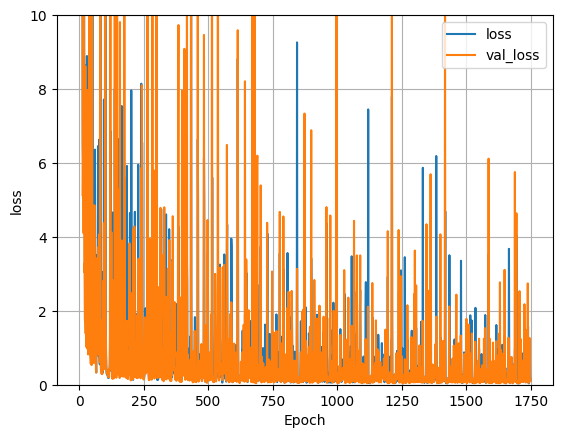

In [ ]:
plot_loss_10(history_o3_24)

In [ ]:
print(loss_pred_o3_24)

0.15596804022789001


In [ ]:
model_o3_24.save("drive/My Drive/Jupyter/model/parameters/model_ep1750_3.h5")

# (trained NN) test with 60 degC data

### saved model 30deg x-norm

In [ ]:
from keras.models import load_model
model_load = load_model('drive/My Drive/Jupyter/model/parameters/model_ep1500.h5')
loss_pred_load_ = model_load.evaluate(X3_2_test, y3_2_test)
y_pred_load_ = model_load.predict(X3_2_test)
loss_pred_load_

18/18 [==============================] - 0s 2ms/step


10.338339805603027

In [ ]:
y_pred_load_list = y_pred_load_.tolist()

ud_pred_l, uq_pred_l, Tq_pred_l = get_output_list(y_pred_load_, y_pred_load_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_l, MSE_uq_l, MSE_Tq_l, MAPE_ud_l, MAPE_uq_l, MAPE_Tq_l = get_MSE_MAPE_2(y3_2_test, y_pred_load_, ud_pred_l, uq_pred_l, Tq_pred_l)


0.14466279162359574 1.5398694039992507 29.330483221820113
0.023689837134611112 0.19032736174737958 0.02456344436591585


#### graph(for ud,uq,trq)

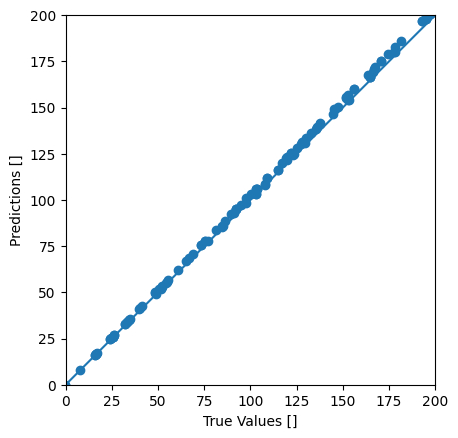

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_2_test_list, Tq_pred_l)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 200]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

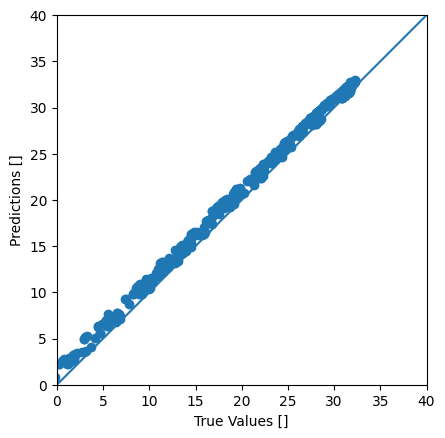

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_2_test_list, uq_pred_l)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

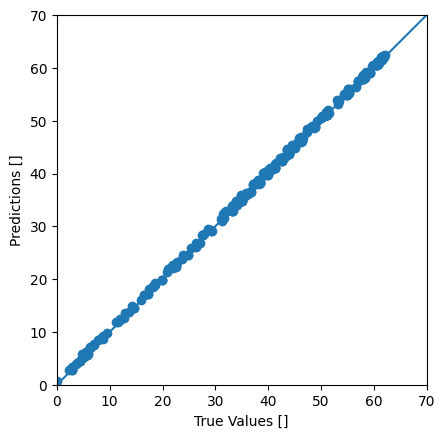

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_2_test_list, ud_pred_l)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

## saved model 30 deg x_raw

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_ep1500_xraw.h5')

y_pred = saved_model.predict(X3t_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t_test, y_pred, ud_pred, uq_pred, Tq_pred)


6/6 [==============================] - 0s 5ms/step
0.0718926250619425 0.13532304095254116 1.8523644863372968
0.019260588444689974 0.06767834387063144 0.024973332088770235
0.9999592690512863 0.9995246851934357 0.9999722147095598


##saved model x_raw 306090 model

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw.h5')

y_pred = saved_model.predict(X3t_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t_test, y_pred, ud_pred, uq_pred, Tq_pred)


6/6 [==============================] - 0s 5ms/step
0.14884505980033574 0.10251922210796323 1.2984622841132025
0.013331379928501813 0.04575942427955939 0.03668028675336017
0.9999156714545921 0.9996399068193977 0.9999805231897092


### start from training using 60degC data

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 500)               2500      
                                                                 
 dense_5 (Dense)             (None, 500)               250500    
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
18/18 [==============================] - 0s 1ms/step
0.09892041236162186
0.06500539973032839 0.054309863327420285 0.1774461407070939
0.016030767271710423 0.03596816493004794 0.0089

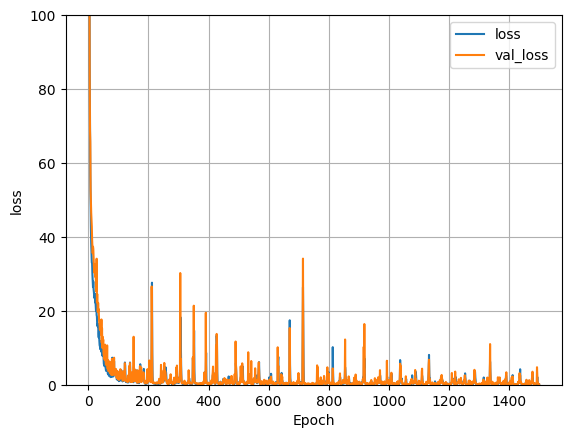

In [ ]:
def regression_model_test():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_test = regression_model_test()
model_test.summary()

history_test = model_test.fit(X3_2_train, y3_2_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_test)

loss_pred_test = model_test.evaluate(X3_2_test, y3_2_test)
y_pred_test = model_test.predict(X3_2_test)
print(loss_pred_test)

y_pred_test_list = y_pred_test.tolist()
ud_pred_, uq_pred_, Tq_pred_ = get_output_list(y_pred_test, y_pred_test_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_, MSE_uq_, MSE_Tq_, MAPE_ud_, MAPE_uq_, MAPE_Tq_, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_2_test, y_pred_test, ud_pred_, uq_pred_, Tq_pred_)


In [ ]:
y_pred_test_list = y_pred_test.tolist()
ud_pred_, uq_pred_, Tq_pred_ = get_output_list(y_pred_test, y_pred_test_list)
# ud_pred_3

# MSE_o3_9, MAPE_o3_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9, MAPE_ud_9, MAPE_uq_9, MAPE_Tq_9 = get_MSE_MAPE(y3_test, y_pred_o3_9, ud_pred_9, uq_pred_9, Tq_pred_9)
MSE_ud_, MSE_uq_, MSE_Tq_, MAPE_ud_, MAPE_uq_, MAPE_Tq_, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_2_test, y_pred_test, ud_pred_, uq_pred_, Tq_pred_)


0.06500539973032839 0.054309863327420285 0.1774461407070939
0.016030767271710423 0.03596816493004794 0.008978951829489322
0.9999663472306336 0.9998014091605415 0.9999976238027011


### save

In [ ]:
model_test.save("drive/My Drive/Jupyter/model/parameters/model_60deg_2.h5")

#### graph(for ud,uq,trq)

NameError: ignored

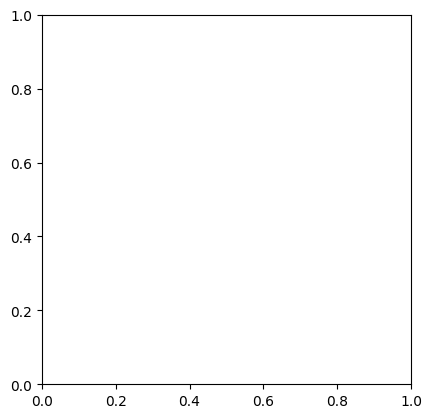

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_2_test_list, Tq_pred_)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 200]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_2_test_list, uq_pred_test)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)


In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_2_test_list, ud_pred_test)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
lims = [0, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

# NN 30deg+60deg

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
36/36 [==============================] - 0s 2ms/step
0.07191526144742966
0.016901667547995332 0.013510069577052706 0.1853340256082764
0.0107163962454974 0.023065214039756494 0.006997

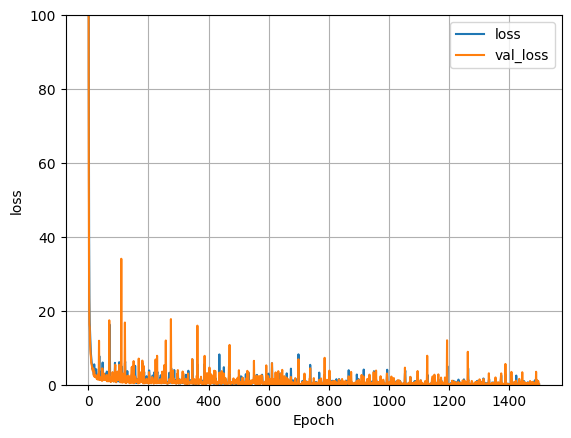

In [ ]:
def regression_model_3060():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_3060 = regression_model_3060()
model_3060.summary()

history_3060 = model_3060.fit(X3_3_train, y3_3_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_3060)

loss_pred = model_3060.evaluate(X3_3_test, y3_3_test)
y_pred = model_3060.predict(X3_3_test)
print(loss_pred)

y_pred_list = y_pred.tolist()
ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_3_test, y_pred, ud_pred, uq_pred, Tq_pred)


## save

In [ ]:
model_3060.save("drive/My Drive/Jupyter/model/parameters/model_30_60deg.h5")

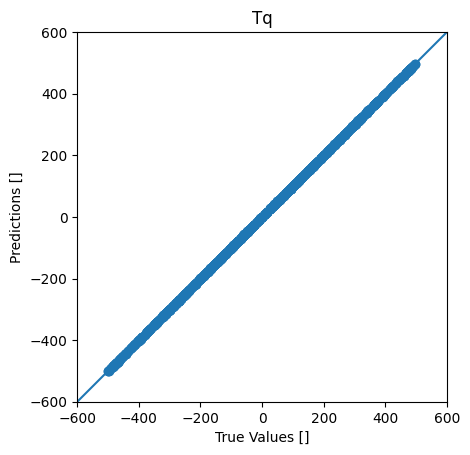

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_3_test_list, Tq_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

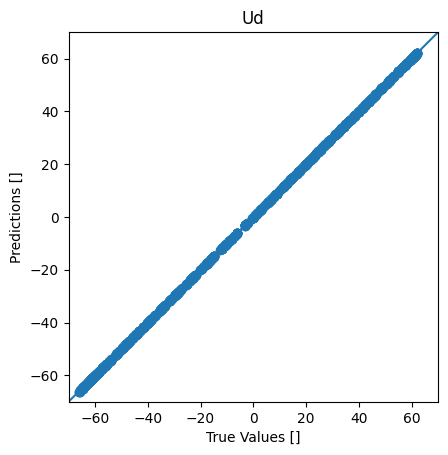

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_3_test_list, ud_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

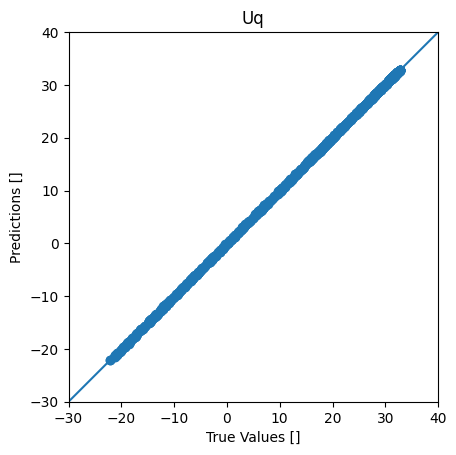

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_3_test_list, uq_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

# NN 30+60+90deg

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/step
0.028692910447716713
0.007252002086782658 0.008970912764113643 0.06985574926733716
0.004801428746051225 0.014079698303342483 0.00

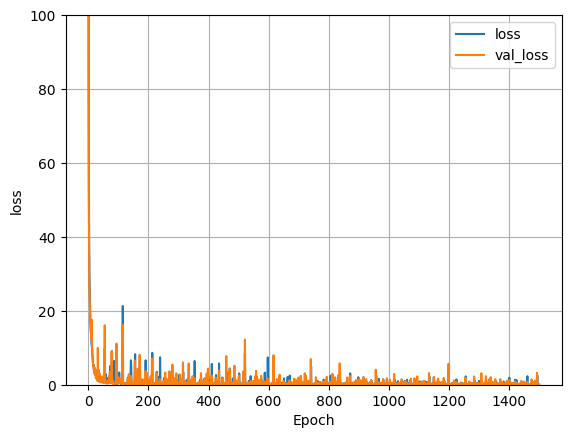

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4_train, y3_4_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4_test, y3_4_test)
y_pred = model_306090.predict(X3_4_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


## save

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg.h5")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 500)               250500    
                                                                 
 dense_4 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/st

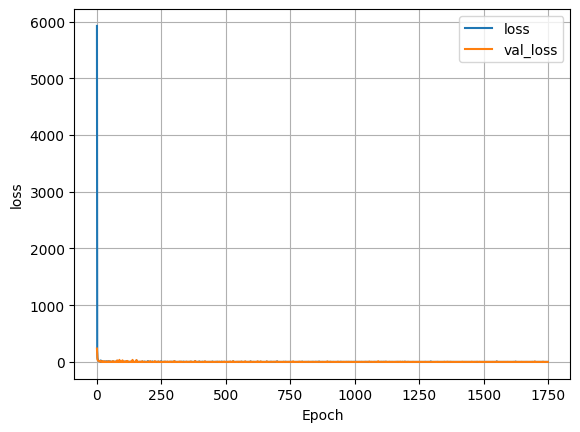

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4_train, y3_4_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4_test, y3_4_test)
y_pred = model_306090.predict(X3_4_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_Trot_norm.h5")

###initial

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 25)                125       
                                                                 
 dense_4 (Dense)             (None, 25)                650       
                                                                 
 dense_5 (Dense)             (None, 3)                 78        
                                                                 
Total params: 853
Trainable params: 853
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/step
0.821087658405304
0.4894603514243901 0.3945655990892238 1.579237162315199
0.049898460162837895 0.10651381064258347 0.028790747701365055
0.9997372216799151 0.9983363330808734 0.9999774470402342


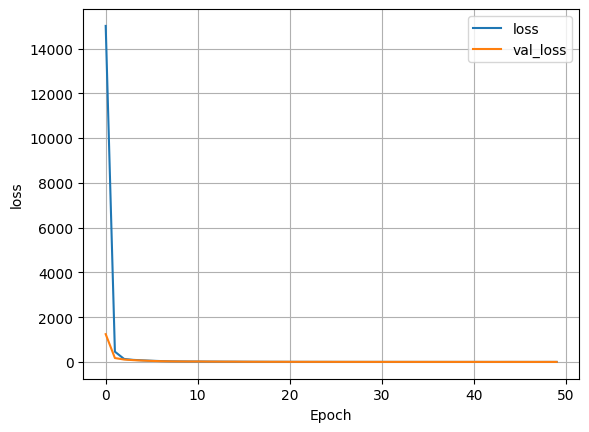

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(25, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(25, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.01)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4_train, y3_4_train, epochs=50, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4_test, y3_4_test)
y_pred = model_306090.predict(X3_4_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


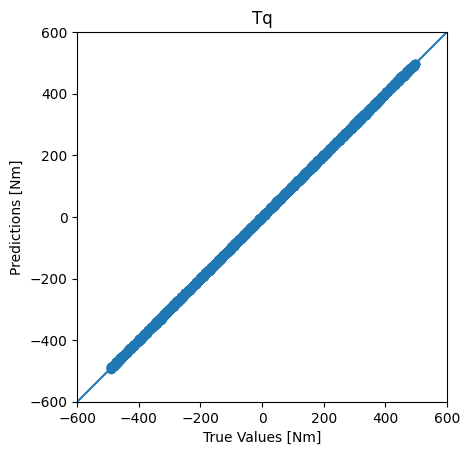

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_4_test_list, Tq_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

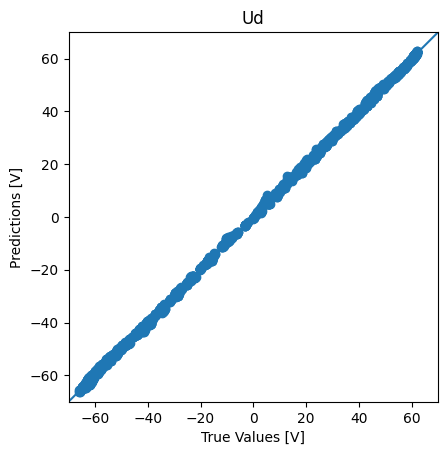

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

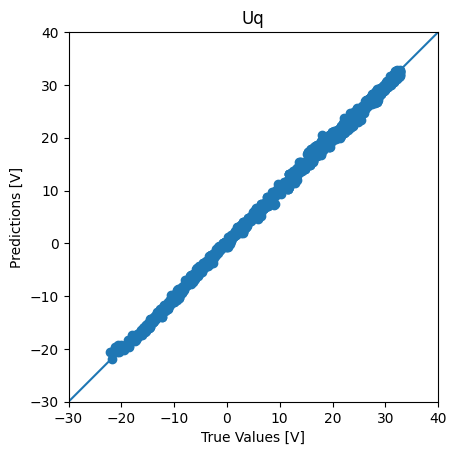

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_4_test_list, uq_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

###load Trot_norm

In [79]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_Trot_norm.h5')

y_pred = saved_model.predict(X3_4_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


50/50 [==============================] - 0s 3ms/step
0.022722130965835776 0.022637289032905447 0.6148064458208458
0.012047248661956137 0.028555136802250067 0.008587398378363977
0.9999878010887162 0.9999045509568252 0.9999912199982578


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 500)               2500      
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 500)               250500    
                                                                 
 dense_8 (Dense)             (None, 500)               250500    
                                                                 
 dense_9 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

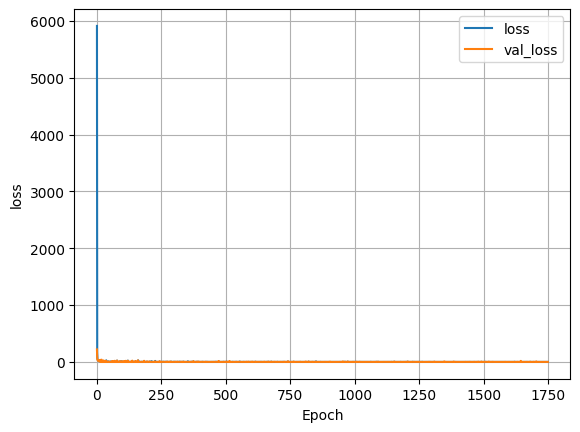

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4_train, y3_4_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4_test, y3_4_test)
y_pred = model_306090.predict(X3_4_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_Trot_norm2.h5")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 500)               2500      
                                                                 
 dense_11 (Dense)            (None, 500)               250500    
                                                                 
 dense_12 (Dense)            (None, 500)               250500    
                                                                 
 dense_13 (Dense)            (None, 500)               250500    
                                                                 
 dense_14 (Dense)            (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

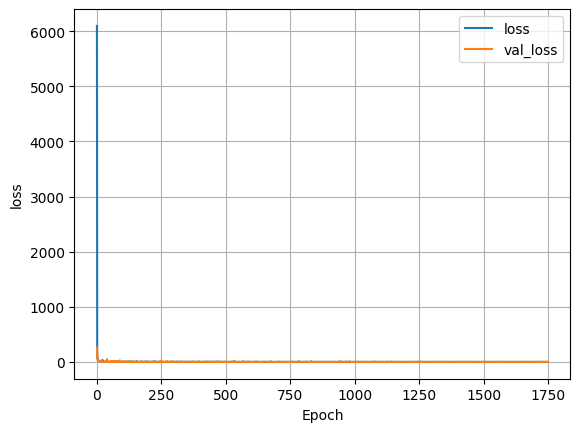

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4_train, y3_4_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4_test, y3_4_test)
y_pred = model_306090.predict(X3_4_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_Trot_norm3.h5")

NameError: ignored

## load

In [64]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg.h5')

y_pred = saved_model.predict(X3_4_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


50/50 [==============================] - 1s 4ms/step
0.007251997498627324 0.00897092218522667 0.06985603682826967
0.0048014261503176656 0.014079610438929161 0.004904718842207254
0.9999961065943045 0.9999621745369893 0.9999990023915182


## graph

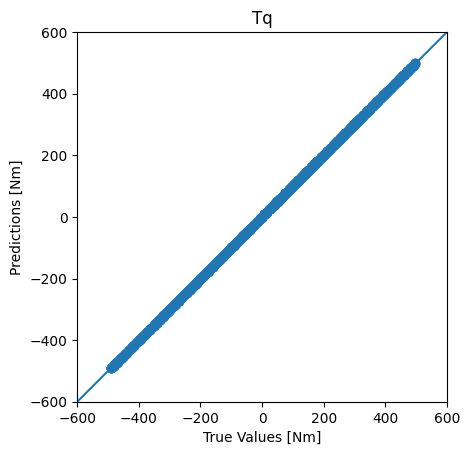

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_4_test_list, Tq_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

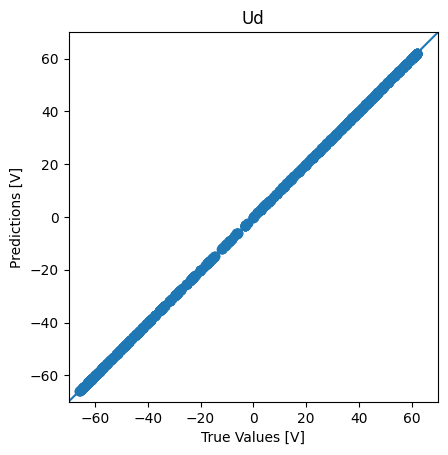

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

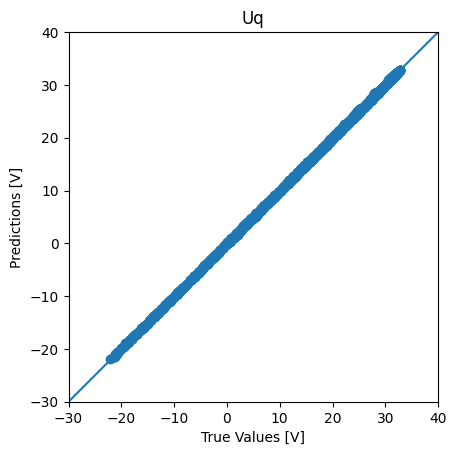

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_4_test_list, uq_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

###residual plot

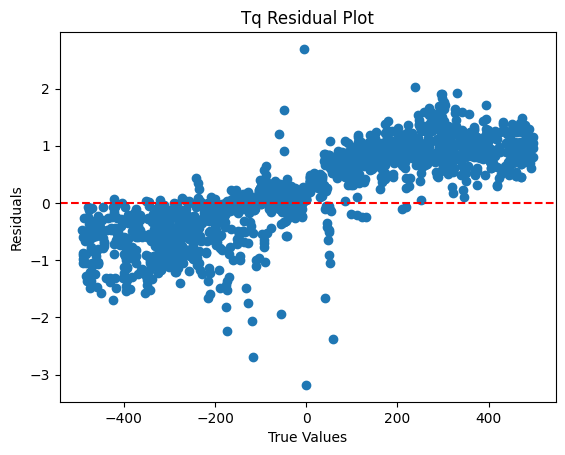

In [83]:
# Calculate residuals
# residuals = Tq_pred - Tq_4_test_list

residuals = list()
for i in range(len(Tq_pred)):
    item = Tq_pred[i] - Tq_4_test_list[i]
    residuals.append(item)

# Create residual plot
plt.scatter(Tq_4_test_list, residuals)
plt.axhline(y=0, color='r', linestyle='--')  # Add horizontal line at y=0
plt.xlabel('True Values')
plt.ylabel('Residuals')
plt.title('Tq Residual Plot')
plt.show()

In [72]:
# Calculate residuals
# residuals = Tq_pred - Tq_4_test_list

residuals = list()
for i in range(len(Tq_pred)):
    item = Tq_pred[i] - Tq_4_test_list[i]
    residuals.append(item)


# Create residual plot using seaborn
sns.residplot(Tq_4_test_list, residuals, lowess=True, color='b')
plt.xlabel('True Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

TypeError: ignored

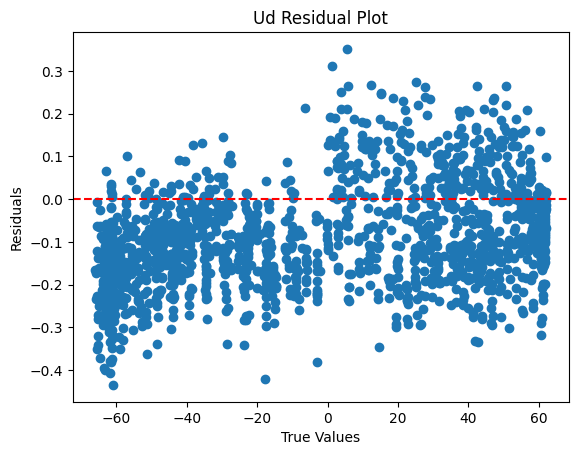

In [84]:
# Calculate residuals
# residuals = Tq_pred - Tq_4_test_list

residuals = list()
for i in range(len(Tq_pred)):
    item = ud_pred[i] - ud_4_test_list[i]
    residuals.append(item)

# Create residual plot
plt.scatter(ud_4_test_list, residuals)
plt.axhline(y=0, color='r', linestyle='--')  # Add horizontal line at y=0
plt.xlabel('True Values')
plt.ylabel('Residuals')
plt.title('Ud Residual Plot')
plt.show()

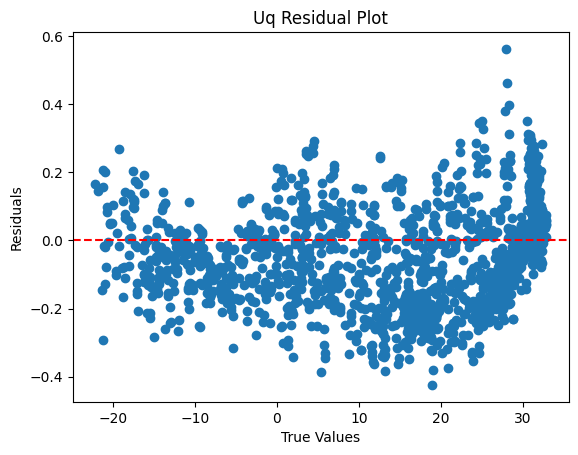

In [86]:
# Calculate residuals
# residuals = Tq_pred - Tq_4_test_list

residuals = list()
for i in range(len(Tq_pred)):
    item = uq_pred[i] - uq_4_test_list[i]
    residuals.append(item)

# Create residual plot
plt.scatter(uq_4_test_list, residuals)
plt.axhline(y=0, color='r', linestyle='--')  # Add horizontal line at y=0
plt.xlabel('True Values')
plt.ylabel('Residuals')
plt.title('Uq Residual Plot')
plt.show()

## error plot

In [ ]:
errors_ud = get_errorList(ud_pred, ud_test_list)
errors_uq = get_errorList(uq_pred, uq_test_list)
errors_Tq = get_errorList(Tq_pred, Tq_test_list)

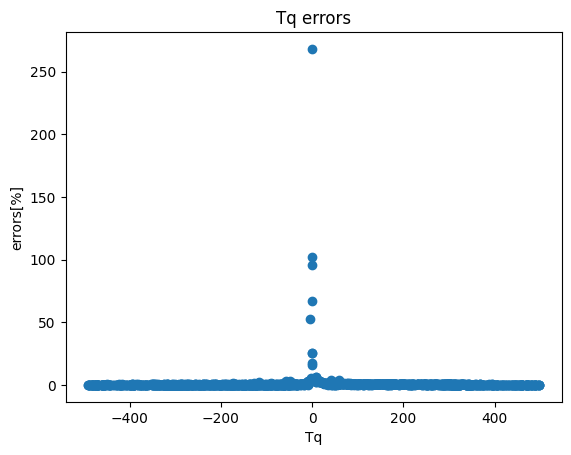

In [ ]:
# Create a figure and axis object
fig, ax = plt.subplots()

# Plot the data
ax.scatter(Tq_test_list, errors_Tq)

# xlims = [-600, 600]
# plt.xlim(xlims)
# ylims = [0, 1000]
# plt.ylim(ylims)

# Add labels and title
ax.set_xlabel('Tq')
ax.set_ylabel('errors[%]')
ax.set_title('Tq errors')

# Display the graph
plt.show()

Text(0, 0.5, 'errors[%]')

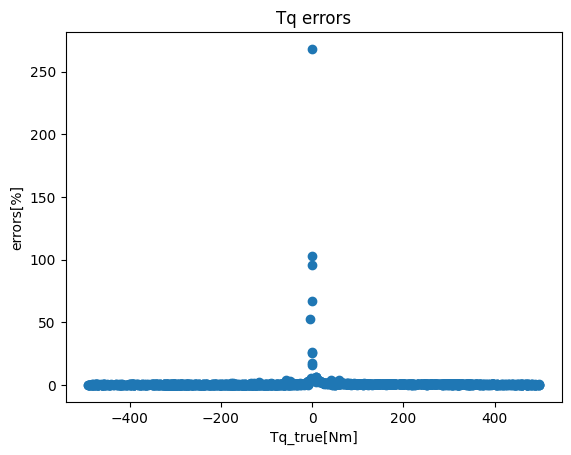

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

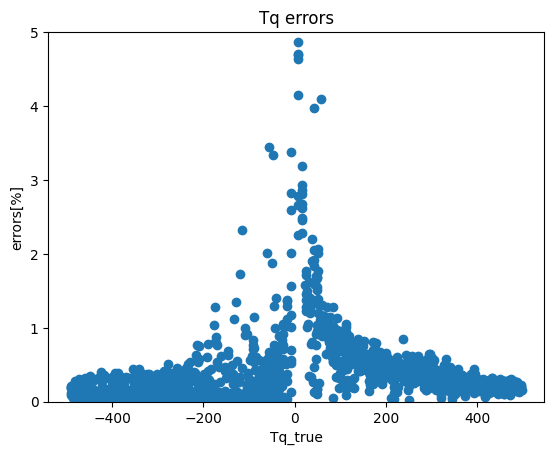

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 5]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

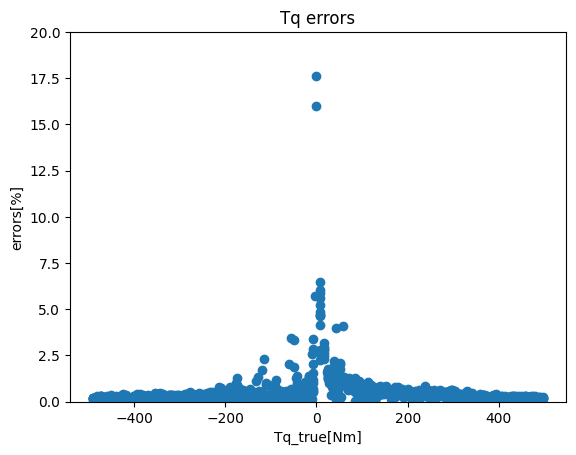

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

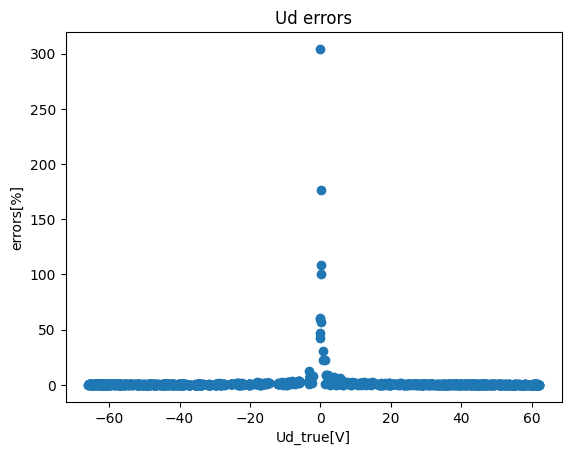

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

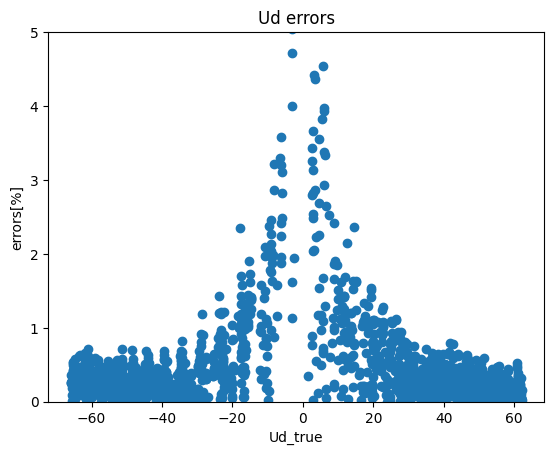

In [ ]:
plt.scatter(ud_test_list, errors_ud)
ylims = [0, 5]
plt.ylim(ylims)
plt.title('Ud errors')
plt.xlabel('Ud_true')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

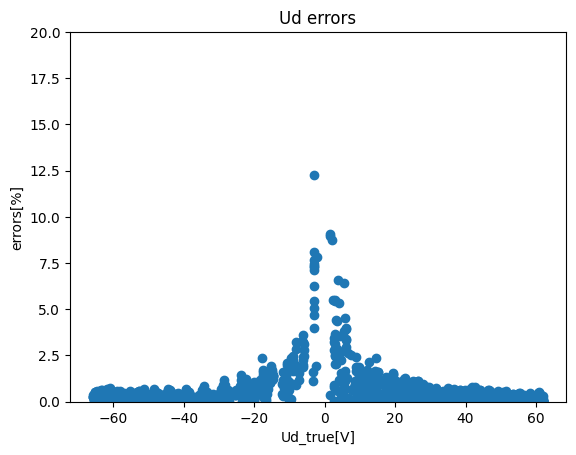

In [ ]:
plt.scatter(ud_test_list, errors_ud)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

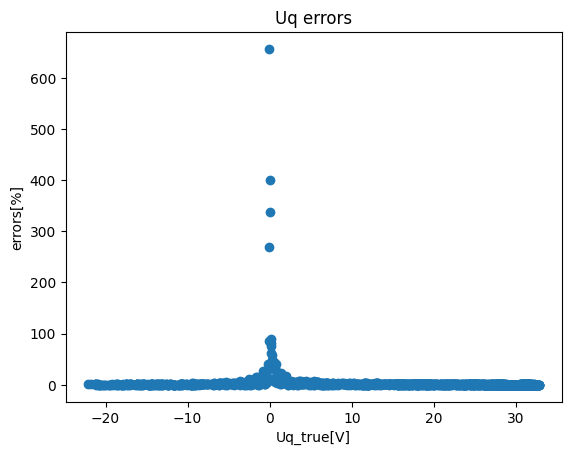

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

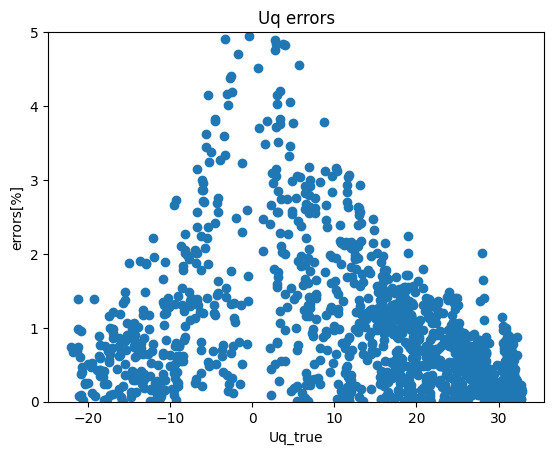

In [ ]:
plt.scatter(uq_test_list, errors_uq)
ylims = [0, 5]
plt.ylim(ylims)
plt.title('Uq errors')
plt.xlabel('Uq_true')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

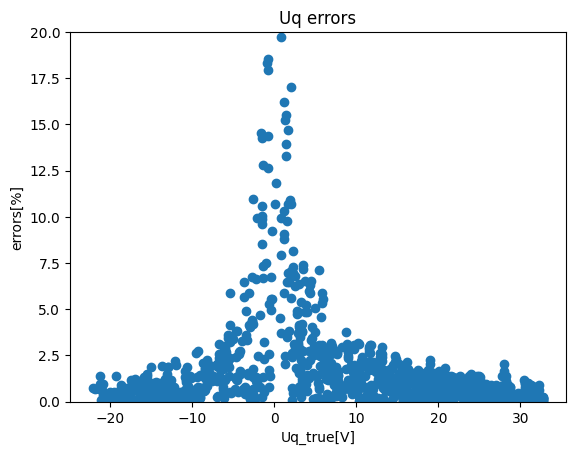

In [ ]:
plt.scatter(uq_test_list, errors_uq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

##actual error

In [87]:
errors_ud = get_actual_errorList(ud_pred, ud_test_list)
errors_uq = get_actual_errorList(uq_pred, uq_test_list)
errors_Tq = get_actual_errorList(Tq_pred, Tq_test_list)

Text(0, 0.5, 'errors[Nm]')

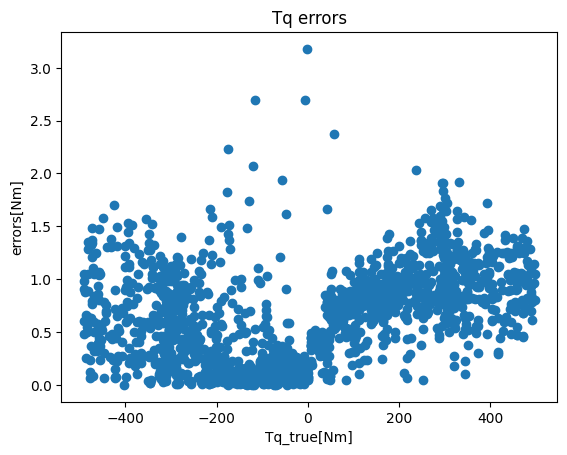

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

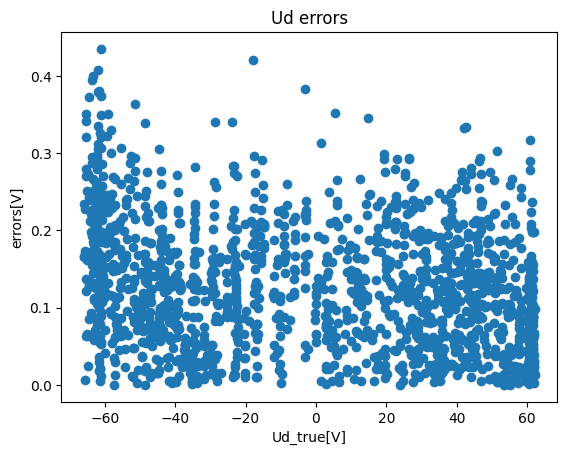

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

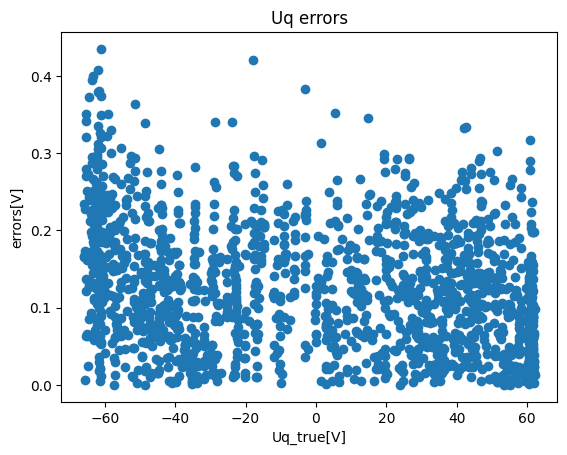

In [88]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

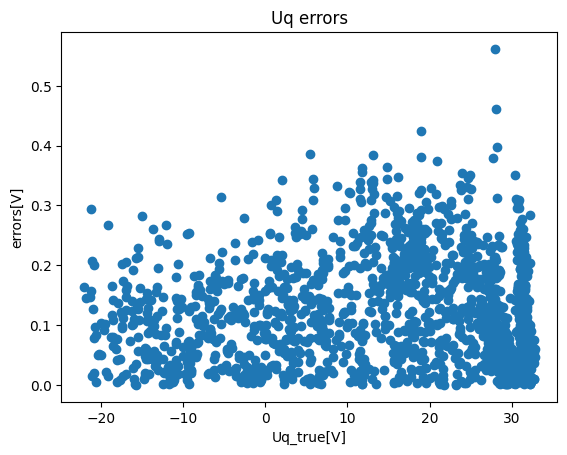

In [89]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

##noabs

Text(0, 0.5, 'errors[Nm]')

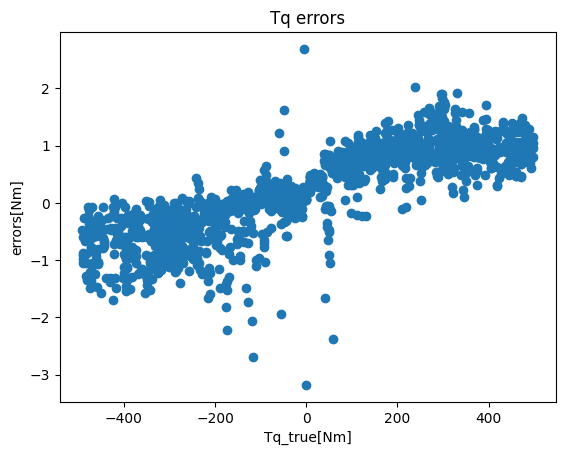

In [80]:
errors_ud = get_actual_errorList_noabs(ud_pred, ud_test_list)
errors_uq = get_actual_errorList_noabs(uq_pred, uq_test_list)
errors_Tq = get_actual_errorList_noabs(Tq_pred, Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

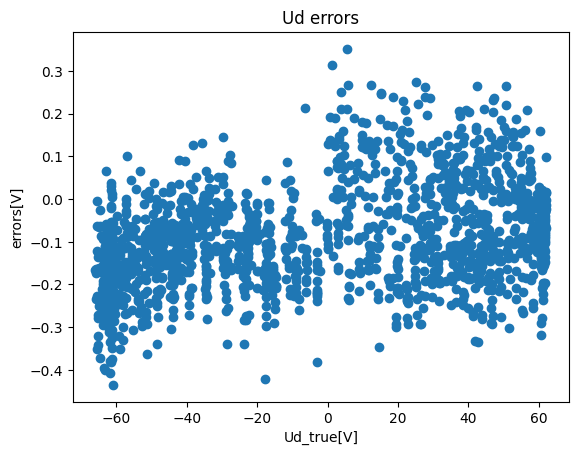

In [81]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

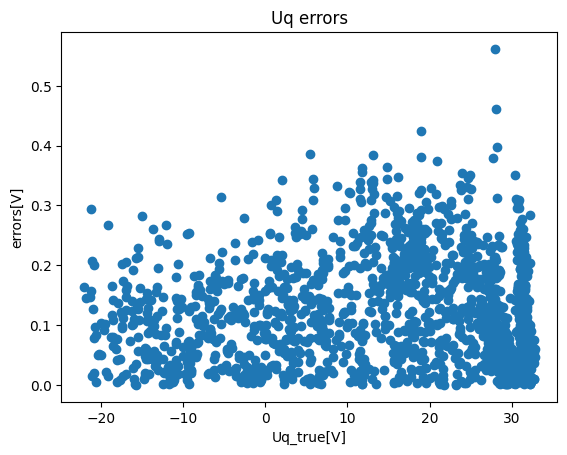

In [90]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

## NN for Tq, Ud, Uq

###Tq

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 500)               2500      
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 500)               250500    
                                                                 
 dense_8 (Dense)             (None, 500)               250500    
                                                                 
 dense_9 (Dense)             (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

IndexError: ignored

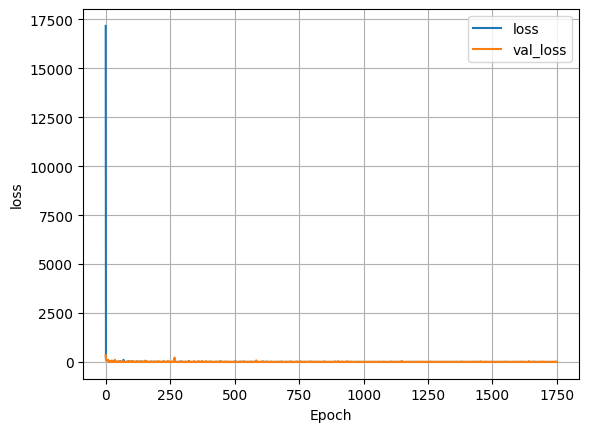

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xtqn_train, ytqn_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xtqn_test, ytqn_test)
y_pred = model_306090.predict(Xtqn_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(ytqn_test, y_pred, ud_pred, uq_pred, Tq_pred)

print(get_MSE_MAPE_R_1(ytqn_test, y_pred))

In [ ]:
print(get_MSE_MAPE_R_1(ytqn_test, y_pred))

(0.3254186696491178, 0.007048702017322142, 0.9999953527219732)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xnorm_Tq.h5")

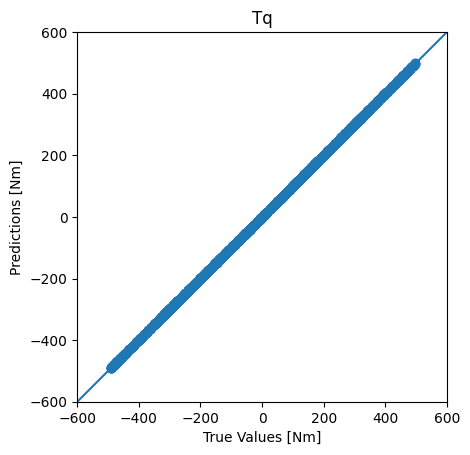

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ytq_test, y_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

####load

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xnorm_Tq.h5')

y_pred = saved_model.predict(Xtqn_test)
print(get_MSE_MAPE_R_1(ytqn_test, y_pred))

50/50 [==============================] - 1s 6ms/step
(0.32541833374778, 0.007048691226370638, 0.9999953527267701)


Text(0, 0.5, 'errors[Nm]')

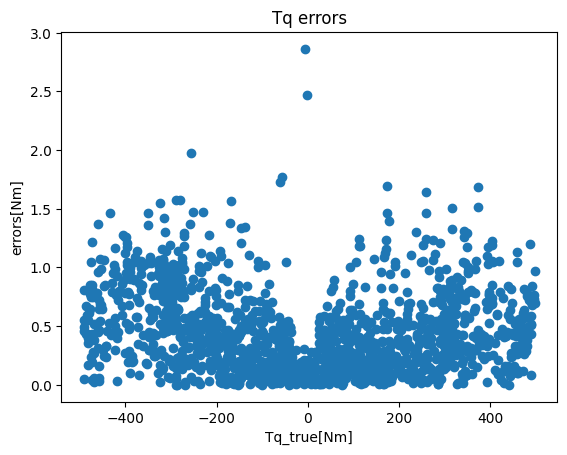

In [ ]:
errors_Tq = get_actual_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[%]')

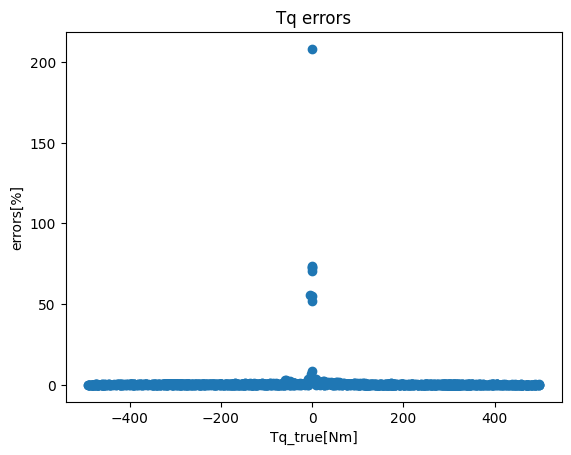

In [ ]:
errors_Tq = get_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

(0.0, 5.0)

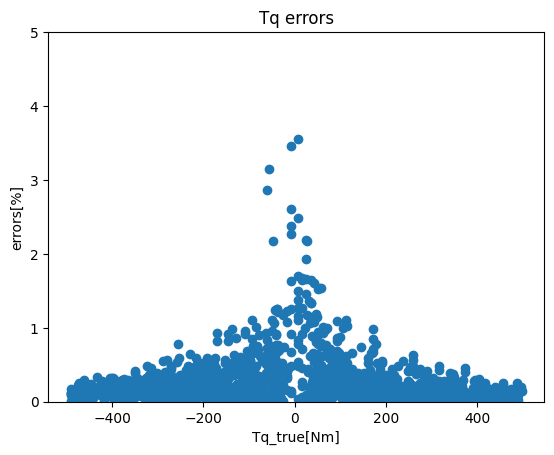

In [ ]:
errors_Tq = get_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')
lim=[0,5]
plt.ylim(lim)

###Ud

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 500)               2500      
                                                                 
 dense_11 (Dense)            (None, 500)               250500    
                                                                 
 dense_12 (Dense)            (None, 500)               250500    
                                                                 
 dense_13 (Dense)            (None, 500)               250500    
                                                                 
 dense_14 (Dense)            (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

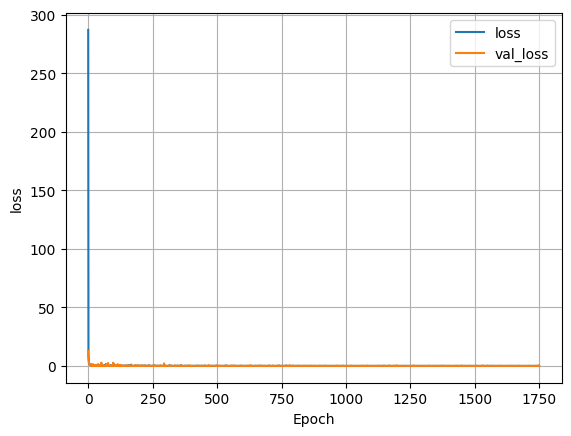

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xudn_train, yudn_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xudn_test, yudn_test)
y_pred = model_306090.predict(Xudn_test)
print(loss_pred)

print(get_MSE_MAPE_R_1(yudn_test, y_pred))

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xnorm_Ud.h5")

####load

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xnorm_Ud.h5')

y_pred = saved_model.predict(Xudn_test)
print(get_MSE_MAPE_R_1(yudn_test, y_pred))

50/50 [==============================] - 1s 6ms/step
(0.008364351394408226, 0.00559266356830424, 0.9999955094009114)


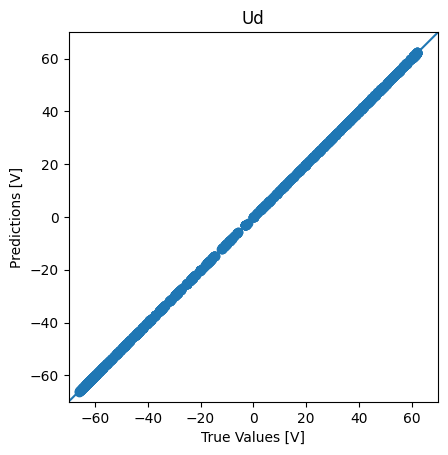

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(yud_test, y_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

Text(0, 0.5, 'errors[V]')

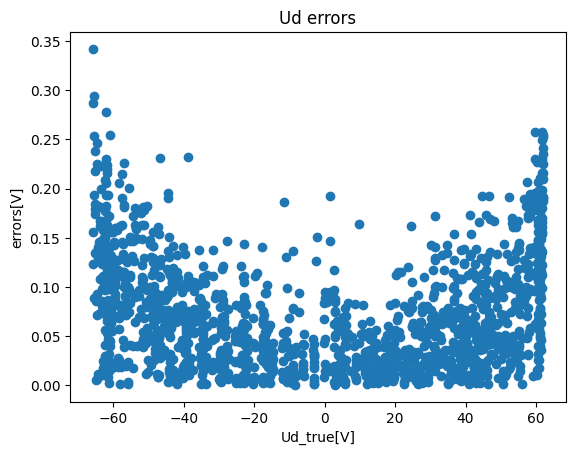

In [ ]:
errors_ud = get_actual_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[%]')

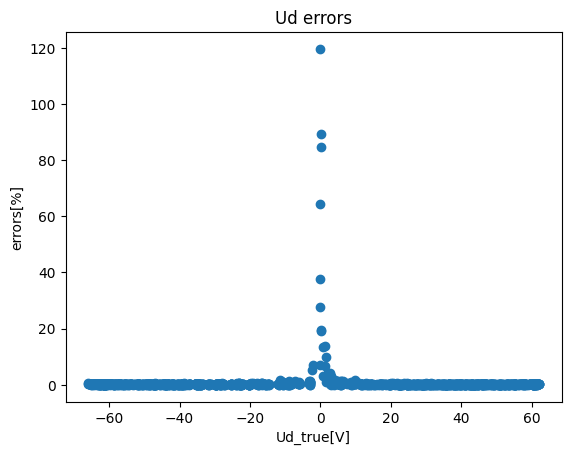

In [ ]:
errors_ud = get_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 5.0)

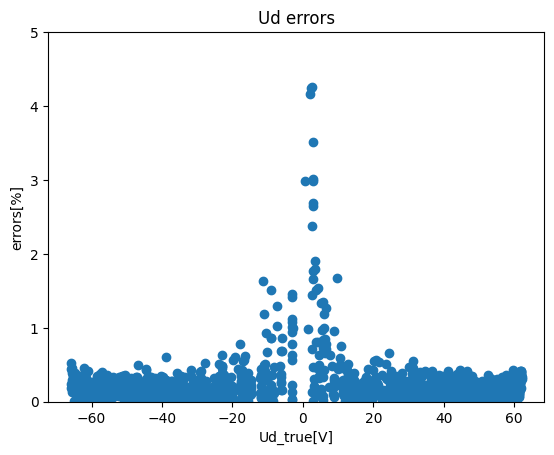

In [ ]:
errors_ud = get_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,5]
plt.ylim(lim)

###Uq

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 500)               250500    
                                                                 
 dense_4 (Dense)             (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/st

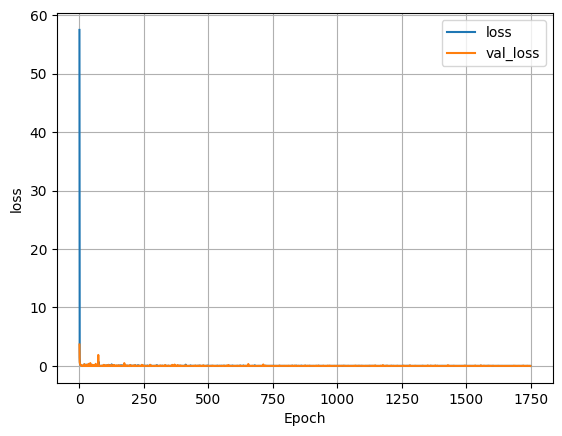

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xuqn_train, yuqn_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xuqn_test, yuqn_test)
y_pred = model_306090.predict(Xuqn_test)
print(loss_pred)

print(get_MSE_MAPE_R_1(yuqn_test, y_pred))

In [ ]:
print(get_MSE_MAPE_R_1(yuqn_test, y_pred))

NameError: ignored

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xnorm_Uq.h5")

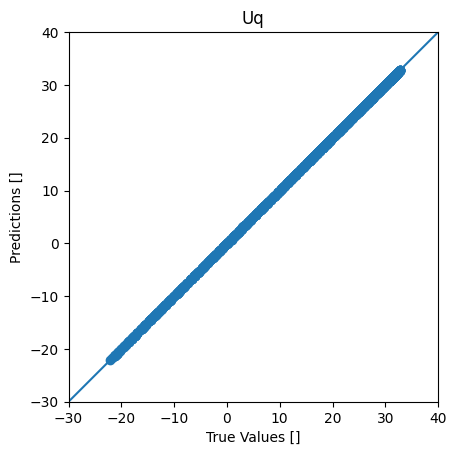

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(yuq_test, y_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

Text(0, 0.5, 'errors[V]')

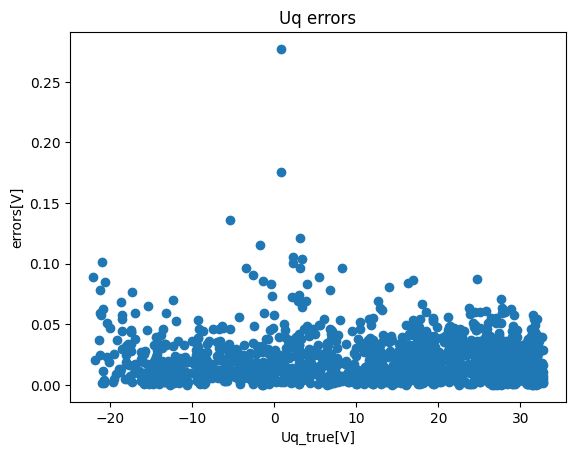

In [ ]:
errors_uq = get_actual_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[%]')

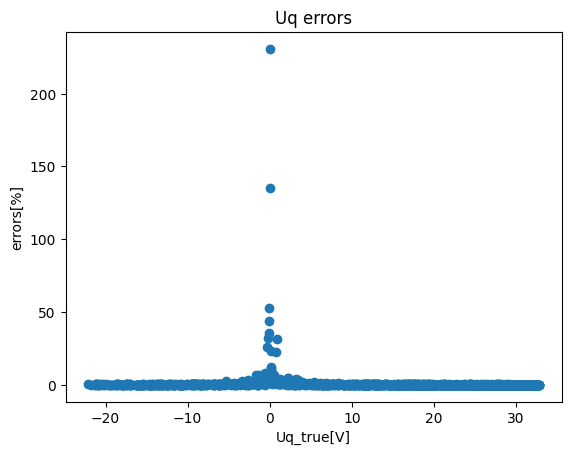

In [ ]:
errors_uq = get_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

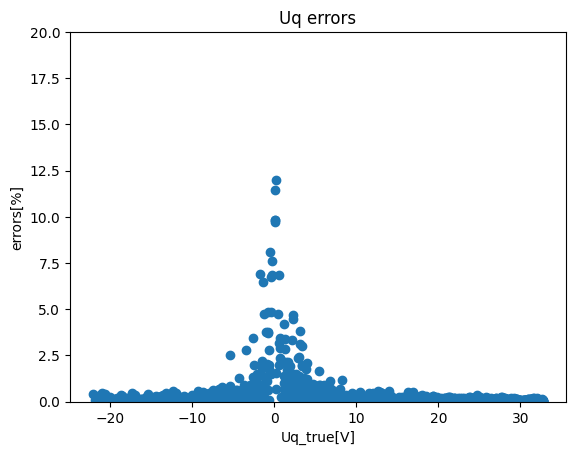

In [ ]:
errors_uq = get_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

(0.0, 5.0)

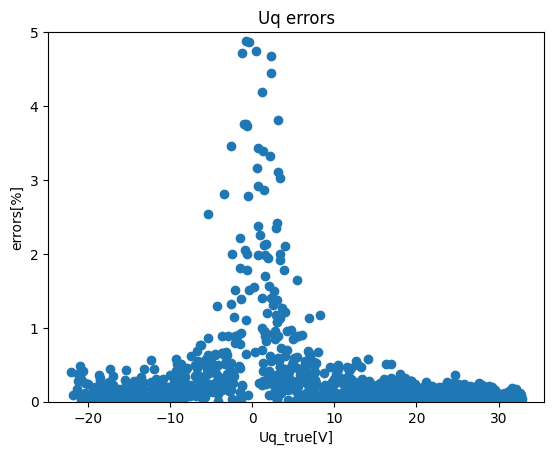

In [ ]:
errors_uq = get_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,5]
plt.ylim(lim)

#NN 306090degC x_raw

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 5ms/step
0.1626187413930893
0.08853130759519129 0.06167735242420512 0.33764773009310967
0.010206234405106918 0.05218502325881607 0.0074115

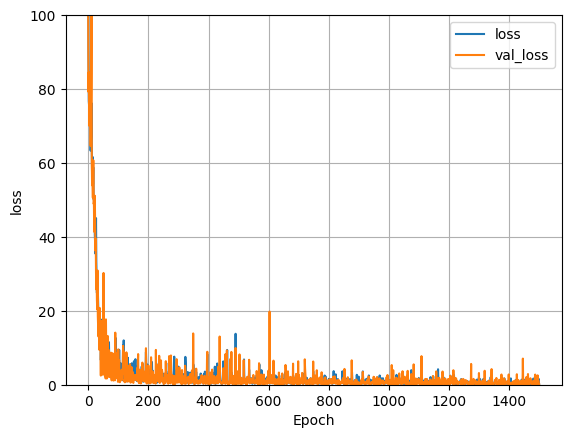

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4r_train, y3_4r_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4r_test, y3_4r_test)
y_pred = model_306090.predict(X3_4r_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


## save

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw.h5")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 500)               250500    
                                                                 
 dense_4 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/st

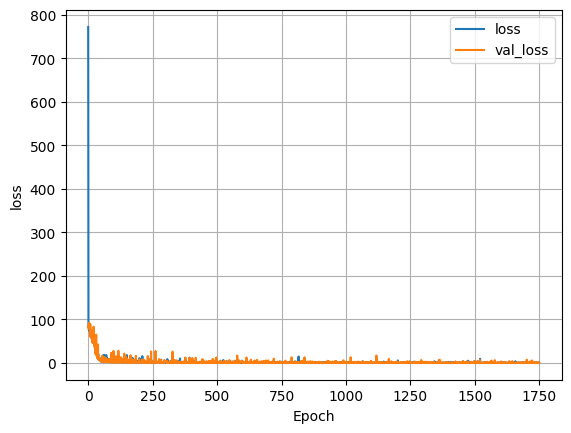

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4r_train, y3_4r_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4r_test, y3_4r_test)
y_pred = model_306090.predict(X3_4r_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


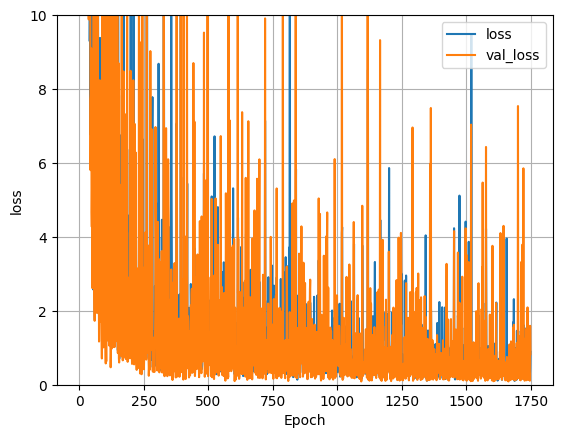

In [ ]:
plot_loss_10(history_306090)

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw2.h5")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 500)               2500      
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 500)               250500    
                                                                 
 dense_8 (Dense)             (None, 500)               250500    
                                                                 
 dense_9 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

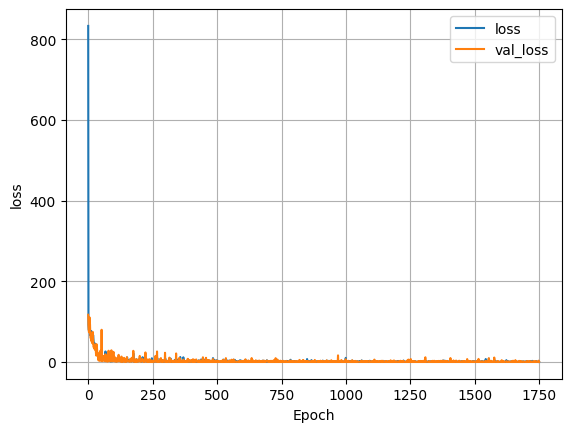

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4r_train, y3_4r_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4r_test, y3_4r_test)
y_pred = model_306090.predict(X3_4r_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw3.h5")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 500)               2500      
                                                                 
 dense_11 (Dense)            (None, 500)               250500    
                                                                 
 dense_12 (Dense)            (None, 500)               250500    
                                                                 
 dense_13 (Dense)            (None, 500)               250500    
                                                                 
 dense_14 (Dense)            (None, 3)                 1503      
                                                                 
Total params: 755,503
Trainable params: 755,503
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 1ms/

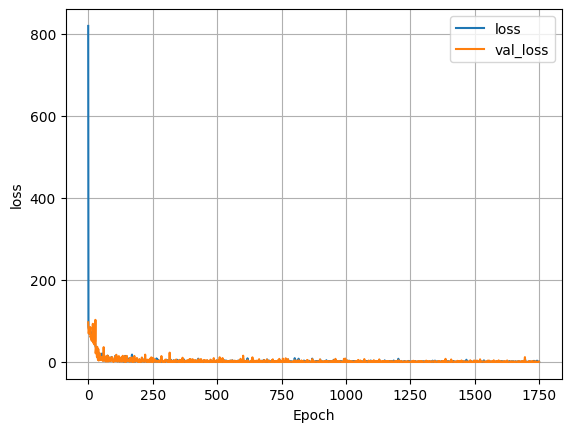

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4r_train, y3_4r_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4r_test, y3_4r_test)
y_pred = model_306090.predict(X3_4r_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw4.h5")

## load

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw.h5')

y_pred = saved_model.predict(X3_4r_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


50/50 [==============================] - 0s 4ms/step
0.08853130759519129 0.06167735242420512 0.33764773009310967
0.010206234405106918 0.05218502325881607 0.007411562677940933
0.9999524698819484 0.9997399404024976 0.9999951780797378


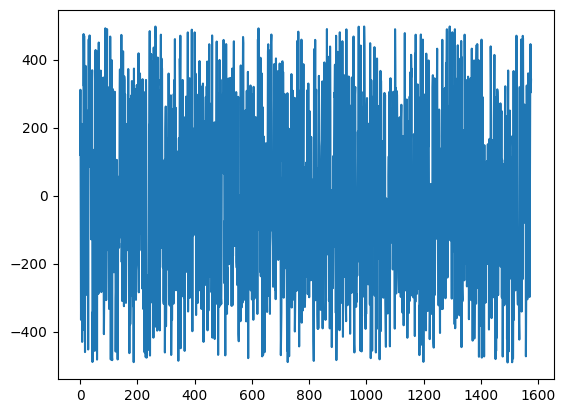

In [ ]:
plt.plot(Tq_pred)

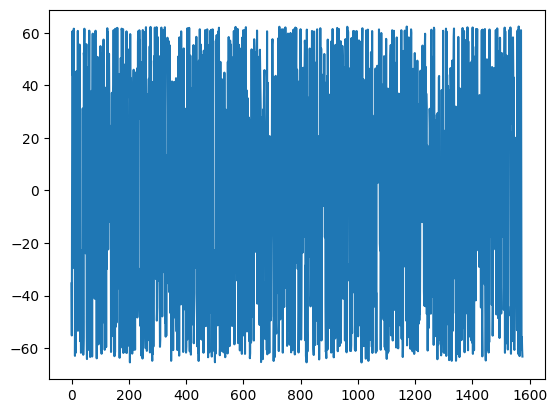

In [ ]:
plt.plot(ud_pred)

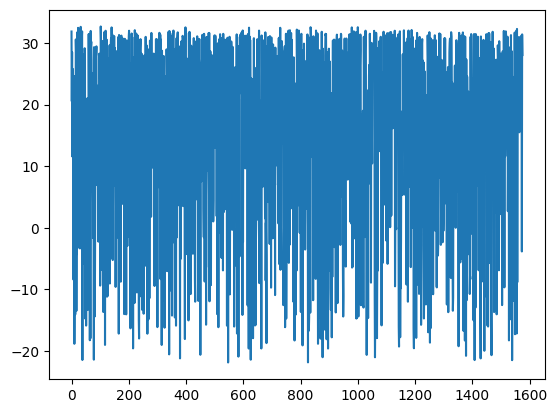

In [ ]:
plt.plot(uq_pred)

##graph

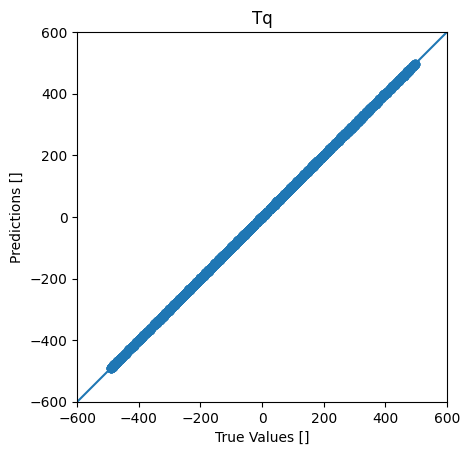

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tq_4_test_list, Tq_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

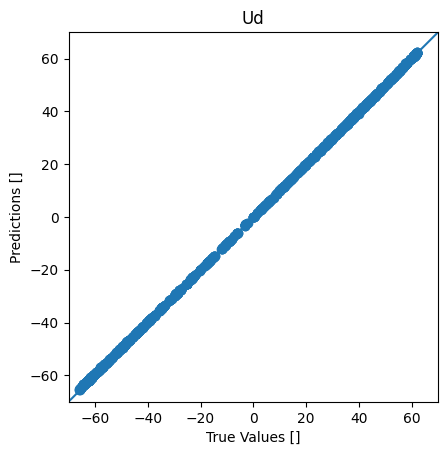

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

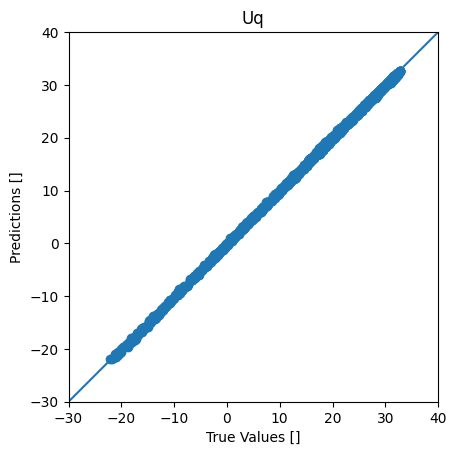

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_4_test_list, uq_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

## actual error

Text(0, 0.5, 'errors[Nm]')

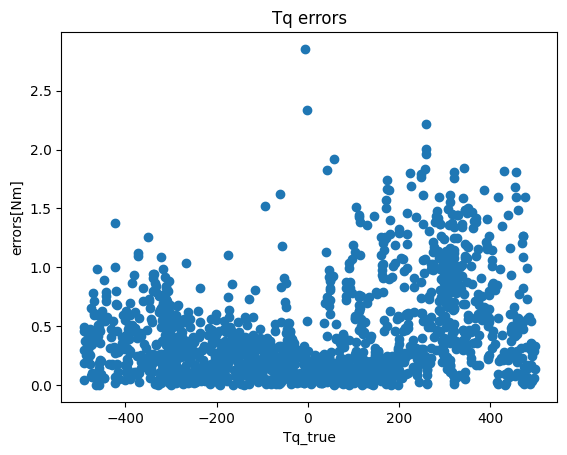

In [ ]:
errors_ud = get_actual_errorList(ud_pred, ud_test_list)
errors_uq = get_actual_errorList(uq_pred, uq_test_list)
errors_Tq = get_actual_errorList(Tq_pred, Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

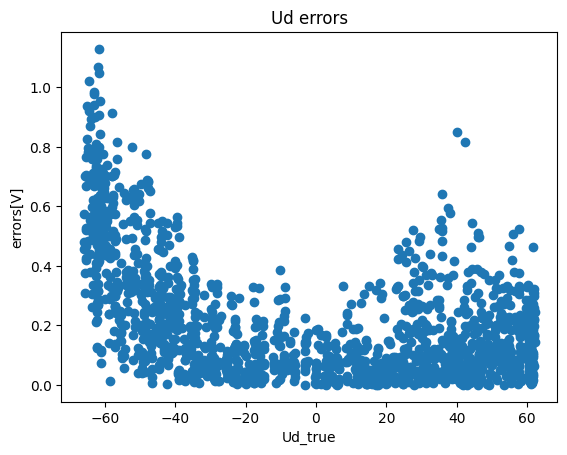

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

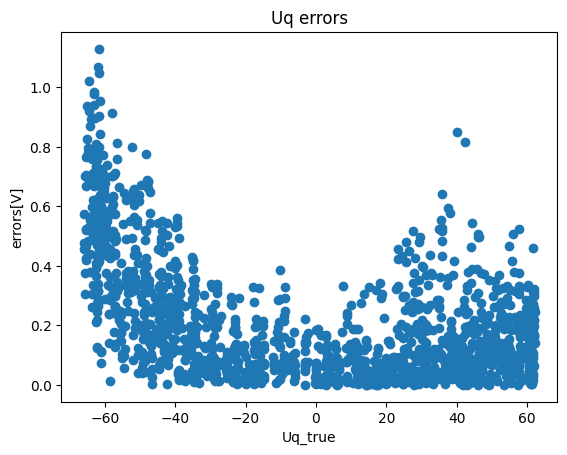

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Uq errors')
plt.xlabel('Uq_true')
plt.ylabel('errors[V]')

## error

Text(0, 0.5, 'errors[%]')

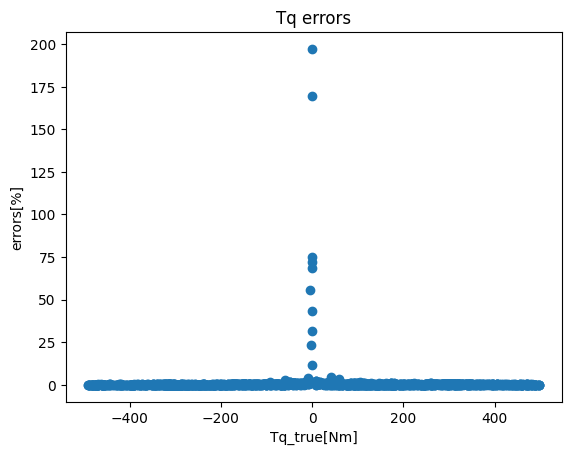

In [ ]:
errors_ud = get_errorList(ud_pred, ud_test_list)
errors_uq = get_errorList(uq_pred, uq_test_list)
errors_Tq = get_errorList(Tq_pred, Tq_test_list)

plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

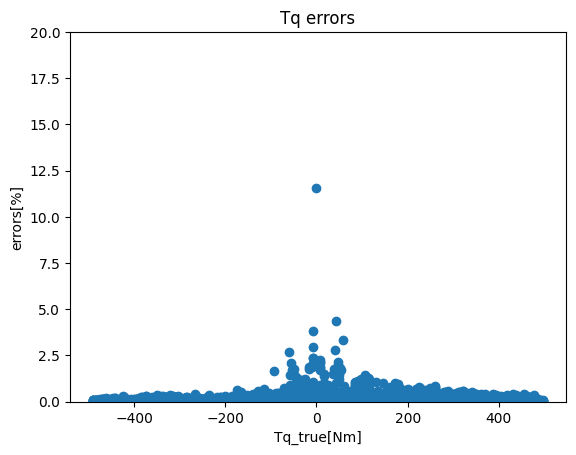

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

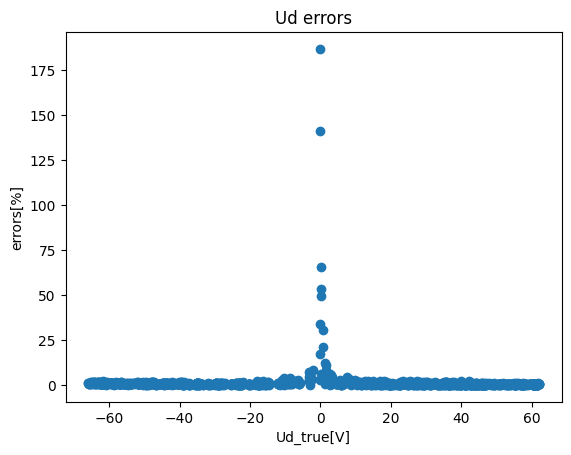

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

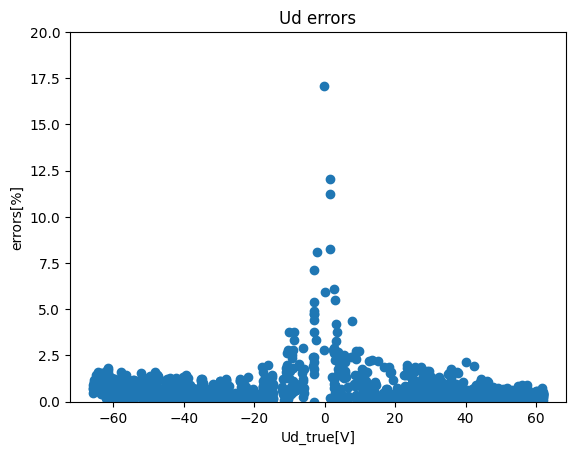

In [ ]:
plt.scatter(ud_test_list, errors_ud)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

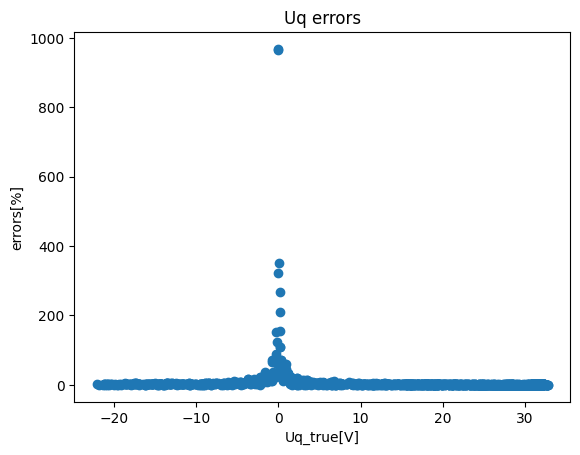

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

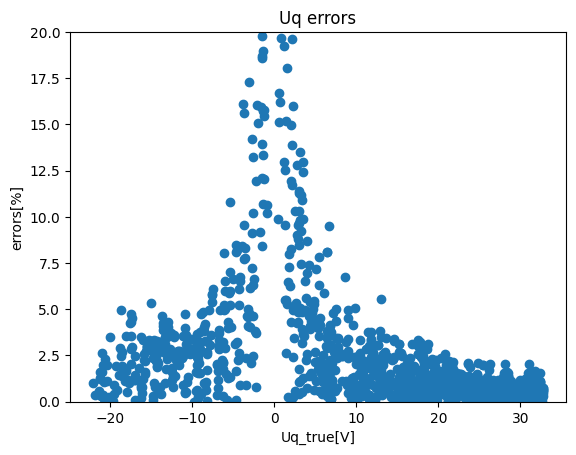

In [ ]:
plt.scatter(uq_test_list, errors_uq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

## NN loss: mape

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 500)               2500      
                                                                 
 dense_9 (Dense)             (None, 500)               250500    
                                                                 
 dense_10 (Dense)            (None, 500)               250500    
                                                                 
 dense_11 (Dense)            (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 5ms/step
28.183534622192383
113.43629119137145 54.61171994293968 10302.800733915807
0.20495119572688072 0.44272010195168326 0.1978346795

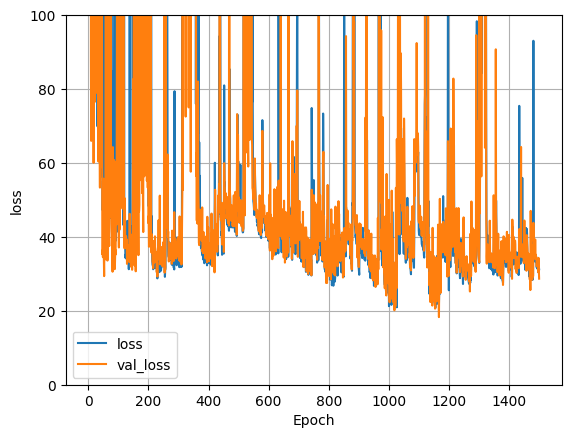

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    # model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
    model_o3_10.compile(optimizer=opt_a, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4r_train, y3_4r_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4r_test, y3_4r_test)
y_pred = model_306090.predict(X3_4r_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4r_test, y_pred, ud_pred, uq_pred, Tq_pred)


## NN for Tq, Ud, Uq

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 500)               2500      
                                                                 
 dense_21 (Dense)            (None, 500)               250500    
                                                                 
 dense_22 (Dense)            (None, 500)               250500    
                                                                 
 dense_23 (Dense)            (None, 500)               250500    
                                                                 
 dense_24 (Dense)            (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

IndexError: ignored

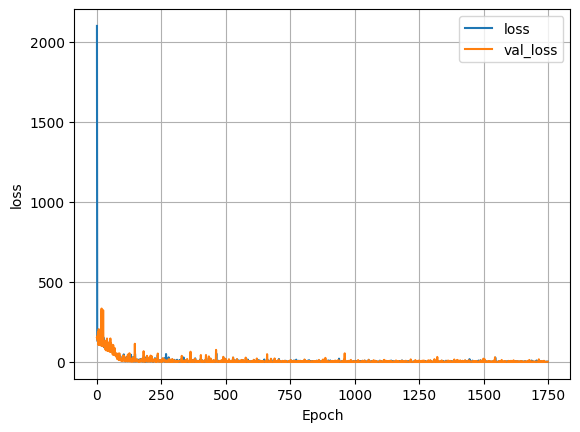

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xtq_train, ytq_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xtq_test, ytq_test)
y_pred = model_306090.predict(Xtq_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(ytq_test, y_pred, ud_pred, uq_pred, Tq_pred)


In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_Tq.h5")

In [ ]:
print(get_MSE_MAPE_R_1(ytq_test, y_pred))

(1.7977699530784734, 0.006931111994999401, 0.9999743261909055)


###load Tq

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_Tq.h5')

y_pred = saved_model.predict(Xtq_test)
print(get_MSE_MAPE_R_1(ytq_test, y_pred))

50/50 [==============================] - 1s 8ms/step
(1.7977689312730714, 0.006931112188928165, 0.9999743262054979)


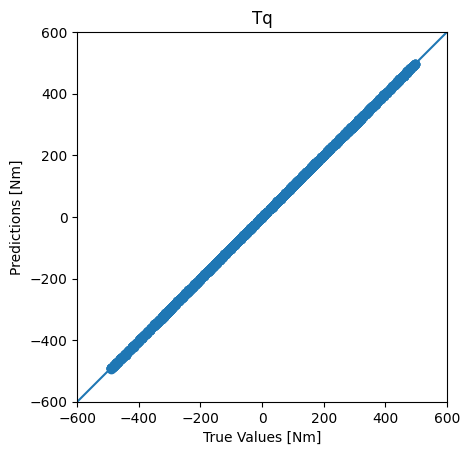

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ytq_test, y_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

####actual error

Text(0, 0.5, 'errors[Nm]')

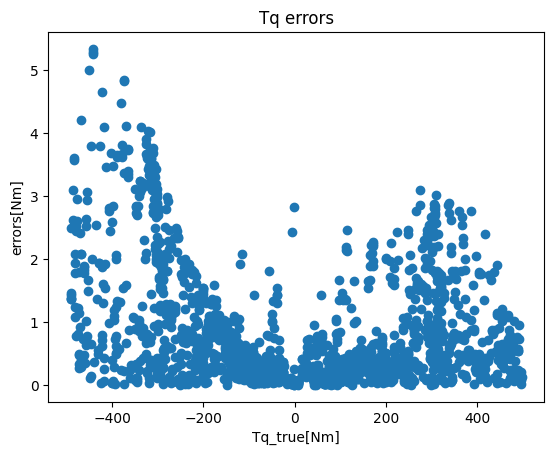

In [ ]:
errors_Tq = get_actual_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

####error

Text(0, 0.5, 'errors[%]')

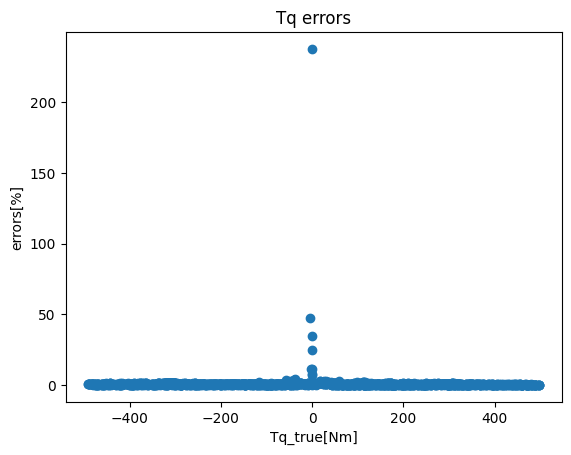

In [ ]:
errors_Tq = get_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

(0.0, 20.0)

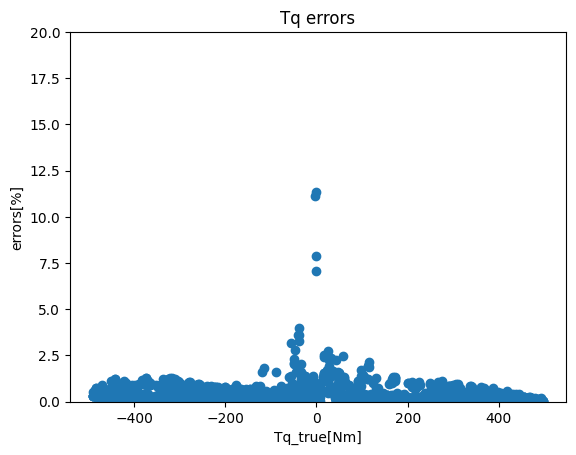

In [ ]:
errors_Tq = get_errorList(y_pred, ytq_test_list)

plt.scatter(ytq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 500)               250500    
                                                                 
 dense_4 (Dense)             (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/st

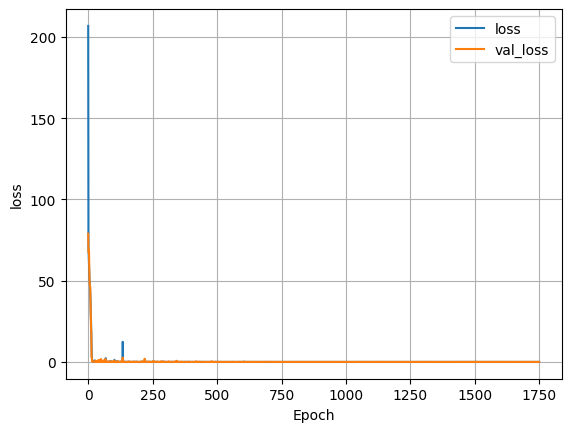

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xuq_train, yuq_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xuq_test, yuq_test)
y_pred = model_306090.predict(Xuq_test)
print(loss_pred)

print(get_MSE_MAPE_R_1(yuq_test, y_pred))

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_uq.h5")

###load Uq

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_uq_2.h5')

y_pred = saved_model.predict(Xuq_test)
print(get_MSE_MAPE_R_1(yuq_test, y_pred))

50/50 [==============================] - 1s 11ms/step
(0.008621803922541516, 0.021840724724947105, 0.9999636465773949)


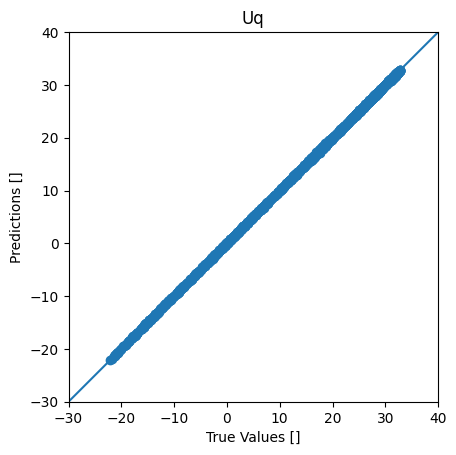

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(yuq_test, y_pred)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

####actual error

Text(0, 0.5, 'errors[V]')

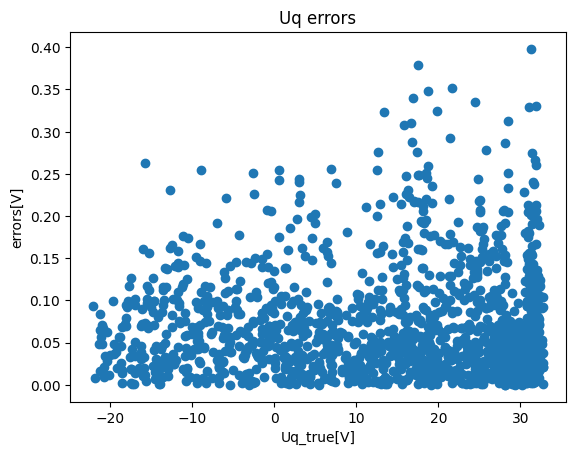

In [ ]:
errors_uq = get_actual_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

####error

Text(0, 0.5, 'errors[%]')

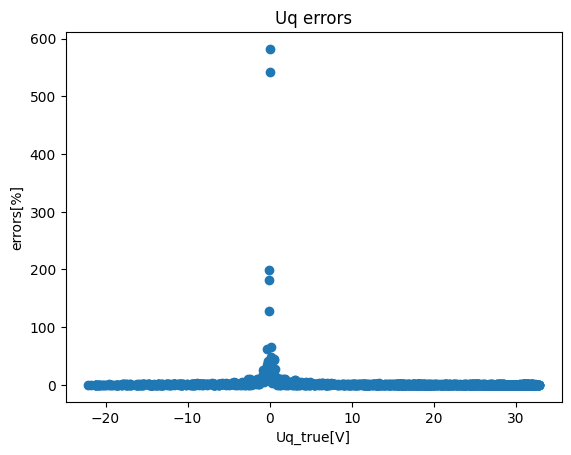

In [ ]:
errors_uq = get_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

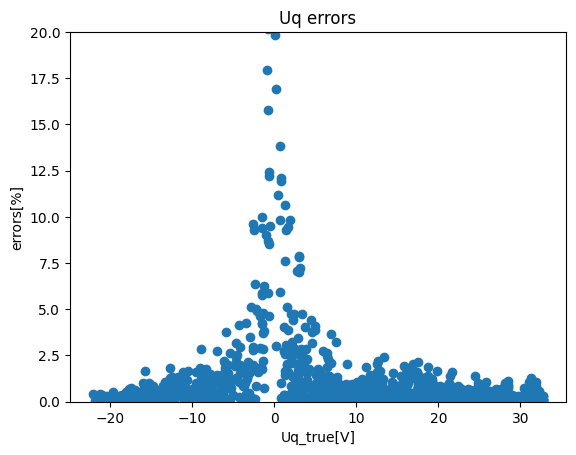

In [ ]:
errors_uq = get_errorList(y_pred, yuq_test_list)

plt.scatter(yuq_test, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 500)               2500      
                                                                 
 dense_11 (Dense)            (None, 500)               250500    
                                                                 
 dense_12 (Dense)            (None, 500)               250500    
                                                                 
 dense_13 (Dense)            (None, 500)               250500    
                                                                 
 dense_14 (Dense)            (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

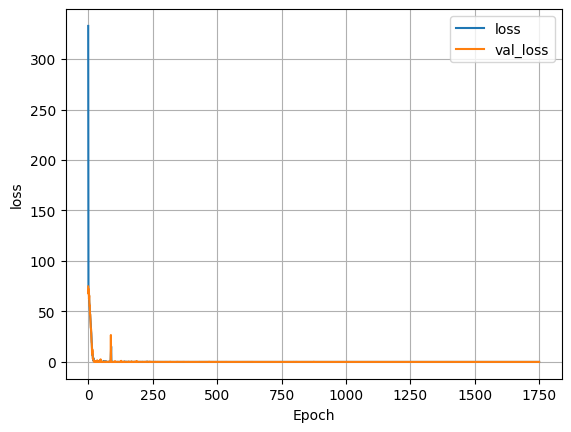

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xuq_train, yuq_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xuq_test, yuq_test)
y_pred = model_306090.predict(Xuq_test)
print(loss_pred)

print(get_MSE_MAPE_R_1(yuq_test, y_pred))

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_uq_2.h5")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 500)               2500      
                                                                 
 dense_6 (Dense)             (None, 500)               250500    
                                                                 
 dense_7 (Dense)             (None, 500)               250500    
                                                                 
 dense_8 (Dense)             (None, 500)               250500    
                                                                 
 dense_9 (Dense)             (None, 1)                 501       
                                                                 
Total params: 754,501
Trainable params: 754,501
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 2ms/

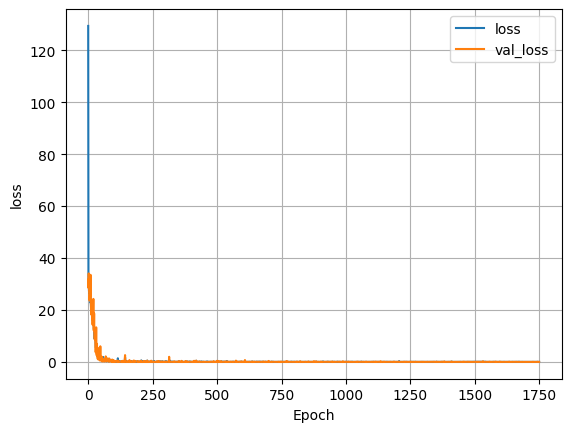

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(1))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(Xud_train, yud_train, epochs=1750, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(Xud_test, yud_test)
y_pred = model_306090.predict(Xud_test)
print(loss_pred)

print(get_MSE_MAPE_R_1(yud_test, y_pred))

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_ud.h5")

###load Ud

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_ud.h5')

y_pred = saved_model.predict(Xud_test)
print(get_MSE_MAPE_R_1(yud_test, y_pred))

50/50 [==============================] - 1s 8ms/step
(0.010752072017948684, 0.008925939337588968, 0.9999942274968461)


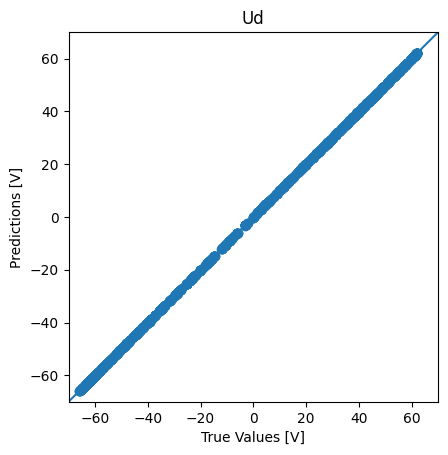

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(yud_test, y_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

#### actual error

Text(0, 0.5, 'errors[V]')

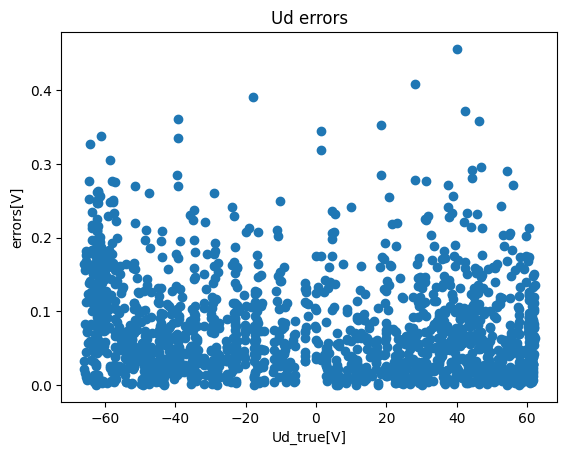

In [ ]:
errors_ud = get_actual_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

####error

Text(0, 0.5, 'errors[%]')

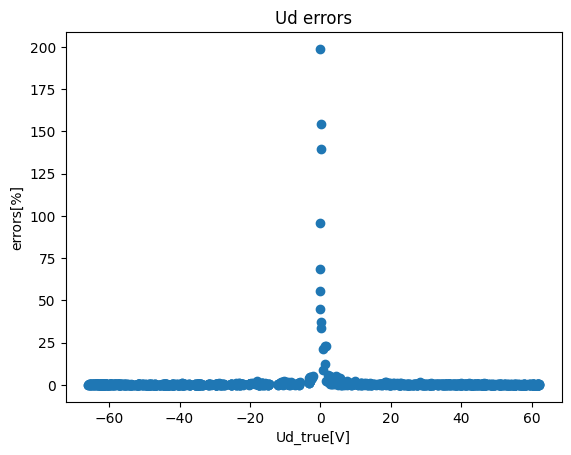

In [ ]:
errors_ud = get_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

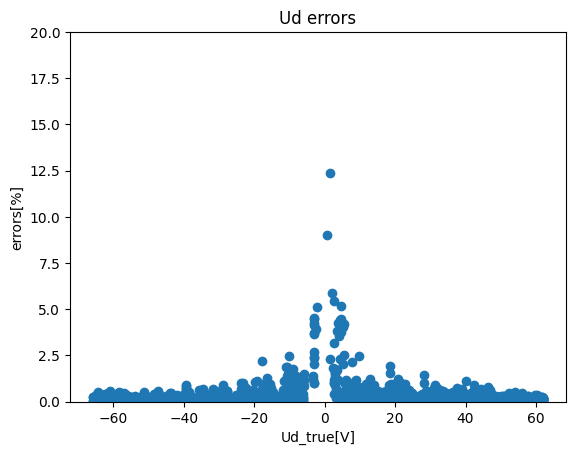

In [ ]:
errors_ud = get_errorList(y_pred, yud_test_list)

plt.scatter(yud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
ylim=[0,20]
plt.ylim(ylim)

#NN 306090 x_raw y_norm

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               2500      
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dense_2 (Dense)             (None, 500)               250500    
                                                                 
 dense_3 (Dense)             (None, 3)                 1503      
                                                                 
Total params: 505,003
Trainable params: 505,003
Non-trainable params: 0
_________________________________________________________________
50/50 [==============================] - 0s 3ms/step
6.664093234576285e-05
7.803583552594988e-05 6.487289618885968e-05 5.701406000489483e-05
0.012893481661017071 0.025387888478259804

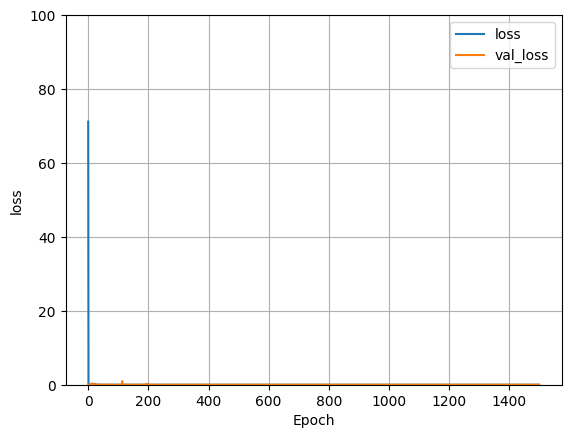

In [ ]:
def regression_model_306090():
    model_o3_10 = Sequential()
    model_o3_10.add(Dense(500, activation='relu', input_shape=(n_inputs,)))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(500, activation='relu'))
    model_o3_10.add(Dense(n_outputs))


#     compile model
    # model.compile(optimizer='adam', loss='mean_absolute_percentage_error')
    opt_a = keras.optimizers.Adam(learning_rate=0.001)
    model_o3_10.compile(optimizer=opt_a, loss='mean_squared_error')
#     model_2.compile(optimizer=opt, loss='mean_absolute_percentage_error')
    return model_o3_10

model_306090 = regression_model_306090()
model_306090.summary()

history_306090 = model_306090.fit(X3_4rn_train, y3_4rn_train, epochs=1500, batch_size=64, verbose=0,
    validation_split = 0.2)
plot_loss(history_306090)

loss_pred = model_306090.evaluate(X3_4rn_test, y3_4rn_test)
y_pred = model_306090.predict(X3_4rn_test)
print(loss_pred)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4rn_test, y_pred, ud_pred, uq_pred, Tq_pred)


## save

In [ ]:
model_306090.save("drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xraw_ynorm.h5")

## load

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xraw_ynorm.h5')

y_pred = saved_model.predict(X3_4rn_test)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4rn_test, y_pred, ud_pred, uq_pred, Tq_pred)


50/50 [==============================] - 1s 7ms/step
7.803583552594988e-05 6.487289618885968e-05 5.701406000489483e-05
0.012893481661017071 0.025387888478259804 0.024028427689517153
0.9999212143927027 0.9999337429880114 0.9999431413740316


## graph

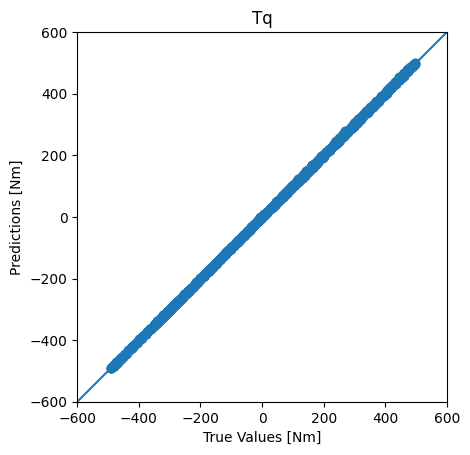

In [ ]:
ud_pred_back = y_pred[:,0] * ud_4.std() + ud_4.mean()
uq_pred_back = y_pred[:,1] * uq_4.std() + uq_4.mean()
Tq_pred_back = y_pred[:,2] * Tq_4.std() + Tq_4.mean()

a = plt.axes(aspect='equal')
plt.scatter(Tq_4_test_list, Tq_pred_back)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

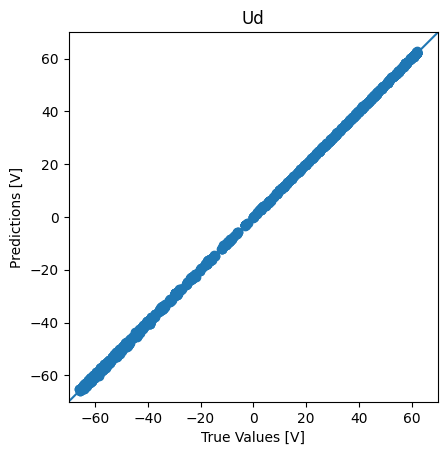

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred_back)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

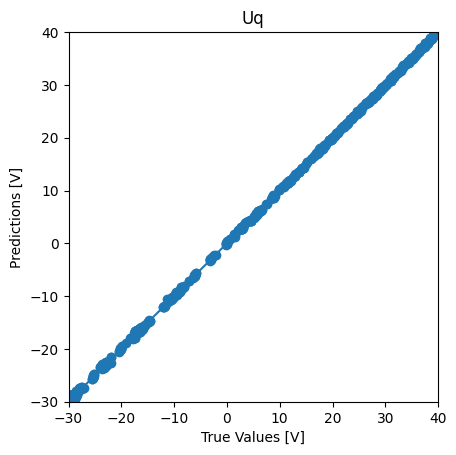

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred_back)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

## inverse normalization

In [ ]:
y_pred

array([[-0.7718719 ,  1.1272054 ,  0.45073733],
       [-1.2432112 ,  0.39126533,  1.182067  ],
       [ 0.1853873 ,  0.88543665, -0.0523357 ],
       ...,
       [-1.2353023 , -1.1674285 ,  1.7175424 ],
       [-1.3652402 ,  1.1043311 ,  1.1457008 ],
       [-1.4130679 ,  0.87958336,  1.2967993 ]], dtype=float32)

In [ ]:
ud_pred_back = y_pred[:,0] * ud_4.std() + ud_4.mean()
uq_pred_back = y_pred[:,1] * uq_4.std() + uq_4.mean()
Tq_pred_back = y_pred[:,2] * Tq_4.std() + Tq_4.mean()

Text(0.5, 1.0, 'Ud')

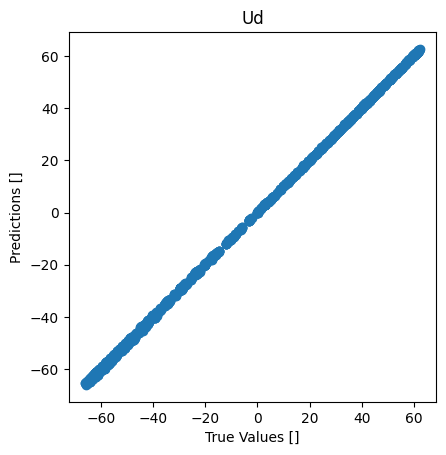

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(ud_4_test_list, ud_pred_back)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Ud')
# lims = [-70, 70]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)

Text(0.5, 1.0, 'Uq')

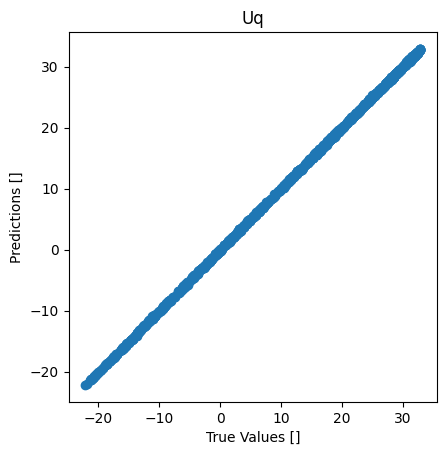

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(uq_4_test_list, uq_pred_back)
plt.xlabel('True Values []')
plt.ylabel('Predictions []')
plt.title('Uq')
# lims = [-70, 70]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)

##actual error

Text(0, 0.5, 'errors[Nm]')

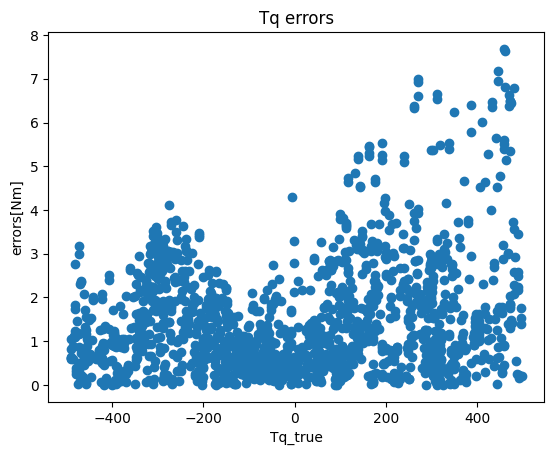

In [ ]:
errors_ud = get_actual_errorList(ud_pred_back, ud_4_test_list)
errors_uq = get_actual_errorList(uq_pred_back, uq_4_test_list)
errors_Tq = get_actual_errorList(Tq_pred_back, Tq_4_test_list)
plt.scatter(Tq_4_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

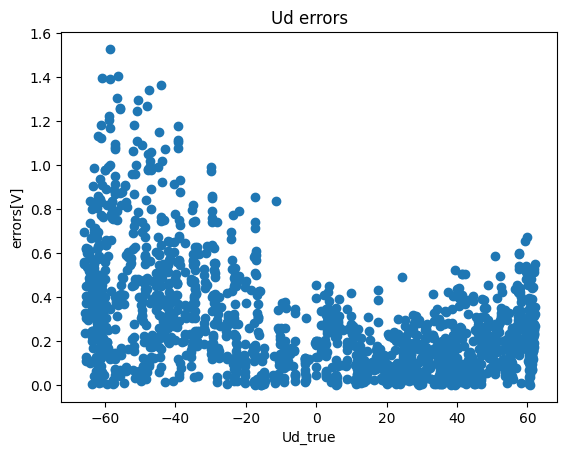

In [ ]:
plt.scatter(ud_4_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

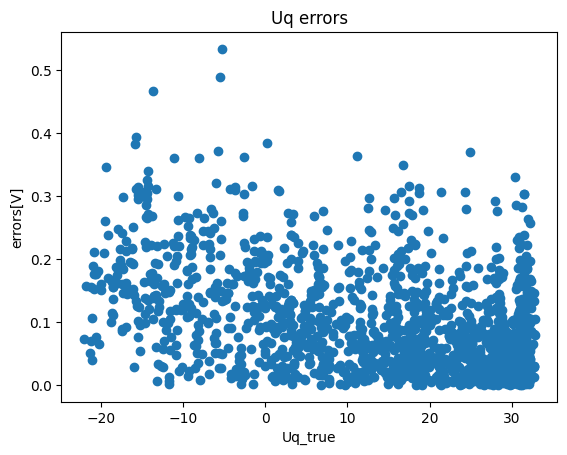

In [ ]:
plt.scatter(uq_4_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true')
plt.ylabel('errors[V]')

##error

Text(0, 0.5, 'errors[%]')

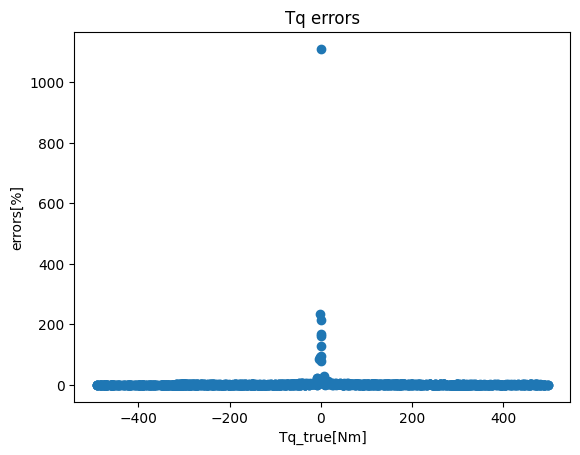

In [ ]:
errors_ud = get_errorList(ud_pred_back, ud_test_list)
errors_uq = get_errorList(uq_pred_back, uq_test_list)
errors_Tq = get_errorList(Tq_pred_back, Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

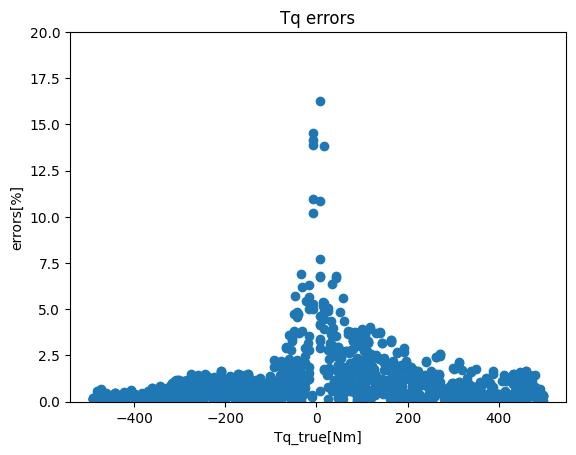

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

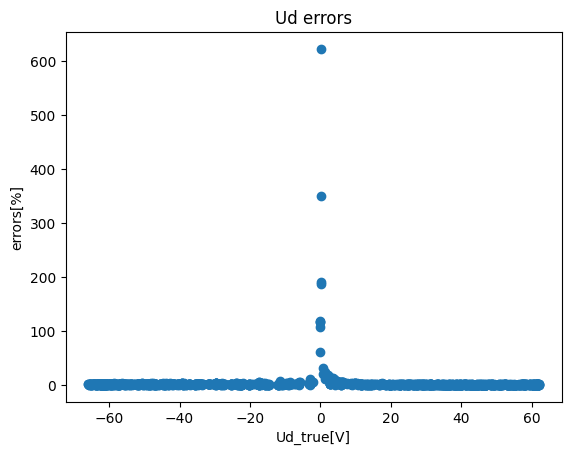

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

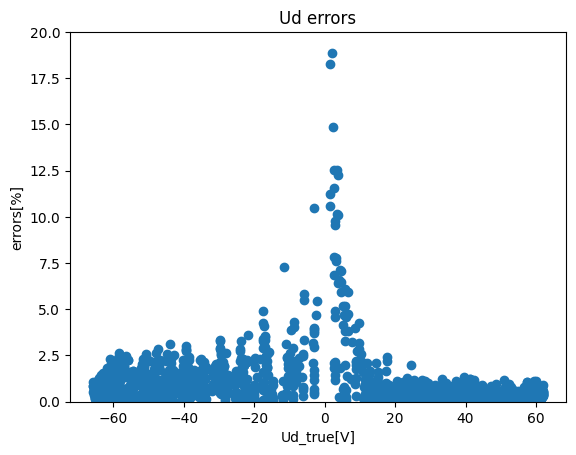

In [ ]:
plt.scatter(ud_test_list, errors_ud)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

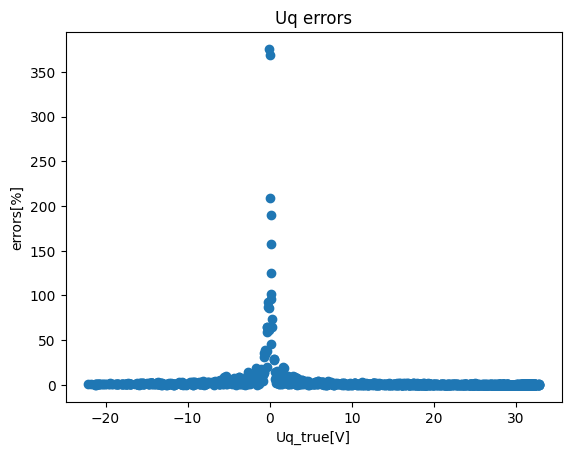

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

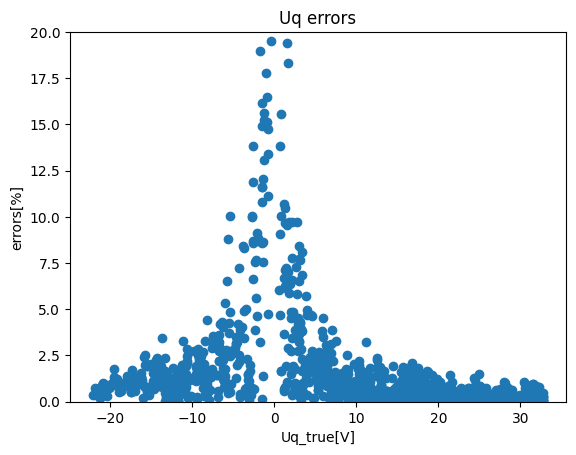

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
plt.ylim(ylims)

#test NN raw 813 60deg

##load x,y=raw

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw.h5')

y_pred = saved_model.predict(X3t_test)
loss_pred = saved_model.evaluate(X3t_test, y3t_test)
print(loss_pred)
y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t_test, y_pred, ud_pred, uq_pred, Tq_pred)


6/6 [==============================] - 0s 3ms/step - loss: 0.5166
0.5166096687316895
0.14884483127074988 0.10251924541970181 1.2984646126326798
0.013331329190085716 0.04575963357449441 0.03668032263529573
0.9999156715840662 0.9996399067375166 0.9999805231547816


In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw.h5')

y_pred = saved_model.predict(X3t)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t, y_pred, ud_pred, uq_pred, Tq_pred)


26/26 [==============================] - 0s 3ms/step
0.1547601367142869 0.10090266349896936 1.1236370931402397
0.05807680386094771 0.053352390383230044 0.01663501125112433
0.9999187516603538 0.9996224167360322 0.9999837164609163


###actual error

Text(0, 0.5, 'errors[Nm]')

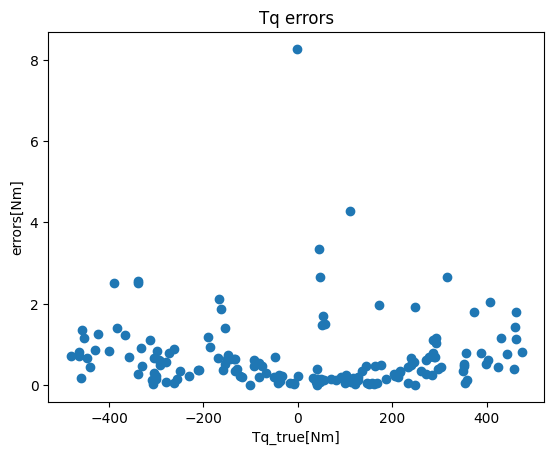

In [ ]:
errors_ud = get_actual_errorList_t(ud_pred, udt_test_list)
errors_uq = get_actual_errorList_t(uq_pred, uqt_test_list)
errors_Tq = get_actual_errorList_t(Tq_pred, Tqt_test_list)
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

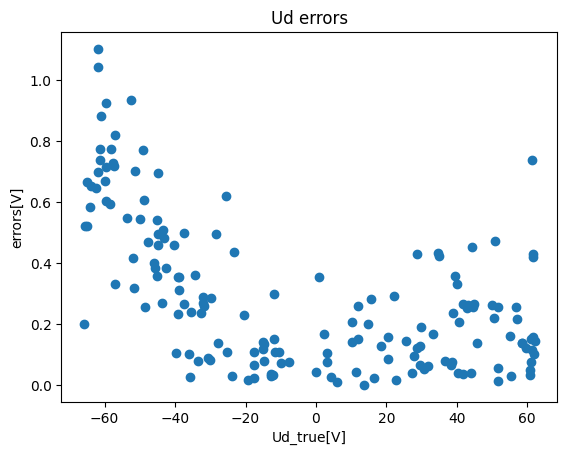

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

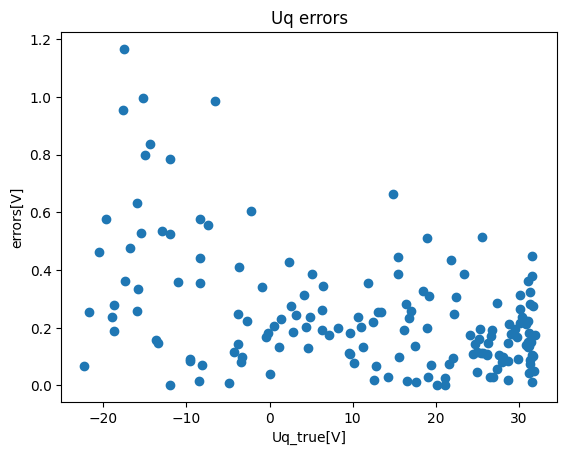

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

###error

Text(0, 0.5, 'errors[%]]')

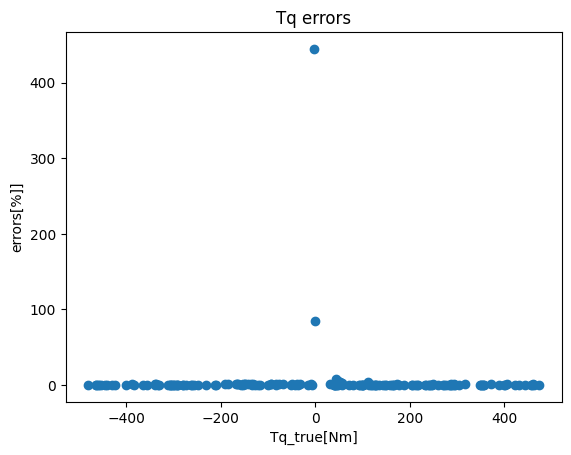

In [ ]:
errors_ud = get_errorList_t(ud_pred, udt_test_list)
errors_uq = get_errorList_t(uq_pred, uqt_test_list)
errors_Tq = get_errorList_t(Tq_pred, Tqt_test_list)
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]]')

(0.0, 20.0)

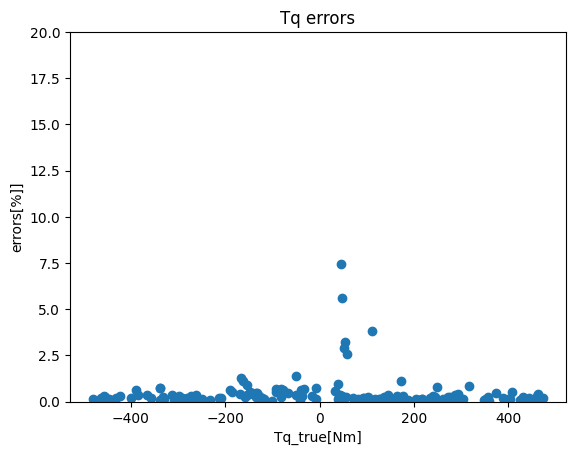

In [ ]:
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

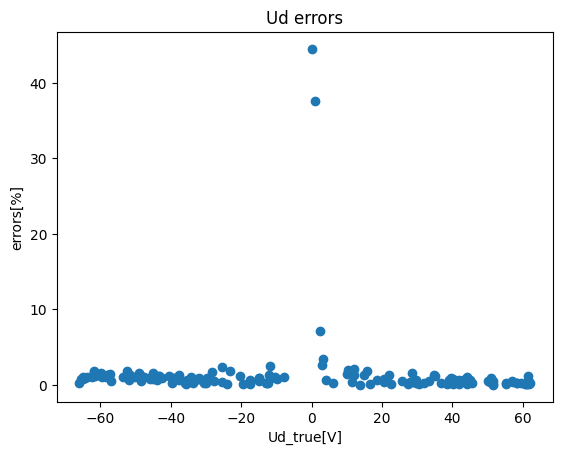

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

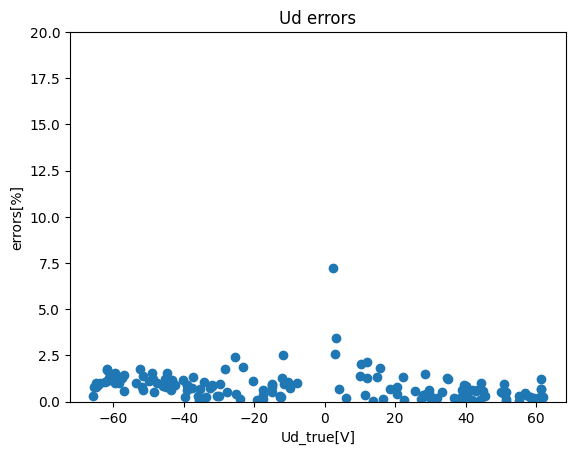

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

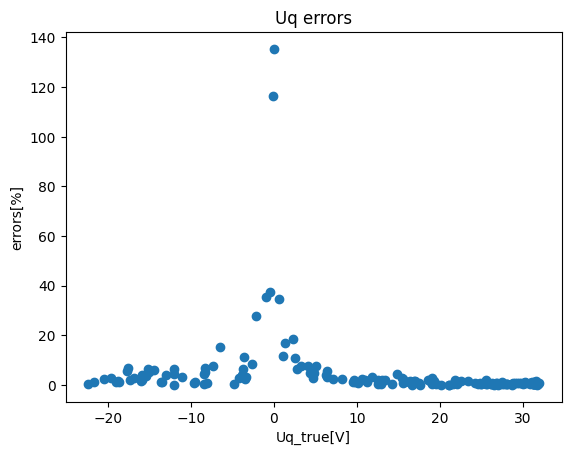

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

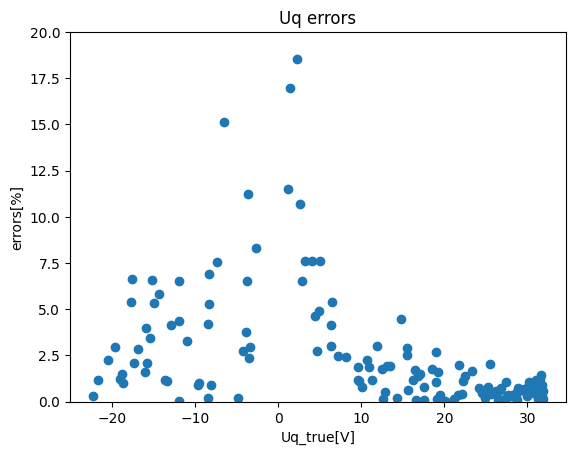

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

## load x_norm

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg.h5')

y_pred = saved_model.predict(X3tn_test)
loss_pred = saved_model.evaluate(X3tn_test, y3tn_test)
print(loss_pred)
y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t_test, y_pred, ud_pred, uq_pred, Tq_pred)


6/6 [==============================] - 0s 4ms/step - loss: 0.2181
0.21811114251613617
0.03935737767424688 0.017238267706257963 0.5977373704825597
0.00749141332519031 0.02993829528457197 0.012095276353303477
0.9999777019780516 0.9999394515241261 0.9999910339965118


## 1output Tq

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_Tq.h5')

y_pred = saved_model.predict(X3ttq_test)
print(get_MSE_MAPE_R_1(y3ttq_test, y_pred))

6/6 [==============================] - 0s 4ms/step
(2.164302961719706, 0.015116524199484803, 0.9999675356622114)


### actual

Text(0, 0.5, 'errors[Nm]')

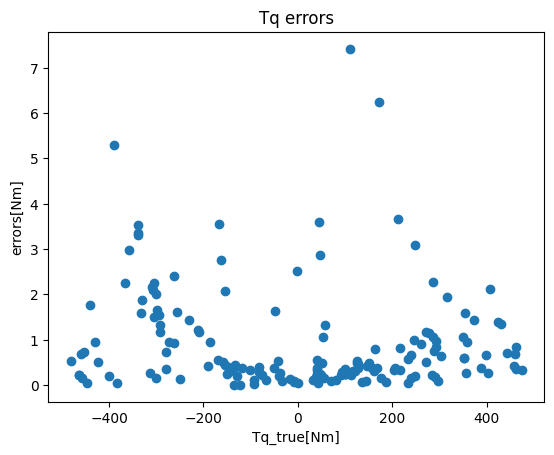

In [ ]:
errors_Tq = get_actual_errorList_t(y_pred, yttq_test_list)

plt.scatter(y3ttq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

###error

Text(0, 0.5, 'errors[%]')

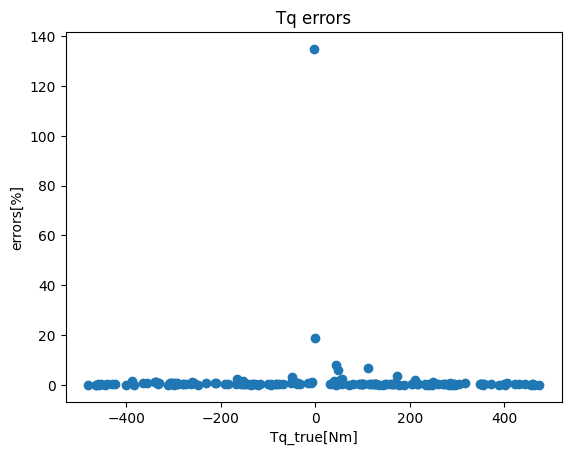

In [ ]:
errors_Tq = get_errorList_t(y_pred, yttq_test_list)

plt.scatter(y3ttq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

(0.0, 20.0)

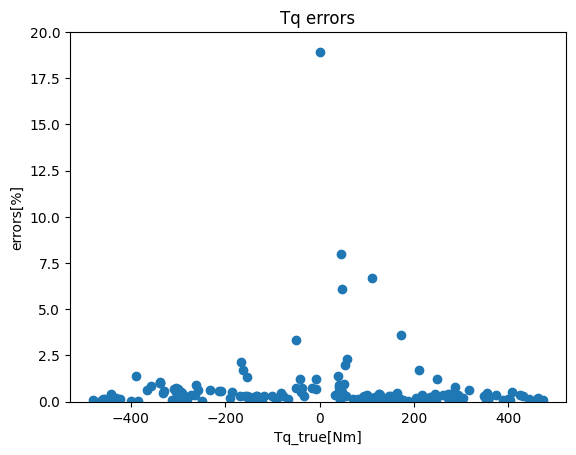

In [ ]:
errors_Tq = get_errorList_t(y_pred, yttq_test_list)

plt.scatter(y3ttq_test, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

## Ud

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_ud.h5')

y_pred = saved_model.predict(X3tud_test)
print(get_MSE_MAPE_R_1(y3tud_test, y_pred))

6/6 [==============================] - 0s 4ms/step
(0.03358965035089595, 0.011640963028300472, 0.9999809696985668)


###actual

Text(0, 0.5, 'errors[V]')

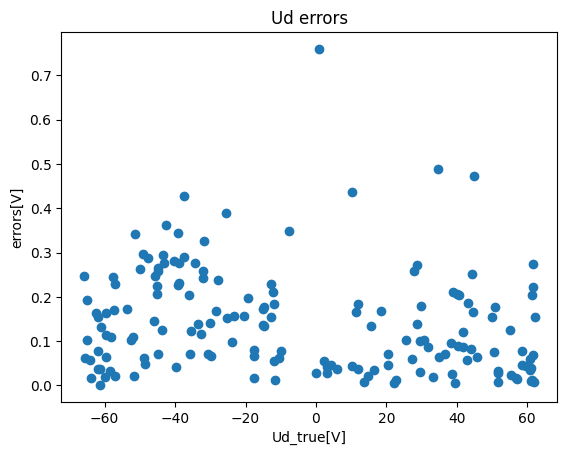

In [ ]:
errors_ud = get_actual_errorList_t(y_pred, ytud_test_list)

plt.scatter(y3tud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

###error

Text(0, 0.5, 'errors[%]')

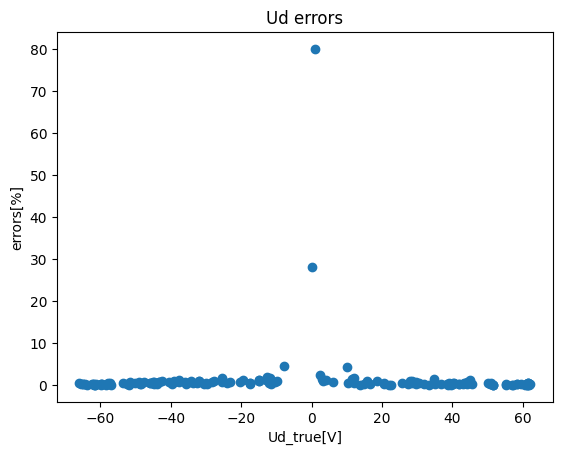

In [ ]:
errors_ud = get_errorList_t(y_pred, ytud_test_list)

plt.scatter(y3tud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

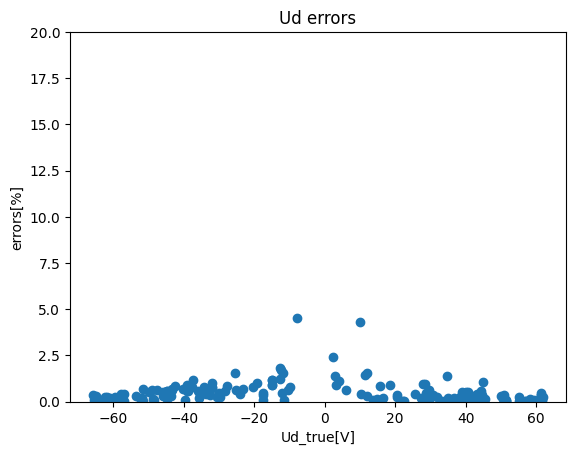

In [ ]:
errors_ud = get_errorList_t(y_pred, ytud_test_list)

plt.scatter(y3tud_test, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

##Uq

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw_uq.h5')

y_pred = saved_model.predict(X3tuq_test)
print(get_MSE_MAPE_R_1(y3tuq_test, y_pred))

6/6 [==============================] - 0s 4ms/step
(0.03749629483621339, 0.07158211909258044, 0.999868296307846)


### actual

Text(0, 0.5, 'errors[V]')

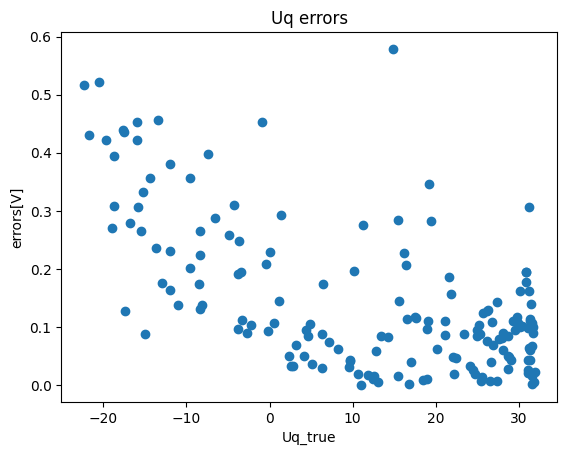

In [ ]:
errors_uq = get_actual_errorList_t(y_pred, ytuq_test_list)

plt.scatter(ytuq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true')
plt.ylabel('errors[V]')

###error

Text(0, 0.5, 'errors[%]')

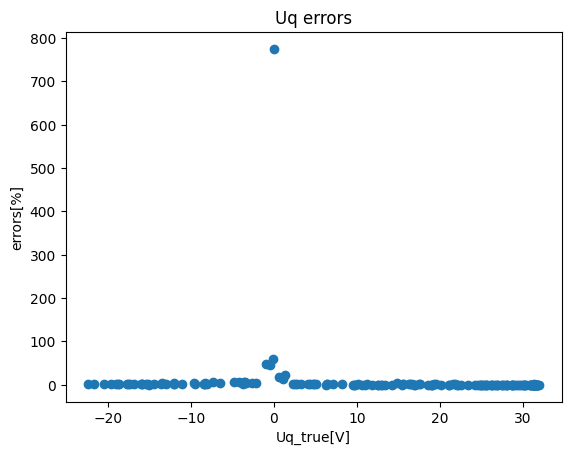

In [ ]:
errors_uq = get_errorList_t(y_pred, ytuq_test_list)
plt.scatter(ytuq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
# plt.ylim(ylims)

(0.0, 20.0)

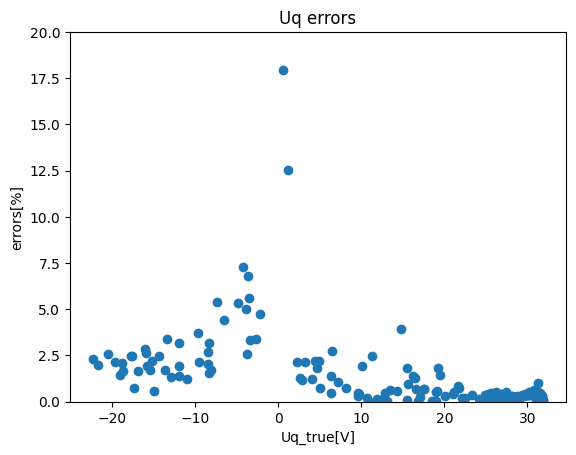

In [ ]:
errors_uq = get_errorList_t(y_pred, ytuq_test_list)
plt.scatter(ytuq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
plt.ylim(ylims)

## load x=raw, y=norm

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xraw_ynorm.h5')

y_pred = saved_model.predict(X3t_test)

y_pred_list = y_pred.tolist()

ud_pred_back = y_pred[:,0] * ud_4.std() + ud_4.mean()
uq_pred_back = y_pred[:,1] * uq_4.std() + uq_4.mean()
Tq_pred_back = y_pred[:,2] * Tq_4.std() + Tq_4.mean()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t_test, y_pred, ud_pred_back, uq_pred_back, Tq_pred_back)


6/6 [==============================] - 0s 6ms/step
0.3121223827533982 0.015479743521619573 7.527353280924437
0.02698228612788857 0.03302586706027178 0.040909756493155355
0.9998231662739622 0.9999456282444893 0.9998870904194614


In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_xraw_ynorm.h5')

y_pred = saved_model.predict(X3t)

y_pred_list = y_pred.tolist()

ud_pred_back = y_pred[:,0] * ud_4.std() + ud_4.mean()
uq_pred_back = y_pred[:,1] * uq_4.std() + uq_4.mean()
Tq_pred_back = y_pred[:,2] * Tq_4.std() + Tq_4.mean()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3t, y_pred, ud_pred_back, uq_pred_back, Tq_pred_back)


26/26 [==============================] - 0s 3ms/step
0.30920884722830266 0.015612385243445014 7.957510702381198
0.03443352543112995 0.023766041419716877 0.028481586780204196
0.9998376668179895 0.9999415776038598 0.9998846812397686


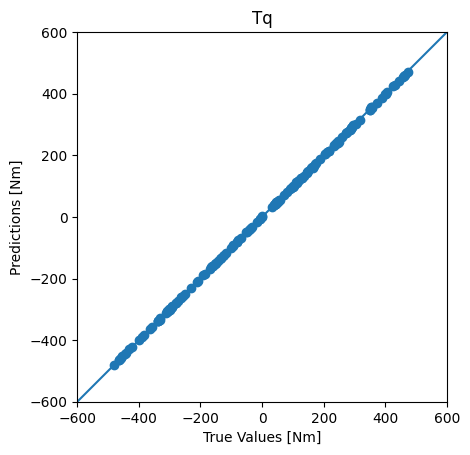

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(Tqt_test_list, Tq_pred)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

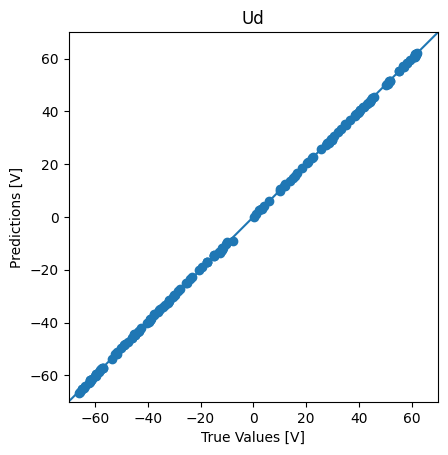

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(udt_test_list, ud_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

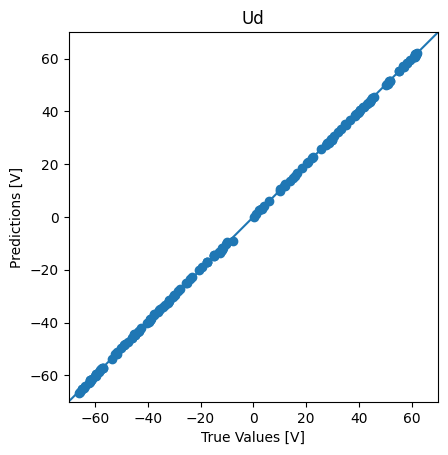

In [ ]:
a = plt.axes(aspect='equal')
plt.scatter(udt_test_list, ud_pred)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

### actual error

Text(0, 0.5, 'errors[Nm]')

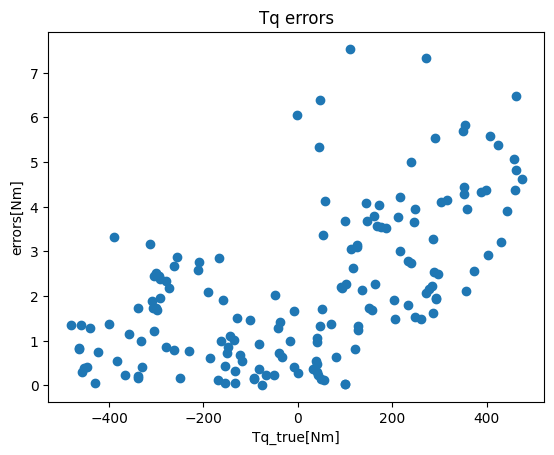

In [ ]:
errors_ud = get_actual_errorList_t(ud_pred_back, udt_test_list)
errors_uq = get_actual_errorList_t(uq_pred_back, uqt_test_list)
errors_Tq = get_actual_errorList_t(Tq_pred_back, Tqt_test_list)
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

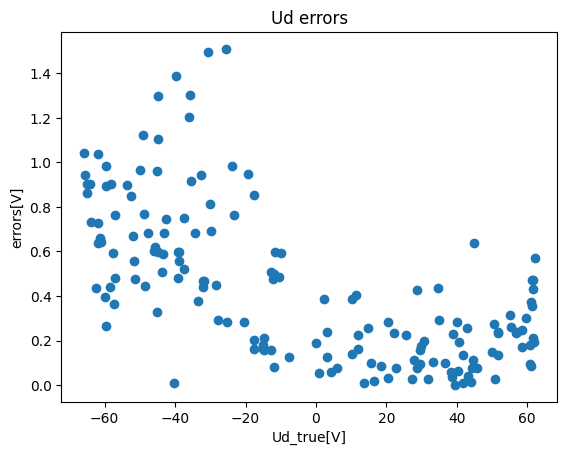

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

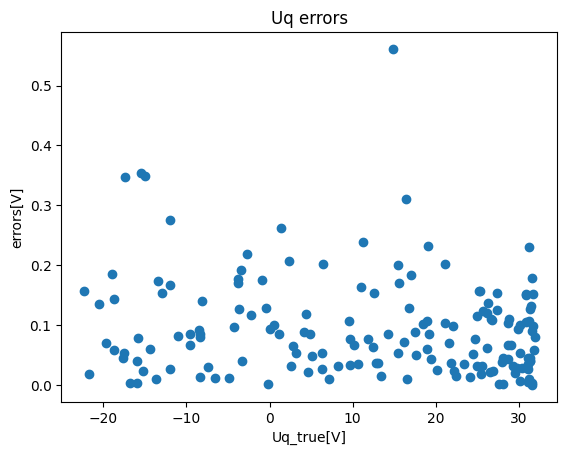

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

###error

Text(0, 0.5, 'errors[%]')

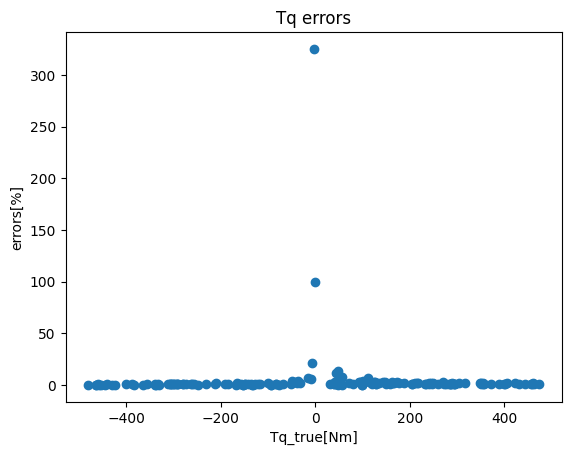

In [ ]:
errors_ud = get_errorList_t(ud_pred_back, udt_test_list)
errors_uq = get_errorList_t(uq_pred_back, uqt_test_list)
errors_Tq = get_errorList_t(Tq_pred_back, Tqt_test_list)
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

(0.0, 20.0)

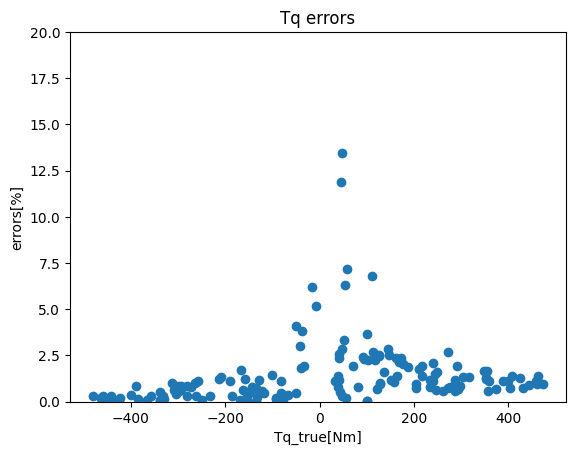

In [ ]:
errors_ud = get_errorList_t(ud_pred_back, udt_test_list)
errors_uq = get_errorList_t(uq_pred_back, uqt_test_list)
errors_Tq = get_errorList_t(Tq_pred_back, Tqt_test_list)
plt.scatter(Tqt_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

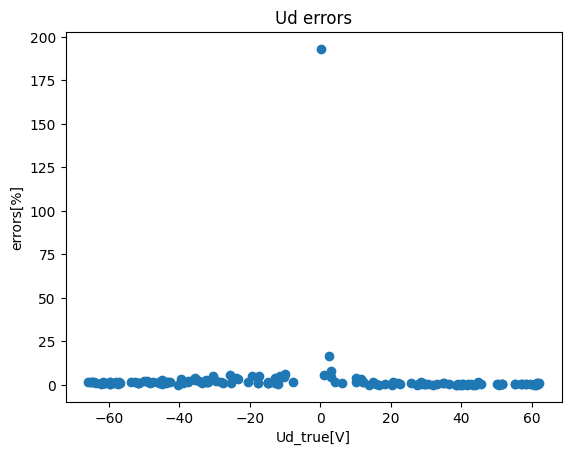

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

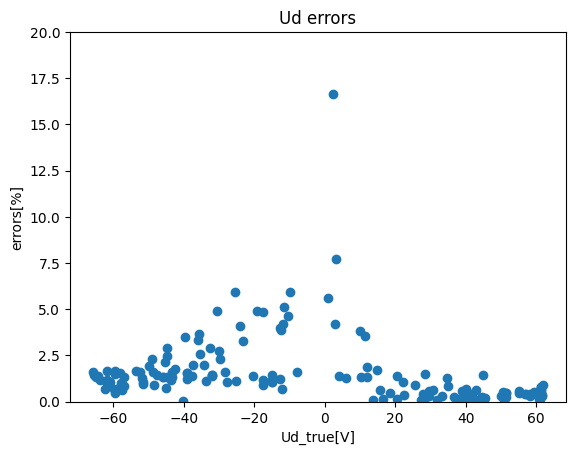

In [ ]:
plt.scatter(udt_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

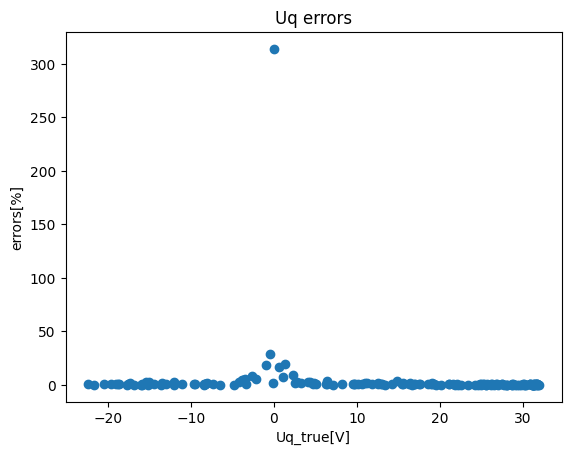

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

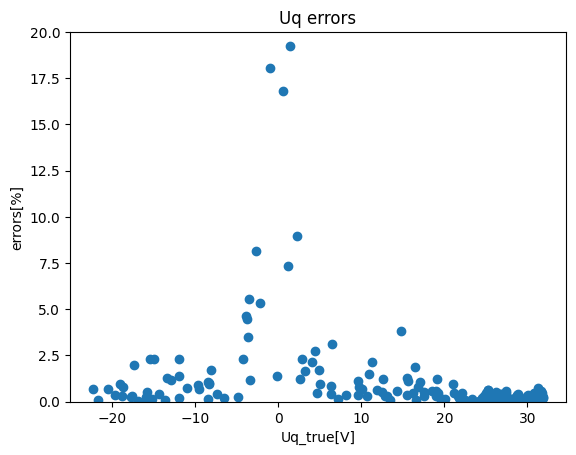

In [ ]:
plt.scatter(uqt_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

# For Loss NN predict Tq_el using Eff data

## load model

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg_raw4.h5')

In [ ]:
from tensorflow.keras.models import load_model
saved_model = load_model('drive/My Drive/Jupyter/model/parameters/model_30_60_90deg.h5')

## predict

In [ ]:
y_pred = saved_model.predict(X3_l1)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

# MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


161/161 [==============================] - 1s 5ms/step


In [ ]:
y_pred = saved_model.predict(X3_l1_norm)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

# MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


161/161 [==============================] - 4s 2ms/step


In [ ]:
y_pred = saved_model.predict(X3_l)

y_pred_list = y_pred.tolist()

ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

# MSE_ud, MSE_uq, MSE_Tq, MAPE_ud, MAPE_uq, MAPE_Tq, R2_ud, R2_uq, R2_Tq = get_MSE_MAPE_R(y3_4_test, y_pred, ud_pred, uq_pred, Tq_pred)


1/1 [==============================] - 0s 69ms/step


In [ ]:
Tq_pred

[-252.4447021484375]

In [ ]:
Tq_pred

[-252.4447021484375]

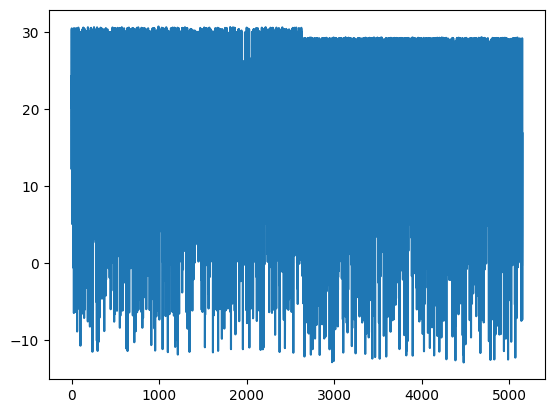

In [ ]:
# a = plt.axes(aspect='equal')
plt.plot(uq_pred)

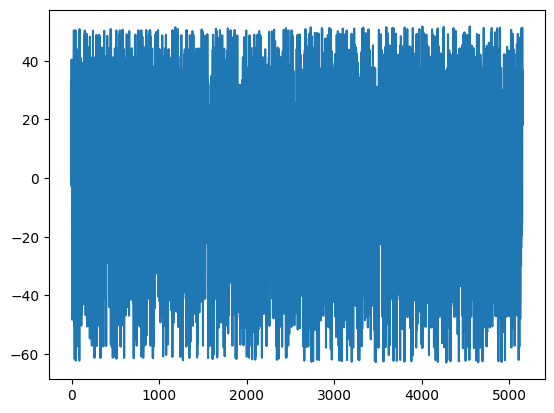

In [ ]:
# a = plt.axes(aspect='equal')
plt.plot(ud_pred)

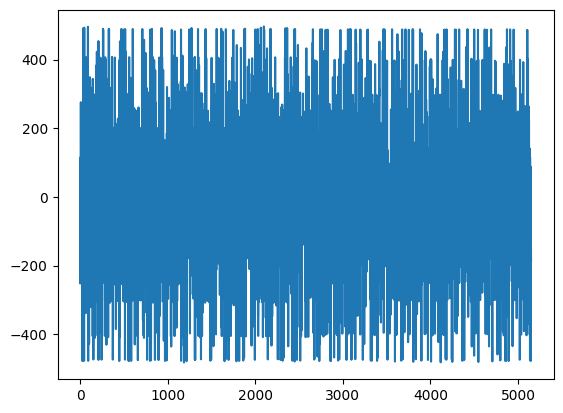

In [ ]:
plt.plot(Tq_pred)

In [ ]:
ud_pred[0:5]

[-2.6019644737243652,
 40.41516876220703,
 2.9804372787475586,
 -2.4685354232788086,
 32.94293975830078]

In [ ]:
uq_pred[0:5]

[21.573894500732422,
 12.248162269592285,
 29.877965927124023,
 30.002403259277344,
 20.054651260375977]

In [ ]:
Tq_pred[0:5]

[4.148606300354004,
 -251.51060485839844,
 -8.8854341506958,
 5.77288293838501,
 -157.5990447998047]

## convert to csv

In [ ]:
# Tq = Tq_pred
# dict = {'Tq_el':Tq}
# df_csv = pd.DataFrame(dict)
# df_csv.to_csv('drive/My Drive/Jupyter/data/Tq_el.csv')

In [ ]:
# Tq = Tq_pred
# A = [float(x) for x in Tq]
# print(type(A[0]))

<class 'float'>


In [ ]:
Tq = Tq_pred
A = [float(x) for x in Tq]
print(type(A[0]))
dict = {'Tq_el':A}
df_csv = pd.DataFrame(dict)
df_csv.to_excel('drive/My Drive/Jupyter/data/Tq_el_norm.xlsx')

<class 'float'>


In [ ]:
df_csv.head()

,Tq_el
0,12.020866
1,-396.283142
2,-9.925191
3,11.313522
4,-254.607834


In [ ]:
X3_l1.head()

,Id,Iq,Trot,Rs
0,-143.776187,6.461964,31.665667,0.009105
1,-277.929566,-373.323758,31.967909,0.009105
2,-1.986945,-19.795915,31.419987,0.009211
3,-2.881526,13.636155,31.408680,0.009246
4,-145.186593,-270.815881,31.389416,0.009175


# Machine learning

### Random forest

In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error


# Create a random forest regression model for each output
rf_reg1 = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=42)
rf_reg2 = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=24)
rf_reg3 = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=88)

# Train each model on the training data
rf_reg1.fit(Xtq2_train, ytq2_train)
rf_reg2.fit(Xud2_train, yud2_train)
rf_reg3.fit(Xuq2_train, yuq2_train)

# Make predictions on the testing data for each output
Tq_pred = rf_reg1.predict(Xtq2_test)
ud_pred = rf_reg2.predict(Xud2_test)
uq_pred = rf_reg3.predict(Xuq2_test)

# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, ud_pred)
mse2 = mean_squared_error(yuq2_test, uq_pred)
mse3 = mean_squared_error(ytq2_test, Tq_pred)

mape1 = mean_absolute_percentage_error(yud2_test, ud_pred)
mape2 = mean_absolute_percentage_error(yuq2_test, uq_pred)
mape3 = mean_absolute_percentage_error(ytq2_test, Tq_pred)

r2_1 = r2_score(yud2_test, ud_pred)
r2_2 = r2_score(yuq2_test, uq_pred)
r2_3 = r2_score(ytq2_test, Tq_pred)

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 0.020994118706006565
MSE for output 2: 0.03567499983782455
MSE for output 3: 8.12573076716373
MAPE for output 1: 0.011779610590709784
MAPE for output 2: 0.024967120109151145
MAPE for output 3: 0.00950354816222934
R2 for output 1: 0.9999886387054854
R2 for output 2: 0.9998566608353668
R2 for output 3: 0.9998814586922973


### Decision tree

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

dt_reg1=DecisionTreeRegressor(max_depth= 50, min_samples_leaf=1, min_samples_split=2, random_state=42)
dt_reg2=DecisionTreeRegressor(max_depth= 50, min_samples_leaf=1, min_samples_split=2, random_state=42)
dt_reg3=DecisionTreeRegressor(max_depth= 50, min_samples_leaf=1, min_samples_split=2, random_state=42)

# Train each model on the training data
dt_reg1.fit(Xtq2_train, ytq2_train)
dt_reg2.fit(Xud2_train, yud2_train)
dt_reg3.fit(Xuq2_train, yuq2_train)

# Make predictions on the testing data for each output
Tq_pred = dt_reg1.predict(Xtq2_test)
ud_pred = dt_reg2.predict(Xud2_test)
uq_pred = dt_reg3.predict(Xuq2_test)

# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, ud_pred)
mse2 = mean_squared_error(yuq2_test, uq_pred)
mse3 = mean_squared_error(ytq2_test, Tq_pred)

mape1 = mean_absolute_percentage_error(yud2_test, ud_pred)
mape2 = mean_absolute_percentage_error(yuq2_test, uq_pred)
mape3 = mean_absolute_percentage_error(ytq2_test, Tq_pred)

r2_1 = r2_score(yud2_test, ud_pred)
r2_2 = r2_score(yuq2_test, uq_pred)
r2_3 = r2_score(ytq2_test, Tq_pred)

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 0.048197033866891156
MSE for output 2: 0.08958751210959771
MSE for output 3: 14.158871715866267
MAPE for output 1: 0.012516196798541228
MAPE for output 2: 0.04262922269348269
MAPE for output 3: 0.008583292580199145
R2 for output 1: 0.9999739174240101
R2 for output 2: 0.9996400448715983
R2 for output 3: 0.9997934448953716


##knn

In [ ]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

kn_reg1=KNeighborsRegressor(n_neighbors=3, p=2, weights='distance')
kn_reg2=KNeighborsRegressor(n_neighbors=3, p=2, weights='distance')
kn_reg3=KNeighborsRegressor(n_neighbors=3, p=2, weights='distance')

# Train each model on the training data
kn_reg1.fit(Xtq2_train, ytq2_train)
kn_reg2.fit(Xud2_train, yud2_train)
kn_reg3.fit(Xuq2_train, yuq2_train)

# Make predictions on the testing data for each output
Tq_pred = dt_reg1.predict(Xtq2_test)
ud_pred = dt_reg2.predict(Xud2_test)
uq_pred = dt_reg3.predict(Xuq2_test)

# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, ud_pred)
mse2 = mean_squared_error(yuq2_test, uq_pred)
mse3 = mean_squared_error(ytq2_test, Tq_pred)

mape1 = mean_absolute_percentage_error(yud2_test, ud_pred)
mape2 = mean_absolute_percentage_error(yuq2_test, uq_pred)
mape3 = mean_absolute_percentage_error(ytq2_test, Tq_pred)

r2_1 = r2_score(yud2_test, ud_pred)
r2_2 = r2_score(yuq2_test, uq_pred)
r2_3 = r2_score(ytq2_test, Tq_pred)

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 0.048197033866891156
MSE for output 2: 0.08958751210959771
MSE for output 3: 14.158871715866267
MAPE for output 1: 0.012516196798541228
MAPE for output 2: 0.04262922269348269
MAPE for output 3: 0.008583292580199145
R2 for output 1: 0.9999739174240101
R2 for output 2: 0.9996400448715983
R2 for output 3: 0.9997934448953716


# 3 outputs ML

## knn 3 output

In [ ]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error


y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a KNN regression model
knn = KNeighborsRegressor(n_neighbors=3, p=2, weights='distance')

# Train the model on the training data
knn.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = knn.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 3.1352537409441896
MSE for output 2: 0.2896256488492529
MSE for output 3: 160.62761489685545
MAPE for output 1: 0.16855692834963532
MAPE for output 2: 0.09860389664387233
MAPE for output 3: 0.13571508757991976
R2 for output 1: 0.9983167651706868
R2 for output 2: 0.9987788073465267
R2 for output 3: 0.997706089862559


##initial

In [ ]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a KNN regression model
knn = KNeighborsRegressor()

# Train the model on the training data
knn.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = knn.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 3.3297823458883578
MSE for output 2: 0.3706863501178776
MSE for output 3: 174.17843755480084
MAPE for output 1: 0.1428428627379526
MAPE for output 2: 0.10077593487975867
MAPE for output 3: 0.15276124825239112
R2 for output 1: 0.9982123279065306
R2 for output 2: 0.9984370187885452
R2 for output 3: 0.9975125716466179


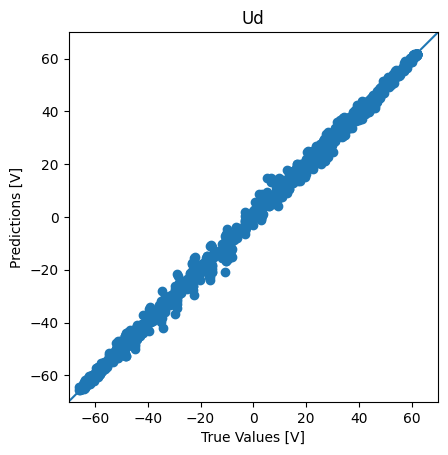

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

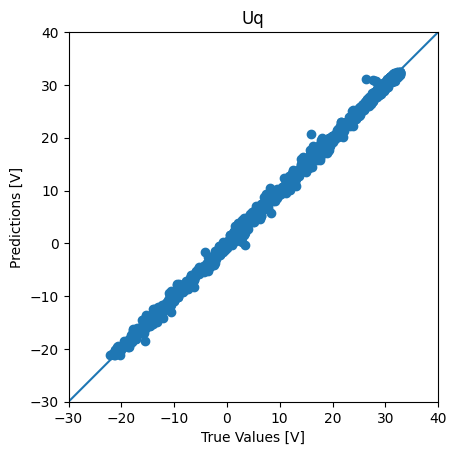

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

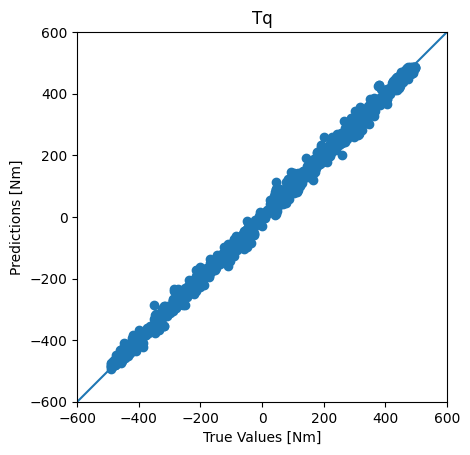

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

### gridsearch

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
knn = KNeighborsRegressor()
param_grid = {'n_neighbors': [3, 5, 7], 'weights': ['uniform', 'distance'], 'p': [1, 2]}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(knn, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3_4, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])
    print("std:", -grid_search.cv_results_['std_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.2193917833723044
std: -0.020576691303680786
Output 2
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.04980313086297626
std: -0.006940304755922185
Output 3
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.24516152996952995
std: -0.043178350209643286
Best Accuracy for -0.04858 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-0.2194, std=0.02058 using {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
mean=-0.0498, std=0.00694 using {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
mean=-0.2452, std=0.04318 using {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
mean=-0.04858, std=0.007134 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-1.105, std=0.07217 using {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
mean=-0.05741, std=0.007351 using {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
mean=-1.123, std=0.06001 using {'n_neighbo

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression


# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
knn = KNeighborsRegressor()
param_grid = {'n_neighbors': [3, 5, 7, 10, 15, 20, 30], 'weights': ['uniform', 'distance'], 'p': [1, 2]}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(knn, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3_4, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])
    print("std:", -grid_search.cv_results_['std_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.2193917833723044
std: -0.020576691303680786
Output 2
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.04980313086297626
std: -0.006940304755922185
Output 3
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.24516152996952995
std: -0.043178350209643286
Best Accuracy for -0.04858 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-0.2194, std=0.02058 using {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
mean=-0.0498, std=0.00694 using {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
mean=-0.2452, std=0.04318 using {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
mean=-0.04858, std=0.007134 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-1.105, std=0.07217 using {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
mean=-0.05741, std=0.007351 using {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
mean=-1.123, std=0.06001 using {'n_neighbo

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression


# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
knn = KNeighborsRegressor()
param_grid = {'n_neighbors': [3, 5, 7, 15, 30], 'weights': ['uniform', 'distance'], 'p': [1, 2]}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(knn, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.2193917833723044
Output 2
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.04980313086297626
Output 3
Best Parameters: {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
MSE: 0.24516152996952995
Best Accuracy for -0.04858 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-0.2194, std=0.02058 using {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
mean=-0.0498, std=0.00694 using {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
mean=-0.2452, std=0.04318 using {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
mean=-0.04858, std=0.007134 using {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
mean=-1.105, std=0.07217 using {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
mean=-0.05741, std=0.007351 using {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
mean=-1.123, std=0.06001 using {'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
mean=-0.05191, std=0.006305 using {'n_neigh

#### best param

In [ ]:
# Import necessary libraries
from sklearn.neighbors import KNeighborsRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a KNN regression model
knn = KNeighborsRegressor(n_neighbors=3, p=2, weights='distance')

# Train the model on the training data
knn.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = knn.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 3.1352537409441896
MSE for output 2: 0.2896256488492529
MSE for output 3: 160.62761489685545
MAPE for output 1: 0.16855692834963532
MAPE for output 2: 0.09860389664387233
MAPE for output 3: 0.13571508757991976
R2 for output 1: 0.9983167651706868
R2 for output 2: 0.9987788073465267
R2 for output 3: 0.997706089862559


In [ ]:
print(len(X3_test), len(X3_4_test))

1576 1576


In [ ]:
print(len(X3), len(X3_4))

7880 7880


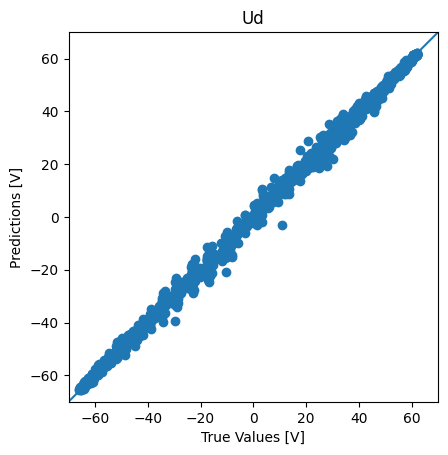

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

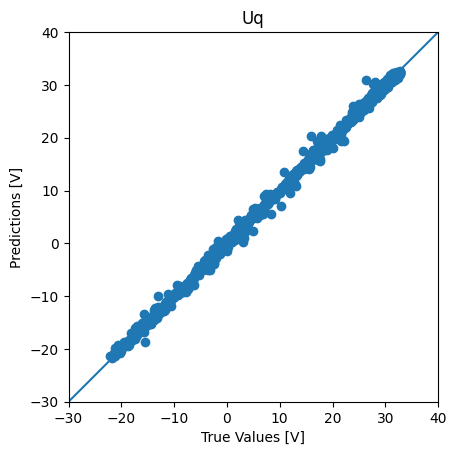

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

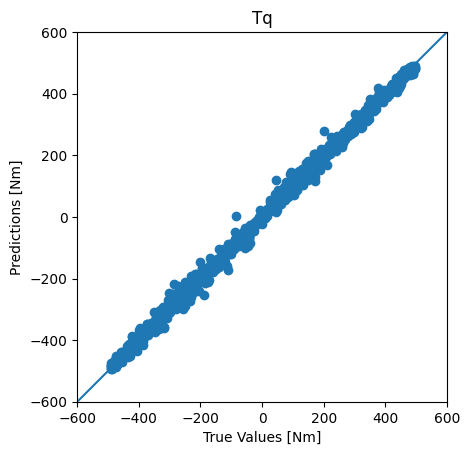

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

In [ ]:
len(y_pred[:,0])

1576

#####error

Text(0, 0.5, 'errors[%]')

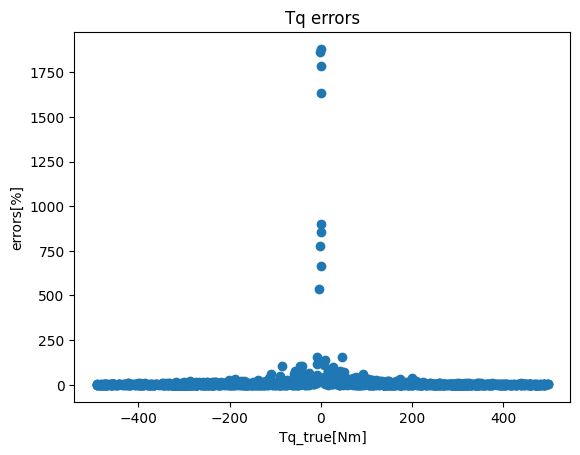

In [ ]:
errors_ud = get_errorList(y_pred[:,0], ud_test_list)
errors_uq = get_errorList(y_pred[:,1], uq_test_list)
errors_Tq = get_errorList(y_pred[:,2], Tq_test_list)

plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

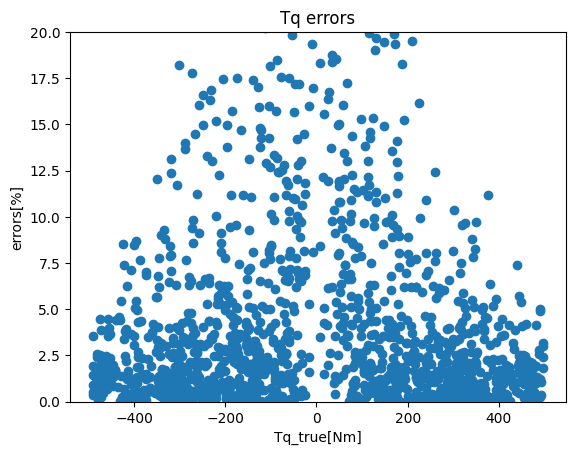

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

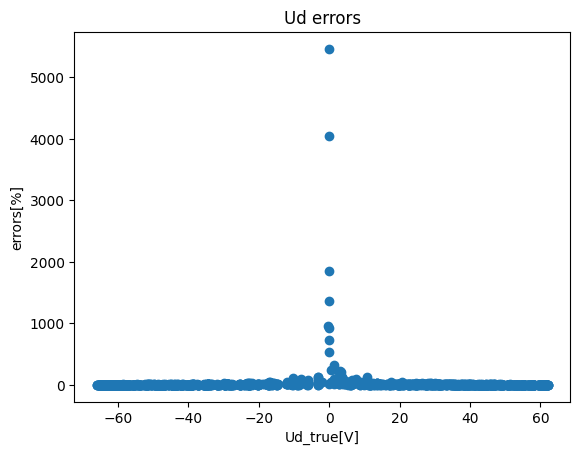

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

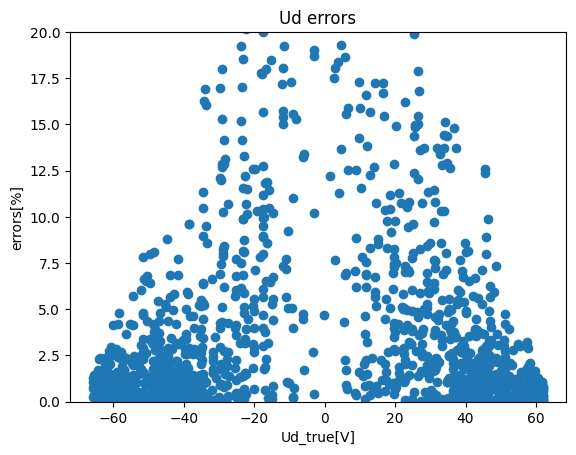

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

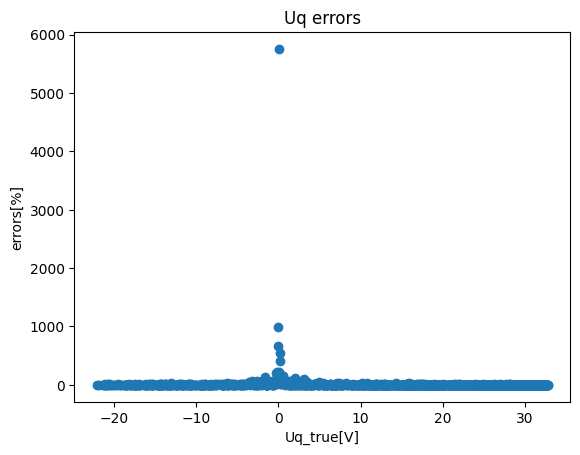

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

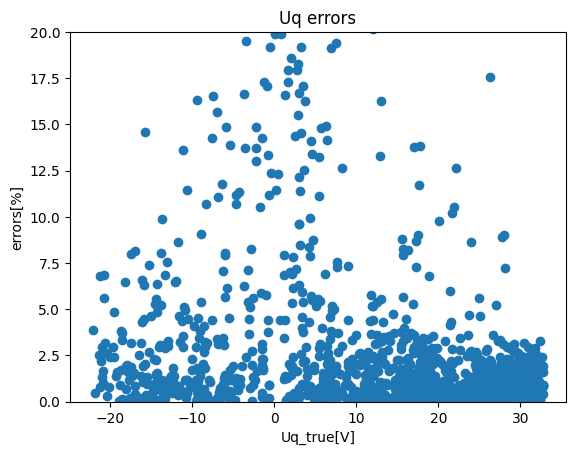

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

#####actual

Text(0, 0.5, 'errors[Nm]')

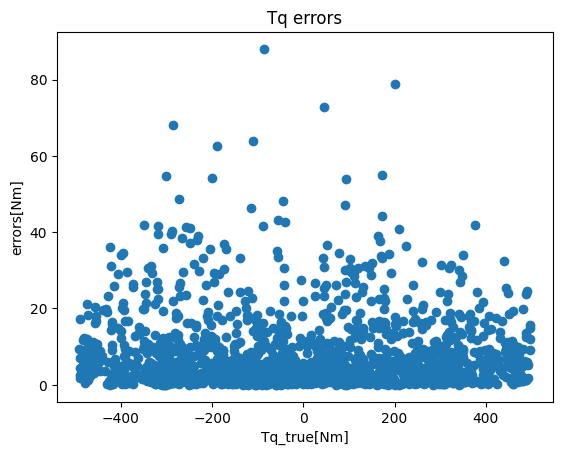

In [ ]:
errors_ud = get_actual_errorList(y_pred[:,0], ud_test_list)
errors_uq = get_actual_errorList(y_pred[:,1], uq_test_list)
errors_Tq = get_actual_errorList(y_pred[:,2], Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

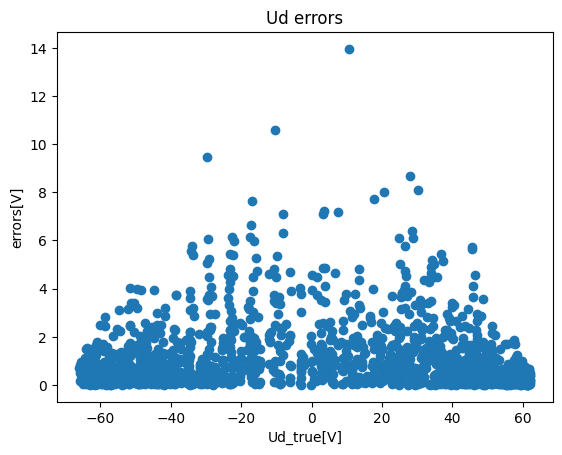

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

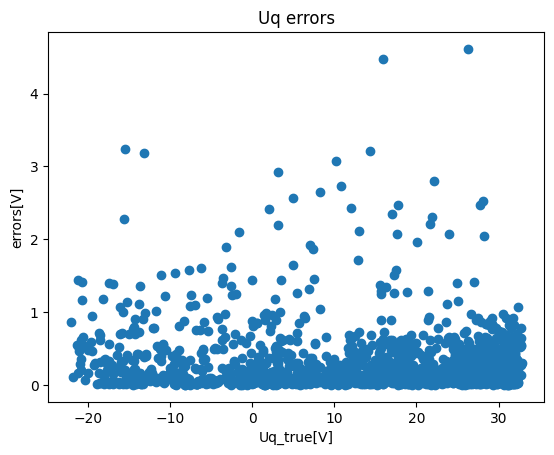

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

#####noabs

Text(0, 0.5, 'errors[Nm]')

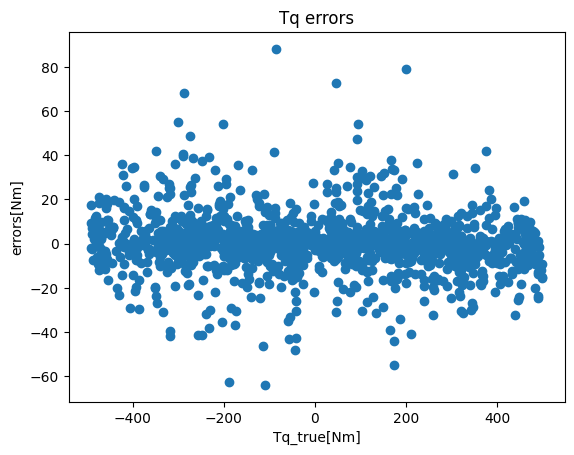

In [ ]:
errors_ud = get_actual_errorList_noabs(y_pred[:,0], ud_test_list)
errors_uq = get_actual_errorList_noabs(y_pred[:,1], uq_test_list)
errors_Tq = get_actual_errorList_noabs(y_pred[:,2], Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

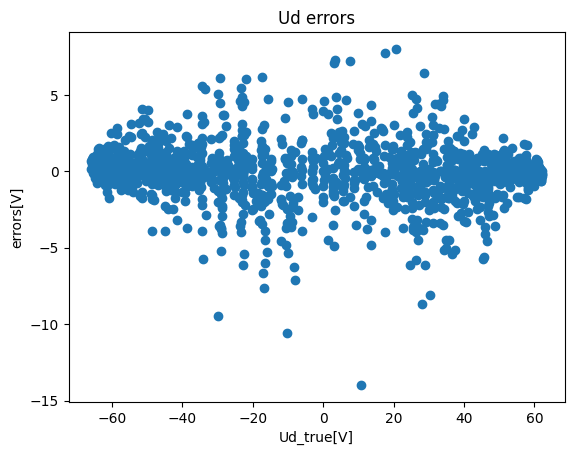

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

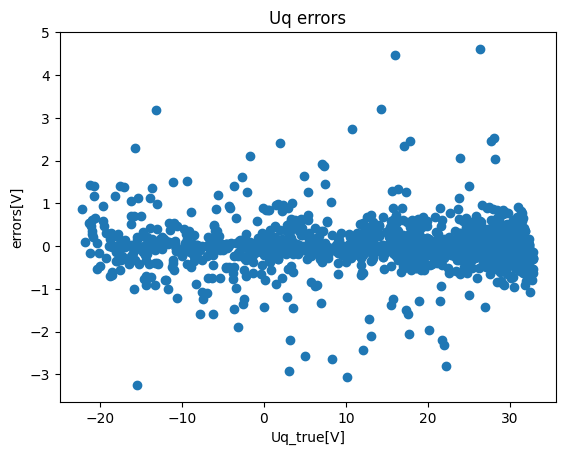

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

##  multi linear regression

In [ ]:
# Import necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


y_train = np.column_stack((yud_train, yuq_train, ytq_train))

mlr = LinearRegression()

mlr.fit(Xuq_train, y_train)

y_pred = mlr.predict(Xuq_test)

# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 75.22790241014391
MSE for output 2: 2.6686918377582645
MSE for output 3: 8762.844840592734
MAPE for output 1: 0.28939260360847446
MAPE for output 2: 0.29223559551769496
MAPE for output 3: 0.31705018293464954
R2 for output 1: 0.9596121284158652
R2 for output 2: 0.988747588897588
R2 for output 3: 0.8748585128057478


### gridsearch

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression


# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
lr = LinearRegression()
param_grid = {'fit_intercept': [True, False],
              'positive': [True, False],
              'copy_X': [True, False]}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(lr, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'copy_X': True, 'fit_intercept': True, 'positive': False}
MSE: 3428.2701412963665
Output 2
Best Parameters: {'copy_X': True, 'fit_intercept': True, 'positive': False}
MSE: 2828.969585603378
Output 3
Best Parameters: {'copy_X': True, 'fit_intercept': True, 'positive': False}
MSE: 3429.8615483159024
Best Accuracy for -2.829e+03 using {'copy_X': True, 'fit_intercept': True, 'positive': False}
mean=-3.428e+03, std=75.31 using {'copy_X': True, 'fit_intercept': True, 'positive': True}
mean=-2.829e+03, std=76.63 using {'copy_X': True, 'fit_intercept': True, 'positive': False}
mean=-3.43e+03, std=75.74 using {'copy_X': True, 'fit_intercept': False, 'positive': True}
mean=-2.829e+03, std=76.85 using {'copy_X': True, 'fit_intercept': False, 'positive': False}
mean=-3.428e+03, std=75.31 using {'copy_X': False, 'fit_intercept': True, 'positive': True}
mean=-2.829e+03, std=76.63 using {'copy_X': False, 'fit_intercept': True, 'positive': False}
mean=-3.43e+03, std=75.74 us

#### best

In [ ]:
# Import necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

y_train = np.column_stack((yud_train, yuq_train, ytq_train))

mlr = LinearRegression()

mlr.fit(Xuq_train, y_train)

y_pred = mlr.predict(Xuq_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 75.22790241014391
MSE for output 2: 2.6686918377582645
MSE for output 3: 8762.844840592734
MAPE for output 1: 0.28939260360847446
MAPE for output 2: 0.29223559551769496
MAPE for output 3: 0.31705018293464954
R2 for output 1: 0.9596121284158652
R2 for output 2: 0.988747588897588
R2 for output 3: 0.8748585128057478


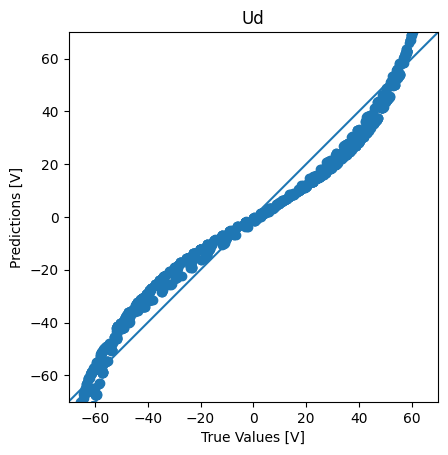

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

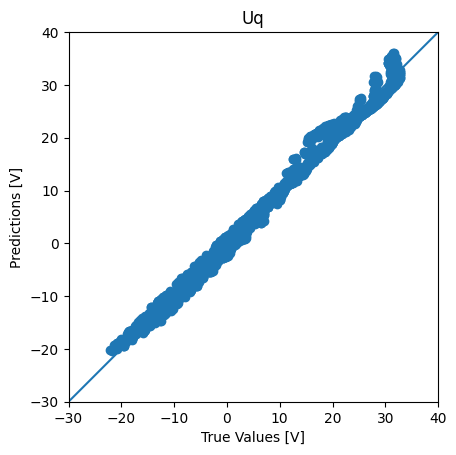

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
lims = [-30, 40]
plt.title('Uq')
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

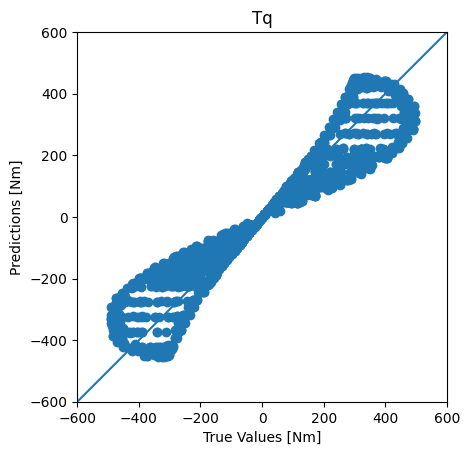

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

#####error

Text(0, 0.5, 'errors[%]')

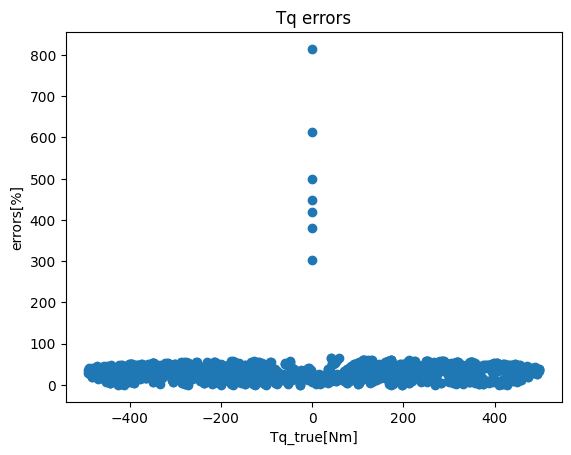

In [ ]:
errors_ud = get_errorList(y_pred[:,0], ud_test_list)
errors_uq = get_errorList(y_pred[:,1], uq_test_list)
errors_Tq = get_errorList(y_pred[:,2], Tq_test_list)

plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

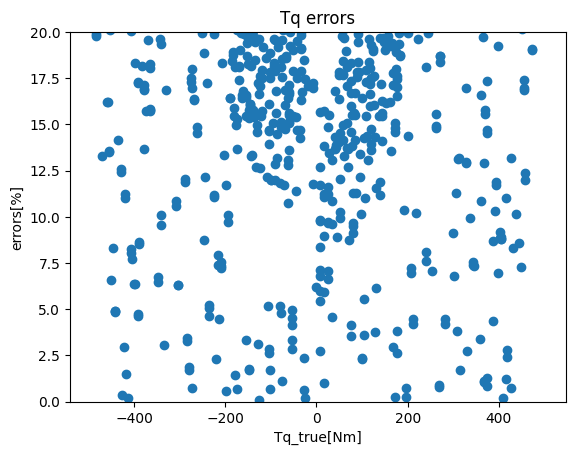

In [ ]:
plt.scatter(Tq_test_list, errors_Tq)
ylims = [0, 20]
plt.ylim(ylims)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

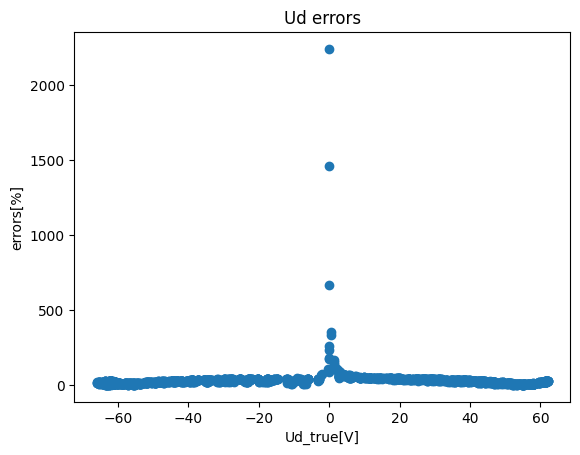

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

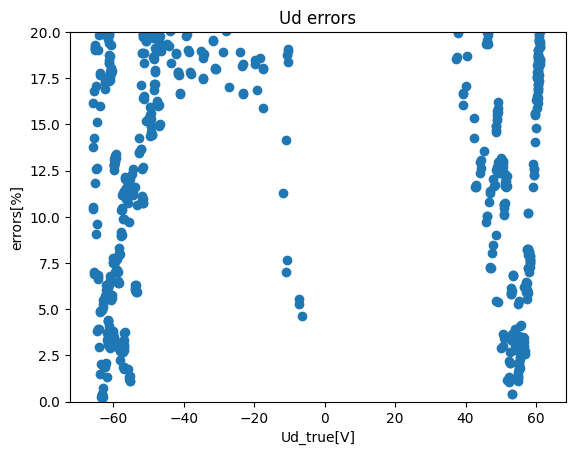

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

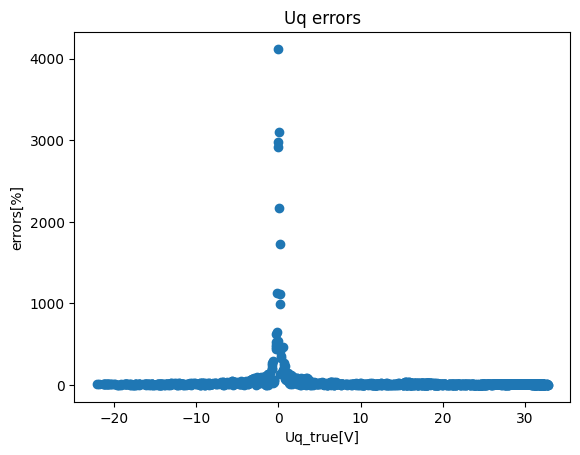

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

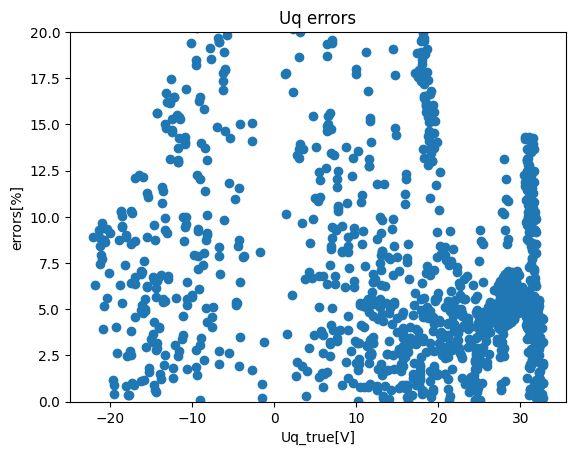

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

#####actual

Text(0, 0.5, 'errors[Nm]')

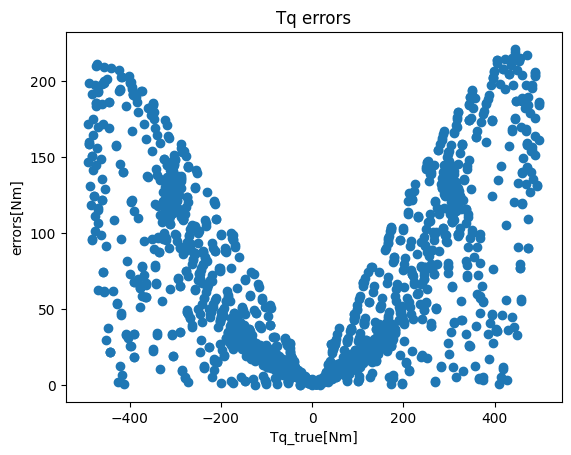

In [ ]:
errors_ud = get_actual_errorList(y_pred[:,0], ud_test_list)
errors_uq = get_actual_errorList(y_pred[:,1], uq_test_list)
errors_Tq = get_actual_errorList(y_pred[:,2], Tq_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

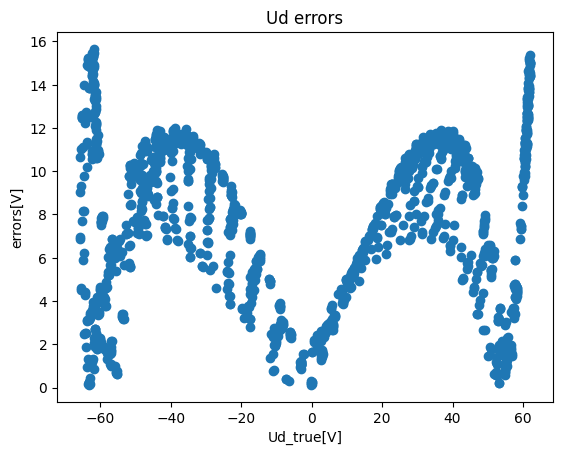

In [ ]:
plt.scatter(ud_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

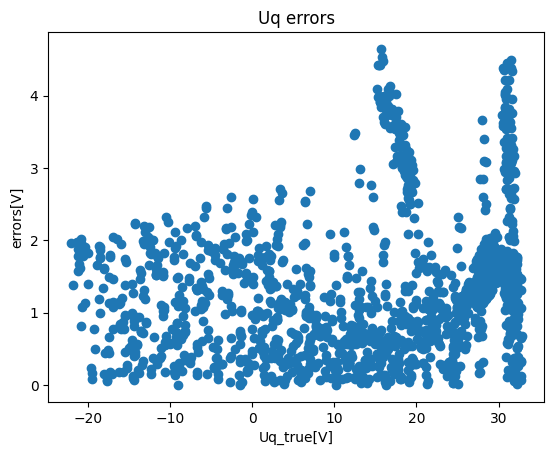

In [ ]:
plt.scatter(uq_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

#### predict for loss

In [ ]:
y_pred_l = mlr.predict(X3_l1)
y_pred_list = y_pred_l.tolist()
ud_pred, uq_pred, Tq_pred = get_output_list(y_pred, y_pred_list)

In [ ]:
Tq = Tq_pred
A = [float(x) for x in Tq]
print(type(A[0]))
dict = {'Tq_el':A}
df_csv = pd.DataFrame(dict)
df_csv.to_excel('drive/My Drive/Jupyter/data/Tq_el_mlr.xlsx')

<class 'float'>


## RF 3 output

###initial

In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)

# Train the model on the training data
rf.fit(Xuq2_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(Xuq2_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.13187166711876283
MSE for output 2: 0.38831840829259806
MSE for output 3: 11.856930894145929
MAPE for output 1: 0.014547964777385718
MAPE for output 2: 0.3045313199173939
MAPE for output 3: 0.012757142215438104
R2 for output 1: 0.9999286355922226
R2 for output 2: 0.9984397691237734
R2 for output 3: 0.9998270264996703


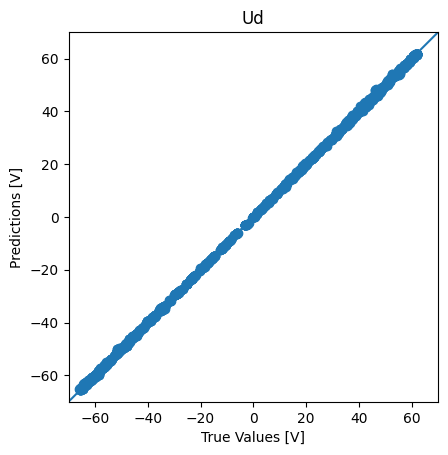

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

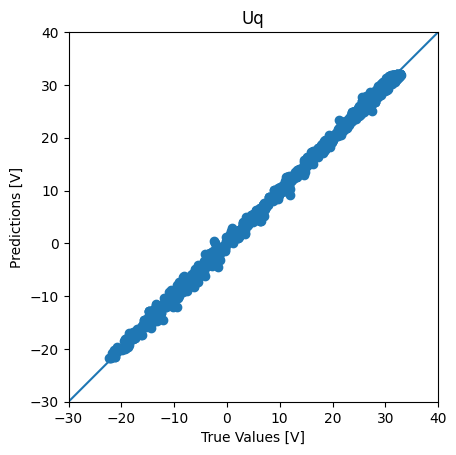

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
lims = [-30, 40]
plt.title('Uq')
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

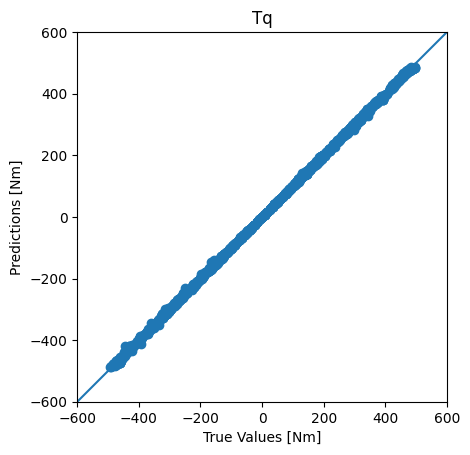

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq2_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

###best

In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=300, max_depth=60, random_state=1)

# Train the model on the training data
rf.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.03542449117037429
MSE for output 2: 0.1155450439558101
MSE for output 3: 6.567038845653969
MAPE for output 1: 0.00581078434024893
MAPE for output 2: 0.06513435981104214
MAPE for output 3: 0.008118359086739902
R2 for output 1: 0.9999809815274056
R2 for output 2: 0.9995128098654773
R2 for output 3: 0.999906216642819


In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=100, max_depth=50, random_state=42)

# Train the model on the training data
rf.fit(Xuq2_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(Xuq2_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.04986824199554338
MSE for output 2: 0.15037743298207112
MSE for output 3: 7.110953467627603
MAPE for output 1: 0.01122940829405901
MAPE for output 2: 0.0840266562687799
MAPE for output 3: 0.009002110418970213
R2 for output 1: 0.9999730130236868
R2 for output 2: 0.999395796055464
R2 for output 3: 0.9998962626565882


In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=42)

# Train the model on the training data
rf.fit(Xuq2_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(Xuq2_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.04284162774203285
MSE for output 2: 0.14324190042358165
MSE for output 3: 6.904712438646552
MAPE for output 1: 0.009863571442637959
MAPE for output 2: 0.10390712526251543
MAPE for output 3: 0.008739600614998252
R2 for output 1: 0.9999768155854943
R2 for output 2: 0.9994244660282964
R2 for output 3: 0.9998992713806005


In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=42)

# Train the model on the training data
rf.fit(Xuq3_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(Xuq3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.042660828570527345
MSE for output 2: 0.1429916946348291
MSE for output 3: 6.888734095586142
MAPE for output 1: 0.010230109860357271
MAPE for output 2: 0.10477827999523852
MAPE for output 3: 0.008732143590757442
R2 for output 1: 0.9999769134277836
R2 for output 2: 0.9994254713342224
R2 for output 3: 0.9998995044788578


In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score


# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=300, max_depth=60, random_state=42)

# Train the model on the training data
rf.fit(Xuq3_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(Xuq3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.044269737381306525
MSE for output 2: 0.14374855595558228
MSE for output 3: 6.988820397248257
MAPE for output 1: 0.0105619658549175
MAPE for output 2: 0.1148517175775072
MAPE for output 3: 0.008783319147062749
R2 for output 1: 0.999976042741707
R2 for output 2: 0.9994224303287577
R2 for output 3: 0.9998980443811236


####r2 graph

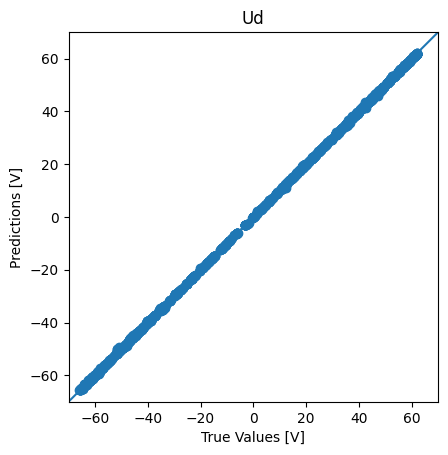

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

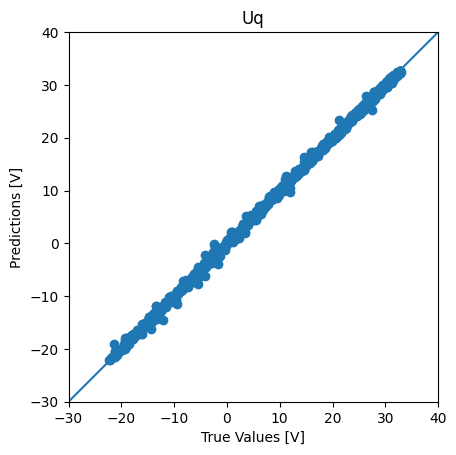

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
lims = [-30, 40]
plt.title('Uq')
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

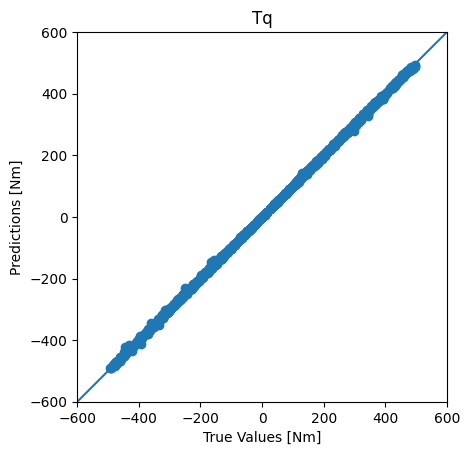

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq2_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

###error

Text(0, 0.5, 'errors[%]')

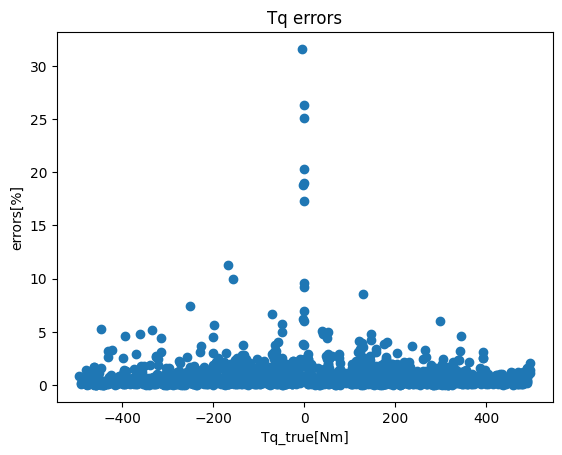

In [ ]:
errors_ud = get_errorList(y_pred[:,0], yud2_test_list)
errors_uq = get_errorList(y_pred[:,1], yuq2_test_list)
errors_Tq = get_errorList(y_pred[:,2], ytq2_test_list)

plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

(0.0, 20.0)

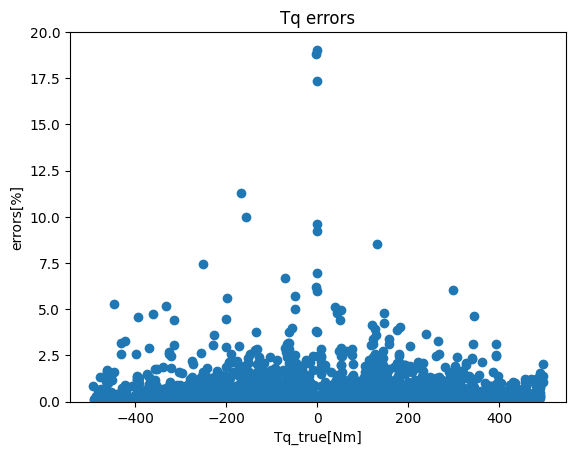

In [ ]:
plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')
ylims = [0, 20]
plt.ylim(ylims)

Text(0, 0.5, 'errors[%]')

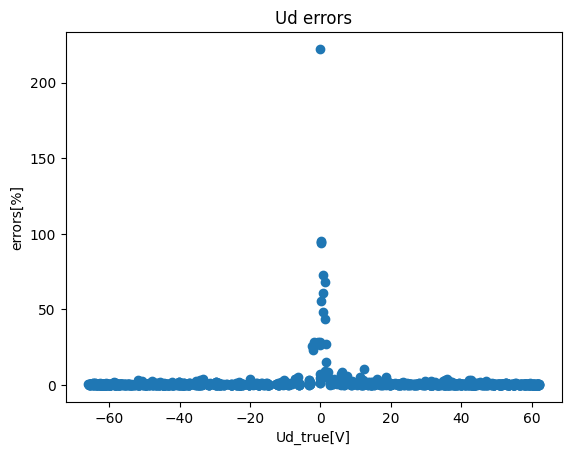

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

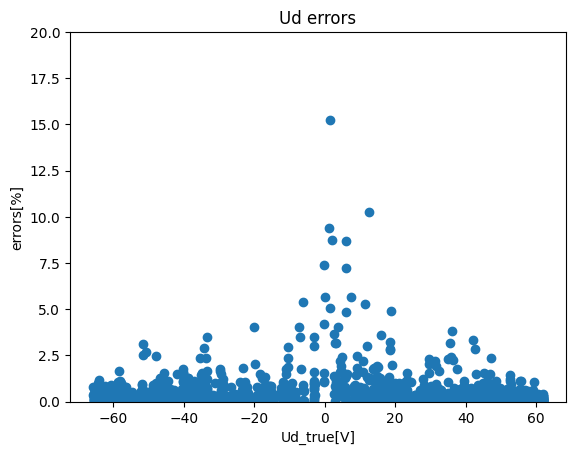

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

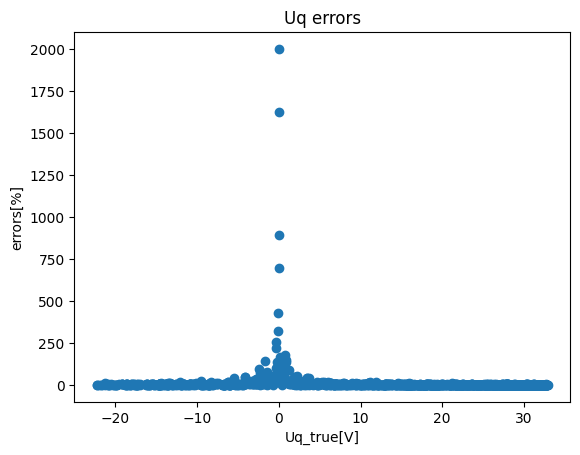

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

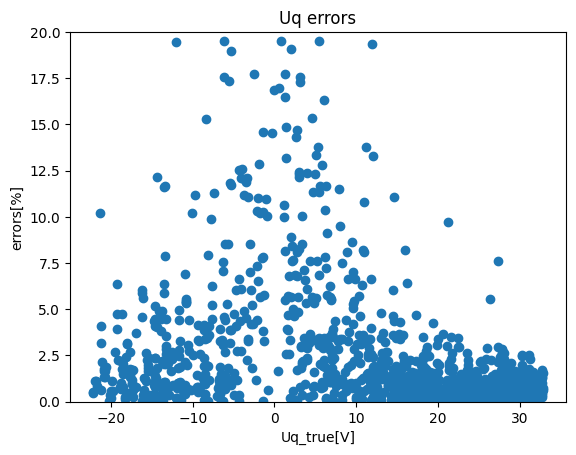

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

###actual

Text(0, 0.5, 'errors[Nm]')

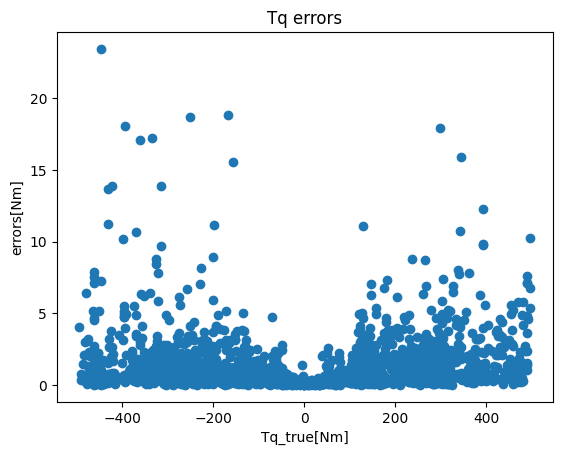

In [ ]:
errors_ud = get_actual_errorList(y_pred[:,0], yud2_test_list)
errors_uq = get_actual_errorList(y_pred[:,1], yuq2_test_list)
errors_Tq = get_actual_errorList(y_pred[:,2], ytq2_test_list)
plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

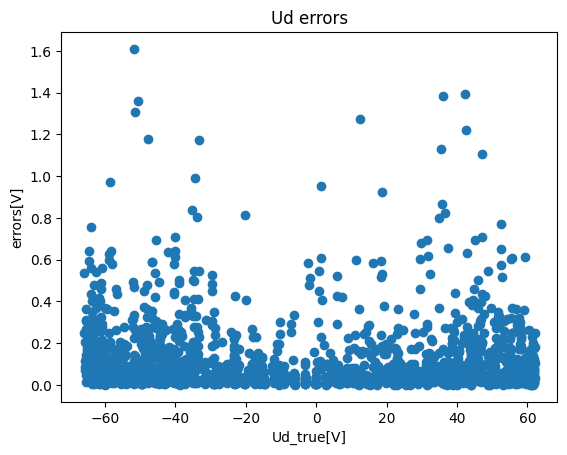

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

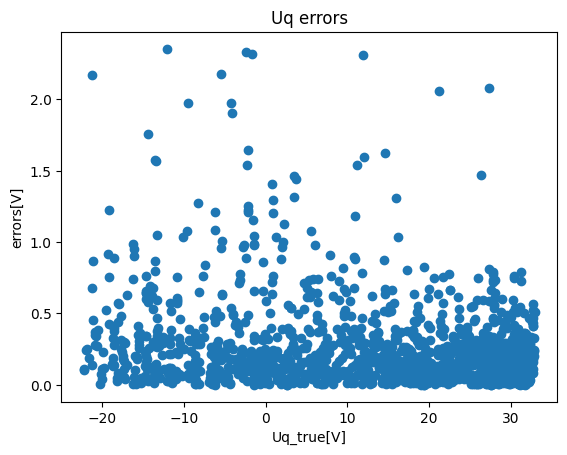

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

###noabs

Text(0, 0.5, 'errors[Nm]')

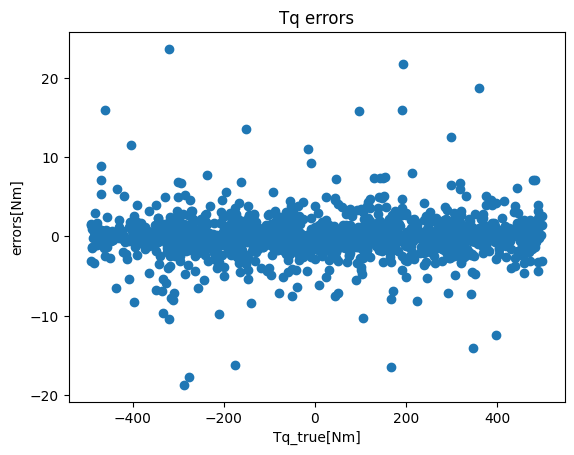

In [ ]:
errors_ud = get_actual_errorList_noabs(y_pred[:,0], yud2_test_list)
errors_uq = get_actual_errorList_noabs(y_pred[:,1], yuq2_test_list)
errors_Tq = get_actual_errorList_noabs(y_pred[:,2], ytq2_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

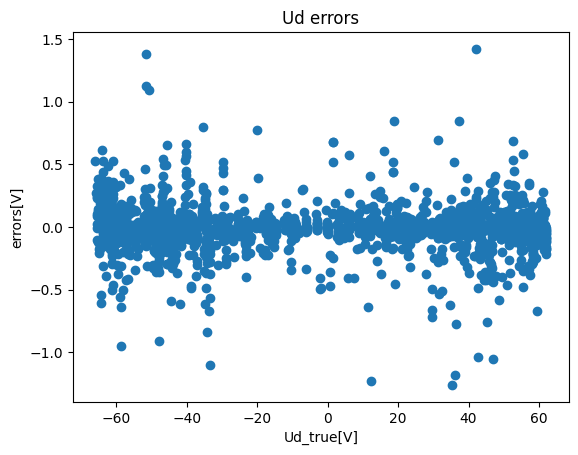

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

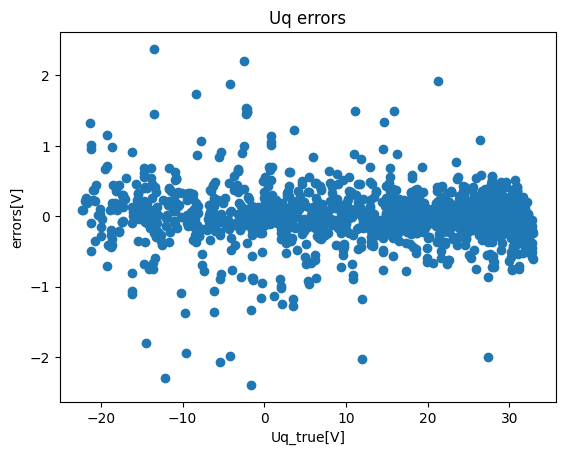

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

### grid search

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
rf = RandomForestRegressor()
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 138.71863933751936
Output 2
Best Parameters: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 138.28156814580126
Output 3
Best Parameters: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 138.53617810589847
Best Accuracy for -2.063 using {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}
mean=-138.7, std=9.17 using {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}
mean=-138.3, std=10.18 using {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 200}
mean=-138.5, std=10.57 using {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 300}
mean=-140.3, std=11.01 using {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 100}
mean=-139.4, std=10.7 using {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 200}
mean=-139.5, std=11.28 using {'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 300}
mean=-139.1, std=10.28 

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
rf = RandomForestRegressor()
param_grid = {
    'n_estimators': [300, 400, 500],
    'max_depth': [15,30,45],
    'min_samples_split': [2]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
MSE: 2.06312977342035
Output 2
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
MSE: 2.0630665646612782
Output 3
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
MSE: 2.0580859607542927
Best Accuracy for -2.037 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
mean=-2.063, std=0.2228 using {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}
mean=-2.063, std=0.2248 using {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 400}
mean=-2.058, std=0.2467 using {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 500}
mean=-2.065, std=0.2307 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 300}
mean=-2.037, std=0.2088 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
mean=-2.045, std=0.2216 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 500}
mean=-2.072

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
rf = RandomForestRegressor()
param_grid = {
    'n_estimators': [300, 400, 500, 600, 700],
    'max_depth': [30,60,90],
    'min_samples_split': [2, 5],
    'max_features': ['sqrt', 'log2', None]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 60, 'max_features': None, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 5.898030781795571
Output 2
Best Parameters: {'max_depth': 60, 'max_features': None, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 5.751005556879941
Output 3
Best Parameters: {'max_depth': 60, 'max_features': None, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 5.742872411989655
Best Accuracy for -2.031 using {'max_depth': 60, 'max_features': None, 'min_samples_split': 2, 'n_estimators': 300}
mean=-5.898, std=2.036 using {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 300}
mean=-5.751, std=1.898 using {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 400}
mean=-5.743, std=1.71 using {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 500}
mean=-5.641, std=1.627 using {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 600}
mean=-5.536, std=1.

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
rf = RandomForestRegressor()
param_grid = {
    'n_estimators': [300, 400, 500, 600, 700],
    'max_depth': [30,60,90],
    'min_samples_split': [2],
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 600}
MSE: 2.03955147813997
Output 2
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 600}
MSE: 2.050712470869248
Output 3
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 600}
MSE: 2.040022019064099
Best Accuracy for -2.036 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 600}
mean=-2.04, std=0.2238 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 300}
mean=-2.051, std=0.223 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 400}
mean=-2.04, std=0.2298 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 500}
mean=-2.036, std=0.2059 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 600}
mean=-2.049, std=0.2328 using {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 700}
mean=-2.065, std=0.2396 using {'max_depth': 60, 'min_samples_split': 2, 'n_estimators': 300}
mean=-2.061, std

####best

In [ ]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a random forest regression model
rf = RandomForestRegressor(n_estimators=600, max_depth=90, random_state=42)

# Train the model on the training data
rf.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = rf.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.03504194679910208
MSE for output 2: 0.1111454439309764
MSE for output 3: 6.539591721803767
MAPE for output 1: 0.005570205761161333
MAPE for output 2: 0.06428002216230926
MAPE for output 3: 0.008093471360628835
R2 for output 1: 0.9999811869053631
R2 for output 2: 0.9995313605679096
R2 for output 3: 0.9999066086130022


## dt 3output

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a decision tree regression model
dt = DecisionTreeRegressor(random_state=42)

# Train the model on the training data
dt.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = dt.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.6012349098735227
MSE for output 2: 1.5325357813139473
MSE for output 3: 53.66596066815032
MAPE for output 1: 0.011475784565672907
MAPE for output 2: 0.03971523455271316
MAPE for output 3: 0.01624465576516036
R2 for output 1: 0.9996749760405539
R2 for output 2: 0.9943173638243233
R2 for output 3: 0.9992855127735181


### initial

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a decision tree regression model
dt = DecisionTreeRegressor(max_depth= 10, min_samples_leaf=1, min_samples_split=2, random_state=42)

# Train the model on the training data
dt.fit(Xuq2_train, y_train)

# Make predictions on the testing data
y_pred = dt.predict(Xuq2_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.4192948351849263
MSE for output 2: 0.8047461589832984
MSE for output 3: 22.50466416208988
MAPE for output 1: 0.020154654795191837
MAPE for output 2: 0.16015248921748848
MAPE for output 3: 0.014462723214462334
R2 for output 1: 0.9997730920655595
R2 for output 2: 0.9967665972615327
R2 for output 3: 0.99967169324266


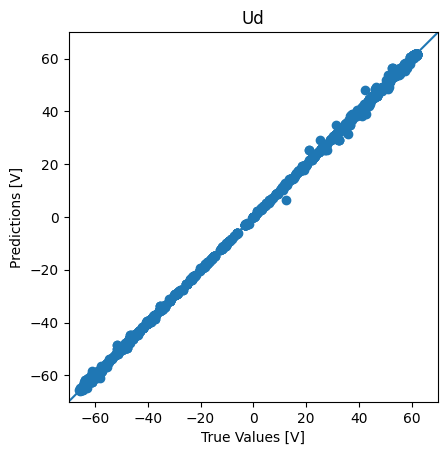

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

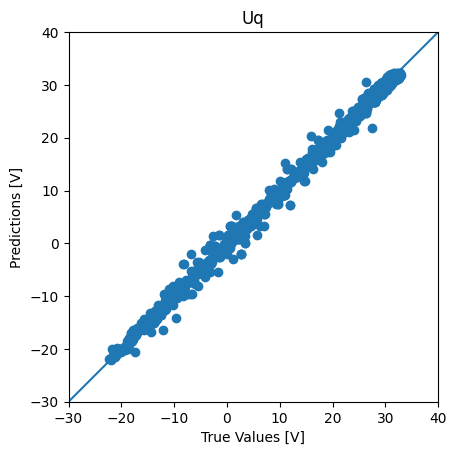

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

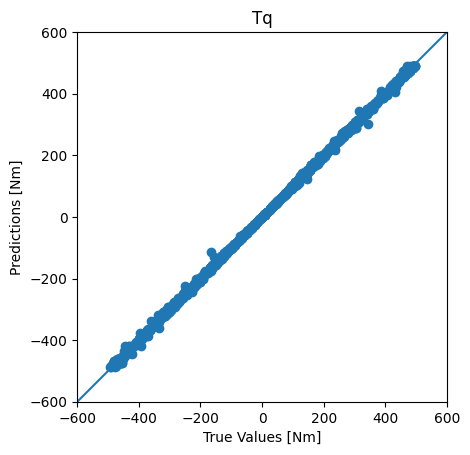

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq2_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

### grid search

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# # Create random regression data
# X, y1 = make_regression(n_samples=1000, n_features=10, random_state=42)
# _, y2 = make_regression(n_samples=1000, n_features=10, random_state=24)
# _, y3 = make_regression(n_samples=1000, n_features=10, random_state=88)

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
dt = DecisionTreeRegressor()
param_grid = {
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(dt, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 5}
MSE: 1338.6572999151101
Output 2
Best Parameters: {'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 5}
MSE: 1338.6572999151106
Output 3
Best Parameters: {'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 5}
MSE: 1338.6572999151106
Best Accuracy for -51.87 using {'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 5}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 5}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 10}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 5}
mean=-1.339e+03, std=53.79 using {'max_depth': 3, 'min_samples_leaf': 2, 'min

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# # Create random regression data
# X, y1 = make_regression(n_samples=1000, n_features=10, random_state=42)
# _, y2 = make_regression(n_samples=1000, n_features=10, random_state=24)
# _, y3 = make_regression(n_samples=1000, n_features=10, random_state=88)

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
dt = DecisionTreeRegressor()
param_grid = {
    'max_depth': [7, 20, 50, 100],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(dt, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 2}
MSE: 51.95537287174501
Output 2
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 2}
MSE: 51.95537287174501
Output 3
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 2}
MSE: 51.95542930086418
Best Accuracy for -3.855 using {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 2}
mean=-51.96, std=2.002 using {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
mean=-51.96, std=2.002 using {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 5}
mean=-51.96, std=2.002 using {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 10}
mean=-51.9, std=2.051 using {'max_depth': 7, 'min_samples_leaf': 2, 'min_samples_split': 2}
mean=-51.9, std=2.051 using {'max_depth': 7, 'min_samples_leaf': 2, 'min_samples_split': 5}
mean=-51.9, std=2.051 using {'max_depth': 7, 'min_samples_leaf': 2, 'min_samples_split': 10}
mean=

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.datasets import make_regression

# # Create random regression data
# X, y1 = make_regression(n_samples=1000, n_features=10, random_state=42)
# _, y2 = make_regression(n_samples=1000, n_features=10, random_state=24)
# _, y3 = make_regression(n_samples=1000, n_features=10, random_state=88)

# Combine the three output targets into a single output matrix
y = np.column_stack((yud, yuq, ytq))

# Define the random forest regressor and parameter grid
dt = DecisionTreeRegressor()
param_grid = {
    'max_depth': [20, 30, 50, 60, 90, 100],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Use grid search with 5-fold cross-validation to find the best parameters
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(dt, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X3, y)

# Print the best parameters and corresponding mean squared error for each output
for i in range(y.shape[1]):
    print("Output", i+1)
    print("Best Parameters:", grid_search.best_params_)
    print("MSE:", -grid_search.cv_results_['mean_test_score'][i])

# print results
print(f'Best Accuracy for {grid_search.best_score_:.4} using {grid_search.best_params_}')
means = grid_search.cv_results_['mean_test_score']
stds = grid_search.cv_results_['std_test_score']
params = grid_search.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')

Output 1
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 5}
MSE: 4.2599337710390515
Output 2
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 5}
MSE: 4.453405438669057
Output 3
Best Parameters: {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 5}
MSE: 5.582788609477814
Best Accuracy for -3.976 using {'max_depth': 50, 'min_samples_leaf': 1, 'min_samples_split': 5}
mean=-4.26, std=0.8634 using {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}
mean=-4.453, std=0.1774 using {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5}
mean=-5.583, std=0.9661 using {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10}
mean=-4.162, std=0.7903 using {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2}
mean=-4.711, std=0.727 using {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5}
mean=-5.776, std=0.9254 using {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_spl

#### best param

In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create a decision tree regression model
dt = DecisionTreeRegressor(max_depth= 50, min_samples_leaf=1, min_samples_split=2, random_state=42)

# Train the model on the training data
dt.fit(Xuq2_train, y_train)

# Make predictions on the testing data
y_pred = dt.predict(Xuq2_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.22077106554616988
MSE for output 2: 0.5207646409401759
MSE for output 3: 13.006251601180121
MAPE for output 1: 0.013926266963640634
MAPE for output 2: 0.07084724304434478
MAPE for output 3: 0.0079558937800427
R2 for output 1: 0.9998805262973364
R2 for output 2: 0.9979076112419845
R2 for output 3: 0.9998102597640393


In [ ]:
# Import necessary libraries
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a decision tree regression model
dt = DecisionTreeRegressor(max_depth= 50, min_samples_leaf=1, min_samples_split=2, random_state=42)

# Train the model on the training data
dt.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = dt.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 0.10956542974050686
MSE for output 2: 0.3733309510690787
MSE for output 3: 11.59776036641382
MAPE for output 1: 0.0071928421254230275
MAPE for output 2: 0.039865019885161446
MAPE for output 3: 0.007776917593027221
R2 for output 1: 0.999941177217965
R2 for output 2: 0.9984258679555101
R2 for output 3: 0.999834373310634


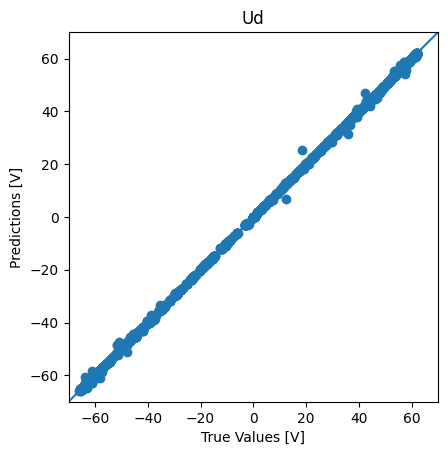

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

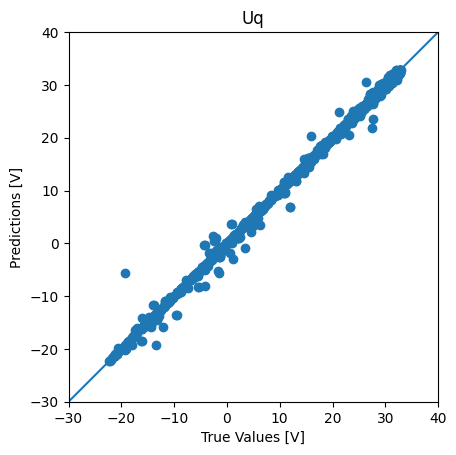

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

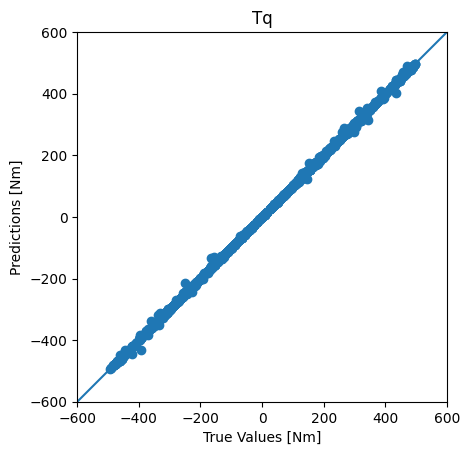

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq2_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

#####error

Text(0, 0.5, 'errors[%]')

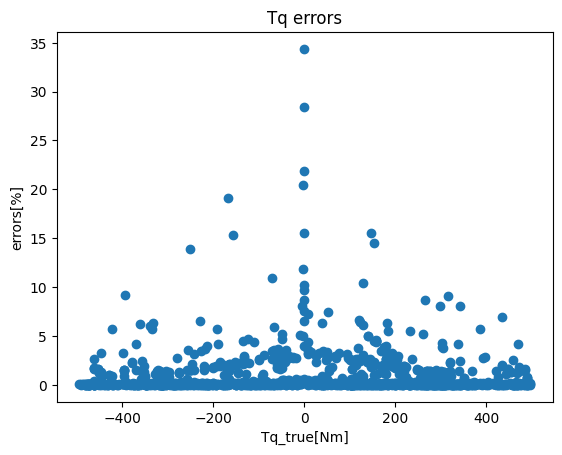

In [ ]:
errors_ud = get_errorList(y_pred[:,0], yud2_test_list)
errors_uq = get_errorList(y_pred[:,1], yuq2_test_list)
errors_Tq = get_errorList(y_pred[:,2], ytq2_test_list)

plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

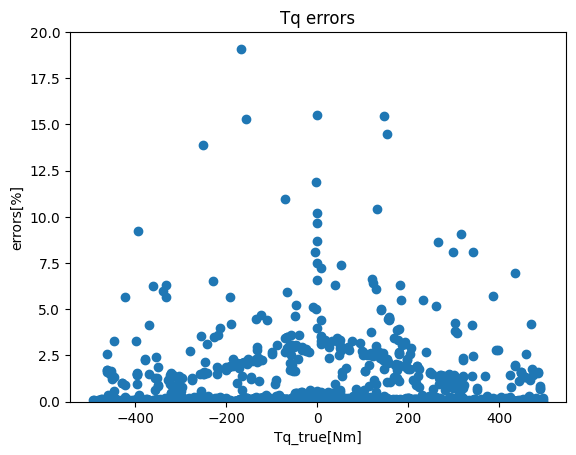

In [ ]:
ylims = [0, 20]
plt.ylim(ylims)
plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[%]')

Text(0, 0.5, 'errors[%]')

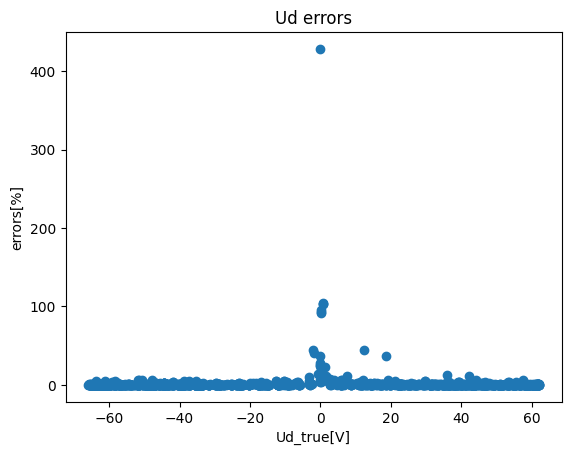

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

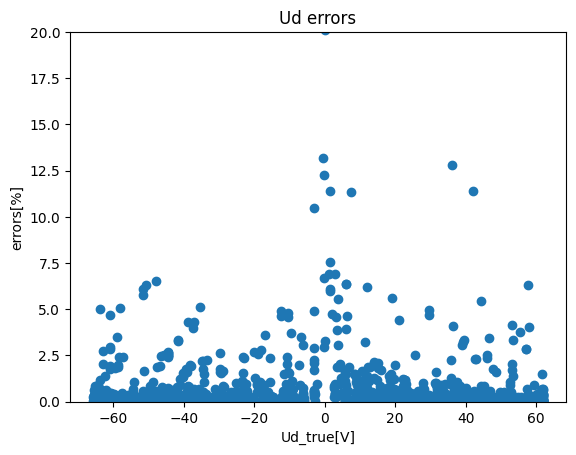

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

Text(0, 0.5, 'errors[%]')

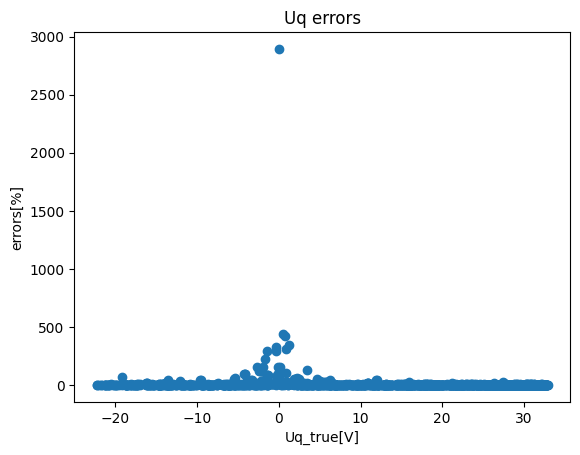

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')

(0.0, 20.0)

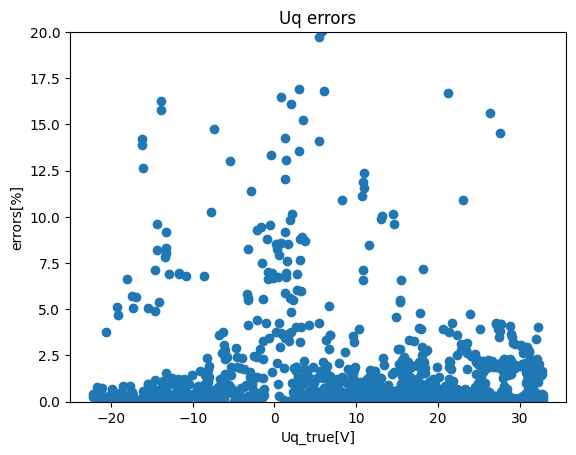

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[%]')
lim=[0,20]
plt.ylim(lim)

#####actual

Text(0, 0.5, 'errors[Nm]')

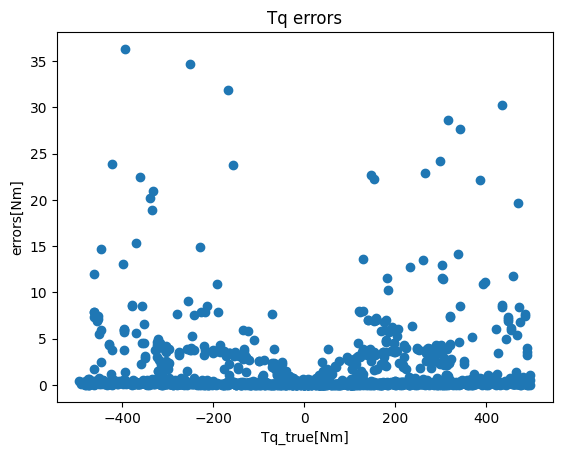

In [ ]:
errors_ud = get_actual_errorList(y_pred[:,0], yud2_test_list)
errors_uq = get_actual_errorList(y_pred[:,1], yuq2_test_list)
errors_Tq = get_actual_errorList(y_pred[:,2], ytq2_test_list)
plt.scatter(ytq2_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

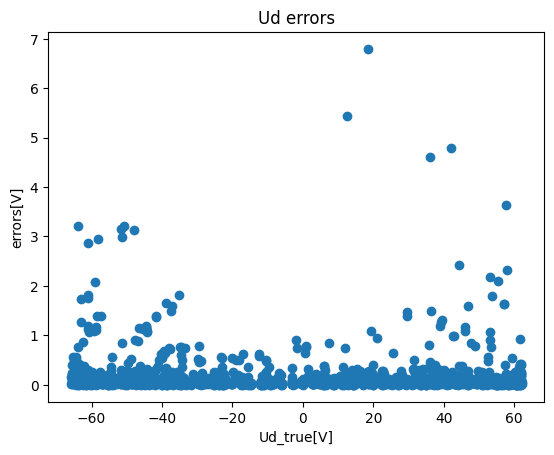

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

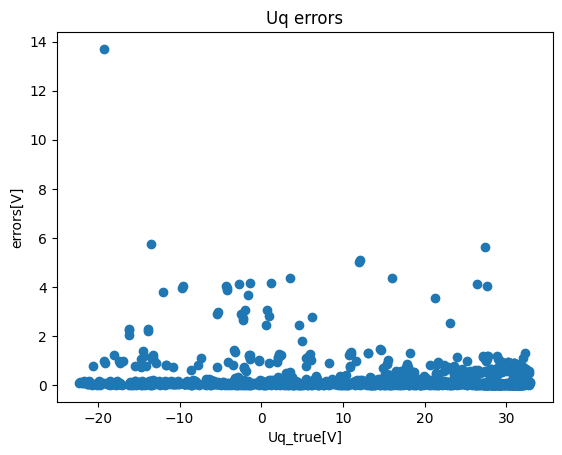

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

#####noabs

Text(0, 0.5, 'errors[Nm]')

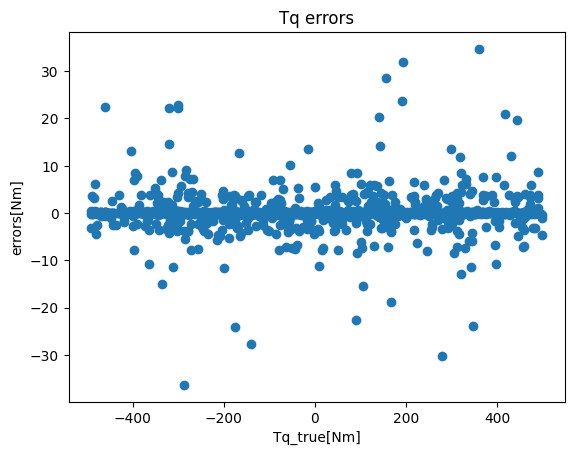

In [ ]:
errors_ud = get_actual_errorList_noabs(y_pred[:,0], yud2_test_list)
errors_uq = get_actual_errorList_noabs(y_pred[:,1], yuq2_test_list)
errors_Tq = get_actual_errorList_noabs(y_pred[:,2], ytq2_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

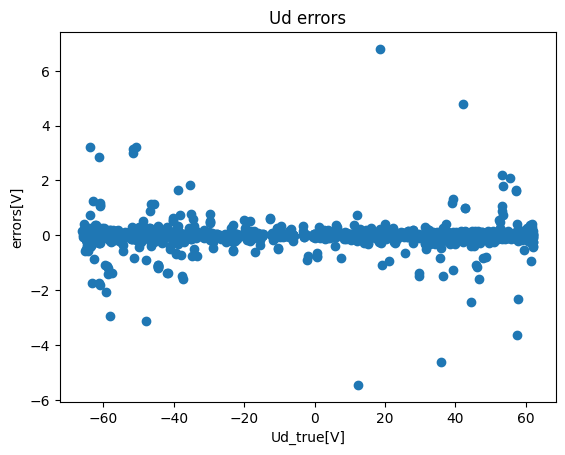

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

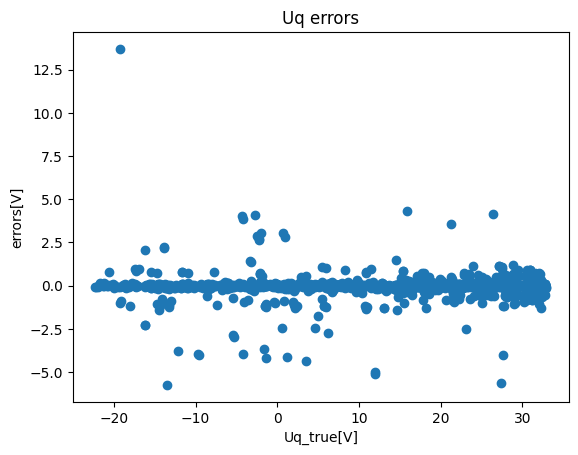

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

##multi quadratic regression


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud2_train, yuq2_train, ytq2_train))

# Create polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(Xuq2_train)
X_poly_test = poly.fit_transform(Xuq2_test)

# Fit the multiple quadratic regression model
model = LinearRegression()
model.fit(X_poly, y_train)

# Print the regression coefficients
print("Intercept:", model.intercept_)
print("Coefficients:", model.coef_)


Intercept: [ 22.98107153  26.94122017 -61.62094071]
Coefficients: [[ 7.64443248e-03 -7.38656037e-02  4.96357290e-01 -6.10902809e+03
  -4.35382311e-07  2.37255388e-05  3.05295110e-05 -1.37682823e-01
  -7.77882646e-07 -1.89623592e-05 -4.83489395e-01  1.42442312e-03
  -5.58842415e+01  3.85668316e+05]
 [ 4.31213733e-02  9.77280347e-04  1.99453517e-03  2.87210188e+02
  -5.41157516e-06 -2.89205565e-09 -4.27934368e-05  7.00471727e-01
  -3.77906582e-06  7.38336949e-06  5.59914702e-01  2.93368002e-04
  -6.56876964e+00  1.36253159e+04]
 [ 2.26793228e-02  3.69053837e-01 -1.52769305e+00  1.83882149e+04
  -1.32351732e-06 -7.11463354e-04  1.32243697e-04 -2.96217725e+00
  -2.76993690e-06 -2.15502026e-04  2.56593020e-01 -3.86692919e-03
   1.75309467e+02 -1.25924253e+06]]


In [ ]:
y_pred = model.predict(X_poly_test)

# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud2_test, y_pred[:,0])
mse2 = mean_squared_error(yuq2_test, y_pred[:,1])
mse3 = mean_squared_error(ytq2_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud2_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq2_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq2_test, y_pred[:,2])

r2_1 = r2_score(yud2_test, y_pred[:,0])
r2_2 = r2_score(yuq2_test, y_pred[:,1])
r2_3 = r2_score(ytq2_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)

MSE for output 1: 66.52070090772813
MSE for output 2: 1.5801151521699448
MSE for output 3: 778.3817757865488
MAPE for output 1: 0.3116822060308158
MAPE for output 2: 0.9534284626508409
MAPE for output 3: 0.15385329223196045
R2 for output 1: 0.9640012860309994
R2 for output 2: 0.9936512295174236
R2 for output 3: 0.9886446651707211


###quadratic regression

In [ ]:
# Import necessary libraries
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold, cross_val_score
from sklearn.datasets import make_regression

# Combine the three output targets into a single output matrix
y_train = np.column_stack((yud_train, yuq_train, ytq_train))

# Create a polynomial regression model
poly_reg = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())

# Train the model on the training data
poly_reg.fit(X3_train, y_train)

# Make predictions on the testing data
y_pred = poly_reg.predict(X3_test)


# Calculate the mean squared error of the predictions for each output
mse1 = mean_squared_error(yud_test, y_pred[:,0])
mse2 = mean_squared_error(yuq_test, y_pred[:,1])
mse3 = mean_squared_error(ytq_test, y_pred[:,2])

mape1 = mean_absolute_percentage_error(yud_test, y_pred[:,0])
mape2 = mean_absolute_percentage_error(yuq_test, y_pred[:,1])
mape3 = mean_absolute_percentage_error(ytq_test, y_pred[:,2])

r2_1 = r2_score(yud_test, y_pred[:,0])
r2_2 = r2_score(yuq_test, y_pred[:,1])
r2_3 = r2_score(ytq_test, y_pred[:,2])

print("MSE for output 1:", mse1)
print("MSE for output 2:", mse2)
print("MSE for output 3:", mse3)
print("MAPE for output 1:", mape1)
print("MAPE for output 2:", mape2)
print("MAPE for output 3:", mape3)
print("R2 for output 1:", r2_1)
print("R2 for output 2:", r2_2)
print("R2 for output 3:", r2_3)


MSE for output 1: 66.06664531861921
MSE for output 2: 1.5365917199403283
MSE for output 3: 782.6389686728223
MAPE for output 1: 0.2615103472803416
MAPE for output 2: 0.3838143032153095
MAPE for output 3: 0.13809456431711092
R2 for output 1: 0.9645305651010259
R2 for output 2: 0.9935210347314379
R2 for output 3: 0.9888231954054241


####R2 plot

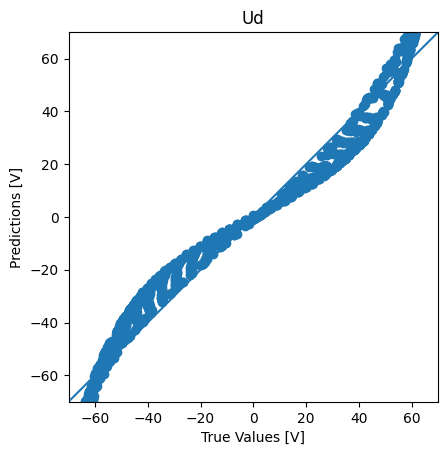

In [ ]:
predictions = y_pred[:,0].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yud2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Ud')
lims = [-70, 70]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

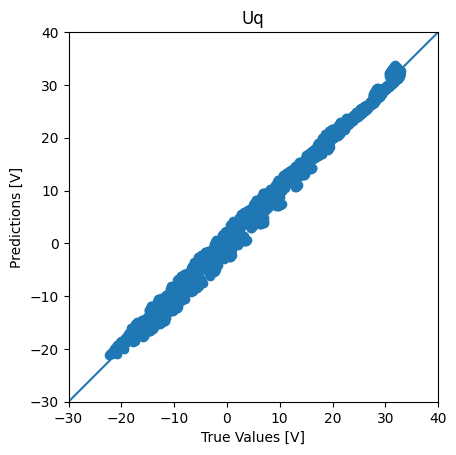

In [ ]:
predictions = y_pred[:,1].flatten()

a = plt.axes(aspect='equal')
plt.scatter(yuq2_test, predictions)
plt.xlabel('True Values [V]')
plt.ylabel('Predictions [V]')
plt.title('Uq')
lims = [-30, 40]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

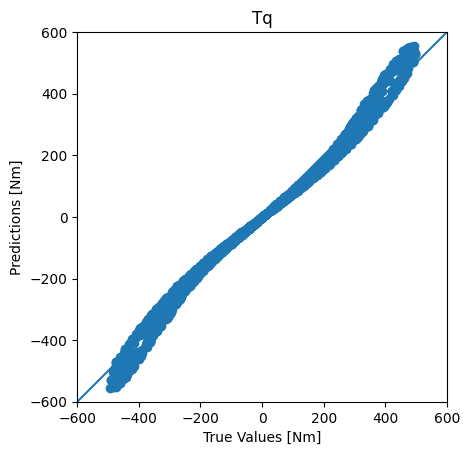

In [ ]:
predictions = y_pred[:,2].flatten()

a = plt.axes(aspect='equal')
plt.scatter(ytq2_test, predictions)
plt.xlabel('True Values [Nm]')
plt.ylabel('Predictions [Nm]')
plt.title('Tq')
lims = [-600, 600]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

#### noabs

Text(0, 0.5, 'errors[Nm]')

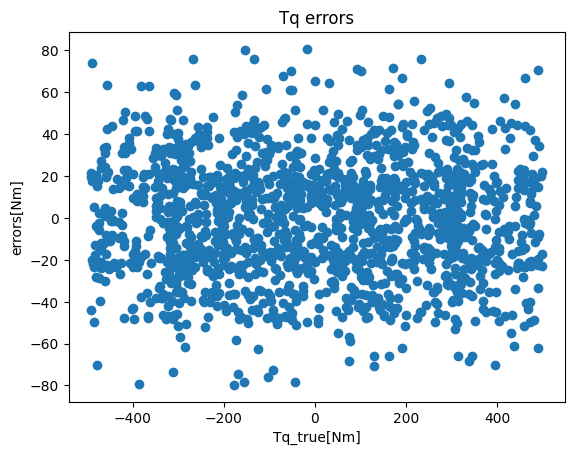

In [ ]:
errors_ud = get_actual_errorList_noabs(y_pred[:,0], yud2_test_list)
errors_uq = get_actual_errorList_noabs(y_pred[:,1], yuq2_test_list)
errors_Tq = get_actual_errorList_noabs(y_pred[:,2], ytq2_test_list)
plt.scatter(Tq_test_list, errors_Tq)
plt.title('Tq errors')
plt.xlabel('Tq_true[Nm]')
plt.ylabel('errors[Nm]')

Text(0, 0.5, 'errors[V]')

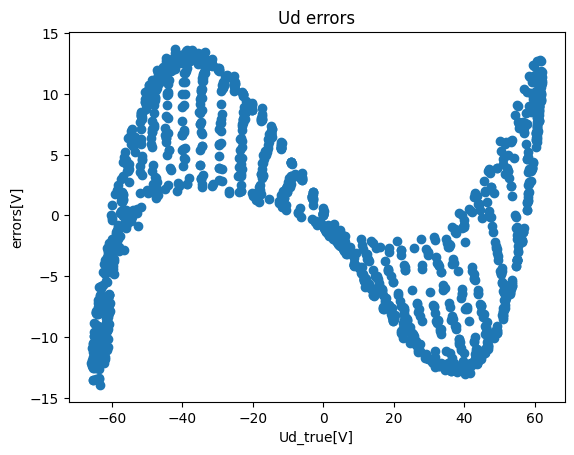

In [ ]:
plt.scatter(yud2_test_list, errors_ud)
plt.title('Ud errors')
plt.xlabel('Ud_true[V]')
plt.ylabel('errors[V]')

Text(0, 0.5, 'errors[V]')

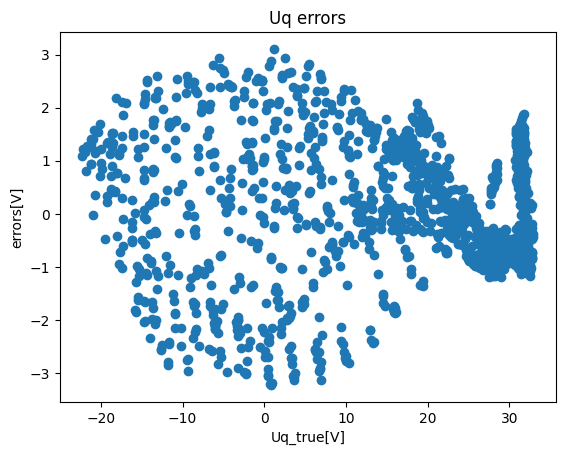

In [ ]:
plt.scatter(yuq2_test_list, errors_uq)
plt.title('Uq errors')
plt.xlabel('Uq_true[V]')
plt.ylabel('errors[V]')

#manual tune result

In [ ]:
test_results_o3 = {}

test_results_o3['model_o3'] = MAPE_Tq, MAPE_ud, MAPE_uq, MSE_ud, MSE_uq, MSE_Tq
test_results_o3['model_o3_2(base)'] = MAPE_Tq_2, MAPE_ud_2, MAPE_uq_2, MSE_ud_2, MSE_uq_2, MSE_Tq_2
test_results_o3['model_o3_3(SGD)'] = MAPE_Tq_3, MAPE_ud_3, MAPE_uq_3, MSE_ud_3, MSE_uq_3, MSE_Tq_3
test_results_o3['model_o3_4(batch64)'] = MAPE_Tq_4, MAPE_ud_4, MAPE_uq_4, MSE_ud_4, MSE_uq_4, MSE_Tq_4
test_results_o3['model_o3_5(batch128)'] = MAPE_Tq_5, MAPE_ud_5, MAPE_uq_5, MSE_ud_5, MSE_uq_5, MSE_Tq_5
test_results_o3['model_o3_6(batch256 epoch1500)'] = MAPE_Tq_6, MAPE_ud_6, MAPE_uq_6, MSE_ud_6, MSE_uq_6, MSE_Tq_6
test_results_o3['model_o3_10(batch256 epoch1500 2)'] = MAPE_Tq_10, MAPE_ud_10, MAPE_uq_10, MSE_ud_10, MSE_uq_10, MSE_Tq_10

test_results_o3['model_o3_7(batch32)'] = MAPE_Tq_7, MAPE_ud_7, MAPE_uq_7, MSE_ud_7, MSE_uq_7, MSE_Tq_7
test_results_o3['model_o3_8(batch512)'] = MAPE_Tq_8, MAPE_ud_8, MAPE_uq_8, MSE_ud_8, MSE_uq_8, MSE_Tq_8
test_results_o3['model_o3_9(batch256 epoch2000)'] = MAPE_Tq_9, MAPE_ud_9, MAPE_uq_9, MSE_ud_9, MSE_uq_9, MSE_Tq_9
test_results_o3['model_o3_10(batch256 epoch1500 2)'] = MAPE_Tq_10, MAPE_ud_10, MAPE_uq_10, MSE_ud_10, MSE_uq_10, MSE_Tq_10
test_results_o3['model_o3_11(neuron200)'] = MAPE_Tq_11, MAPE_ud_11, MAPE_uq_11, MSE_ud_11, MSE_uq_11, MSE_Tq_11
test_results_o3['model_o3_12(hlayer+1)'] = MAPE_Tq_12, MAPE_ud_12, MAPE_uq_12, MSE_ud_12, MSE_uq_12, MSE_Tq_12
test_results_o3['model_o3_13(hlayer+2)'] = MAPE_Tq_13, MAPE_ud_13, MAPE_uq_13, MSE_ud_13, MSE_uq_13, MSE_Tq_13
test_results_o3['model_o3_14(hlayer+2)'] = MAPE_Tq_14, MAPE_ud_14, MAPE_uq_14, MSE_ud_14, MSE_uq_14, MSE_Tq_14
test_results_o3['model_o3_15(hlayer-1, epoch1800)'] = MAPE_Tq_15, MAPE_ud_15, MAPE_uq_15, MSE_ud_15, MSE_uq_15, MSE_Tq_15
test_results_o3['model_o3_16(dropout0.1, lr0.00005,epoch1800)'] = MAPE_Tq_16, MAPE_ud_16, MAPE_uq_16, MSE_ud_16, MSE_uq_16, MSE_Tq_16



pd.DataFrame(test_results_o3, index=['MAPE_Tq', 'MAPE_ud', 'MAPE_uq', 'MSE_Tq', 'MSE_ud', 'MSE_uq']).T

,MAPE_Tq,MAPE_ud,MAPE_uq,MSE_Tq,MSE_ud,MSE_uq
model_o3,0.038173,0.256197,0.317810,13.762004,3.583129,26.564905
model_o3_2(base),0.021363,0.019980,0.059442,0.228550,0.133690,2.884270
model_o3_3(SGD),0.078423,0.073963,0.064329,0.828137,0.183798,14.011385
model_o3_4(batch64),0.010652,0.024472,0.038111,0.196895,0.108585,0.772428
model_o3_5(batch128),0.015456,0.021362,0.032072,0.151358,0.053966,0.759019
model_o3_6(batch256 epoch1500),0.009124,0.018693,0.039748,0.204602,0.049523,0.566650
model_o3_10(batch256 epoch1500 2),0.013289,0.032134,0.044892,0.194174,0.080426,0.643178
model_o3_7(batch32),0.017146,0.017423,0.038266,0.175999,0.076364,1.560184
model_o3_8(batch512),0.013199,0.037218,0.055545,0.381643,0.174817,0.792927
model_o3_9(batch256 epoch2000),0.015128,0.013686,0.026969,0.080503,0.054559,0.293573


## memo

In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 3148019656393517590
 xla_global_id: -1]

In [1]:
!cat /etc/os-release

NAME="Ubuntu"
VERSION="20.04.6 LTS (Focal Fossa)"
ID=ubuntu
ID_LIKE=debian
PRETTY_NAME="Ubuntu 20.04.6 LTS"
VERSION_ID="20.04"
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
VERSION_CODENAME=focal
UBUNTU_CODENAME=focal


In [2]:
!dpkg -l

Desired=Unknown/Install/Remove/Purge/Hold
| Status=Not/Inst/Conf-files/Unpacked/halF-conf/Half-inst/trig-aWait/Trig-pend
|/ Err?=(none)/Reinst-required (Status,Err: uppercase=bad)
||/ Name                                   Version                           Architecture Description
+++-======================================-=================================-============-================================================================================================
ii  adduser                                3.118ubuntu2                      all          add and remove users and groups
ii  adwaita-icon-theme                     3.36.1-2ubuntu0.20.04.2           all          default icon theme of GNOME (small subset)
ii  apt                                    2.0.9                             amd64        commandline package manager
ii  apt-utils                              2.0.9                             amd64        package management related utility programs
ii  autoconf            

In [3]:
import sys
print(sys.version)

3.10.12 (main, Jun  7 2023, 12:45:35) [GCC 9.4.0]


In [4]:
out = !pip list

import pandas as pd
df = pd.DataFrame(out.fields()[2:], columns=out.fields()[0])
df

,Package,Version
0,absl-py,1.4.0
1,alabaster,0.7.13
2,albumentations,1.2.1
3,altair,4.2.2
4,anyio,3.6.2
...,...,...
406,xlrd,2.0.1
407,yellowbrick,1.5
408,yfinance,0.2.18
409,zict,3.0.0


In [5]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
addres

In [6]:
!cat /sys/fs/cgroup/cpuset/cpuset.cpus

cat: /sys/fs/cgroup/cpuset/cpuset.cpus: No such file or directory


In [7]:
out = !cat /proc/meminfo

import pandas as pd
df = pd.DataFrame(out.fields()[:])
df

,0,1,2
0,MemTotal:,13294264,kB
1,MemFree:,8943756,kB
2,MemAvailable:,11757112,kB
3,Buffers:,63660,kB
4,Cached:,2942652,kB
5,SwapCached:,0,kB
6,Active:,847572,kB
7,Inactive:,3269224,kB
8,Active(anon):,1080,kB
9,Inactive(anon):,1111212,kB


In [8]:
!cat /sys/fs/cgroup/memory/memory.limit_in_bytes

cat: /sys/fs/cgroup/memory/memory.limit_in_bytes: No such file or directory


In [10]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
addres